# **Imports**

In [1]:
from fastai.basics import *

from torch.hub import load_state_dict_from_url
from torch.utils.model_zoo import load_url as load_state_dict_from_url

from fastai.vision.all import *
#from fastai.callback.all import *
#from fastai.callback.cutmix import *
#from fastai.distributed import *
from fastprogress import fastprogress
from torchvision.models import *
#from fastai.vision.models.xresnet import *
from fastcore.script import *
fastprogress.MAX_COLS = 80

#from torchvision.transforms import RandomResizedCrop
from fastai.vision.augment import aug_transforms
from fastai.vision.data import imagenet_stats
from fastai.vision.data import ImageBlock

import os
from google.colab import drive

# **GPU**

In [2]:
!nvidia-smi

Wed Nov  2 22:04:48 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  A100-SXM4-40GB      Off  | 00000000:00:04.0 Off |                    0 |
| N/A   31C    P0    46W / 400W |      0MiB / 40536MiB |      0%      Default |
|                               |                      |             Disabled |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [3]:
torch.cuda.is_available()

True

In [4]:
# memory footprint support libraries/code
!ln -sf /opt/bin/nvidia-smi /usr/bin/nvidia-smi
!pip install gputil
!pip install psutil
!pip install humanize

import psutil
import humanize
import os
import GPUtil as GPU
GPUs = GPU.getGPUs()

# XXX: only one GPU on Colab and isn’t guaranteed
gpu = GPUs[0]

def printm():
  process = psutil.Process(os.getpid())
  print("Gen RAM Free: " + humanize.naturalsize( psutil.virtual_memory().available ), " | Proc size: " + humanize.naturalsize( process.memory_info().rss))
  print("GPU RAM Free: {0:.0f}MB | Used: {1:.0f}MB | Util {2:3.0f}% | Total {3:.0f}MB".format(gpu.memoryFree, gpu.memoryUsed, gpu.memoryUtil*100, gpu.memoryTotal))

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [5]:
printm()

Gen RAM Free: 87.2 GB  | Proc size: 398.5 MB
GPU RAM Free: 40533MB | Used: 3MB | Util   0% | Total 40536MB


In [6]:
#os.getcwd()

# **Model Setup**

In [7]:
def random_seed(seed_value, use_cuda):
    '''
    Sets the random seed for numpy, pytorch, python.random and pytorch GPU vars.
    '''
    np.random.seed(seed_value) # Numpy vars
    torch.manual_seed(seed_value) # PyTorch vars
    random.seed(seed_value) # Python
    if use_cuda: # GPU vars
        torch.cuda.manual_seed(seed_value)
        torch.cuda.manual_seed_all(seed_value) 
        torch.backends.cudnn.deterministic = True 
        torch.backends.cudnn.benchmark = False
    print(f'Random state set:{seed_value}, cuda used: {use_cuda}')


In [8]:
@call_parse
def create_path_df(path: Param("Path of images to use", str), pct_images: Param("Fraction of images to use", float)=1, 
                   shuffle: Param("Shuffle prior to splitting", bool)=False,):
  
    '''
    Creates a dataframe with respective classes and path to images.
    Can return a subset of those images based on the pct_images.
    By default will return the earliest files in the path.

    Returns:
    ----------
    DataFrame
    Returns a dataframe with Class and Path columns. 
    '''
    
    from sklearn.utils import shuffle as shuff
    
    data = []
    
    for folder in sorted(os.listdir(path)):
        num_files = len(sorted(os.listdir(path+'/'+folder)))
        cut_point = int(num_files*pct_images)
        # Takes the first pct_images from each folder
        if shuffle == True:
            for file in shuff(os.listdir(path+'/'+folder))[:cut_point]:
                data.append((folder, path+folder+'/'+file))
        else:
            for file in sorted(os.listdir(path+'/'+folder))[:cut_point]:
                data.append((folder, path+folder+'/'+file))
  
    df = pd.DataFrame(data, columns=['Class', 'Path'])
    print(f'Creating path:label dataframe from {path}, using {pct_images*100:.2f}% of the images ({len(df)} images.) Shuffle = {shuffle}.')
    
    return df

In [9]:
@call_parse
def stratified_split(
      dataframe: Param("DataFrame created from create_path_df, containing Class and Path columns."), 
      n_splits: Param("Number of folds in split", int)=5,
      shuffle: Param("Shuffle prior to splitting", bool)=True,
      fold: Param("Which fold to use", int)=0,
      random_state: Param("Fix randomness if shuffle==True", int)=101,
      ):
  
    ''' 
    Prepares a stratified k-fold split from a dataframe with 'Class' and 'Path' by adding an 'is_valid' column.

    Returns:
    ----------
    DataFrame
    Returns the requested stratified k-fold split by adding an 'is_valid' column. 
    '''
  
    from sklearn.model_selection import StratifiedKFold
    # Create stratified split using sklearn
    print(f'Preparing stratified {n_splits} fold split, random state is {random_state}. Returning fold {fold}.')
    kf = StratifiedKFold(n_splits=n_splits, shuffle=shuffle, random_state = random_state)
    X, y = dataframe['Path'], dataframe['Class']
    splits = list(kf.split(X, y))
    # Prepare the selected fold
    fold = fold
    train_df = dataframe.loc[splits[fold][0]]
    val_df = dataframe.loc[splits[fold][1]]
    train_df['is_valid'] = False
    val_df['is_valid'] = True
    df_cnn = train_df.append(val_df)
    # Return the selected fold
    
    return df_cnn

In [10]:
@call_parse
def get_dataloader(
      img_path: Param("Path of images to use", str),
      split_path: Param("Path of images to use to pre-define split", str)=None,
      img_size:  Param("Size in pixels", int)=224,
      pct_images: Param("Fraction of images to use", float)=1,
      bs: Param("Batch size", int)=64,
      deterministic: Param("Deterministic learner", bool)=True,
      randomerasing: Param("Random Erasing", str)=None,
      n_splits: Param("Number of folds in split", int)=5,
      shuffle: Param("Shuffle prior to splitting", bool)=True,
      fold: Param("Which fold to use", int)=0,
      weighted_samples: Param("Determine sample weights", bool)=False, # class weighting
      dfs_path: Param("Path of csv files generated", str)='/content/drive/My Drive/ewaste_data/dataframes'
      ):
    """ 
    Takes in image path and creates a dataloader. 
    If a split_path is defined, uses the entirety of that path to generate a master split, onto which the img_path is joined to defined a pseudo split.  
      
    Returns:
    ----------
    Dataloader
        dls = data.dataloaders(df_cnn_mini, bs=bs)
    """

    # Get file path and labels from the dataframe we set up.
    get_x = lambda x: x['Path']
    get_y = lambda y: y['Class']
    
    # Define splitting function that reads from a dataframe column.
    def stratifiedsplitter(df):      
        train = df.index[~df['is_valid']].tolist()
        valid = df.index[df['is_valid']].tolist()
        return train,valid   
  
    # Prepare transforms
    # Image is larger initially (512 px) for later augmentations.
    #item_tfms=[RandomResizedCrop(512, scale=(0.08,1.0))]
    item_tfms=[RandomResizedCrop(512, min_scale = 0.7)]
    # Batch transformations include a random resized crop to img_size px. 
    batch_tfms=[*aug_transforms(size=img_size), Normalize.from_stats(*imagenet_stats)]
    # Add in randomerasing if necessary.
    if randomerasing != None:
        batch_tfms=[*aug_transforms(size=img_size), Normalize.from_stats(*imagenet_stats), randomerasing]
  
    # Prepare DataBlock
    data = DataBlock(blocks=(ImageBlock, CategoryBlock),
                    splitter=stratifiedsplitter,            # Stratified train/validation split
                    get_x=get_x,                            # Get the image path from dataframe
                    get_y=get_y,                            # Label from dataframe
                    item_tfms=item_tfms,                    # Crop images to a square
                    batch_tfms=batch_tfms)                  # Normalize the images based on the imagenet stats
  

    #print(data, split_path)
    
    if split_path != None:
        print('Split Path defined, preparing pseudo stratified split.')
        
        # Create split_df - a dataframe that defines a master split, based on split_path
        df = create_path_df(split_path, pct_images=1)
        df.to_csv(os.path.join(dfs_path,r'df.csv'), index=False)
                
        split_df = stratified_split(df, n_splits = 5, shuffle = True, random_state = 101, fold = fold)
        split_df['Path'] = split_df['Path'].apply(lambda x:img_path+'/'.join(x.split('/')[-2:]))
        split_df.to_csv(os.path.join(dfs_path,r'split_df.csv'), index=False)
        
        # Inner join this reduced dataframe to the previous splits to maintain the same training images
        df_mini = create_path_df(img_path, pct_images=pct_images)
        df_mini.to_csv(os.path.join(dfs_path,r'df_mini.csv'), index=False)
        
        df_cnn_mini = df_mini.merge(split_df, how='inner', on=['Class','Path'])
        df_cnn_mini.to_csv(os.path.join(dfs_path,r'df_cnn_mini.csv'), index=False)
    else: 
        # Create a dataframe based on main image path with a (possibly) reduced number of images
        df = create_path_df(img_path, pct_images=pct_images)
        df_cnn_mini = stratified_split(df, n_splits = 5, shuffle = True, random_state = 101, fold = fold)
        df_cnn_mini.to_csv(os.path.join(dfs_path,r'df_cnn_mini.csv'), index=False)
  
    if weighted_samples == True:
        
        # Get initial Dataloader
        dls_init = data.dataloaders(df_cnn_mini, bs=bs)
        
        # Calculate sample weights to balance the DataLoader 
        from collections import Counter

        count = Counter(dls_init.items['Class'])
        class_weights = {}
    
        for c in count:
            class_weights[c] = 1/count[c]
            
        print("\nClass Weights: ", class_weights, "\n") 
            
        wgts = dls_init.items['Class'].map(class_weights).values[:len(dls_init.items['Class'])]
        
        # Get weighted Dataloader
        dls = data.dataloaders(df_cnn_mini, bs=bs, dl_type=WeightedDL, wgts=wgts)
    
    else:
        # Get Dataloader
        dls = data.dataloaders(df_cnn_mini, bs=bs)
    

    # Print some information for a sanity check 
    #dls = data.dataloaders(df_cnn_mini, bs=bs)
    print(f'We have {dls.c} classes, with a training set of size {len(dls.train_ds)}, and a validation set of size {len(dls.valid_ds)}')

    if split_path != None:
        print(f"The main split has {split_df['is_valid'].describe()['freq']/len(split_df['is_valid'])*100:.2f}% training data with {len(split_df.groupby('Class').count())} classes, the reduced split has {df_cnn_mini['is_valid'].describe()['freq']/len(df_cnn_mini['is_valid'])*100:.2f} % training data, with {len(df_cnn_mini.groupby('Class').count())} classes.")
    return dls

In [11]:
@call_parse
def create_simple_cnn_learner(
        size:  Param("Size", int)=224,
        bs:    Param("Batch size", int)=64,
        arch:  Param("Architecture", str)='resnet34',
        fp16:  Param("Use mixed precision training", int)=0,
        deterministic: Param("Deterministic learner", bool)=True,
        pretrained: Param("Pretrained architecture", bool)=True,
        pct_images: Param("Percent of images to sue", float)=1,
        img_path: Param("Path of images to use", str)='/content/full_segmented1/',
        split_path: Param("Path of images to use to pre-define split", str)=None,
        model_dir: Param("Path to save model", str)='/content/drive/My Drive/ewaste_data/models/option1',
        log_name: Param("Name of csv training log", str)='history.csv',
        splitter: Param("Custom splitter", str)=None,
        weighted_samples: Param("Determine sample weights", bool)=False # class weighting
        ):
    
    # Select optimization function
    opt_func = partial(Adam, mom=0.9, sqr_mom=0.99, eps=1e-05, wd=0.01, decouple_wd=True)
    
    # Set Random Seed
    if deterministic == True:
        random_seed(101,True)
    
    #print(size, bs, img_path, split_path, pct_images)
    
    if weighted_samples == True:
        dls = get_dataloader(img_size = size, bs = bs, img_path=img_path, split_path=split_path, pct_images=pct_images,
                             weighted_samples=True)
    else:
        dls = get_dataloader(img_size = size, bs = bs, img_path=img_path, split_path=split_path, pct_images=pct_images)
    
                                                                           
    # Setup activation function and pooling
    model = globals()[arch] 
    
    # Setup callbacks
    callbacks = [CSVLogger(fname=log_name, append=True), ShowGraphCallback()]
    
    # Setup Learner
    learn = vision_learner(dls, 
                        model, 
                        splitter=splitter,
                        pretrained=pretrained,
                        opt_func=opt_func,
                        metrics=[accuracy,top_k_accuracy], 
                        model_dir = model_dir,
                        cbs=callbacks,
                        )
    if fp16: learn = learn.to_fp16()

    return learn

In [12]:
@call_parse
def create_cnn_learner(
        size:  Param("Size", int)=224,
        bs:    Param("Batch size", int)=64,
        opt:   Param("Optimizer (adam,rms,sgd,ranger)", str)='adam',
        arch:  Param("Architecture", str)='resnet34',
        fp16:  Param("Use mixed precision training", int)=0,
        deterministic: Param("Deterministic learner", bool)=True,
        pretrained: Param("Pretrained architecture", bool)=True,
        pct_images: Param("Percent of images to sue", float)=1,
        img_path: Param("Path of images to use", str)='/content/full_segmented1/',
        split_path: Param("Path of images to use to pre-define split", str)=None,
        model_dir: Param("Path to save model", str)='/content/drive/My Drive/ewaste_data/models/option1',
        log_name: Param("Name of csv training log", str)='history.csv',
        splitter: Param("Custom splitter", str)=None,
        sa: Param("Self Attention for XResNet", bool)=False,
        act_cls: Param("Activation class to use", str)='ReLU',
        loss_func: Param("Learner loss function", str)=None,
        mixup: Param("Mixup", str)=None,
        cutmix: Param("Cutmix", str)=None,
        randomerasing: Param("Random Erasing", str)=None,
        oversampling: Param("Apply oversampling", bool)=False, # oversampling
        dfs_path: Param("Path of csv files generated", str)='/content/drive/My Drive/ewaste_data/dataframes',
        fold: Param("Which fold to use", int)=0
        ):
    
    # Select optimization function
    if   opt=='adam'  : opt_func = partial(Adam, mom=0.9, sqr_mom=0.99, eps=1e-05, wd=0.01, decouple_wd=True)
    elif opt=='rms'   : opt_func = partial(RMSprop, sqr_mom=0.99, mom=0.0, wd=0.0, decouple_wd=True)
    elif opt=='sgd'   : opt_func = partial(SGD, mom=0.0, wd=0.0, decouple_wd=True)
    elif opt=='ranger': opt_func = partial(ranger, mom=0.95, wd=0.01, eps=1e-06, sqr_mom=0.99, beta=0.0, decouple_wd=True)
    
    # Get DataLoader
    if deterministic == True:
        random_seed(101,True)
        
    # Implement RandomErasing
    if randomerasing != None:
        dls = get_dataloader(img_size = size, bs = bs, img_path=img_path, split_path=split_path, pct_images=pct_images, randomerasing=randomerasing,
                             dfs_path=dfs_path, fold=fold)
    else: 
        dls = get_dataloader(img_size = size, bs = bs, img_path=img_path, split_path=split_path, pct_images=pct_images,
                             dfs_path=dfs_path, fold=fold)
    
    # Setup activation function and pooling
    model = globals()[arch] 
    
    if ('xresnet' in arch) and act_cls != 'ReLU' and ('fix' not in arch):
        model = partial(model, act_cls=act_cls, sa=sa, n_out=dls.c)
    elif 'xresnet' in arch and ('fix' not in arch):
        model = partial(model, sa=sa, n_out=dls.c)
    elif ('tf_efficientnet' in arch) and act_cls == 'Mish':
      
        # Change all SwishJit() to Mish() and return an nn.Sequential()
        def effmish(model=model, pretrained=pretrained):
            model = model(pretrained=pretrained)
            model.act1 = Mish()
            model.act2 = Mish()
            for i in range(len(model.blocks)):
                for j in range(len(model.blocks[i])):
                    if str(model.blocks[i][j].act1) == 'SwishJit()':
                        model.blocks[i][j].act1 = Mish()
                    if str(model.blocks[i][j].act2) == 'SwishJit()':
                        model.blocks[i][j].act2 = Mish()
                    if str(model.blocks[i][j].se.act1) == 'SwishJit()':
                        model.blocks[i][j].se.act1 = Mish()
            return nn.Sequential(*model.children())
      
        model = effmish
    
    # Setup callbacks
    callbacks = [CSVLogger(fname=log_name, append=True), ShowGraphCallback()]
    
    if mixup != None:
        mixup = mixup
        callbacks = [CSVLogger(fname=log_name, append=True), ShowGraphCallback(), mixup]
    elif cutmix != None:
        cutmix = cutmix
        callbacks = [CSVLogger(fname=log_name, append=True), ShowGraphCallback(), cutmix]
    
    # Setup Learner
    learn = vision_learner(dls, 
                        model, 
                        splitter=splitter,
                        pretrained=pretrained,
                        opt_func=opt_func,
                        metrics=[accuracy,top_k_accuracy,error_rate,
                                    Precision(average='micro'),Recall(average='micro'),
                                    F1Score(average='micro')],
                                    #RocAuc(average='macro')], 
                        model_dir = model_dir,
                        loss_func = loss_func,
                        cbs=callbacks,
                        )
    if fp16: learn = learn.to_fp16()
    
    if oversampling:
    
        # Let's modify it to return a more equal number of idxs corresponding to each of the classes. 
        # Let's calculate the weights we will use for sampling.

        df_weights = pd.DataFrame(1 / learn.dls.items.Class.value_counts())
        weights = learn.dls.items.Class.apply(lambda x: df_weights.to_dict()['Class'][x])
    
        #learn.dls.train.items.sample(n=3200, weights=weights, replace=True).Class.value_counts()
        
        total_size = len(learn.dls.train_ds) + len(learn.dls.valid_ds)
        
        def sample_epoch(self):
            df = pd.DataFrame(1 / self.items.Class.value_counts())
            weights = self.items.Class.apply(lambda x: df.to_dict()['Class'][x])
            self.n = total_size * 2
            oversampled_idxs = self.items.sample(n=self.n, weights=weights, replace=True).index
            return [np.where(self.items.index == i)[0][0] for i in oversampled_idxs]
    
        # The get_idxs method of DataLoaders samples the idxs to be used in an epoch of training:
        learn.dls.train.get_idxs = types.MethodType(sample_epoch, learn.dls.train)
    
    return learn

In [13]:
def enumerate_params(learner):
    '''
    Enumerates the unfrozen and frozen parameters for a given learner when called.
    '''
    total_params = sum(p.numel() for p in learner.model.parameters())
    print(f'{total_params:,} total parameters.')
    total_trainable_params = sum(
    p.numel() for p in learner.model.parameters() if p.requires_grad)
    print(f'{total_trainable_params:,} training parameters.')

# Option 2 - Training/Validation

In [14]:
drive.mount('/content/gdrive', force_remount=True)

Mounted at /content/gdrive


In [14]:
# If your zip file is on your google drive - download it into the current kernel
!cp '/content/gdrive/My Drive/ewaste_data/full_segmented2.zip' 'full_segmented2.zip'

# This code snippet unzips a zip file to a specified destination
!unzip -q '/content/gdrive/My Drive/ewaste_data/full_segmented2.zip' -d "/content/gdrive/My Drive/ewaste_data";

replace /content/gdrive/My Drive/ewaste_data/full_segmented2/Aluminium_Iron/Aluminium_Iron1_segmented.JPG? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [14]:
!ls "/content/gdrive/My Drive/ewaste_data/full_segmented2"

 Aluminium_Iron    Connector	   'Printed Circuit Board'
 Battery	   Copper	   'Printer Ribbon_Toner'
 Cable_Wire	  'Magnetic Tape'   Tube_Screen
 Cardboard_Paper   Plastic


In [16]:
count = 0

for folder in (os.listdir("/content/gdrive/My Drive/ewaste_data/full_segmented2")):
  
  #print(folder)
  #path = (os.path.join("/content/full_segmented"),folder)
  path = "/content/gdrive/My Drive/ewaste_data/full_segmented2/" + folder
  
  #print(folder)
  #print(len(path))
  count += len(os.listdir(path))

count

1670

## **Resnet34 (using full_segmented2)**

### Fold 0

In [16]:
fold_nbr = 0
fold_name = 'fold0'
model_name = 'resnet34'

learn = create_cnn_learner(pct_images=1, 
                           deterministic=True, 
                           size=224, 
                           img_path = '/content/gdrive/My Drive/ewaste_data/full_segmented2/',
                           split_path = '/content/gdrive/My Drive/ewaste_data/full_segmented2/',
                           model_dir = '/content/gdrive/My Drive/ewaste_data/models/option2/' + model_name + '/' + fold_name,
                           log_name = '/content/gdrive/My Drive/ewaste_data/dataframes/option2/' + model_name + '/' + fold_name + '/' + 'log_' + model_name + '_' + fold_name + '.csv',
                           oversampling=True,
                           dfs_path='/content/gdrive/My Drive/ewaste_data/dataframes/option2/' + model_name + '/' + fold_name,
                           fold=fold_nbr)

Random state set:101, cuda used: True
Split Path defined, preparing pseudo stratified split.
Creating path:label dataframe from /content/gdrive/My Drive/ewaste_data/full_segmented2/, using 100.00% of the images (1670 images.) Shuffle = False.
Preparing stratified 5 fold split, random state is 101. Returning fold 0.
Creating path:label dataframe from /content/gdrive/My Drive/ewaste_data/full_segmented2/, using 100.00% of the images (1670 images.) Shuffle = False.
We have 11 classes, with a training set of size 1336, and a validation set of size 334
The main split has 80.00% training data with 11 classes, the reduced split has 80.00 % training data, with 11 classes.


/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [17]:
learn.arch

<function torchvision.models.resnet.resnet34(*, weights: Union[torchvision.models.resnet.ResNet34_Weights, NoneType] = None, progress: bool = True, **kwargs: Any) -> torchvision.models.resnet.ResNet>

In [18]:
len(learn.dls.get_idxs())

3340

In [19]:
idxs = learn.dls.train.get_idxs()
learn.dls.train.items.iloc[idxs].Class.value_counts()

Cable_Wire               327
Aluminium_Iron           321
Plastic                  319
Printer Ribbon_Toner     311
Connector                307
Tube_Screen              302
Printed Circuit Board    297
Magnetic Tape            297
Copper                   294
Cardboard_Paper          284
Battery                  281
Name: Class, dtype: int64

Freezing model body
21,817,664 total parameters.
550,016 training parameters.


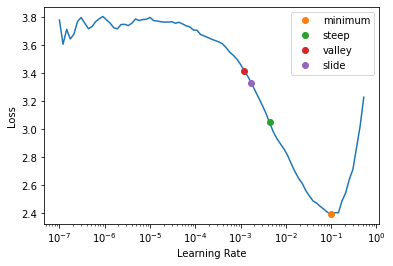

In [20]:
print(f'Freezing model body')
learn.freeze()
enumerate_params(learn)
_,_,valley_freeze,_ = learn.lr_find(suggest_funcs=(minimum, steep, valley, slide))

In [21]:
valley_freeze

0.0012022644514217973

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,error_rate,precision_score,recall_score,f1_score,time
0,2.661833,1.578299,0.502994,0.859281,0.497006,0.502994,0.502994,0.502994,00:37
1,1.470134,1.009311,0.721557,0.937126,0.278443,0.721557,0.721557,0.721557,00:10
2,0.846332,0.961952,0.727545,0.952096,0.272455,0.727545,0.727545,0.727545,00:10
3,0.558717,0.884854,0.748503,0.964072,0.251497,0.748503,0.748503,0.748503,00:10
4,0.407509,0.833889,0.766467,0.967066,0.233533,0.766467,0.766467,0.766467,00:10
5,0.314548,0.758759,0.775449,0.970060,0.224551,0.775449,0.775449,0.775449,00:10
6,0.254159,0.768100,0.748503,0.985030,0.251497,0.748503,0.748503,0.748503,00:10
7,0.216923,0.732816,0.775449,0.988024,0.224551,0.775449,0.775449,0.775449,00:10
8,0.194052,0.739366,0.766467,0.988024,0.233533,0.766467,0.766467,0.766467,00:10
9,0.180125,0.723809,0.778443,0.985030,0.221557,0.778443,0.778443,0.778443,00:10


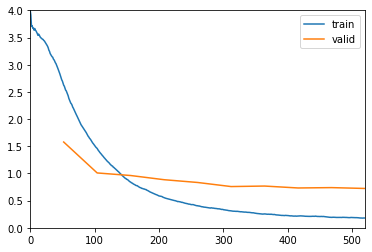

Path('/content/gdrive/My Drive/ewaste_data/models/option2/resnet34/fold0/stage-1-full_segmented1_oversampled_resnet34_fold0.pth')

In [22]:
learn.fit_one_cycle(10, lr_max=valley_freeze)
learn.save('stage-1-full_segmented1_oversampled_' + model_name + '_' + fold_name)

Unfreezing model body
21,817,664 total parameters.
21,817,664 training parameters.


SuggestedLRs(minimum=8.31763736641733e-07, steep=7.585775847473997e-07, valley=7.585775892948732e-05, slide=5.248074739938602e-05)

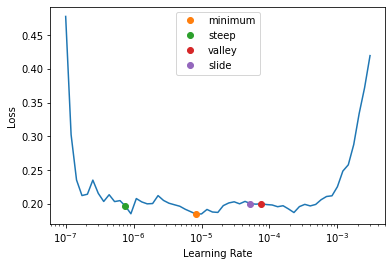

In [23]:
print(f'Unfreezing model body')
learn.unfreeze()
enumerate_params(learn)
learn.lr_find(suggest_funcs=(minimum, steep, valley, slide))

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,error_rate,precision_score,recall_score,f1_score,time
0,0.176300,0.712651,0.769461,0.988024,0.230539,0.769461,0.769461,0.769461,00:10
1,0.159218,0.657184,0.799401,0.985030,0.200599,0.799401,0.799401,0.799401,00:10
2,0.130428,0.690811,0.799401,0.988024,0.200599,0.799401,0.799401,0.799401,00:10
3,0.112592,0.698768,0.790419,0.988024,0.209581,0.790419,0.790419,0.790419,00:10
4,0.092401,0.660769,0.814371,0.988024,0.185629,0.814371,0.814371,0.814371,00:10
5,0.075952,0.672413,0.814371,0.988024,0.185629,0.814371,0.814371,0.814371,00:10
6,0.058474,0.659260,0.811377,0.991018,0.188623,0.811377,0.811377,0.811377,00:10
7,0.045343,0.663110,0.796407,0.991018,0.203593,0.796407,0.796407,0.796407,00:10
8,0.040125,0.680063,0.790419,0.991018,0.209581,0.790419,0.790419,0.790419,00:10
9,0.040840,0.661082,0.811377,0.991018,0.188623,0.811377,0.811377,0.811377,00:10


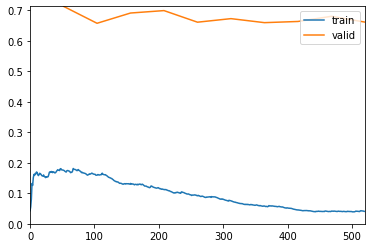

Path('/content/gdrive/My Drive/ewaste_data/models/option2/resnet34/fold0/stage-2-full_segmented2_oversampled_resnet34_fold0.pth')

In [24]:
learn.fit_one_cycle(10, lr_max=slice(1e-5, 1e-4))
learn.save('stage-2-full_segmented2_oversampled_' + model_name + '_' + fold_name)

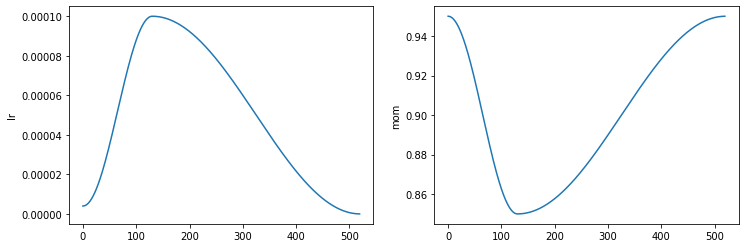

In [25]:
# In practice, we use the fit_one_cycle function, with the learning rates used representing the maximum learning rate 
# in a one cycle policy with cosine annealing, as can be seen below. 
# Note that the x-axis below represents the number of batches passed through the learner.

learn.recorder.plot_sched()

In [26]:
L(learn.recorder.values)

(#10) [[0.1763000786304474, 0.712651252746582, 0.7694610953330994, 0.9880239367485046, 0.23053891956806183, 0.7694610778443114, 0.7694610778443114, 0.7694610778443114],[0.15921786427497864, 0.6571843028068542, 0.7994012236595154, 0.985029935836792, 0.200598806142807, 0.7994011976047904, 0.7994011976047904, 0.7994011976047903],[0.130428284406662, 0.690811038017273, 0.7994012236595154, 0.9880239367485046, 0.200598806142807, 0.7994011976047904, 0.7994011976047904, 0.7994011976047903],[0.11259172856807709, 0.6987677812576294, 0.7904191613197327, 0.9880239367485046, 0.20958083868026733, 0.7904191616766467, 0.7904191616766467, 0.7904191616766467],[0.09240072220563889, 0.6607694625854492, 0.8143712282180786, 0.9880239367485046, 0.185628741979599, 0.8143712574850299, 0.8143712574850299, 0.8143712574850299],[0.07595178484916687, 0.6724128723144531, 0.8143712282180786, 0.9880239367485046, 0.185628741979599, 0.8143712574850299, 0.8143712574850299, 0.8143712574850299],[0.058473628014326096, 0.6592

In [27]:
learn.validate()

(#7) [0.6610817909240723,0.811377227306366,0.9910179376602173,0.18862275779247284,0.811377245508982,0.811377245508982,0.811377245508982]

In [28]:
learn.recorder.values[-1][2]

0.9910179376602173

In [29]:
learn.dls.vocab

['Aluminium_Iron', 'Battery', 'Cable_Wire', 'Cardboard_Paper', 'Connector', 'Copper', 'Magnetic Tape', 'Plastic', 'Printed Circuit Board', 'Printer Ribbon_Toner', 'Tube_Screen']

In [30]:
learn.load('/content/gdrive/My Drive/ewaste_data/models/option2/'+ model_name + '/' + fold_name + '/stage-2-full_segmented2_oversampled_' + model_name + '_' + fold_name)

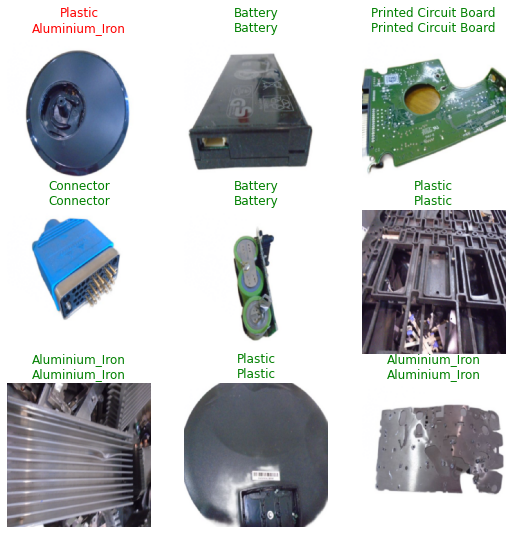

In [31]:
learn.show_results()

In [32]:
learn.dls.loss_func

FlattenedLoss of CrossEntropyLoss()

In [33]:
interp = ClassificationInterpretation.from_learner(learn)

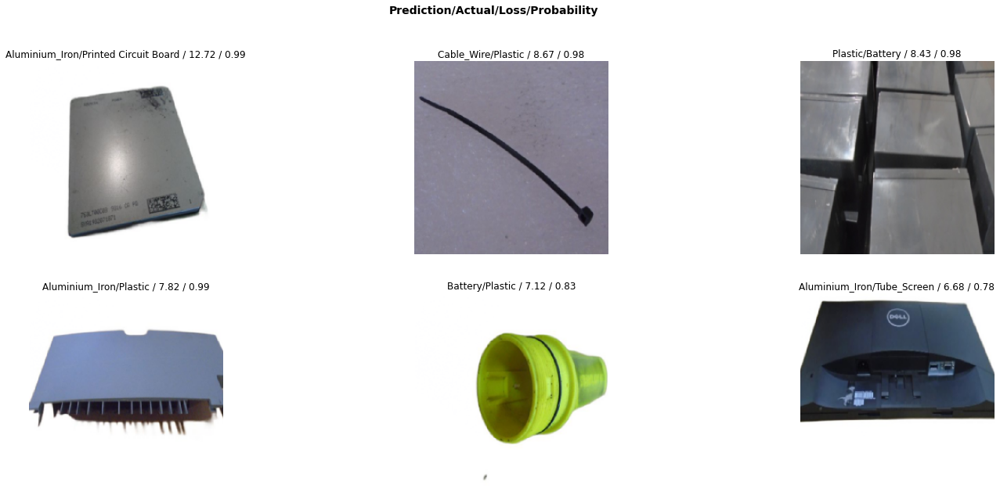

In [34]:
interp.plot_top_losses(6, figsize=(25,10))

In [35]:
interp.print_classification_report()

                       precision    recall  f1-score   support

       Aluminium_Iron       0.80      0.89      0.84        93
              Battery       0.71      0.81      0.76        42
           Cable_Wire       0.82      0.75      0.78        24
      Cardboard_Paper       0.75      0.92      0.83        13
            Connector       1.00      0.75      0.86        12
               Copper       0.86      0.86      0.86        14
        Magnetic Tape       1.00      1.00      1.00         4
              Plastic       0.80      0.64      0.71        55
Printed Circuit Board       0.96      0.92      0.94        48
 Printer Ribbon_Toner       0.86      0.60      0.71        10
          Tube_Screen       0.70      0.74      0.72        19

             accuracy                           0.81       334
            macro avg       0.84      0.81      0.82       334
         weighted avg       0.82      0.81      0.81       334



In [36]:
interp.most_confused()

[('Plastic', 'Aluminium_Iron', 11),
 ('Aluminium_Iron', 'Plastic', 5),
 ('Plastic', 'Battery', 5),
 ('Aluminium_Iron', 'Battery', 3),
 ('Battery', 'Aluminium_Iron', 3),
 ('Battery', 'Tube_Screen', 3),
 ('Printer Ribbon_Toner', 'Battery', 3),
 ('Aluminium_Iron', 'Cardboard_Paper', 2),
 ('Cable_Wire', 'Aluminium_Iron', 2),
 ('Cable_Wire', 'Plastic', 2),
 ('Printed Circuit Board', 'Tube_Screen', 2),
 ('Tube_Screen', 'Aluminium_Iron', 2),
 ('Tube_Screen', 'Battery', 2),
 ('Battery', 'Plastic', 1),
 ('Battery', 'Printed Circuit Board', 1),
 ('Cable_Wire', 'Battery', 1),
 ('Cable_Wire', 'Tube_Screen', 1),
 ('Cardboard_Paper', 'Cable_Wire', 1),
 ('Connector', 'Aluminium_Iron', 1),
 ('Connector', 'Cable_Wire', 1),
 ('Connector', 'Plastic', 1),
 ('Copper', 'Cable_Wire', 1),
 ('Copper', 'Cardboard_Paper', 1),
 ('Plastic', 'Cable_Wire', 1),
 ('Plastic', 'Cardboard_Paper', 1),
 ('Plastic', 'Copper', 1),
 ('Plastic', 'Printer Ribbon_Toner', 1),
 ('Printed Circuit Board', 'Aluminium_Iron', 1),
 ('Pr

Interpretation.plot_top_losses(k: 'int | list', largest: 'bool' = True, **kwargs)
Show `k` largest(/smallest) preds and losses. Implementation based on type dispatch

To get a prettier result with hyperlinks to source code and documentation, install nbdev: pip install nbdev


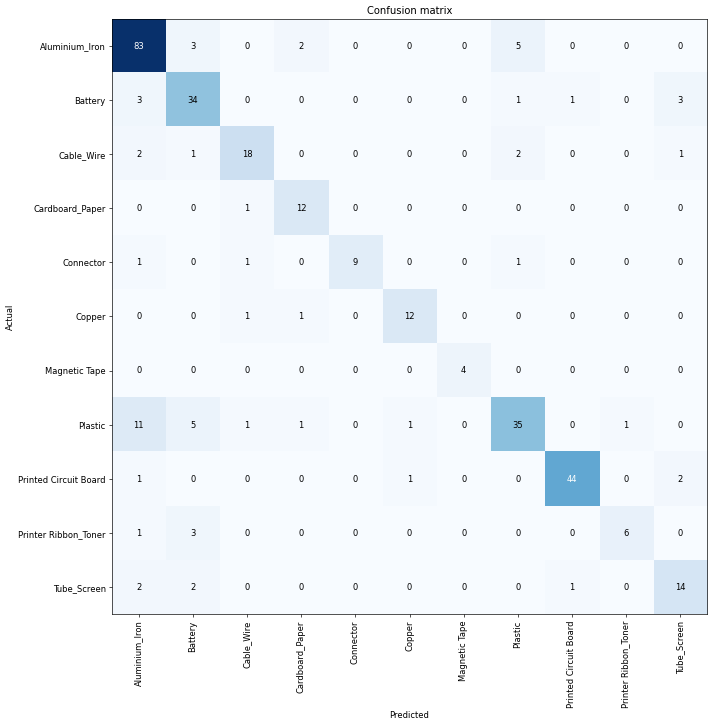

In [37]:
doc(interp.plot_top_losses)
interp.plot_confusion_matrix(figsize=(12,12), dpi=60)

In [39]:
preds = learn.get_preds()

In [40]:
print(preds[0].shape)
preds[0]

torch.Size([334, 11])


TensorBase([[9.9210e-01, 2.2485e-04, 2.1225e-06,  ..., 4.7179e-05,
             3.4211e-05, 1.8995e-03],
            [9.7840e-01, 7.4708e-06, 5.7700e-06,  ..., 1.2514e-05,
             8.9838e-07, 5.4700e-06],
            [9.4588e-01, 7.4656e-03, 1.0079e-04,  ..., 2.0946e-03,
             5.8793e-05, 3.5749e-02],
            ...,
            [5.6546e-04, 6.9578e-05, 1.1143e-06,  ..., 8.7969e-06,
             9.9926e-07, 9.9859e-01],
            [2.6202e-02, 1.0792e-03, 1.4043e-06,  ..., 9.5497e-06,
             1.0256e-05, 9.6549e-01],
            [5.5518e-07, 1.9054e-02, 4.4320e-04,  ..., 2.8710e-05,
             1.2510e-06, 9.7902e-01]])

In [41]:
labels = list(learn.dls.train_ds.items.Class.unique())
labels

['Aluminium_Iron',
 'Battery',
 'Cable_Wire',
 'Cardboard_Paper',
 'Connector',
 'Copper',
 'Magnetic Tape',
 'Plastic',
 'Printed Circuit Board',
 'Printer Ribbon_Toner',
 'Tube_Screen']

In [42]:
## saves the index of most likely (max) predicted class for each image
max_idxs = np.asarray(np.argmax(preds[0],axis=1))
max_idxs

yhat = []
for max_idx in max_idxs:
    yhat.append(labels[max_idx])

## convert POSIX paths to string first
y = []
for label_path in learn.dls.valid_ds.items.Class:
    y.append(str(label_path))

learn.dls.valid_ds.items.Class.unique()

## predicted values
print(yhat[0:5])

## actual values
print(y[0:5])

['Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron']
['Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron']


In [43]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y,yhat)
print(cm)

[[83  3  0  2  0  0  0  5  0  0  0]
 [ 3 34  0  0  0  0  0  1  1  0  3]
 [ 2  1 18  0  0  0  0  2  0  0  1]
 [ 0  0  1 12  0  0  0  0  0  0  0]
 [ 1  0  1  0  9  0  0  1  0  0  0]
 [ 0  0  1  1  0 12  0  0  0  0  0]
 [ 0  0  0  0  0  0  4  0  0  0  0]
 [11  5  1  1  0  1  0 35  0  1  0]
 [ 1  0  0  0  0  1  0  0 44  0  2]
 [ 1  3  0  0  0  0  0  0  0  6  0]
 [ 2  2  0  0  0  0  0  0  1  0 14]]


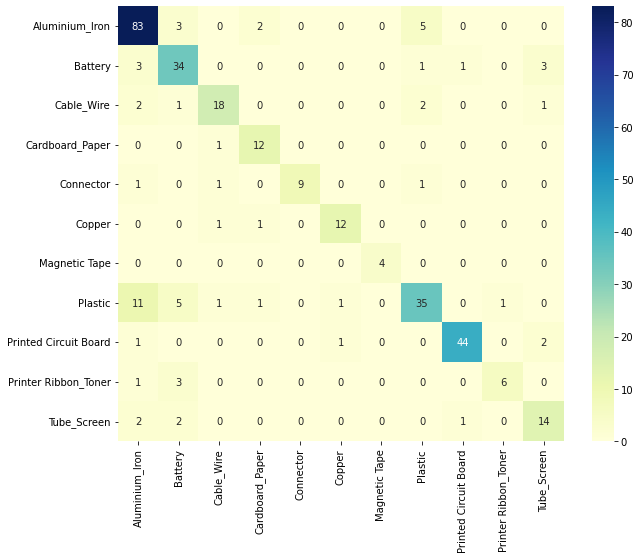

In [44]:
df_cm = pd.DataFrame(cm,learn.dls.valid_ds.items.Class.unique(),learn.dls.valid_ds.items.Class.unique())

plt.figure(figsize=(10,8))

import seaborn as sns

sns.heatmap(df_cm,annot=True,fmt="d",cmap="YlGnBu")

In [45]:
correct = 0

for r in range(len(cm)):
    for c in range(len(cm)):
        if (r==c):
            correct += cm[r,c]

accuracy = correct/sum(sum(cm))
accuracy

0.811377245508982

### Fold 1

In [14]:
fold_nbr = 1
fold_name = 'fold1'
model_name = 'resnet34'

learn = create_cnn_learner(pct_images=1, 
                           deterministic=True, 
                           size=224, 
                           img_path = '/content/gdrive/My Drive/ewaste_data/full_segmented2/',
                           split_path = '/content/gdrive/My Drive/ewaste_data/full_segmented2/',
                           model_dir = '/content/gdrive/My Drive/ewaste_data/models/option2/' + model_name + '/' + fold_name,
                           log_name = '/content/gdrive/My Drive/ewaste_data/dataframes/option2/' + model_name + '/' + fold_name + '/' + 'log_' + model_name + '_' + fold_name + '.csv',
                           oversampling=True,
                           dfs_path='/content/gdrive/My Drive/ewaste_data/dataframes/option2/' + model_name + '/' + fold_name,
                           fold=fold_nbr)

Random state set:101, cuda used: True
Split Path defined, preparing pseudo stratified split.
Creating path:label dataframe from /content/gdrive/My Drive/ewaste_data/full_segmented2/, using 100.00% of the images (1670 images.) Shuffle = False.
Preparing stratified 5 fold split, random state is 101. Returning fold 1.
Creating path:label dataframe from /content/gdrive/My Drive/ewaste_data/full_segmented2/, using 100.00% of the images (1670 images.) Shuffle = False.
We have 11 classes, with a training set of size 1336, and a validation set of size 334
The main split has 80.00% training data with 11 classes, the reduced split has 80.00 % training data, with 11 classes.


/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [15]:
learn.arch

<function torchvision.models.resnet.resnet34(*, weights: Union[torchvision.models.resnet.ResNet34_Weights, NoneType] = None, progress: bool = True, **kwargs: Any) -> torchvision.models.resnet.ResNet>

In [16]:
len(learn.dls.get_idxs())

3340

In [17]:
idxs = learn.dls.train.get_idxs()
learn.dls.train.items.iloc[idxs].Class.value_counts()

Cable_Wire               327
Aluminium_Iron           321
Plastic                  319
Printer Ribbon_Toner     311
Connector                307
Tube_Screen              302
Printed Circuit Board    297
Magnetic Tape            297
Copper                   294
Cardboard_Paper          284
Battery                  281
Name: Class, dtype: int64

Freezing model body
21,817,664 total parameters.
550,016 training parameters.


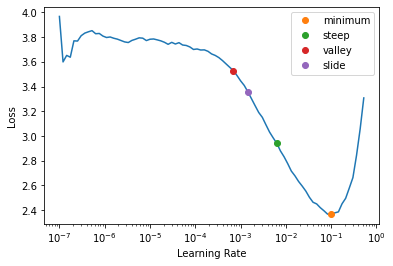

In [18]:
print(f'Freezing model body')
learn.freeze()
enumerate_params(learn)
_,_,valley_freeze,_ = learn.lr_find(suggest_funcs=(minimum, steep, valley, slide))

In [19]:
valley_freeze

0.0006918309954926372

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,error_rate,precision_score,recall_score,f1_score,time
0,3.033317,2.114838,0.353293,0.709581,0.646707,0.353293,0.353293,0.353293,00:10
1,1.800917,1.415169,0.565868,0.892216,0.434132,0.565868,0.565868,0.565868,00:10
2,1.092422,1.209697,0.637725,0.940120,0.362275,0.637725,0.637725,0.637725,00:10
3,0.725488,1.138250,0.682635,0.943114,0.317365,0.682635,0.682635,0.682635,00:11
4,0.521805,1.101962,0.682635,0.961078,0.317365,0.682635,0.682635,0.682635,00:10
5,0.425945,1.025667,0.676647,0.964072,0.323353,0.676647,0.676647,0.676647,00:10
6,0.357393,0.989887,0.685629,0.967066,0.314371,0.685629,0.685629,0.685629,00:10
7,0.309039,0.999174,0.685629,0.967066,0.314371,0.685629,0.685629,0.685629,00:10
8,0.261224,0.996380,0.694611,0.967066,0.305389,0.694611,0.694611,0.694611,00:10
9,0.252545,0.983632,0.691617,0.967066,0.308383,0.691617,0.691617,0.691617,00:10


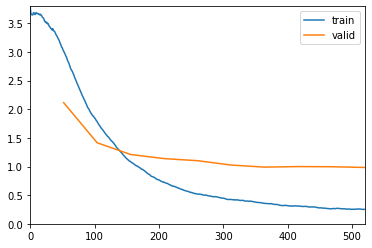

Path('/content/gdrive/My Drive/ewaste_data/models/option2/resnet34/fold1/stage-1-full_segmented2_oversampled_resnet34_fold1.pth')

In [20]:
learn.fit_one_cycle(10, lr_max=valley_freeze)
learn.save('stage-1-full_segmented2_oversampled_' + model_name + '_' + fold_name)

Unfreezing model body
21,817,664 total parameters.
21,817,664 training parameters.


SuggestedLRs(minimum=5.754399462603033e-05, steep=6.309573450380412e-07, valley=0.00013182566908653826, slide=7.585775892948732e-05)

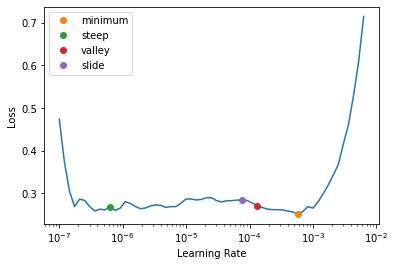

In [21]:
print(f'Unfreezing model body')
learn.unfreeze()
enumerate_params(learn)
learn.lr_find(suggest_funcs=(minimum, steep, valley, slide))

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,error_rate,precision_score,recall_score,f1_score,time
0,0.219807,1.025232,0.679641,0.967066,0.320359,0.679641,0.679641,0.679641,00:11
1,0.216748,1.193585,0.688623,0.967066,0.311377,0.688623,0.688623,0.688623,00:11
2,0.197755,1.447109,0.721557,0.973054,0.278443,0.721557,0.721557,0.721557,00:11
3,0.166684,1.080666,0.742515,0.979042,0.257485,0.742515,0.742515,0.742515,00:11
4,0.113079,1.298856,0.703593,0.982036,0.296407,0.703593,0.703593,0.703593,00:10
5,0.082417,1.174119,0.742515,0.979042,0.257485,0.742515,0.742515,0.742515,00:10
6,0.057737,1.111254,0.766467,0.970060,0.233533,0.766467,0.766467,0.766467,00:10
7,0.038353,1.098822,0.754491,0.976048,0.245509,0.754491,0.754491,0.754491,00:10
8,0.023599,1.056372,0.763473,0.976048,0.236527,0.763473,0.763473,0.763473,00:10
9,0.023754,1.022555,0.766467,0.979042,0.233533,0.766467,0.766467,0.766467,00:10


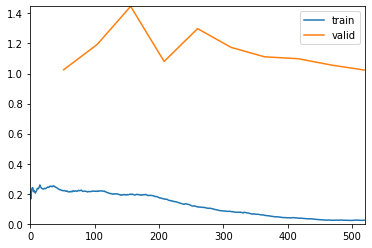

Path('/content/gdrive/My Drive/ewaste_data/models/option2/resnet34/fold1/stage-2-full_segmented2_oversampled_resnet34_fold1.pth')

In [22]:
learn.fit_one_cycle(10, lr_max=slice(5e-5, 5e-4))
learn.save('stage-2-full_segmented2_oversampled_' + model_name + '_' + fold_name)

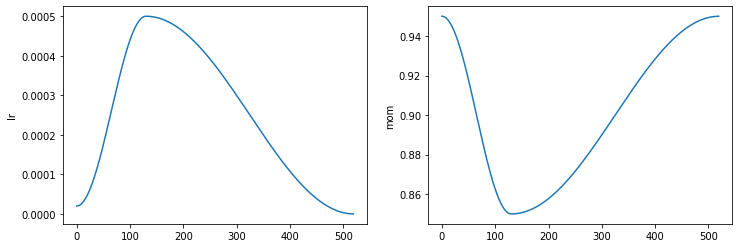

In [23]:
# In practice, we use the fit_one_cycle function, with the learning rates used representing the maximum learning rate 
# in a one cycle policy with cosine annealing, as can be seen below. 
# Note that the x-axis below represents the number of batches passed through the learner.

learn.recorder.plot_sched()

In [24]:
L(learn.recorder.values)

(#10) [[0.21980711817741394, 1.0252323150634766, 0.6796407103538513, 0.9670658707618713, 0.3203592896461487, 0.6796407185628742, 0.6796407185628742, 0.6796407185628742],[0.21674811840057373, 1.193584680557251, 0.688622772693634, 0.9670658707618713, 0.31137725710868835, 0.688622754491018, 0.688622754491018, 0.688622754491018],[0.1977551281452179, 1.4471087455749512, 0.7215569019317627, 0.9730538725852966, 0.2784431278705597, 0.7215568862275449, 0.7215568862275449, 0.7215568862275449],[0.16668365895748138, 1.080666422843933, 0.742514967918396, 0.9790419340133667, 0.257485032081604, 0.7425149700598802, 0.7425149700598802, 0.7425149700598802],[0.11307927221059799, 1.298856496810913, 0.703592836856842, 0.9820359349250793, 0.29640719294548035, 0.7035928143712575, 0.7035928143712575, 0.7035928143712575],[0.08241716027259827, 1.1741193532943726, 0.742514967918396, 0.9790419340133667, 0.257485032081604, 0.7425149700598802, 0.7425149700598802, 0.7425149700598802],[0.05773744359612465, 1.11125397

In [25]:
learn.validate()

(#7) [1.0225547552108765,0.7664670944213867,0.9790419340133667,0.23353293538093567,0.7664670658682635,0.7664670658682635,0.7664670658682635]

In [26]:
learn.recorder.values[-1][2]

0.9790419340133667

In [27]:
learn.dls.vocab

['Aluminium_Iron', 'Battery', 'Cable_Wire', 'Cardboard_Paper', 'Connector', 'Copper', 'Magnetic Tape', 'Plastic', 'Printed Circuit Board', 'Printer Ribbon_Toner', 'Tube_Screen']

In [28]:
learn.load('/content/gdrive/My Drive/ewaste_data/models/option2/'+ model_name + '/' + fold_name + '/stage-2-full_segmented2_oversampled_' + model_name + '_' + fold_name)

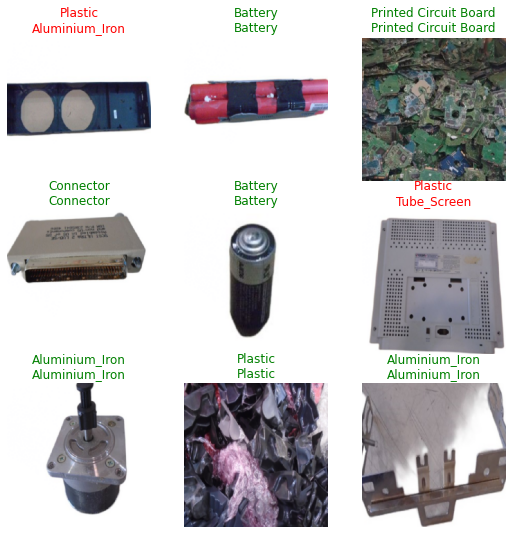

In [29]:
learn.show_results()

In [30]:
learn.dls.loss_func

FlattenedLoss of CrossEntropyLoss()

In [31]:
interp = ClassificationInterpretation.from_learner(learn)

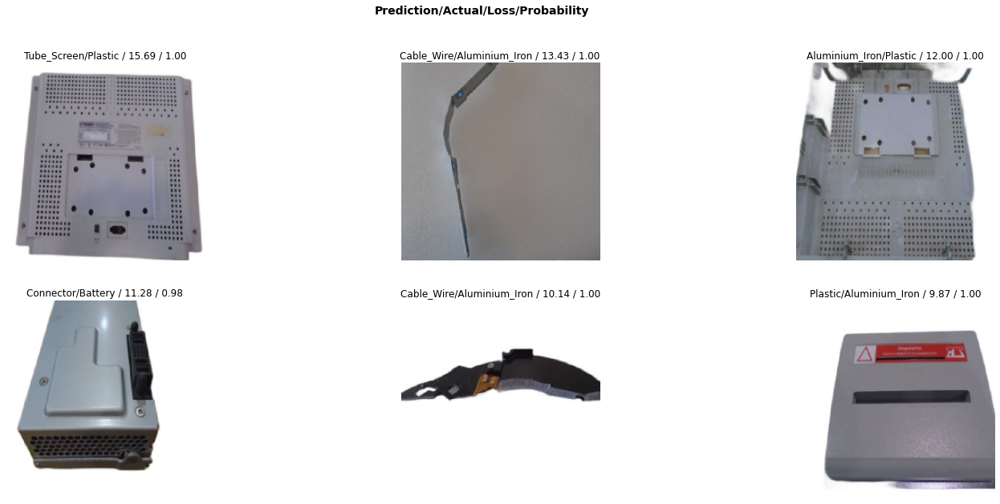

In [32]:
interp.plot_top_losses(6, figsize=(25,10))

In [33]:
interp.print_classification_report()

                       precision    recall  f1-score   support

       Aluminium_Iron       0.76      0.89      0.82        92
              Battery       0.82      0.74      0.78        43
           Cable_Wire       0.71      0.83      0.77        24
      Cardboard_Paper       0.86      0.92      0.89        13
            Connector       0.67      0.67      0.67        12
               Copper       0.93      0.93      0.93        14
        Magnetic Tape       0.30      0.75      0.43         4
              Plastic       0.66      0.49      0.56        55
Printed Circuit Board       0.98      0.89      0.93        47
 Printer Ribbon_Toner       1.00      0.55      0.71        11
          Tube_Screen       0.58      0.58      0.58        19

             accuracy                           0.77       334
            macro avg       0.75      0.75      0.73       334
         weighted avg       0.78      0.77      0.76       334



In [34]:
interp.most_confused()

[('Plastic', 'Aluminium_Iron', 19),
 ('Aluminium_Iron', 'Plastic', 6),
 ('Connector', 'Magnetic Tape', 4),
 ('Aluminium_Iron', 'Cable_Wire', 3),
 ('Battery', 'Plastic', 3),
 ('Plastic', 'Tube_Screen', 3),
 ('Printed Circuit Board', 'Cable_Wire', 3),
 ('Tube_Screen', 'Aluminium_Iron', 3),
 ('Tube_Screen', 'Plastic', 3),
 ('Battery', 'Aluminium_Iron', 2),
 ('Battery', 'Tube_Screen', 2),
 ('Cable_Wire', 'Battery', 2),
 ('Plastic', 'Battery', 2),
 ('Printed Circuit Board', 'Tube_Screen', 2),
 ('Printer Ribbon_Toner', 'Plastic', 2),
 ('Aluminium_Iron', 'Battery', 1),
 ('Battery', 'Cable_Wire', 1),
 ('Battery', 'Cardboard_Paper', 1),
 ('Battery', 'Connector', 1),
 ('Battery', 'Printed Circuit Board', 1),
 ('Cable_Wire', 'Aluminium_Iron', 1),
 ('Cable_Wire', 'Copper', 1),
 ('Cardboard_Paper', 'Battery', 1),
 ('Copper', 'Tube_Screen', 1),
 ('Magnetic Tape', 'Connector', 1),
 ('Plastic', 'Cable_Wire', 1),
 ('Plastic', 'Cardboard_Paper', 1),
 ('Plastic', 'Connector', 1),
 ('Plastic', 'Magnetic T

Interpretation.plot_top_losses(k: 'int | list', largest: 'bool' = True, **kwargs)
Show `k` largest(/smallest) preds and losses. Implementation based on type dispatch

To get a prettier result with hyperlinks to source code and documentation, install nbdev: pip install nbdev


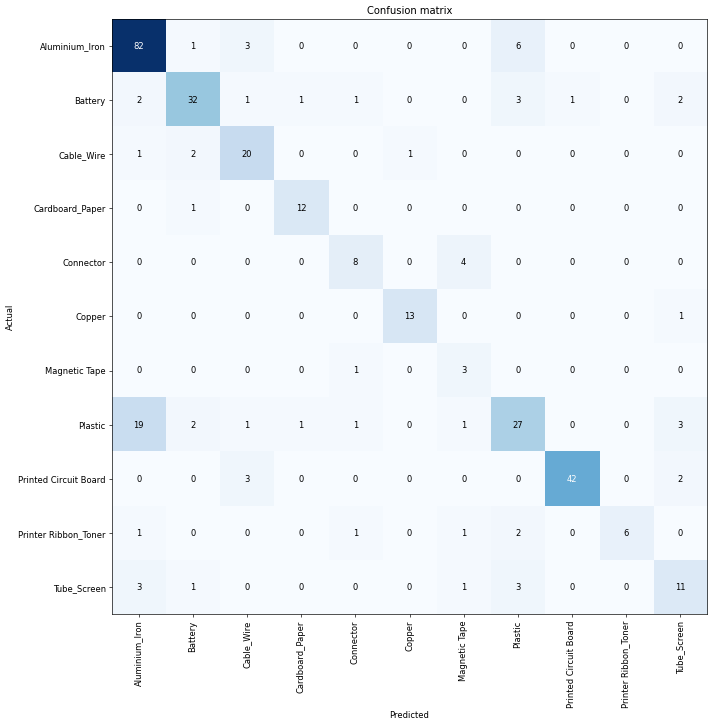

In [35]:
doc(interp.plot_top_losses)
interp.plot_confusion_matrix(figsize=(12,12), dpi=60)

In [38]:
preds = learn.get_preds()

In [39]:
print(preds[0].shape)
preds[0]

torch.Size([334, 11])


TensorBase([[9.9899e-01, 2.3472e-06, 6.6098e-06,  ..., 4.1604e-05,
             6.8256e-07, 2.3770e-05],
            [9.9704e-01, 8.4188e-07, 3.6757e-07,  ..., 6.2331e-07,
             1.5884e-06, 4.3421e-05],
            [9.9506e-01, 5.9457e-07, 3.0064e-07,  ..., 1.7301e-08,
             3.0235e-08, 2.2372e-05],
            ...,
            [1.3796e-03, 6.7373e-06, 3.4901e-04,  ..., 2.0916e-07,
             6.6377e-06, 8.8761e-03],
            [1.0547e-01, 2.6053e-02, 1.4233e-03,  ..., 3.1661e-03,
             7.8092e-03, 5.6911e-02],
            [8.6417e-01, 7.6551e-06, 5.7924e-04,  ..., 3.2138e-05,
             9.8108e-06, 1.3449e-01]])

In [40]:
labels = list(learn.dls.train_ds.items.Class.unique())
labels

['Aluminium_Iron',
 'Battery',
 'Cable_Wire',
 'Cardboard_Paper',
 'Connector',
 'Copper',
 'Magnetic Tape',
 'Plastic',
 'Printed Circuit Board',
 'Printer Ribbon_Toner',
 'Tube_Screen']

In [41]:
## saves the index of most likely (max) predicted class for each image
max_idxs = np.asarray(np.argmax(preds[0],axis=1))
max_idxs

yhat = []
for max_idx in max_idxs:
    yhat.append(labels[max_idx])

## convert POSIX paths to string first
y = []
for label_path in learn.dls.valid_ds.items.Class:
    y.append(str(label_path))

learn.dls.valid_ds.items.Class.unique()

## predicted values
print(yhat[0:5])

## actual values
print(y[0:5])

['Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron']
['Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron']


In [42]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y,yhat)
print(cm)

[[82  1  3  0  0  0  0  6  0  0  0]
 [ 2 32  1  1  1  0  0  3  1  0  2]
 [ 1  2 20  0  0  1  0  0  0  0  0]
 [ 0  1  0 12  0  0  0  0  0  0  0]
 [ 0  0  0  0  8  0  4  0  0  0  0]
 [ 0  0  0  0  0 13  0  0  0  0  1]
 [ 0  0  0  0  1  0  3  0  0  0  0]
 [19  2  1  1  1  0  1 27  0  0  3]
 [ 0  0  3  0  0  0  0  0 42  0  2]
 [ 1  0  0  0  1  0  1  2  0  6  0]
 [ 3  1  0  0  0  0  1  3  0  0 11]]


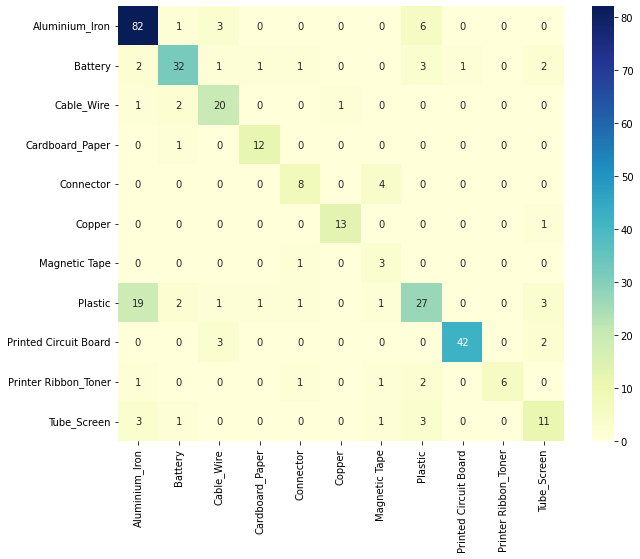

In [43]:
df_cm = pd.DataFrame(cm,learn.dls.valid_ds.items.Class.unique(),learn.dls.valid_ds.items.Class.unique())

plt.figure(figsize=(10,8))

import seaborn as sns

sns.heatmap(df_cm,annot=True,fmt="d",cmap="YlGnBu")

In [44]:
correct = 0

for r in range(len(cm)):
    for c in range(len(cm)):
        if (r==c):
            correct += cm[r,c]

accuracy = correct/sum(sum(cm))
accuracy

0.7664670658682635

### Fold 2

In [17]:
fold_nbr = 2
fold_name = 'fold2'
model_name = 'resnet34'

learn = create_cnn_learner(pct_images=1, 
                           deterministic=True, 
                           size=224, 
                           img_path = '/content/gdrive/My Drive/ewaste_data/full_segmented2/',
                           split_path = '/content/gdrive/My Drive/ewaste_data/full_segmented2/',
                           model_dir = '/content/gdrive/My Drive/ewaste_data/models/option2/' + model_name + '/' + fold_name,
                           log_name = '/content/gdrive/My Drive/ewaste_data/dataframes/option2/' + model_name + '/' + fold_name + '/' + 'log_' + model_name + '_' + fold_name + '.csv',
                           oversampling=True,
                           dfs_path='/content/gdrive/My Drive/ewaste_data/dataframes/option2/' + model_name + '/' + fold_name,
                           fold=fold_nbr)

Random state set:101, cuda used: True
Split Path defined, preparing pseudo stratified split.
Creating path:label dataframe from /content/gdrive/My Drive/ewaste_data/full_segmented2/, using 100.00% of the images (1670 images.) Shuffle = False.
Preparing stratified 5 fold split, random state is 101. Returning fold 2.
Creating path:label dataframe from /content/gdrive/My Drive/ewaste_data/full_segmented2/, using 100.00% of the images (1670 images.) Shuffle = False.
We have 11 classes, with a training set of size 1336, and a validation set of size 334
The main split has 80.00% training data with 11 classes, the reduced split has 80.00 % training data, with 11 classes.


/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [18]:
learn.arch

<function torchvision.models.resnet.resnet34(*, weights: Union[torchvision.models.resnet.ResNet34_Weights, NoneType] = None, progress: bool = True, **kwargs: Any) -> torchvision.models.resnet.ResNet>

In [19]:
len(learn.dls.get_idxs())

3340

In [20]:
idxs = learn.dls.train.get_idxs()
learn.dls.train.items.iloc[idxs].Class.value_counts()

Cable_Wire               327
Aluminium_Iron           321
Plastic                  319
Printer Ribbon_Toner     311
Connector                307
Tube_Screen              302
Printed Circuit Board    297
Magnetic Tape            297
Copper                   294
Cardboard_Paper          284
Battery                  281
Name: Class, dtype: int64

Freezing model body
21,817,664 total parameters.
550,016 training parameters.


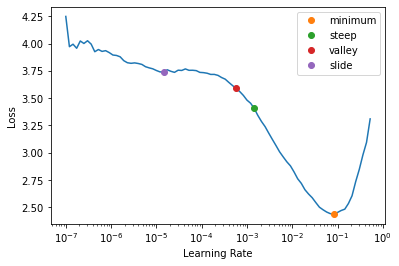

In [21]:
print(f'Freezing model body')
learn.freeze()
enumerate_params(learn)
_,_,valley_freeze,_ = learn.lr_find(suggest_funcs=(minimum, steep, valley, slide))

In [22]:
valley_freeze

0.0005754399462603033

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,error_rate,precision_score,recall_score,f1_score,time
0,3.206512,1.923198,0.374251,0.772455,0.625749,0.374251,0.374251,0.374251,00:10
1,1.970942,1.163344,0.613772,0.910180,0.386228,0.613772,0.613772,0.613772,00:10
2,1.227623,1.033578,0.688623,0.958084,0.311377,0.688623,0.688623,0.688623,00:10
3,0.841570,0.908281,0.715569,0.958084,0.284431,0.715569,0.715569,0.715569,00:10
4,0.622627,0.878205,0.715569,0.973054,0.284431,0.715569,0.715569,0.715569,00:10
5,0.489039,0.796550,0.724551,0.979042,0.275449,0.724551,0.724551,0.724551,00:10
6,0.415360,0.806478,0.727545,0.982036,0.272455,0.727545,0.727545,0.727545,00:10
7,0.382340,0.790307,0.742515,0.985030,0.257485,0.742515,0.742515,0.742515,00:10
8,0.347574,0.773572,0.730539,0.982036,0.269461,0.730539,0.730539,0.730539,00:10
9,0.310254,0.754518,0.757485,0.985030,0.242515,0.757485,0.757485,0.757485,00:10


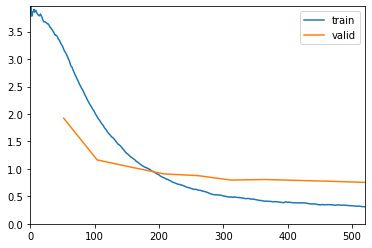

Path('/content/gdrive/My Drive/ewaste_data/models/option2/resnet34/fold2/stage-1-full_segmented2_oversampled_resnet34_fold2.pth')

In [23]:
learn.fit_one_cycle(10, lr_max=valley_freeze)
learn.save('stage-1-full_segmented2_oversampled_' + model_name + '_' + fold_name)

Unfreezing model body
21,817,664 total parameters.
21,817,664 training parameters.


SuggestedLRs(minimum=2.290867705596611e-05, steep=1.3182567499825382e-06, valley=5.248074739938602e-05, slide=3.630780702224001e-05)

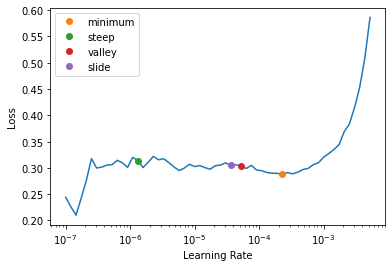

In [24]:
print(f'Unfreezing model body')
learn.unfreeze()
enumerate_params(learn)
learn.lr_find(suggest_funcs=(minimum, steep, valley, slide))

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,error_rate,precision_score,recall_score,f1_score,time
0,0.288386,0.788742,0.742515,0.982036,0.257485,0.742515,0.742515,0.742515,00:11
1,0.257470,0.783499,0.778443,0.985030,0.221557,0.778443,0.778443,0.778443,00:11
2,0.234495,0.847854,0.766467,0.982036,0.233533,0.766467,0.766467,0.766467,00:10
3,0.197894,0.753754,0.784431,0.985030,0.215569,0.784431,0.784431,0.784431,00:10
4,0.138262,0.740427,0.817365,0.982036,0.182635,0.817365,0.817365,0.817365,00:11
5,0.092170,0.755985,0.811377,0.976048,0.188623,0.811377,0.811377,0.811377,00:10
6,0.065175,0.743158,0.799401,0.988024,0.200599,0.799401,0.799401,0.799401,00:10
7,0.036083,0.669720,0.826347,0.982036,0.173653,0.826347,0.826347,0.826347,00:10
8,0.024808,0.685099,0.832335,0.985030,0.167665,0.832335,0.832335,0.832335,00:11
9,0.021178,0.690255,0.820359,0.988024,0.179641,0.820359,0.820359,0.820359,00:10


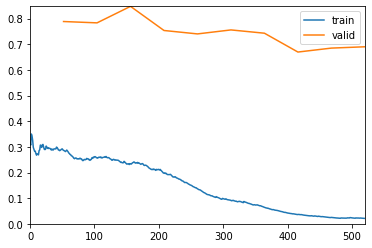

Path('/content/gdrive/My Drive/ewaste_data/models/option2/resnet34/fold2/stage-2-full_segmented2_oversampled_resnet34_fold2.pth')

In [25]:
learn.fit_one_cycle(10, lr_max=slice(5e-5, 5e-4))
learn.save('stage-2-full_segmented2_oversampled_' + model_name + '_' + fold_name)

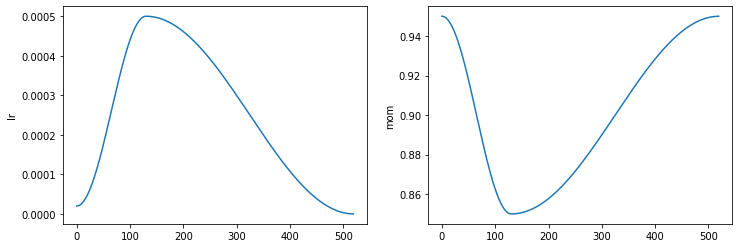

In [26]:
# In practice, we use the fit_one_cycle function, with the learning rates used representing the maximum learning rate 
# in a one cycle policy with cosine annealing, as can be seen below. 
# Note that the x-axis below represents the number of batches passed through the learner.

learn.recorder.plot_sched()

In [27]:
L(learn.recorder.values)

(#10) [[0.28838613629341125, 0.7887424230575562, 0.742514967918396, 0.9820359349250793, 0.257485032081604, 0.7425149700598802, 0.7425149700598802, 0.7425149700598802],[0.25747010111808777, 0.7834990620613098, 0.7784430980682373, 0.985029935836792, 0.2215568870306015, 0.7784431137724551, 0.7784431137724551, 0.7784431137724551],[0.2344953417778015, 0.8478541374206543, 0.7664670944213867, 0.9820359349250793, 0.23353293538093567, 0.7664670658682635, 0.7664670658682635, 0.7664670658682635],[0.1978936642408371, 0.7537537813186646, 0.7844311594963074, 0.985029935836792, 0.21556885540485382, 0.7844311377245509, 0.7844311377245509, 0.7844311377245508],[0.1382618546485901, 0.7404270172119141, 0.817365288734436, 0.9820359349250793, 0.18263472616672516, 0.8173652694610778, 0.8173652694610778, 0.8173652694610778],[0.0921703428030014, 0.7559847235679626, 0.811377227306366, 0.976047933101654, 0.18862275779247284, 0.811377245508982, 0.811377245508982, 0.811377245508982],[0.06517481803894043, 0.7431583

In [28]:
learn.validate()

(#7) [0.6902545094490051,0.8203592896461487,0.9880239367485046,0.1796407252550125,0.8203592814371258,0.8203592814371258,0.8203592814371257]

In [29]:
learn.recorder.values[-1][2]

0.9880239367485046

In [30]:
learn.dls.vocab

['Aluminium_Iron', 'Battery', 'Cable_Wire', 'Cardboard_Paper', 'Connector', 'Copper', 'Magnetic Tape', 'Plastic', 'Printed Circuit Board', 'Printer Ribbon_Toner', 'Tube_Screen']

In [31]:
learn.load('/content/gdrive/My Drive/ewaste_data/models/option2/'+ model_name + '/' + fold_name + '/stage-2-full_segmented2_oversampled_' + model_name + '_' + fold_name)

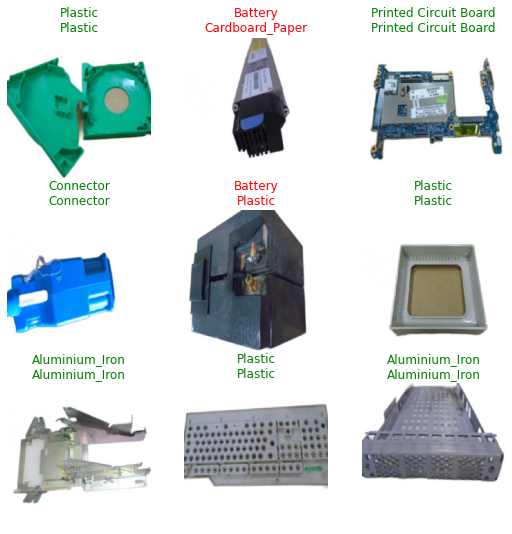

In [32]:
learn.show_results()

In [33]:
learn.dls.loss_func

FlattenedLoss of CrossEntropyLoss()

In [34]:
interp = ClassificationInterpretation.from_learner(learn)

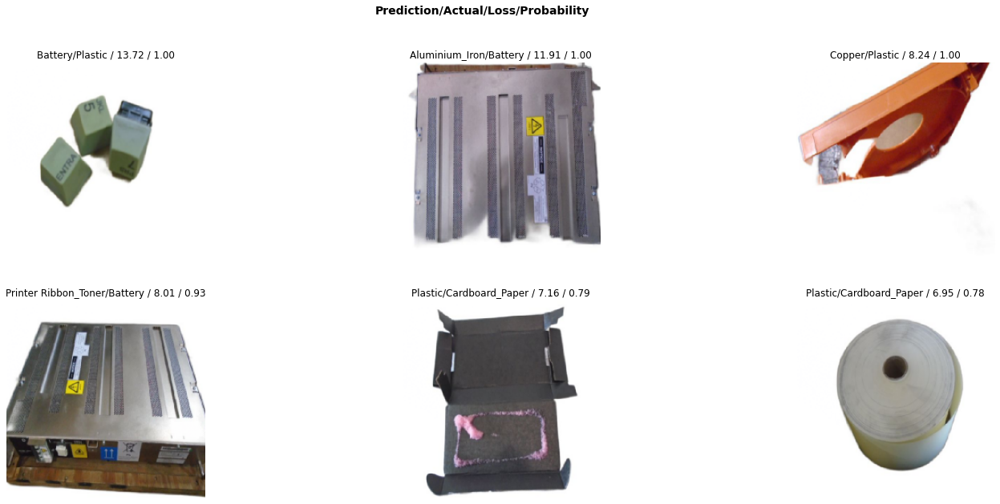

In [35]:
interp.plot_top_losses(6, figsize=(25,10))

In [36]:
interp.print_classification_report()

                       precision    recall  f1-score   support

       Aluminium_Iron       0.85      0.76      0.80        92
              Battery       0.70      0.70      0.70        43
           Cable_Wire       0.88      0.96      0.92        23
      Cardboard_Paper       0.83      0.77      0.80        13
            Connector       0.85      0.85      0.85        13
               Copper       0.92      0.86      0.89        14
        Magnetic Tape       0.60      0.75      0.67         4
              Plastic       0.73      0.82      0.77        55
Printed Circuit Board       0.96      0.94      0.95        47
 Printer Ribbon_Toner       0.77      1.00      0.87        10
          Tube_Screen       0.85      0.85      0.85        20

             accuracy                           0.82       334
            macro avg       0.81      0.84      0.82       334
         weighted avg       0.82      0.82      0.82       334



In [37]:
interp.most_confused()

[('Aluminium_Iron', 'Plastic', 7),
 ('Aluminium_Iron', 'Battery', 5),
 ('Battery', 'Plastic', 5),
 ('Plastic', 'Aluminium_Iron', 4),
 ('Plastic', 'Battery', 4),
 ('Aluminium_Iron', 'Tube_Screen', 3),
 ('Battery', 'Aluminium_Iron', 3),
 ('Printed Circuit Board', 'Battery', 3),
 ('Aluminium_Iron', 'Cable_Wire', 2),
 ('Aluminium_Iron', 'Connector', 2),
 ('Aluminium_Iron', 'Magnetic Tape', 2),
 ('Battery', 'Printer Ribbon_Toner', 2),
 ('Cardboard_Paper', 'Plastic', 2),
 ('Copper', 'Aluminium_Iron', 2),
 ('Tube_Screen', 'Plastic', 2),
 ('Aluminium_Iron', 'Cardboard_Paper', 1),
 ('Battery', 'Cable_Wire', 1),
 ('Battery', 'Cardboard_Paper', 1),
 ('Battery', 'Printed Circuit Board', 1),
 ('Cable_Wire', 'Aluminium_Iron', 1),
 ('Cardboard_Paper', 'Battery', 1),
 ('Connector', 'Aluminium_Iron', 1),
 ('Connector', 'Printer Ribbon_Toner', 1),
 ('Magnetic Tape', 'Plastic', 1),
 ('Plastic', 'Copper', 1),
 ('Plastic', 'Printed Circuit Board', 1),
 ('Tube_Screen', 'Aluminium_Iron', 1)]

Interpretation.plot_top_losses(k: 'int | list', largest: 'bool' = True, **kwargs)
Show `k` largest(/smallest) preds and losses. Implementation based on type dispatch

To get a prettier result with hyperlinks to source code and documentation, install nbdev: pip install nbdev


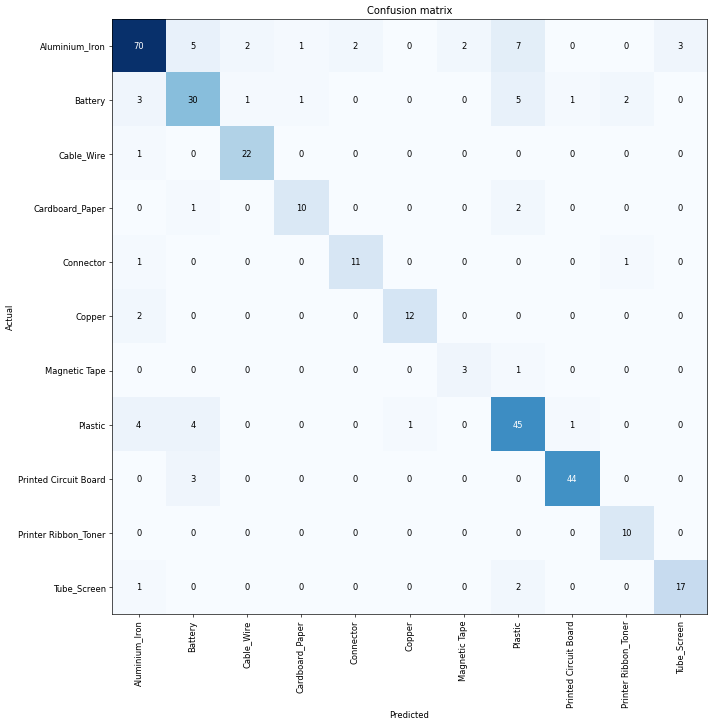

In [38]:
doc(interp.plot_top_losses)
interp.plot_confusion_matrix(figsize=(12,12), dpi=60)

In [39]:
preds = learn.get_preds()

In [40]:
print(preds[0].shape)
preds[0]

torch.Size([334, 11])


TensorBase([[1.7491e-01, 1.1060e-05, 1.6773e-04,  ..., 1.9351e-03,
             2.0110e-03, 9.1187e-04],
            [1.3044e-01, 5.4688e-04, 2.3229e-04,  ..., 7.4401e-03,
             1.1582e-03, 2.2189e-02],
            [9.9990e-01, 1.4297e-06, 4.2191e-09,  ..., 3.8881e-09,
             4.0283e-05, 6.6768e-08],
            ...,
            [2.7461e-04, 4.4405e-04, 1.2337e-05,  ..., 5.4587e-05,
             5.7359e-06, 7.0763e-01],
            [4.0854e-06, 3.4296e-05, 4.0901e-07,  ..., 3.7029e-04,
             1.0227e-05, 9.9958e-01],
            [2.8399e-03, 1.6540e-02, 4.5870e-04,  ..., 2.2688e-04,
             3.0125e-04, 1.0095e-02]])

In [41]:
labels = list(learn.dls.train_ds.items.Class.unique())
labels

['Aluminium_Iron',
 'Battery',
 'Cable_Wire',
 'Cardboard_Paper',
 'Connector',
 'Copper',
 'Magnetic Tape',
 'Plastic',
 'Printed Circuit Board',
 'Printer Ribbon_Toner',
 'Tube_Screen']

In [42]:
## saves the index of most likely (max) predicted class for each image
max_idxs = np.asarray(np.argmax(preds[0],axis=1))
max_idxs

yhat = []
for max_idx in max_idxs:
    yhat.append(labels[max_idx])

## convert POSIX paths to string first
y = []
for label_path in learn.dls.valid_ds.items.Class:
    y.append(str(label_path))

learn.dls.valid_ds.items.Class.unique()

## predicted values
print(yhat[0:5])

## actual values
print(y[0:5])

['Plastic', 'Plastic', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron']
['Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron']


In [43]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y,yhat)
print(cm)

[[70  5  2  1  2  0  2  7  0  0  3]
 [ 3 30  1  1  0  0  0  5  1  2  0]
 [ 1  0 22  0  0  0  0  0  0  0  0]
 [ 0  1  0 10  0  0  0  2  0  0  0]
 [ 1  0  0  0 11  0  0  0  0  1  0]
 [ 2  0  0  0  0 12  0  0  0  0  0]
 [ 0  0  0  0  0  0  3  1  0  0  0]
 [ 4  4  0  0  0  1  0 45  1  0  0]
 [ 0  3  0  0  0  0  0  0 44  0  0]
 [ 0  0  0  0  0  0  0  0  0 10  0]
 [ 1  0  0  0  0  0  0  2  0  0 17]]


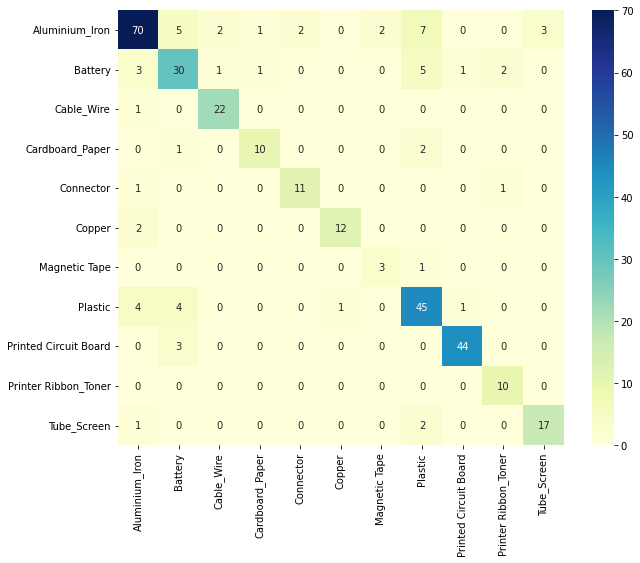

In [44]:
df_cm = pd.DataFrame(cm,learn.dls.valid_ds.items.Class.unique(),learn.dls.valid_ds.items.Class.unique())

plt.figure(figsize=(10,8))

import seaborn as sns

sns.heatmap(df_cm,annot=True,fmt="d",cmap="YlGnBu")

In [45]:
correct = 0

for r in range(len(cm)):
    for c in range(len(cm)):
        if (r==c):
            correct += cm[r,c]

accuracy = correct/sum(sum(cm))
accuracy

0.8203592814371258

### Fold 3

In [16]:
fold_nbr = 3
fold_name = 'fold3'
model_name = 'resnet34'

learn = create_cnn_learner(pct_images=1, 
                           deterministic=True, 
                           size=224, 
                           img_path = '/content/gdrive/My Drive/ewaste_data/full_segmented2/',
                           split_path = '/content/gdrive/My Drive/ewaste_data/full_segmented2/',
                           model_dir = '/content/gdrive/My Drive/ewaste_data/models/option2/' + model_name + '/' + fold_name,
                           log_name = '/content/gdrive/My Drive/ewaste_data/dataframes/option2/' + model_name + '/' + fold_name + '/' + 'log_' + model_name + '_' + fold_name + '.csv',
                           oversampling=True,
                           dfs_path='/content/gdrive/My Drive/ewaste_data/dataframes/option2/' + model_name + '/' + fold_name,
                           fold=fold_nbr)

Random state set:101, cuda used: True
Split Path defined, preparing pseudo stratified split.
Creating path:label dataframe from /content/gdrive/My Drive/ewaste_data/full_segmented2/, using 100.00% of the images (1670 images.) Shuffle = False.
Preparing stratified 5 fold split, random state is 101. Returning fold 3.
Creating path:label dataframe from /content/gdrive/My Drive/ewaste_data/full_segmented2/, using 100.00% of the images (1670 images.) Shuffle = False.
We have 11 classes, with a training set of size 1336, and a validation set of size 334
The main split has 80.00% training data with 11 classes, the reduced split has 80.00 % training data, with 11 classes.


/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [17]:
learn.arch

<function torchvision.models.resnet.resnet34(*, weights: Union[torchvision.models.resnet.ResNet34_Weights, NoneType] = None, progress: bool = True, **kwargs: Any) -> torchvision.models.resnet.ResNet>

In [18]:
len(learn.dls.get_idxs())

3340

In [19]:
idxs = learn.dls.train.get_idxs()
learn.dls.train.items.iloc[idxs].Class.value_counts()

Cable_Wire               327
Aluminium_Iron           321
Plastic                  319
Printer Ribbon_Toner     311
Connector                307
Tube_Screen              302
Printed Circuit Board    297
Magnetic Tape            297
Copper                   294
Cardboard_Paper          284
Battery                  281
Name: Class, dtype: int64

Freezing model body
21,817,664 total parameters.
550,016 training parameters.


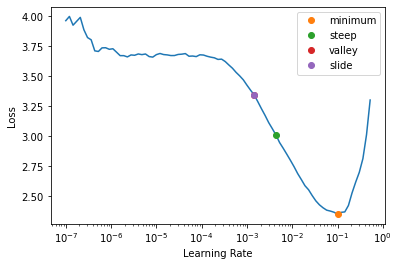

In [20]:
print(f'Freezing model body')
learn.freeze()
enumerate_params(learn)
_,_,valley_freeze,_ = learn.lr_find(suggest_funcs=(minimum, steep, valley, slide))

In [21]:
valley_freeze

0.0014454397605732083

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,error_rate,precision_score,recall_score,f1_score,time
0,2.538564,1.606825,0.500000,0.856287,0.500000,0.500000,0.500000,0.500000,00:10
1,1.371620,1.086149,0.658683,0.955090,0.341317,0.658683,0.658683,0.658683,00:10
2,0.823560,0.896049,0.718563,0.973054,0.281437,0.718563,0.718563,0.718563,00:10
3,0.529405,0.845752,0.751497,0.973054,0.248503,0.751497,0.751497,0.751497,00:10
4,0.395330,0.752969,0.778443,0.979042,0.221557,0.778443,0.778443,0.778443,00:10
5,0.310966,0.748848,0.793413,0.982036,0.206587,0.793413,0.793413,0.793413,00:10
6,0.240966,0.676980,0.784431,0.985030,0.215569,0.784431,0.784431,0.784431,00:10
7,0.205199,0.653452,0.796407,0.982036,0.203593,0.796407,0.796407,0.796407,00:10
8,0.183522,0.644429,0.805389,0.982036,0.194611,0.805389,0.805389,0.805389,00:10
9,0.157940,0.640501,0.814371,0.985030,0.185629,0.814371,0.814371,0.814371,00:10


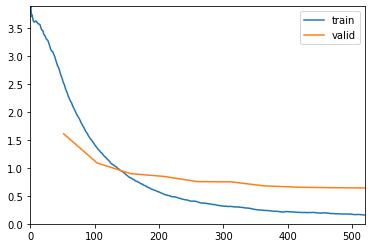

Path('/content/gdrive/My Drive/ewaste_data/models/option2/resnet34/fold3/stage-1-full_segmented2_oversampled_resnet34_fold3.pth')

In [22]:
learn.fit_one_cycle(10, lr_max=valley_freeze)
learn.save('stage-1-full_segmented2_oversampled_' + model_name + '_' + fold_name)

Unfreezing model body
21,817,664 total parameters.
21,817,664 training parameters.


SuggestedLRs(minimum=9.999999747378752e-07, steep=6.309573450380412e-07, valley=7.585775892948732e-05, slide=3.630780702224001e-05)

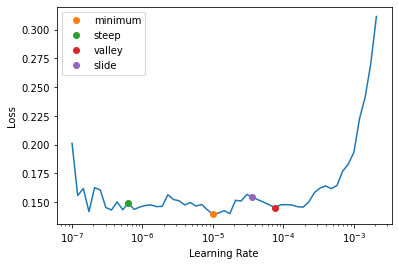

In [23]:
print(f'Unfreezing model body')
learn.unfreeze()
enumerate_params(learn)
learn.lr_find(suggest_funcs=(minimum, steep, valley, slide))

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,error_rate,precision_score,recall_score,f1_score,time
0,0.156624,0.646702,0.802395,0.985030,0.197605,0.802395,0.802395,0.802395,00:10
1,0.146036,0.672176,0.802395,0.985030,0.197605,0.802395,0.802395,0.802395,00:10
2,0.119052,0.632706,0.823353,0.985030,0.176647,0.823353,0.823353,0.823353,00:10
3,0.108430,0.662526,0.826347,0.982036,0.173653,0.826347,0.826347,0.826347,00:10
4,0.079688,0.618347,0.832335,0.988024,0.167665,0.832335,0.832335,0.832335,00:10
5,0.063901,0.620489,0.835329,0.985030,0.164671,0.835329,0.835329,0.835329,00:10
6,0.051228,0.648553,0.826347,0.988024,0.173653,0.826347,0.826347,0.826347,00:10
7,0.045319,0.634411,0.826347,0.985030,0.173653,0.826347,0.826347,0.826347,00:10
8,0.037574,0.631602,0.820359,0.988024,0.179641,0.820359,0.820359,0.820359,00:11
9,0.038362,0.623177,0.826347,0.988024,0.173653,0.826347,0.826347,0.826347,00:10


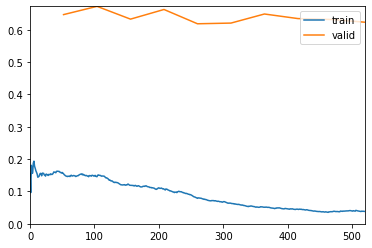

Path('/content/gdrive/My Drive/ewaste_data/models/option2/resnet34/fold3/stage-2-full_segmented2_oversampled_resnet34_fold3.pth')

In [24]:
learn.fit_one_cycle(10, lr_max=slice(1e-5, 1e-4))
learn.save('stage-2-full_segmented2_oversampled_' + model_name + '_' + fold_name)

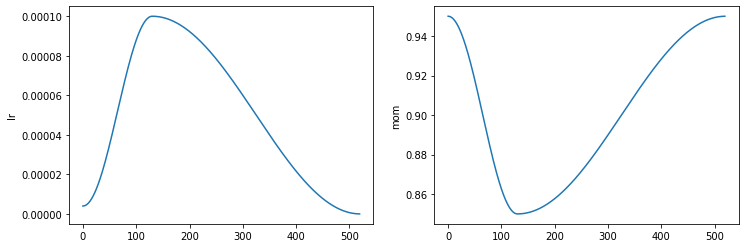

In [25]:
# In practice, we use the fit_one_cycle function, with the learning rates used representing the maximum learning rate 
# in a one cycle policy with cosine annealing, as can be seen below. 
# Note that the x-axis below represents the number of batches passed through the learner.

learn.recorder.plot_sched()

In [26]:
L(learn.recorder.values)

(#10) [[0.15662430226802826, 0.6467017531394958, 0.802395224571228, 0.985029935836792, 0.19760479032993317, 0.8023952095808383, 0.8023952095808383, 0.8023952095808384],[0.14603571593761444, 0.6721763610839844, 0.802395224571228, 0.985029935836792, 0.19760479032993317, 0.8023952095808383, 0.8023952095808383, 0.8023952095808384],[0.11905231326818466, 0.6327061653137207, 0.8233532905578613, 0.985029935836792, 0.17664670944213867, 0.8233532934131736, 0.8233532934131736, 0.8233532934131736],[0.10843032598495483, 0.6625255942344666, 0.826347291469574, 0.9820359349250793, 0.17365269362926483, 0.8263473053892215, 0.8263473053892215, 0.8263473053892215],[0.07968762516975403, 0.6183474659919739, 0.832335352897644, 0.9880239367485046, 0.16766467690467834, 0.8323353293413174, 0.8323353293413174, 0.8323353293413174],[0.06390130519866943, 0.6204887628555298, 0.8353293538093567, 0.985029935836792, 0.1646706610918045, 0.8353293413173652, 0.8353293413173652, 0.8353293413173654],[0.05122770741581917, 0.

In [27]:
learn.validate()

(#7) [0.6231768727302551,0.826347291469574,0.9880239367485046,0.17365269362926483,0.8263473053892215,0.8263473053892215,0.8263473053892215]

In [28]:
learn.recorder.values[-1][2]

0.9880239367485046

In [29]:
learn.dls.vocab

['Aluminium_Iron', 'Battery', 'Cable_Wire', 'Cardboard_Paper', 'Connector', 'Copper', 'Magnetic Tape', 'Plastic', 'Printed Circuit Board', 'Printer Ribbon_Toner', 'Tube_Screen']

In [30]:
learn.load('/content/gdrive/My Drive/ewaste_data/models/option2/'+ model_name + '/' + fold_name + '/stage-2-full_segmented2_oversampled_' + model_name + '_' + fold_name)

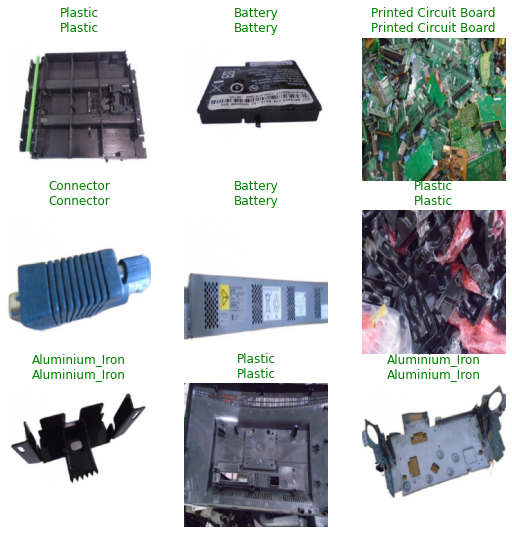

In [31]:
learn.show_results()

In [32]:
learn.dls.loss_func

FlattenedLoss of CrossEntropyLoss()

In [33]:
interp = ClassificationInterpretation.from_learner(learn)

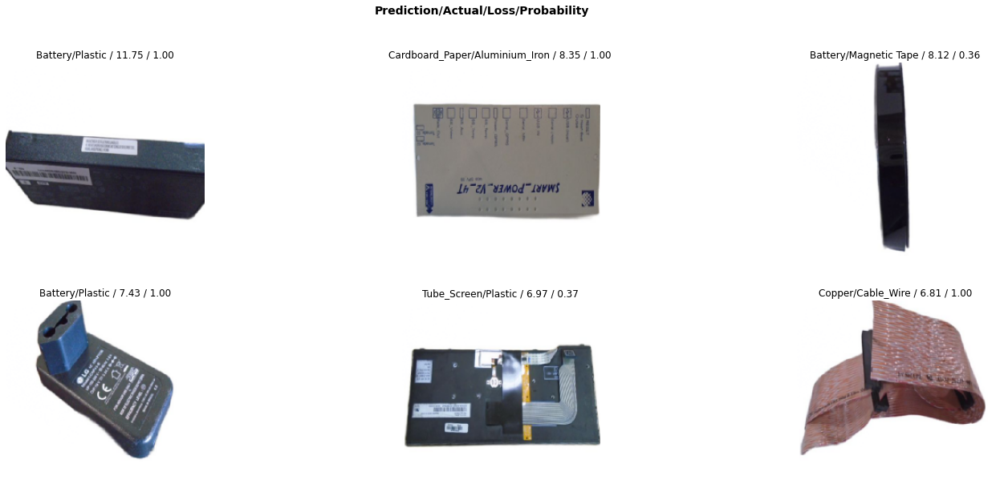

In [34]:
interp.plot_top_losses(6, figsize=(25,10))

In [35]:
interp.print_classification_report()

                       precision    recall  f1-score   support

       Aluminium_Iron       0.87      0.79      0.83        92
              Battery       0.77      0.86      0.81        43
           Cable_Wire       0.92      0.96      0.94        23
      Cardboard_Paper       0.79      0.85      0.81        13
            Connector       0.79      0.85      0.81        13
               Copper       0.87      0.93      0.90        14
        Magnetic Tape       0.50      0.50      0.50         4
              Plastic       0.74      0.73      0.73        55
Printed Circuit Board       0.96      0.96      0.96        47
 Printer Ribbon_Toner       0.88      0.70      0.78        10
          Tube_Screen       0.68      0.75      0.71        20

             accuracy                           0.83       334
            macro avg       0.80      0.81      0.80       334
         weighted avg       0.83      0.83      0.83       334



In [36]:
interp.most_confused()

[('Aluminium_Iron', 'Plastic', 10),
 ('Plastic', 'Battery', 4),
 ('Aluminium_Iron', 'Tube_Screen', 3),
 ('Battery', 'Aluminium_Iron', 3),
 ('Plastic', 'Aluminium_Iron', 3),
 ('Tube_Screen', 'Aluminium_Iron', 3),
 ('Aluminium_Iron', 'Battery', 2),
 ('Plastic', 'Connector', 2),
 ('Plastic', 'Magnetic Tape', 2),
 ('Plastic', 'Tube_Screen', 2),
 ('Printer Ribbon_Toner', 'Plastic', 2),
 ('Aluminium_Iron', 'Cardboard_Paper', 1),
 ('Aluminium_Iron', 'Connector', 1),
 ('Aluminium_Iron', 'Printed Circuit Board', 1),
 ('Aluminium_Iron', 'Printer Ribbon_Toner', 1),
 ('Battery', 'Cardboard_Paper', 1),
 ('Battery', 'Printed Circuit Board', 1),
 ('Battery', 'Tube_Screen', 1),
 ('Cable_Wire', 'Copper', 1),
 ('Cardboard_Paper', 'Battery', 1),
 ('Cardboard_Paper', 'Tube_Screen', 1),
 ('Connector', 'Aluminium_Iron', 1),
 ('Connector', 'Battery', 1),
 ('Copper', 'Cable_Wire', 1),
 ('Magnetic Tape', 'Battery', 1),
 ('Magnetic Tape', 'Plastic', 1),
 ('Plastic', 'Cable_Wire', 1),
 ('Plastic', 'Copper', 1),


Interpretation.plot_top_losses(k: 'int | list', largest: 'bool' = True, **kwargs)
Show `k` largest(/smallest) preds and losses. Implementation based on type dispatch

To get a prettier result with hyperlinks to source code and documentation, install nbdev: pip install nbdev


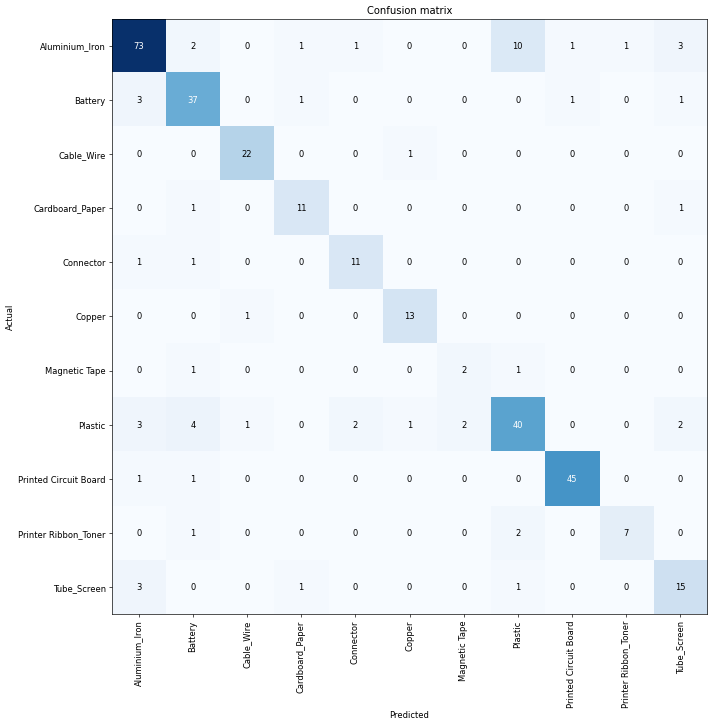

In [37]:
doc(interp.plot_top_losses)
interp.plot_confusion_matrix(figsize=(12,12), dpi=60)

In [38]:
preds = learn.get_preds()

In [39]:
print(preds[0].shape)
preds[0]

torch.Size([334, 11])


TensorBase([[9.8432e-01, 6.3708e-06, 1.6982e-06,  ..., 3.5974e-06,
             4.6229e-06, 4.8022e-06],
            [9.9928e-01, 6.5373e-06, 1.2837e-07,  ..., 3.4247e-06,
             1.0804e-06, 1.5976e-06],
            [5.4974e-01, 2.5743e-01, 1.3833e-03,  ..., 5.2177e-04,
             1.3874e-04, 3.9218e-02],
            ...,
            [2.2741e-03, 5.9951e-04, 4.5184e-05,  ..., 1.7201e-05,
             1.6635e-06, 9.9676e-01],
            [1.1828e-01, 3.4145e-02, 9.0923e-04,  ..., 5.3994e-04,
             1.1940e-04, 8.3448e-01],
            [4.3890e-03, 4.2410e-01, 7.5073e-05,  ..., 4.5425e-04,
             2.0137e-04, 5.7020e-01]])

In [40]:
labels = list(learn.dls.train_ds.items.Class.unique())
labels

['Aluminium_Iron',
 'Battery',
 'Cable_Wire',
 'Cardboard_Paper',
 'Connector',
 'Copper',
 'Magnetic Tape',
 'Plastic',
 'Printed Circuit Board',
 'Printer Ribbon_Toner',
 'Tube_Screen']

In [41]:
## saves the index of most likely (max) predicted class for each image
max_idxs = np.asarray(np.argmax(preds[0],axis=1))
max_idxs

yhat = []
for max_idx in max_idxs:
    yhat.append(labels[max_idx])

## convert POSIX paths to string first
y = []
for label_path in learn.dls.valid_ds.items.Class:
    y.append(str(label_path))

learn.dls.valid_ds.items.Class.unique()

## predicted values
print(yhat[0:5])

## actual values
print(y[0:5])

['Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Battery', 'Aluminium_Iron']
['Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron']


In [42]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y,yhat)
print(cm)

[[73  2  0  1  1  0  0 10  1  1  3]
 [ 3 37  0  1  0  0  0  0  1  0  1]
 [ 0  0 22  0  0  1  0  0  0  0  0]
 [ 0  1  0 11  0  0  0  0  0  0  1]
 [ 1  1  0  0 11  0  0  0  0  0  0]
 [ 0  0  1  0  0 13  0  0  0  0  0]
 [ 0  1  0  0  0  0  2  1  0  0  0]
 [ 3  4  1  0  2  1  2 40  0  0  2]
 [ 1  1  0  0  0  0  0  0 45  0  0]
 [ 0  1  0  0  0  0  0  2  0  7  0]
 [ 3  0  0  1  0  0  0  1  0  0 15]]


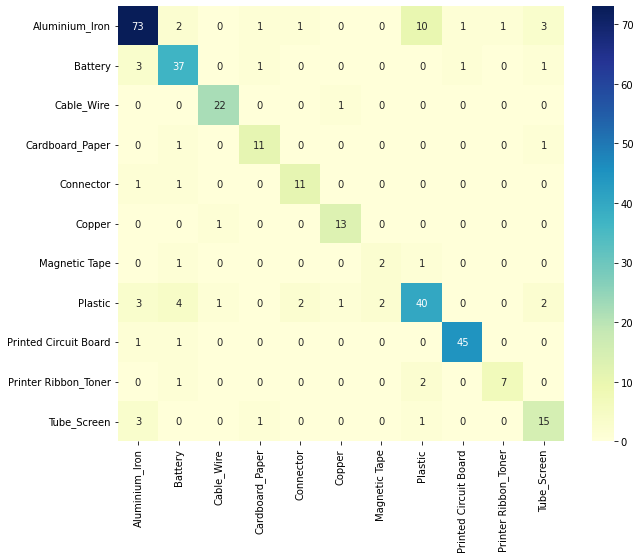

In [43]:
df_cm = pd.DataFrame(cm,learn.dls.valid_ds.items.Class.unique(),learn.dls.valid_ds.items.Class.unique())

plt.figure(figsize=(10,8))

import seaborn as sns

sns.heatmap(df_cm,annot=True,fmt="d",cmap="YlGnBu")

In [44]:
correct = 0

for r in range(len(cm)):
    for c in range(len(cm)):
        if (r==c):
            correct += cm[r,c]

accuracy = correct/sum(sum(cm))
accuracy

0.8263473053892215

### Fold 4

In [15]:
fold_nbr = 4
fold_name = 'fold4'
model_name = 'resnet34'

learn = create_cnn_learner(pct_images=1, 
                           deterministic=True, 
                           size=224, 
                           img_path = '/content/gdrive/My Drive/ewaste_data/full_segmented2/',
                           split_path = '/content/gdrive/My Drive/ewaste_data/full_segmented2/',
                           model_dir = '/content/gdrive/My Drive/ewaste_data/models/option2/' + model_name + '/' + fold_name,
                           log_name = '/content/gdrive/My Drive/ewaste_data/dataframes/option2/' + model_name + '/' + fold_name + '/' + 'log_' + model_name + '_' + fold_name + '.csv',
                           oversampling=True,
                           dfs_path='/content/gdrive/My Drive/ewaste_data/dataframes/option2/' + model_name + '/' + fold_name,
                           fold=fold_nbr)

Random state set:101, cuda used: True
Split Path defined, preparing pseudo stratified split.
Creating path:label dataframe from /content/gdrive/My Drive/ewaste_data/full_segmented2/, using 100.00% of the images (1670 images.) Shuffle = False.
Preparing stratified 5 fold split, random state is 101. Returning fold 4.
Creating path:label dataframe from /content/gdrive/My Drive/ewaste_data/full_segmented2/, using 100.00% of the images (1670 images.) Shuffle = False.
We have 11 classes, with a training set of size 1336, and a validation set of size 334
The main split has 80.00% training data with 11 classes, the reduced split has 80.00 % training data, with 11 classes.


/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [16]:
learn.arch

<function torchvision.models.resnet.resnet34(*, weights: Union[torchvision.models.resnet.ResNet34_Weights, NoneType] = None, progress: bool = True, **kwargs: Any) -> torchvision.models.resnet.ResNet>

In [17]:
len(learn.dls.get_idxs())

3340

In [18]:
idxs = learn.dls.train.get_idxs()
learn.dls.train.items.iloc[idxs].Class.value_counts()

Cable_Wire               327
Aluminium_Iron           321
Plastic                  319
Printer Ribbon_Toner     311
Connector                307
Tube_Screen              302
Printed Circuit Board    297
Magnetic Tape            297
Copper                   294
Cardboard_Paper          284
Battery                  281
Name: Class, dtype: int64

Freezing model body
21,817,664 total parameters.
550,016 training parameters.


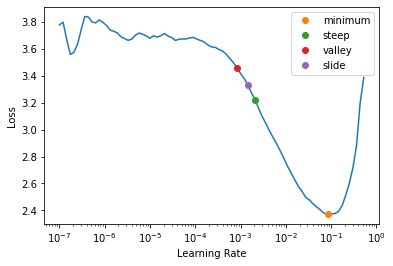

In [19]:
print(f'Freezing model body')
learn.freeze()
enumerate_params(learn)
_,_,valley_freeze,_ = learn.lr_find(suggest_funcs=(minimum, steep, valley, slide))

In [20]:
valley_freeze

0.0008317637839354575

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,error_rate,precision_score,recall_score,f1_score,time
0,2.987702,2.023643,0.344311,0.781437,0.655689,0.344311,0.344311,0.344311,00:10
1,1.711315,1.317095,0.577844,0.931138,0.422156,0.577844,0.577844,0.577844,00:10
2,1.013918,1.082191,0.667665,0.943114,0.332335,0.667665,0.667665,0.667665,00:10
3,0.665553,0.986433,0.682635,0.958084,0.317365,0.682635,0.682635,0.682635,00:10
4,0.486531,0.944332,0.697605,0.970060,0.302395,0.697605,0.697605,0.697605,00:10
5,0.381061,0.871796,0.724551,0.970060,0.275449,0.724551,0.724551,0.724551,00:11
6,0.311457,0.802197,0.739521,0.973054,0.260479,0.739521,0.739521,0.739521,00:10
7,0.275608,0.801195,0.733533,0.979042,0.266467,0.733533,0.733533,0.733533,00:10
8,0.247348,0.790872,0.748503,0.973054,0.251497,0.748503,0.748503,0.748503,00:10
9,0.233175,0.779725,0.751497,0.982036,0.248503,0.751497,0.751497,0.751497,00:10


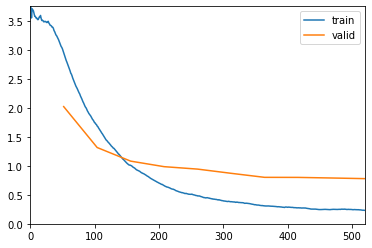

Path('/content/gdrive/My Drive/ewaste_data/models/option2/resnet34/fold4/stage-1-full_segmented2_oversampled_resnet34_fold4.pth')

In [21]:
learn.fit_one_cycle(10, lr_max=valley_freeze)
learn.save('stage-1-full_segmented2_oversampled_' + model_name + '_' + fold_name)

Unfreezing model body
21,817,664 total parameters.
21,817,664 training parameters.


SuggestedLRs(minimum=9.12010818865383e-08, steep=6.309573450380412e-07, valley=0.00019054606673307717, slide=3.630780702224001e-05)

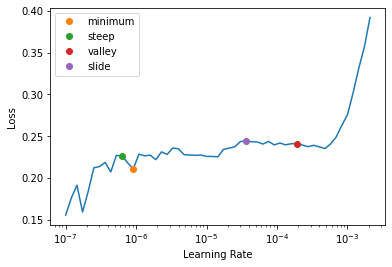

In [22]:
print(f'Unfreezing model body')
learn.unfreeze()
enumerate_params(learn)
learn.lr_find(suggest_funcs=(minimum, steep, valley, slide))

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,error_rate,precision_score,recall_score,f1_score,time
0,0.220644,0.783160,0.736527,0.979042,0.263473,0.736527,0.736527,0.736527,00:10
1,0.217313,0.738807,0.763473,0.985030,0.236527,0.763473,0.763473,0.763473,00:11
2,0.173461,0.746112,0.775449,0.979042,0.224551,0.775449,0.775449,0.775449,00:10
3,0.142533,0.714237,0.772455,0.991018,0.227545,0.772455,0.772455,0.772455,00:10
4,0.106192,0.702995,0.775449,0.988024,0.224551,0.775449,0.775449,0.775449,00:10
5,0.085541,0.726839,0.790419,0.991018,0.209581,0.790419,0.790419,0.790419,00:10
6,0.067329,0.718835,0.790419,0.988024,0.209581,0.790419,0.790419,0.790419,00:10
7,0.055629,0.722745,0.787425,0.985030,0.212575,0.787425,0.787425,0.787425,00:10
8,0.048727,0.716848,0.793413,0.985030,0.206587,0.793413,0.793413,0.793413,00:11
9,0.045137,0.715757,0.796407,0.985030,0.203593,0.796407,0.796407,0.796407,00:10


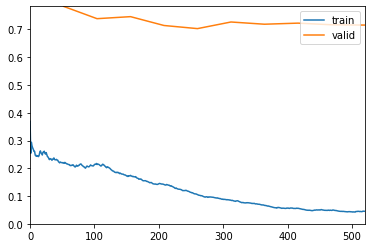

Path('/content/gdrive/My Drive/ewaste_data/models/option2/resnet34/fold4/stage-2-full_segmented2_oversampled_resnet34_fold4.pth')

In [23]:
learn.fit_one_cycle(10, lr_max=slice(1e-5, 1e-4))
learn.save('stage-2-full_segmented2_oversampled_' + model_name + '_' + fold_name)

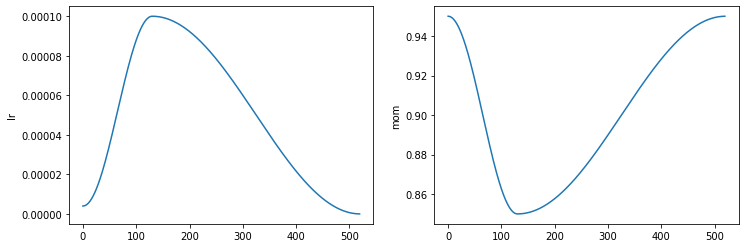

In [24]:
# In practice, we use the fit_one_cycle function, with the learning rates used representing the maximum learning rate 
# in a one cycle policy with cosine annealing, as can be seen below. 
# Note that the x-axis below represents the number of batches passed through the learner.

learn.recorder.plot_sched()

In [25]:
L(learn.recorder.values)

(#10) [[0.2206438034772873, 0.783160388469696, 0.7365269660949707, 0.9790419340133667, 0.2634730637073517, 0.7365269461077845, 0.7365269461077845, 0.7365269461077845],[0.2173125296831131, 0.7388066649436951, 0.7634730339050293, 0.985029935836792, 0.2365269511938095, 0.7634730538922155, 0.7634730538922155, 0.7634730538922155],[0.17346133291721344, 0.7461124062538147, 0.7754490971565247, 0.9790419340133667, 0.22455090284347534, 0.7754491017964071, 0.7754491017964071, 0.7754491017964071],[0.14253325760364532, 0.714236855506897, 0.772455096244812, 0.9910179376602173, 0.227544903755188, 0.7724550898203593, 0.7724550898203593, 0.7724550898203594],[0.10619157552719116, 0.7029950022697449, 0.7754490971565247, 0.9880239367485046, 0.22455090284347534, 0.7754491017964071, 0.7754491017964071, 0.7754491017964071],[0.08554083853960037, 0.726839005947113, 0.7904191613197327, 0.9910179376602173, 0.20958083868026733, 0.7904191616766467, 0.7904191616766467, 0.7904191616766467],[0.06732914596796036, 0.71

In [26]:
learn.validate()

(#7) [0.7157566547393799,0.796407163143158,0.985029935836792,0.20359280705451965,0.7964071856287425,0.7964071856287425,0.7964071856287425]

In [27]:
learn.recorder.values[-1][2]

0.985029935836792

In [28]:
learn.dls.vocab

['Aluminium_Iron', 'Battery', 'Cable_Wire', 'Cardboard_Paper', 'Connector', 'Copper', 'Magnetic Tape', 'Plastic', 'Printed Circuit Board', 'Printer Ribbon_Toner', 'Tube_Screen']

In [29]:
learn.load('/content/gdrive/My Drive/ewaste_data/models/option2/'+ model_name + '/' + fold_name + '/stage-2-full_segmented2_oversampled_' + model_name + '_' + fold_name)

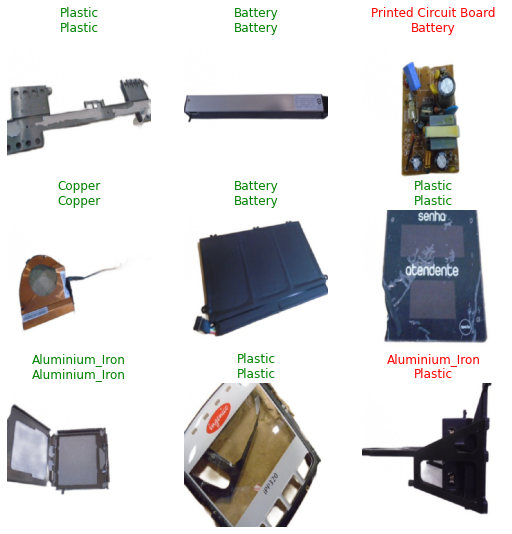

In [30]:
learn.show_results()

In [31]:
learn.dls.loss_func

FlattenedLoss of CrossEntropyLoss()

In [32]:
interp = ClassificationInterpretation.from_learner(learn)

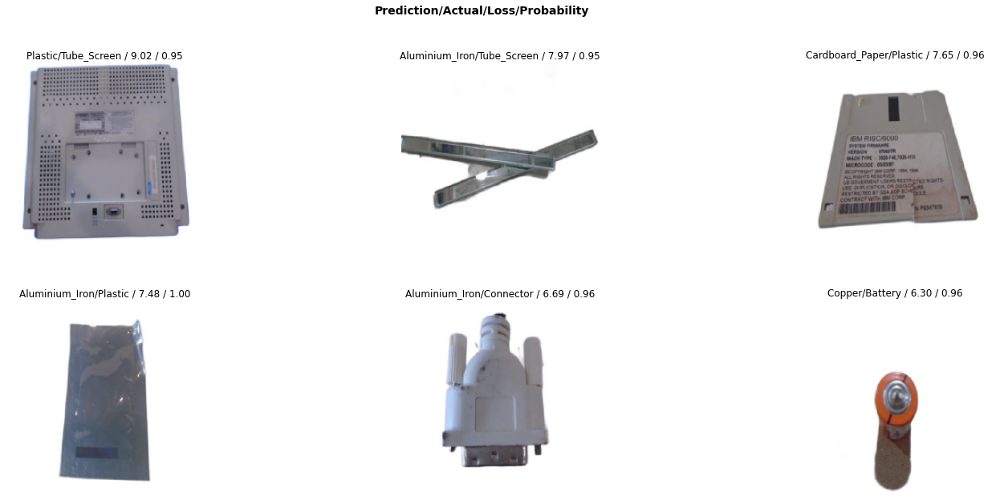

In [33]:
interp.plot_top_losses(6, figsize=(25,10))

In [34]:
interp.print_classification_report()

                       precision    recall  f1-score   support

       Aluminium_Iron       0.75      0.84      0.79        92
              Battery       0.79      0.88      0.84        43
           Cable_Wire       0.91      0.91      0.91        23
      Cardboard_Paper       0.67      0.92      0.77        13
            Connector       0.89      0.67      0.76        12
               Copper       0.88      0.93      0.90        15
        Magnetic Tape       1.00      0.67      0.80         3
              Plastic       0.73      0.59      0.65        56
Printed Circuit Board       0.96      0.91      0.93        47
 Printer Ribbon_Toner       0.56      0.50      0.53        10
          Tube_Screen       0.76      0.65      0.70        20

             accuracy                           0.80       334
            macro avg       0.81      0.77      0.78       334
         weighted avg       0.80      0.80      0.79       334



In [35]:
interp.most_confused()

[('Plastic', 'Aluminium_Iron', 14),
 ('Aluminium_Iron', 'Plastic', 7),
 ('Aluminium_Iron', 'Tube_Screen', 3),
 ('Plastic', 'Battery', 3),
 ('Plastic', 'Cardboard_Paper', 3),
 ('Printer Ribbon_Toner', 'Aluminium_Iron', 3),
 ('Tube_Screen', 'Aluminium_Iron', 3),
 ('Tube_Screen', 'Battery', 3),
 ('Battery', 'Plastic', 2),
 ('Connector', 'Aluminium_Iron', 2),
 ('Printed Circuit Board', 'Battery', 2),
 ('Printed Circuit Board', 'Cardboard_Paper', 2),
 ('Aluminium_Iron', 'Cable_Wire', 1),
 ('Aluminium_Iron', 'Connector', 1),
 ('Aluminium_Iron', 'Copper', 1),
 ('Aluminium_Iron', 'Printed Circuit Board', 1),
 ('Aluminium_Iron', 'Printer Ribbon_Toner', 1),
 ('Battery', 'Cardboard_Paper', 1),
 ('Battery', 'Copper', 1),
 ('Battery', 'Printer Ribbon_Toner', 1),
 ('Cable_Wire', 'Aluminium_Iron', 1),
 ('Cable_Wire', 'Printer Ribbon_Toner', 1),
 ('Cardboard_Paper', 'Aluminium_Iron', 1),
 ('Connector', 'Battery', 1),
 ('Connector', 'Plastic', 1),
 ('Copper', 'Cable_Wire', 1),
 ('Magnetic Tape', 'Alumi

Interpretation.plot_top_losses(k: 'int | list', largest: 'bool' = True, **kwargs)
Show `k` largest(/smallest) preds and losses. Implementation based on type dispatch

To get a prettier result with hyperlinks to source code and documentation, install nbdev: pip install nbdev


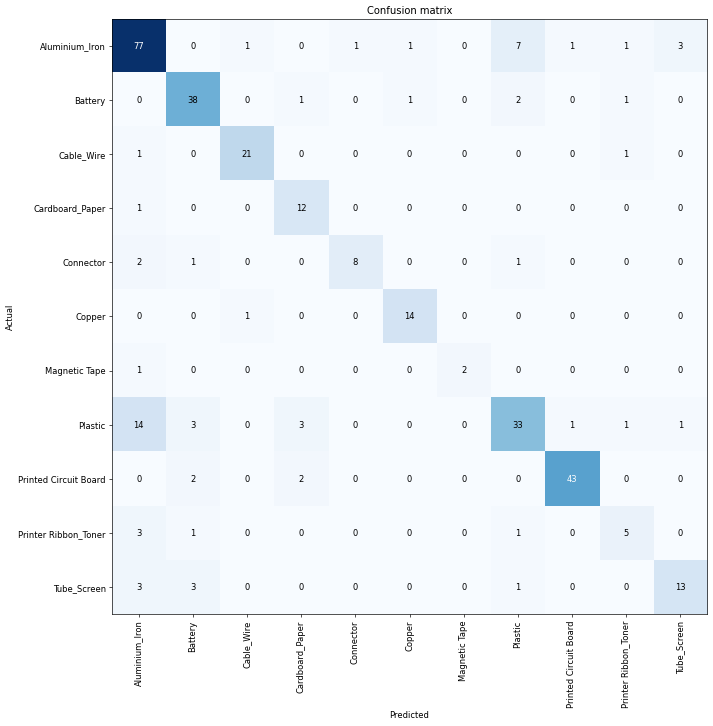

In [36]:
doc(interp.plot_top_losses)
interp.plot_confusion_matrix(figsize=(12,12), dpi=60)

In [37]:
preds = learn.get_preds()

In [38]:
print(preds[0].shape)
preds[0]

torch.Size([334, 11])


TensorBase([[9.9640e-01, 5.4068e-05, 9.0901e-07,  ..., 4.6921e-05,
             3.5033e-05, 2.2058e-05],
            [9.9986e-01, 1.0743e-04, 9.9758e-07,  ..., 1.0672e-08,
             3.6270e-06, 3.6739e-06],
            [8.3032e-01, 1.9555e-04, 3.8999e-05,  ..., 5.1205e-04,
             7.2837e-03, 6.1816e-05],
            ...,
            [8.9237e-04, 6.1719e-03, 5.8498e-06,  ..., 4.7846e-05,
             1.1428e-04, 9.8540e-01],
            [9.3574e-01, 3.3528e-05, 2.1277e-04,  ..., 4.9328e-05,
             7.3171e-06, 8.6043e-03],
            [6.7289e-05, 1.9064e-02, 2.7170e-04,  ..., 1.4580e-03,
             1.6736e-04, 9.7824e-01]])

In [39]:
labels = list(learn.dls.train_ds.items.Class.unique())
labels

['Aluminium_Iron',
 'Battery',
 'Cable_Wire',
 'Cardboard_Paper',
 'Connector',
 'Copper',
 'Magnetic Tape',
 'Plastic',
 'Printed Circuit Board',
 'Printer Ribbon_Toner',
 'Tube_Screen']

In [40]:
## saves the index of most likely (max) predicted class for each image
max_idxs = np.asarray(np.argmax(preds[0],axis=1))
max_idxs

yhat = []
for max_idx in max_idxs:
    yhat.append(labels[max_idx])

## convert POSIX paths to string first
y = []
for label_path in learn.dls.valid_ds.items.Class:
    y.append(str(label_path))

learn.dls.valid_ds.items.Class.unique()

## predicted values
print(yhat[0:5])

## actual values
print(y[0:5])

['Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron']
['Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron']


In [41]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y,yhat)
print(cm)

[[77  0  1  0  1  1  0  7  1  1  3]
 [ 0 38  0  1  0  1  0  2  0  1  0]
 [ 1  0 21  0  0  0  0  0  0  1  0]
 [ 1  0  0 12  0  0  0  0  0  0  0]
 [ 2  1  0  0  8  0  0  1  0  0  0]
 [ 0  0  1  0  0 14  0  0  0  0  0]
 [ 1  0  0  0  0  0  2  0  0  0  0]
 [14  3  0  3  0  0  0 33  1  1  1]
 [ 0  2  0  2  0  0  0  0 43  0  0]
 [ 3  1  0  0  0  0  0  1  0  5  0]
 [ 3  3  0  0  0  0  0  1  0  0 13]]


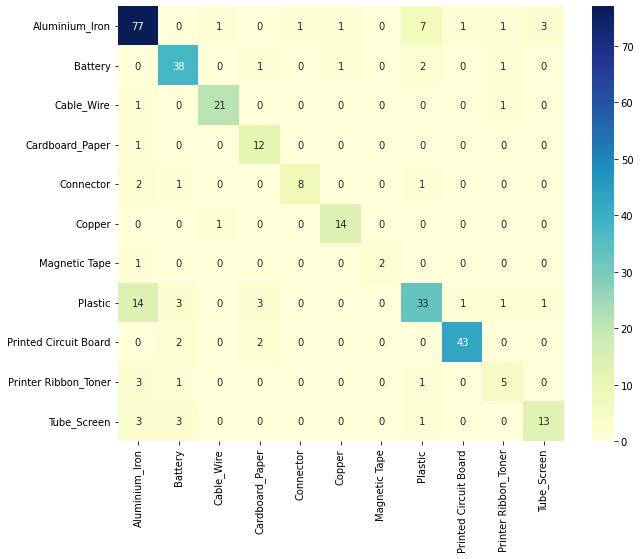

In [42]:
df_cm = pd.DataFrame(cm,learn.dls.valid_ds.items.Class.unique(),learn.dls.valid_ds.items.Class.unique())

plt.figure(figsize=(10,8))

import seaborn as sns

sns.heatmap(df_cm,annot=True,fmt="d",cmap="YlGnBu")

In [43]:
correct = 0

for r in range(len(cm)):
    for c in range(len(cm)):
        if (r==c):
            correct += cm[r,c]

accuracy = correct/sum(sum(cm))
accuracy

0.7964071856287425

## **Resnet50 (using full_segmented2)**

### Fold 0

In [17]:
fold_nbr = 0
fold_name = 'fold0'
model_name = 'resnet50'

learn = create_cnn_learner(pct_images=1, 
                           deterministic=True, 
                           size=224, 
                           img_path = '/content/gdrive/My Drive/ewaste_data/full_segmented2/',
                           split_path = '/content/gdrive/My Drive/ewaste_data/full_segmented2/',
                           model_dir = '/content/gdrive/My Drive/ewaste_data/models/option2/' + model_name + '/' + fold_name,
                           log_name = '/content/gdrive/My Drive/ewaste_data/dataframes/option2/' + model_name + '/' + fold_name + '/' + 'log_' + model_name + '_' + fold_name + '.csv',
                           oversampling=True,
                           dfs_path='/content/gdrive/My Drive/ewaste_data/dataframes/option2/' + model_name + '/' + fold_name,
                           fold=fold_nbr,
                           arch=model_name)

Random state set:101, cuda used: True
Split Path defined, preparing pseudo stratified split.
Creating path:label dataframe from /content/gdrive/My Drive/ewaste_data/full_segmented2/, using 100.00% of the images (1670 images.) Shuffle = False.
Preparing stratified 5 fold split, random state is 101. Returning fold 0.
Creating path:label dataframe from /content/gdrive/My Drive/ewaste_data/full_segmented2/, using 100.00% of the images (1670 images.) Shuffle = False.
We have 11 classes, with a training set of size 1336, and a validation set of size 334
The main split has 80.00% training data with 11 classes, the reduced split has 80.00 % training data, with 11 classes.


/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

In [18]:
learn.arch

<function torchvision.models.resnet.resnet50(*, weights: Union[torchvision.models.resnet.ResNet50_Weights, NoneType] = None, progress: bool = True, **kwargs: Any) -> torchvision.models.resnet.ResNet>

In [19]:
len(learn.dls.get_idxs())

3340

In [20]:
idxs = learn.dls.train.get_idxs()
learn.dls.train.items.iloc[idxs].Class.value_counts()

Cable_Wire               327
Aluminium_Iron           321
Plastic                  319
Printer Ribbon_Toner     311
Connector                307
Tube_Screen              302
Printed Circuit Board    297
Magnetic Tape            297
Copper                   294
Cardboard_Paper          284
Battery                  281
Name: Class, dtype: int64

Freezing model body
25,620,032 total parameters.
2,165,120 training parameters.


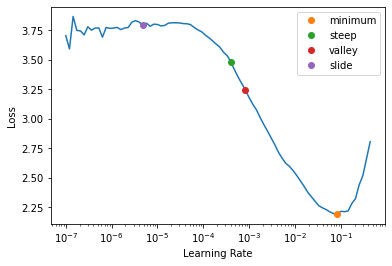

In [21]:
print(f'Freezing model body')
learn.freeze()
enumerate_params(learn)
_,_,valley_freeze,_ = learn.lr_find(suggest_funcs=(minimum, steep, valley, slide))

In [22]:
valley_freeze

0.0008317637839354575

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,error_rate,precision_score,recall_score,f1_score,time
0,2.161802,1.365055,0.574850,0.922156,0.425150,0.574850,0.574850,0.574850,00:11
1,1.104827,1.087322,0.655689,0.958084,0.344311,0.655689,0.655689,0.655689,00:11
2,0.632399,0.945112,0.709581,0.973054,0.290419,0.709581,0.709581,0.709581,00:11
3,0.407548,0.948457,0.730539,0.988024,0.269461,0.730539,0.730539,0.730539,00:11
4,0.295956,0.924118,0.748503,0.976048,0.251497,0.748503,0.748503,0.748503,00:11
5,0.213615,0.757206,0.790419,0.988024,0.209581,0.790419,0.790419,0.790419,00:11
6,0.157343,0.711924,0.805389,0.985030,0.194611,0.805389,0.805389,0.805389,00:11
7,0.131053,0.722640,0.799401,0.982036,0.200599,0.799401,0.799401,0.799401,00:10
8,0.107711,0.701999,0.799401,0.985030,0.200599,0.799401,0.799401,0.799401,00:11
9,0.096277,0.683046,0.796407,0.985030,0.203593,0.796407,0.796407,0.796407,00:11


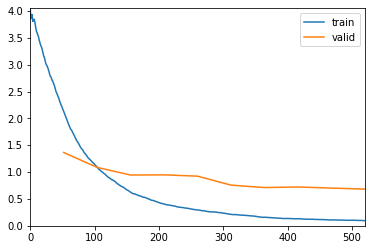

Path('/content/gdrive/My Drive/ewaste_data/models/option2/resnet50/fold0/stage-1-full_segmented2_oversampled_resnet50_fold0.pth')

In [23]:
learn.fit_one_cycle(10, lr_max=valley_freeze)
learn.save('stage-1-full_segmented2_oversampled_' + model_name + '_' + fold_name)

Unfreezing model body
25,620,032 total parameters.
25,620,032 training parameters.


SuggestedLRs(minimum=5.754399353463669e-07, steep=7.585775847473997e-07, valley=9.120108734350652e-05, slide=3.0199516913853586e-05)

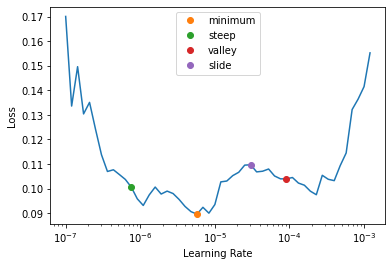

In [24]:
print(f'Unfreezing model body')
learn.unfreeze()
enumerate_params(learn)
learn.lr_find(suggest_funcs=(minimum, steep, valley, slide))

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,error_rate,precision_score,recall_score,f1_score,time
0,0.096513,0.778623,0.766467,0.979042,0.233533,0.766467,0.766467,0.766467,00:12
1,0.143201,1.059046,0.739521,0.979042,0.260479,0.739521,0.739521,0.739521,00:12
2,0.216677,1.129455,0.706587,0.967066,0.293413,0.706587,0.706587,0.706587,00:12
3,0.181085,0.879988,0.757485,0.991018,0.242515,0.757485,0.757485,0.757485,00:12
4,0.120033,0.860119,0.781437,0.985030,0.218563,0.781437,0.781437,0.781437,00:12
5,0.078869,0.822368,0.802395,0.985030,0.197605,0.802395,0.802395,0.802395,00:12
6,0.045521,0.743940,0.799401,0.988024,0.200599,0.799401,0.799401,0.799401,00:12
7,0.029091,0.788612,0.808383,0.985030,0.191617,0.808383,0.808383,0.808383,00:12
8,0.015970,0.800487,0.820359,0.985030,0.179641,0.820359,0.820359,0.820359,00:12
9,0.011820,0.777854,0.820359,0.988024,0.179641,0.820359,0.820359,0.820359,00:12


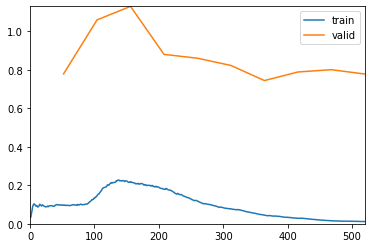

Path('/content/gdrive/My Drive/ewaste_data/models/option2/resnet50/fold0/stage-2-full_segmented2_oversampled_resnet50_fold0.pth')

In [25]:
learn.fit_one_cycle(10, lr_max=slice(5e-5, 5e-4))
learn.save('stage-2-full_segmented2_oversampled_' + model_name + '_' + fold_name)

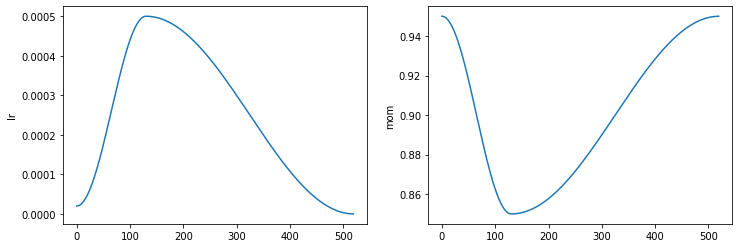

In [26]:
# In practice, we use the fit_one_cycle function, with the learning rates used representing the maximum learning rate 
# in a one cycle policy with cosine annealing, as can be seen below. 
# Note that the x-axis below represents the number of batches passed through the learner.

learn.recorder.plot_sched()

In [27]:
L(learn.recorder.values)

(#10) [[0.09651348739862442, 0.7786232233047485, 0.7664670944213867, 0.9790419340133667, 0.23353293538093567, 0.7664670658682635, 0.7664670658682635, 0.7664670658682635],[0.1432012915611267, 1.0590463876724243, 0.7395209670066833, 0.9790419340133667, 0.26047903299331665, 0.7395209580838323, 0.7395209580838323, 0.7395209580838323],[0.21667680144309998, 1.1294552087783813, 0.7065868377685547, 0.9670658707618713, 0.2934131622314453, 0.7065868263473054, 0.7065868263473054, 0.7065868263473054],[0.1810845285654068, 0.8799875378608704, 0.757485032081604, 0.9910179376602173, 0.242514967918396, 0.7574850299401198, 0.7574850299401198, 0.7574850299401198],[0.1200331524014473, 0.8601194620132446, 0.78143709897995, 0.985029935836792, 0.21856287121772766, 0.781437125748503, 0.781437125748503, 0.7814371257485029],[0.07886886596679688, 0.8223682045936584, 0.802395224571228, 0.985029935836792, 0.19760479032993317, 0.8023952095808383, 0.8023952095808383, 0.8023952095808384],[0.04552130401134491, 0.74394

In [28]:
learn.validate()

(#7) [0.7778541445732117,0.8203592896461487,0.9880239367485046,0.1796407252550125,0.8203592814371258,0.8203592814371258,0.8203592814371257]

In [29]:
learn.recorder.values[-1][2]

0.9880239367485046

In [30]:
learn.dls.vocab

['Aluminium_Iron', 'Battery', 'Cable_Wire', 'Cardboard_Paper', 'Connector', 'Copper', 'Magnetic Tape', 'Plastic', 'Printed Circuit Board', 'Printer Ribbon_Toner', 'Tube_Screen']

In [31]:
learn.load('/content/gdrive/My Drive/ewaste_data/models/option2/'+ model_name + '/' + fold_name + '/stage-2-full_segmented2_oversampled_' + model_name + '_' + fold_name)

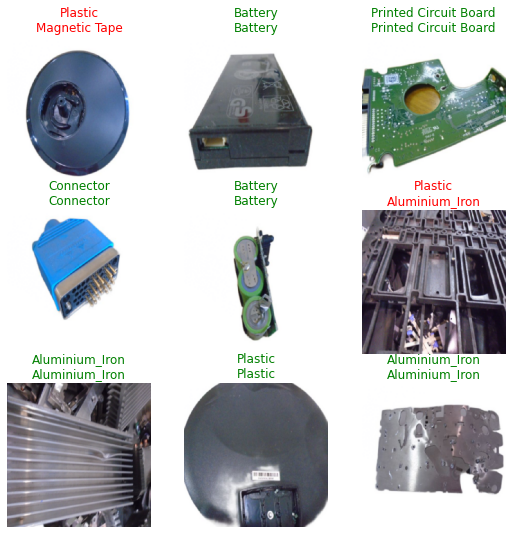

In [32]:
learn.show_results()

In [33]:
learn.dls.loss_func

FlattenedLoss of CrossEntropyLoss()

In [34]:
interp = ClassificationInterpretation.from_learner(learn)

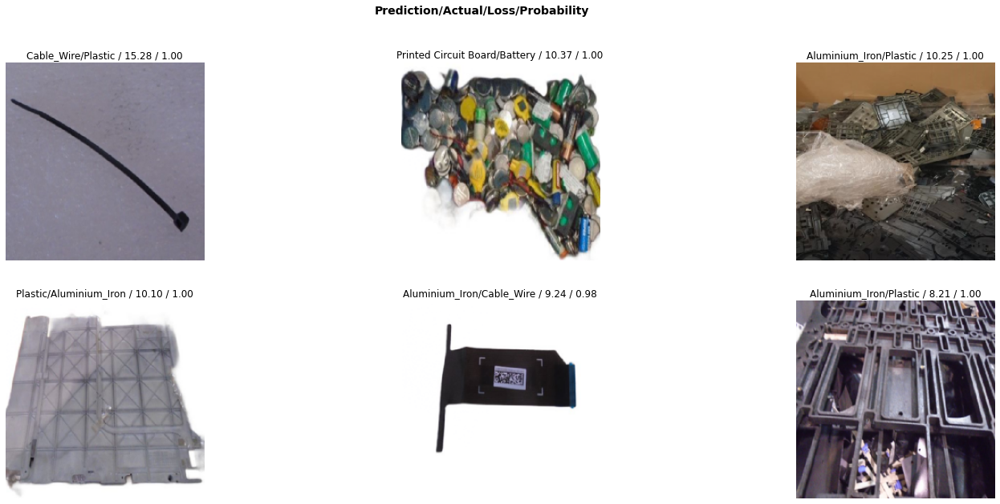

In [35]:
interp.plot_top_losses(6, figsize=(25,10))

In [36]:
interp.print_classification_report()

                       precision    recall  f1-score   support

       Aluminium_Iron       0.76      0.89      0.82        93
              Battery       0.83      0.83      0.83        42
           Cable_Wire       0.88      0.88      0.88        24
      Cardboard_Paper       0.71      0.77      0.74        13
            Connector       1.00      0.92      0.96        12
               Copper       1.00      1.00      1.00        14
        Magnetic Tape       0.80      1.00      0.89         4
              Plastic       0.78      0.64      0.70        55
Printed Circuit Board       0.95      0.85      0.90        48
 Printer Ribbon_Toner       0.75      0.60      0.67        10
          Tube_Screen       0.74      0.74      0.74        19

             accuracy                           0.82       334
            macro avg       0.84      0.83      0.83       334
         weighted avg       0.82      0.82      0.82       334



In [37]:
interp.most_confused()

[('Plastic', 'Aluminium_Iron', 13),
 ('Aluminium_Iron', 'Plastic', 6),
 ('Cable_Wire', 'Aluminium_Iron', 3),
 ('Printed Circuit Board', 'Aluminium_Iron', 3),
 ('Aluminium_Iron', 'Battery', 2),
 ('Battery', 'Aluminium_Iron', 2),
 ('Battery', 'Tube_Screen', 2),
 ('Plastic', 'Battery', 2),
 ('Printed Circuit Board', 'Tube_Screen', 2),
 ('Printer Ribbon_Toner', 'Aluminium_Iron', 2),
 ('Printer Ribbon_Toner', 'Battery', 2),
 ('Tube_Screen', 'Aluminium_Iron', 2),
 ('Aluminium_Iron', 'Cardboard_Paper', 1),
 ('Aluminium_Iron', 'Printer Ribbon_Toner', 1),
 ('Battery', 'Cardboard_Paper', 1),
 ('Battery', 'Plastic', 1),
 ('Battery', 'Printed Circuit Board', 1),
 ('Cardboard_Paper', 'Aluminium_Iron', 1),
 ('Cardboard_Paper', 'Cable_Wire', 1),
 ('Cardboard_Paper', 'Plastic', 1),
 ('Connector', 'Cable_Wire', 1),
 ('Plastic', 'Cable_Wire', 1),
 ('Plastic', 'Cardboard_Paper', 1),
 ('Plastic', 'Magnetic Tape', 1),
 ('Plastic', 'Printed Circuit Board', 1),
 ('Plastic', 'Tube_Screen', 1),
 ('Printed Circ

Interpretation.plot_top_losses(k: 'int | list', largest: 'bool' = True, **kwargs)
Show `k` largest(/smallest) preds and losses. Implementation based on type dispatch

To get a prettier result with hyperlinks to source code and documentation, install nbdev: pip install nbdev


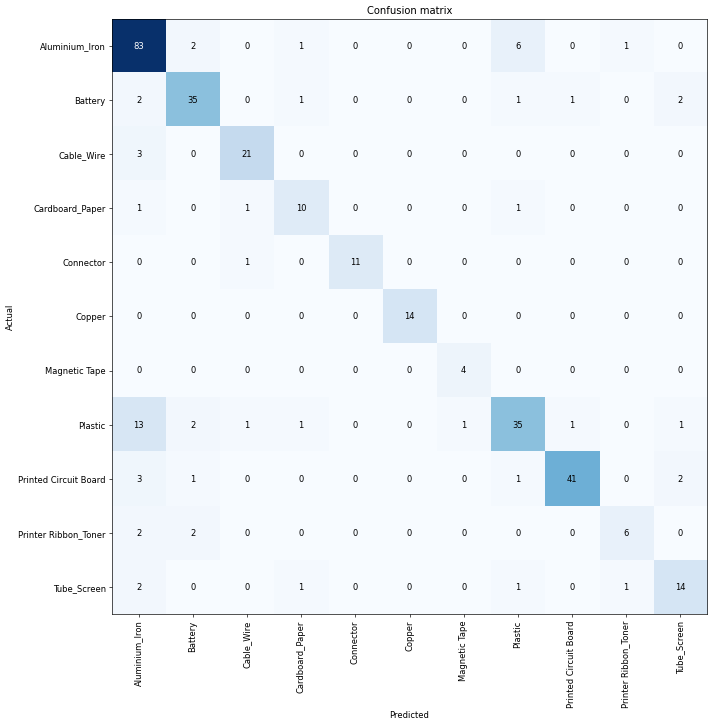

In [38]:
doc(interp.plot_top_losses)
interp.plot_confusion_matrix(figsize=(12,12), dpi=60)

In [39]:
preds = learn.get_preds()

In [40]:
print(preds[0].shape)
preds[0]

torch.Size([334, 11])


TensorBase([[9.9892e-01, 1.1813e-06, 2.7587e-07,  ..., 9.6716e-04,
             2.2123e-07, 2.0712e-05],
            [9.6453e-01, 2.7942e-05, 1.1981e-04,  ..., 5.3630e-04,
             1.5176e-05, 4.6355e-05],
            [9.9770e-01, 1.6996e-05, 2.4044e-05,  ..., 8.9953e-05,
             6.9468e-05, 7.6304e-04],
            ...,
            [2.3144e-05, 5.5047e-05, 3.1447e-06,  ..., 7.4691e-05,
             2.0629e-06, 9.9967e-01],
            [4.3586e-03, 1.9612e-02, 1.7916e-06,  ..., 2.6055e-05,
             9.8530e-07, 7.8462e-01],
            [2.8037e-05, 1.9272e-05, 1.4995e-06,  ..., 4.7733e-05,
             1.9421e-07, 9.9959e-01]])

In [41]:
labels = list(learn.dls.train_ds.items.Class.unique())
labels

['Aluminium_Iron',
 'Battery',
 'Cable_Wire',
 'Cardboard_Paper',
 'Connector',
 'Copper',
 'Magnetic Tape',
 'Plastic',
 'Printed Circuit Board',
 'Printer Ribbon_Toner',
 'Tube_Screen']

In [42]:
## saves the index of most likely (max) predicted class for each image
max_idxs = np.asarray(np.argmax(preds[0],axis=1))
max_idxs

yhat = []
for max_idx in max_idxs:
    yhat.append(labels[max_idx])

## convert POSIX paths to string first
y = []
for label_path in learn.dls.valid_ds.items.Class:
    y.append(str(label_path))

learn.dls.valid_ds.items.Class.unique()

## predicted values
print(yhat[0:5])

## actual values
print(y[0:5])

['Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron']
['Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron']


In [43]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y,yhat)
print(cm)

[[83  2  0  1  0  0  0  6  0  1  0]
 [ 2 35  0  1  0  0  0  1  1  0  2]
 [ 3  0 21  0  0  0  0  0  0  0  0]
 [ 1  0  1 10  0  0  0  1  0  0  0]
 [ 0  0  1  0 11  0  0  0  0  0  0]
 [ 0  0  0  0  0 14  0  0  0  0  0]
 [ 0  0  0  0  0  0  4  0  0  0  0]
 [13  2  1  1  0  0  1 35  1  0  1]
 [ 3  1  0  0  0  0  0  1 41  0  2]
 [ 2  2  0  0  0  0  0  0  0  6  0]
 [ 2  0  0  1  0  0  0  1  0  1 14]]


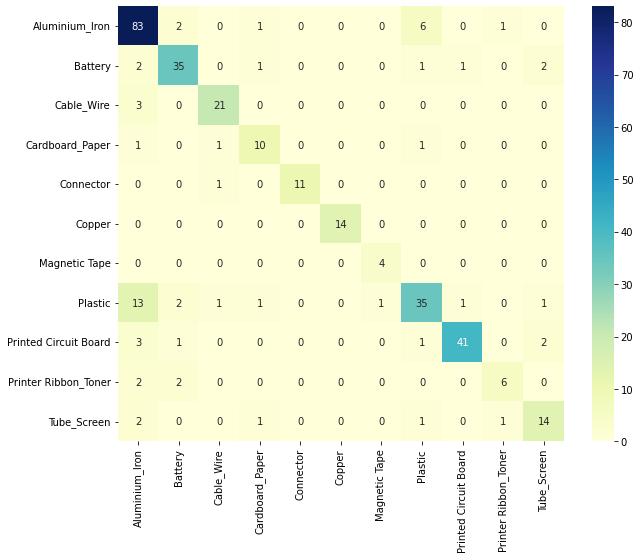

In [44]:
df_cm = pd.DataFrame(cm,learn.dls.valid_ds.items.Class.unique(),learn.dls.valid_ds.items.Class.unique())

plt.figure(figsize=(10,8))

import seaborn as sns

sns.heatmap(df_cm,annot=True,fmt="d",cmap="YlGnBu")

In [45]:
correct = 0

for r in range(len(cm)):
    for c in range(len(cm)):
        if (r==c):
            correct += cm[r,c]

accuracy = correct/sum(sum(cm))
accuracy

0.8203592814371258

### Fold 1

In [16]:
fold_nbr = 1
fold_name = 'fold1'
model_name = 'resnet50'

learn = create_cnn_learner(pct_images=1, 
                           deterministic=True, 
                           size=224, 
                           img_path = '/content/gdrive/My Drive/ewaste_data/full_segmented2/',
                           split_path = '/content/gdrive/My Drive/ewaste_data/full_segmented2/',
                           model_dir = '/content/gdrive/My Drive/ewaste_data/models/option2/' + model_name + '/' + fold_name,
                           log_name = '/content/gdrive/My Drive/ewaste_data/dataframes/option2/' + model_name + '/' + fold_name + '/' + 'log_' + model_name + '_' + fold_name + '.csv',
                           oversampling=True,
                           dfs_path='/content/gdrive/My Drive/ewaste_data/dataframes/option2/' + model_name + '/' + fold_name,
                           fold=fold_nbr,
                           arch=model_name)

Random state set:101, cuda used: True
Split Path defined, preparing pseudo stratified split.
Creating path:label dataframe from /content/gdrive/My Drive/ewaste_data/full_segmented2/, using 100.00% of the images (1670 images.) Shuffle = False.
Preparing stratified 5 fold split, random state is 101. Returning fold 1.
Creating path:label dataframe from /content/gdrive/My Drive/ewaste_data/full_segmented2/, using 100.00% of the images (1670 images.) Shuffle = False.
We have 11 classes, with a training set of size 1336, and a validation set of size 334
The main split has 80.00% training data with 11 classes, the reduced split has 80.00 % training data, with 11 classes.


/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [17]:
learn.arch

<function torchvision.models.resnet.resnet50(*, weights: Union[torchvision.models.resnet.ResNet50_Weights, NoneType] = None, progress: bool = True, **kwargs: Any) -> torchvision.models.resnet.ResNet>

In [18]:
len(learn.dls.get_idxs())

3340

In [19]:
idxs = learn.dls.train.get_idxs()
learn.dls.train.items.iloc[idxs].Class.value_counts()

Cable_Wire               327
Aluminium_Iron           321
Plastic                  319
Printer Ribbon_Toner     311
Connector                307
Tube_Screen              302
Printed Circuit Board    297
Magnetic Tape            297
Copper                   294
Cardboard_Paper          284
Battery                  281
Name: Class, dtype: int64

Freezing model body
25,620,032 total parameters.
2,165,120 training parameters.


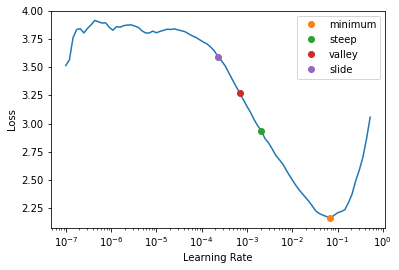

In [20]:
print(f'Freezing model body')
learn.freeze()
enumerate_params(learn)
_,_,valley_freeze,_ = learn.lr_find(suggest_funcs=(minimum, steep, valley, slide))

In [21]:
valley_freeze

0.0006918309954926372

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,error_rate,precision_score,recall_score,f1_score,time
0,2.212348,1.615927,0.523952,0.910180,0.476048,0.523952,0.523952,0.523952,00:10
1,1.172576,1.284906,0.634731,0.964072,0.365269,0.634731,0.634731,0.634731,00:11
2,0.654815,1.067752,0.700599,0.973054,0.299401,0.700599,0.700599,0.700599,00:11
3,0.417914,1.019405,0.736527,0.970060,0.263473,0.736527,0.736527,0.736527,00:10
4,0.306733,0.966298,0.724551,0.973054,0.275449,0.724551,0.724551,0.724551,00:11
5,0.219819,0.974734,0.736527,0.976048,0.263473,0.736527,0.736527,0.736527,00:11
6,0.169264,0.917409,0.739521,0.976048,0.260479,0.739521,0.739521,0.739521,00:11
7,0.140264,0.872059,0.733533,0.982036,0.266467,0.733533,0.733533,0.733533,00:11
8,0.115205,0.871350,0.745509,0.976048,0.254491,0.745509,0.745509,0.745509,00:11
9,0.105409,0.877180,0.745509,0.976048,0.254491,0.745509,0.745509,0.745509,00:11


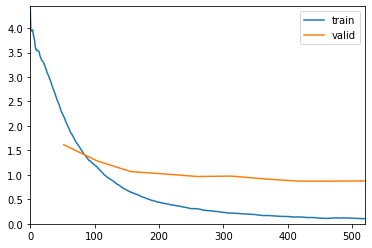

Path('/content/gdrive/My Drive/ewaste_data/models/option2/resnet50/fold1/stage-1-full_segmented2_oversampled_resnet50_fold1.pth')

In [22]:
learn.fit_one_cycle(10, lr_max=valley_freeze)
learn.save('stage-1-full_segmented2_oversampled_' + model_name + '_' + fold_name)

Unfreezing model body
25,620,032 total parameters.
25,620,032 training parameters.


SuggestedLRs(minimum=9.120108734350651e-06, steep=6.309573450380412e-07, valley=1.737800812406931e-05, slide=3.630780702224001e-05)

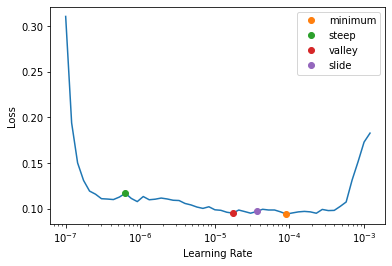

In [23]:
print(f'Unfreezing model body')
learn.unfreeze()
enumerate_params(learn)
learn.lr_find(suggest_funcs=(minimum, steep, valley, slide))

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,error_rate,precision_score,recall_score,f1_score,time
0,0.093850,0.868077,0.754491,0.973054,0.245509,0.754491,0.754491,0.754491,00:12
1,0.077238,0.867892,0.760479,0.979042,0.239521,0.760479,0.760479,0.760479,00:12
2,0.074327,0.909069,0.754491,0.973054,0.245509,0.754491,0.754491,0.754491,00:12
3,0.068488,0.902344,0.766467,0.970060,0.233533,0.766467,0.766467,0.766467,00:12
4,0.053131,0.865644,0.772455,0.979042,0.227545,0.772455,0.772455,0.772455,00:12
5,0.041052,0.884556,0.799401,0.976048,0.200599,0.799401,0.799401,0.799401,00:12
6,0.032178,0.872080,0.799401,0.979042,0.200599,0.799401,0.799401,0.799401,00:12
7,0.026744,0.910730,0.781437,0.970060,0.218563,0.781437,0.781437,0.781437,00:12
8,0.022438,0.925045,0.763473,0.970060,0.236527,0.763473,0.763473,0.763473,00:12
9,0.018966,0.909885,0.793413,0.970060,0.206587,0.793413,0.793413,0.793413,00:12


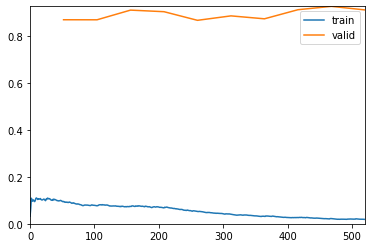

Path('/content/gdrive/My Drive/ewaste_data/models/option2/resnet50/fold1/stage-2-full_segmented2_oversampled_resnet50_fold1.pth')

In [24]:
learn.fit_one_cycle(10, lr_max=slice(1e-5, 1e-4))
learn.save('stage-2-full_segmented2_oversampled_' + model_name + '_' + fold_name)

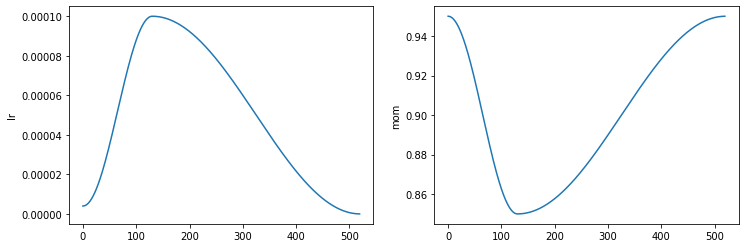

In [25]:
# In practice, we use the fit_one_cycle function, with the learning rates used representing the maximum learning rate 
# in a one cycle policy with cosine annealing, as can be seen below. 
# Note that the x-axis below represents the number of batches passed through the learner.

learn.recorder.plot_sched()

In [26]:
L(learn.recorder.values)

(#10) [[0.09384987503290176, 0.868076741695404, 0.7544910311698914, 0.9730538725852966, 0.24550898373126984, 0.7544910179640718, 0.7544910179640718, 0.7544910179640718],[0.07723784446716309, 0.8678920269012451, 0.7604790329933167, 0.9790419340133667, 0.23952095210552216, 0.7604790419161677, 0.7604790419161677, 0.7604790419161677],[0.07432687282562256, 0.9090694189071655, 0.7544910311698914, 0.9730538725852966, 0.24550898373126984, 0.7544910179640718, 0.7544910179640718, 0.7544910179640718],[0.0684877336025238, 0.9023436307907104, 0.7664670944213867, 0.970059871673584, 0.23353293538093567, 0.7664670658682635, 0.7664670658682635, 0.7664670658682635],[0.05313093215227127, 0.8656439185142517, 0.772455096244812, 0.9790419340133667, 0.227544903755188, 0.7724550898203593, 0.7724550898203593, 0.7724550898203594],[0.04105209559202194, 0.8845564126968384, 0.7994012236595154, 0.976047933101654, 0.200598806142807, 0.7994011976047904, 0.7994011976047904, 0.7994011976047903],[0.032178327441215515, 0

In [27]:
learn.validate()

(#7) [0.9098846316337585,0.7934131622314453,0.970059871673584,0.2065868228673935,0.7934131736526946,0.7934131736526946,0.7934131736526946]

In [28]:
learn.recorder.values[-1][2]

0.970059871673584

In [29]:
learn.dls.vocab

['Aluminium_Iron', 'Battery', 'Cable_Wire', 'Cardboard_Paper', 'Connector', 'Copper', 'Magnetic Tape', 'Plastic', 'Printed Circuit Board', 'Printer Ribbon_Toner', 'Tube_Screen']

In [30]:
learn.load('/content/gdrive/My Drive/ewaste_data/models/option2/'+ model_name + '/' + fold_name + '/stage-2-full_segmented2_oversampled_' + model_name + '_' + fold_name)

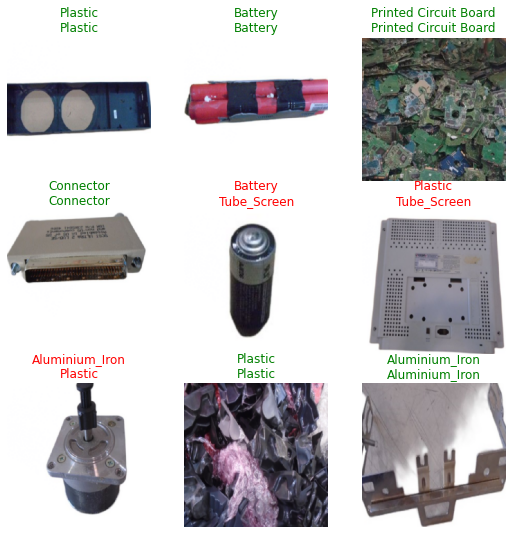

In [31]:
learn.show_results()

In [32]:
learn.dls.loss_func

FlattenedLoss of CrossEntropyLoss()

In [33]:
interp = ClassificationInterpretation.from_learner(learn)

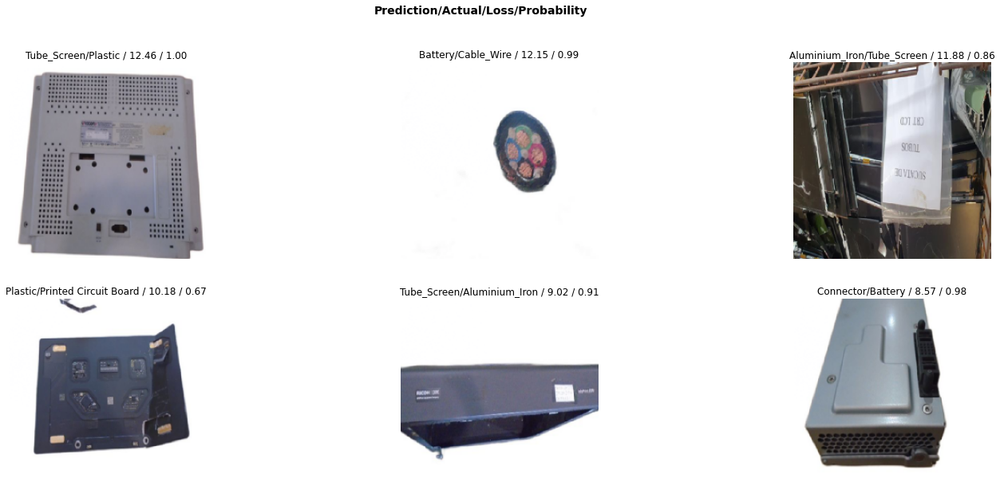

In [34]:
interp.plot_top_losses(6, figsize=(25,10))

In [35]:
interp.print_classification_report()

                       precision    recall  f1-score   support

       Aluminium_Iron       0.81      0.86      0.84        92
              Battery       0.82      0.77      0.80        43
           Cable_Wire       0.68      0.88      0.76        24
      Cardboard_Paper       0.87      1.00      0.93        13
            Connector       0.78      0.58      0.67        12
               Copper       0.93      1.00      0.97        14
        Magnetic Tape       0.60      0.75      0.67         4
              Plastic       0.66      0.56      0.61        55
Printed Circuit Board       0.89      0.87      0.88        47
 Printer Ribbon_Toner       1.00      0.73      0.84        11
          Tube_Screen       0.71      0.79      0.75        19

             accuracy                           0.79       334
            macro avg       0.80      0.80      0.79       334
         weighted avg       0.79      0.79      0.79       334



In [36]:
interp.most_confused()

[('Plastic', 'Aluminium_Iron', 14),
 ('Aluminium_Iron', 'Plastic', 6),
 ('Battery', 'Plastic', 4),
 ('Plastic', 'Tube_Screen', 4),
 ('Aluminium_Iron', 'Cable_Wire', 3),
 ('Connector', 'Printed Circuit Board', 3),
 ('Plastic', 'Cable_Wire', 3),
 ('Printed Circuit Board', 'Cable_Wire', 3),
 ('Cable_Wire', 'Battery', 2),
 ('Plastic', 'Battery', 2),
 ('Printed Circuit Board', 'Plastic', 2),
 ('Aluminium_Iron', 'Battery', 1),
 ('Aluminium_Iron', 'Cardboard_Paper', 1),
 ('Aluminium_Iron', 'Printed Circuit Board', 1),
 ('Aluminium_Iron', 'Tube_Screen', 1),
 ('Battery', 'Aluminium_Iron', 1),
 ('Battery', 'Cable_Wire', 1),
 ('Battery', 'Cardboard_Paper', 1),
 ('Battery', 'Connector', 1),
 ('Battery', 'Printed Circuit Board', 1),
 ('Battery', 'Tube_Screen', 1),
 ('Cable_Wire', 'Copper', 1),
 ('Connector', 'Aluminium_Iron', 1),
 ('Connector', 'Plastic', 1),
 ('Magnetic Tape', 'Plastic', 1),
 ('Plastic', 'Connector', 1),
 ('Printed Circuit Board', 'Battery', 1),
 ('Printer Ribbon_Toner', 'Aluminiu

Interpretation.plot_top_losses(k: 'int | list', largest: 'bool' = True, **kwargs)
Show `k` largest(/smallest) preds and losses. Implementation based on type dispatch

To get a prettier result with hyperlinks to source code and documentation, install nbdev: pip install nbdev


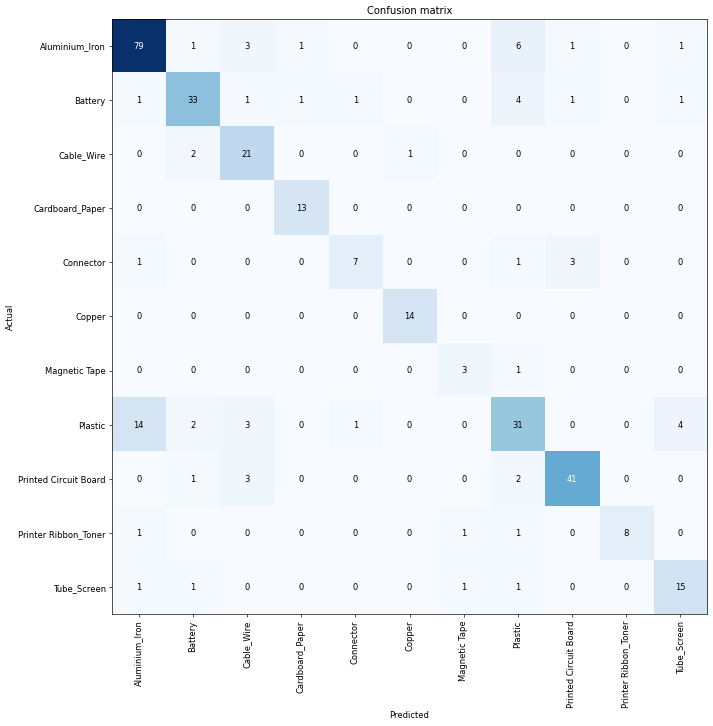

In [37]:
doc(interp.plot_top_losses)
interp.plot_confusion_matrix(figsize=(12,12), dpi=60)

In [38]:
preds = learn.get_preds()

In [39]:
print(preds[0].shape)
preds[0]

torch.Size([334, 11])


TensorBase([[9.9994e-01, 1.6044e-09, 6.0036e-07,  ..., 7.5888e-08,
             8.4417e-09, 4.7064e-08],
            [9.9669e-01, 5.9186e-06, 2.8488e-07,  ..., 7.1124e-06,
             2.1652e-07, 1.1101e-05],
            [9.8812e-01, 1.3748e-06, 2.2133e-05,  ..., 2.9584e-07,
             2.0492e-07, 1.3970e-03],
            ...,
            [1.0277e-03, 8.9884e-05, 2.3916e-06,  ..., 2.9805e-06,
             1.3769e-04, 9.9239e-01],
            [5.6765e-02, 3.1627e-02, 6.2100e-04,  ..., 3.4968e-04,
             1.0023e-01, 8.0208e-02],
            [8.5117e-02, 4.3653e-05, 1.1629e-04,  ..., 7.5282e-05,
             1.0839e-02, 8.9947e-01]])

In [40]:
labels = list(learn.dls.train_ds.items.Class.unique())
labels

['Aluminium_Iron',
 'Battery',
 'Cable_Wire',
 'Cardboard_Paper',
 'Connector',
 'Copper',
 'Magnetic Tape',
 'Plastic',
 'Printed Circuit Board',
 'Printer Ribbon_Toner',
 'Tube_Screen']

In [41]:
## saves the index of most likely (max) predicted class for each image
max_idxs = np.asarray(np.argmax(preds[0],axis=1))
max_idxs

yhat = []
for max_idx in max_idxs:
    yhat.append(labels[max_idx])

## convert POSIX paths to string first
y = []
for label_path in learn.dls.valid_ds.items.Class:
    y.append(str(label_path))

learn.dls.valid_ds.items.Class.unique()

## predicted values
print(yhat[0:5])

## actual values
print(y[0:5])

['Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron']
['Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron']


In [42]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y,yhat)
print(cm)

[[79  1  3  1  0  0  0  6  1  0  1]
 [ 1 33  1  1  1  0  0  4  1  0  1]
 [ 0  2 21  0  0  1  0  0  0  0  0]
 [ 0  0  0 13  0  0  0  0  0  0  0]
 [ 1  0  0  0  7  0  0  1  3  0  0]
 [ 0  0  0  0  0 14  0  0  0  0  0]
 [ 0  0  0  0  0  0  3  1  0  0  0]
 [14  2  3  0  1  0  0 31  0  0  4]
 [ 0  1  3  0  0  0  0  2 41  0  0]
 [ 1  0  0  0  0  0  1  1  0  8  0]
 [ 1  1  0  0  0  0  1  1  0  0 15]]


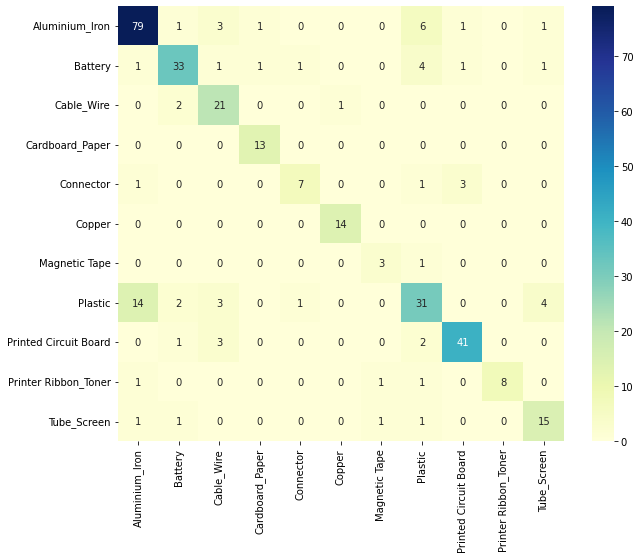

In [43]:
df_cm = pd.DataFrame(cm,learn.dls.valid_ds.items.Class.unique(),learn.dls.valid_ds.items.Class.unique())

plt.figure(figsize=(10,8))

import seaborn as sns

sns.heatmap(df_cm,annot=True,fmt="d",cmap="YlGnBu")

In [44]:
correct = 0

for r in range(len(cm)):
    for c in range(len(cm)):
        if (r==c):
            correct += cm[r,c]

accuracy = correct/sum(sum(cm))
accuracy

0.7934131736526946

### Fold 2

In [15]:
fold_nbr = 2
fold_name = 'fold2'
model_name = 'resnet50'

learn = create_cnn_learner(pct_images=1, 
                           deterministic=True, 
                           size=224, 
                           img_path = '/content/gdrive/My Drive/ewaste_data/full_segmented2/',
                           split_path = '/content/gdrive/My Drive/ewaste_data/full_segmented2/',
                           model_dir = '/content/gdrive/My Drive/ewaste_data/models/option2/' + model_name + '/' + fold_name,
                           log_name = '/content/gdrive/My Drive/ewaste_data/dataframes/option2/' + model_name + '/' + fold_name + '/' + 'log_' + model_name + '_' + fold_name + '.csv',
                           oversampling=True,
                           dfs_path='/content/gdrive/My Drive/ewaste_data/dataframes/option2/' + model_name + '/' + fold_name,
                           fold=fold_nbr,
                           arch=model_name)

Random state set:101, cuda used: True
Split Path defined, preparing pseudo stratified split.
Creating path:label dataframe from /content/gdrive/My Drive/ewaste_data/full_segmented2/, using 100.00% of the images (1670 images.) Shuffle = False.
Preparing stratified 5 fold split, random state is 101. Returning fold 2.
Creating path:label dataframe from /content/gdrive/My Drive/ewaste_data/full_segmented2/, using 100.00% of the images (1670 images.) Shuffle = False.
We have 11 classes, with a training set of size 1336, and a validation set of size 334
The main split has 80.00% training data with 11 classes, the reduced split has 80.00 % training data, with 11 classes.


/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [16]:
learn.arch

<function torchvision.models.resnet.resnet50(*, weights: Union[torchvision.models.resnet.ResNet50_Weights, NoneType] = None, progress: bool = True, **kwargs: Any) -> torchvision.models.resnet.ResNet>

In [17]:
len(learn.dls.get_idxs())

3340

In [ ]:
idxs = learn.dls.train.get_idxs()
learn.dls.train.items.iloc[idxs].Class.value_counts()

Cable_Wire               327
Aluminium_Iron           321
Plastic                  319
Printer Ribbon_Toner     311
Connector                307
Tube_Screen              302
Printed Circuit Board    297
Magnetic Tape            297
Copper                   294
Cardboard_Paper          284
Battery                  281
Name: Class, dtype: int64

Freezing model body
25,620,032 total parameters.
2,165,120 training parameters.


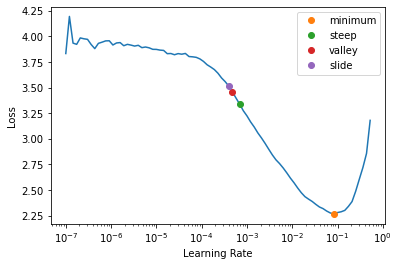

In [18]:
print(f'Freezing model body')
learn.freeze()
enumerate_params(learn)
_,_,valley_freeze,_ = learn.lr_find(suggest_funcs=(minimum, steep, valley, slide))

In [19]:
valley_freeze

0.0004786300996784121

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,error_rate,precision_score,recall_score,f1_score,time
0,2.614910,1.572078,0.494012,0.853293,0.505988,0.494012,0.494012,0.494012,00:11
1,1.377865,1.174974,0.649701,0.934132,0.350299,0.649701,0.649701,0.649701,00:11
2,0.817647,0.987420,0.700599,0.967066,0.299401,0.700599,0.700599,0.700599,00:11
3,0.523398,0.931881,0.715569,0.976048,0.284431,0.715569,0.715569,0.715569,00:11
4,0.348654,0.870520,0.721557,0.979042,0.278443,0.721557,0.721557,0.721557,00:11
5,0.275578,0.862258,0.754491,0.976048,0.245509,0.754491,0.754491,0.754491,00:11
6,0.221828,0.804340,0.736527,0.976048,0.263473,0.736527,0.736527,0.736527,00:11
7,0.185389,0.763721,0.757485,0.982036,0.242515,0.757485,0.757485,0.757485,00:11
8,0.177657,0.766374,0.754491,0.982036,0.245509,0.754491,0.754491,0.754491,00:11
9,0.163106,0.775502,0.742515,0.979042,0.257485,0.742515,0.742515,0.742515,00:11


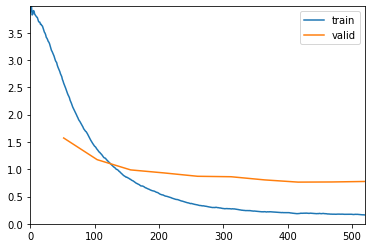

Path('/content/gdrive/My Drive/ewaste_data/models/option2/resnet50/fold2/stage-1-full_segmented2_oversampled_resnet50_fold2.pth')

In [20]:
learn.fit_one_cycle(10, lr_max=valley_freeze)
learn.save('stage-1-full_segmented2_oversampled_' + model_name + '_' + fold_name)

Unfreezing model body
25,620,032 total parameters.
25,620,032 training parameters.


SuggestedLRs(minimum=7.585775847473997e-08, steep=9.12010818865383e-07, valley=6.30957365501672e-05, slide=5.248074739938602e-05)

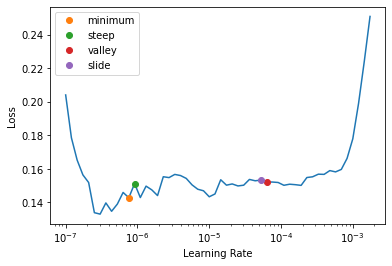

In [21]:
print(f'Unfreezing model body')
learn.unfreeze()
enumerate_params(learn)
learn.lr_find(suggest_funcs=(minimum, steep, valley, slide))

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,error_rate,precision_score,recall_score,f1_score,time
0,0.167138,0.779522,0.751497,0.979042,0.248503,0.751497,0.751497,0.751497,00:12
1,0.139296,0.733561,0.757485,0.985030,0.242515,0.757485,0.757485,0.757485,00:12
2,0.109748,0.749115,0.760479,0.988024,0.239521,0.760479,0.760479,0.760479,00:12
3,0.095947,0.734060,0.784431,0.982036,0.215569,0.784431,0.784431,0.784431,00:12
4,0.069435,0.700413,0.796407,0.988024,0.203593,0.796407,0.796407,0.796407,00:12
5,0.055171,0.755006,0.775449,0.985030,0.224551,0.775449,0.775449,0.775449,00:12
6,0.049542,0.781286,0.796407,0.982036,0.203593,0.796407,0.796407,0.796407,00:12
7,0.038694,0.782537,0.793413,0.985030,0.206587,0.793413,0.793413,0.793413,00:12
8,0.034434,0.762353,0.796407,0.985030,0.203593,0.796407,0.796407,0.796407,00:12
9,0.027999,0.740786,0.799401,0.988024,0.200599,0.799401,0.799401,0.799401,00:12


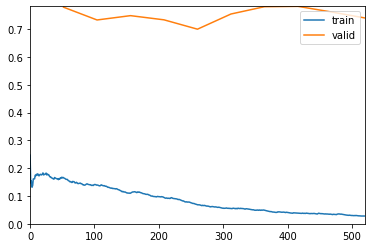

Path('/content/gdrive/My Drive/ewaste_data/models/option2/resnet50/fold2/stage-2-full_segmented2_oversampled_resnet50_fold2.pth')

In [22]:
learn.fit_one_cycle(10, lr_max=slice(1e-5, 1e-4))
learn.save('stage-2-full_segmented2_oversampled_' + model_name + '_' + fold_name)

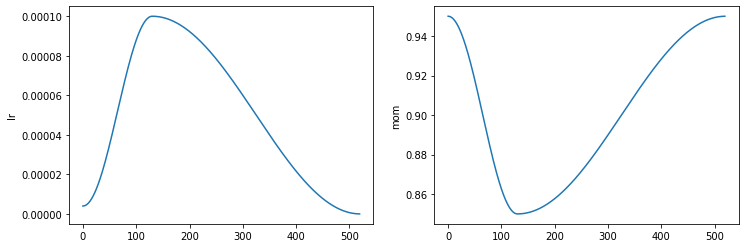

In [23]:
# In practice, we use the fit_one_cycle function, with the learning rates used representing the maximum learning rate 
# in a one cycle policy with cosine annealing, as can be seen below. 
# Note that the x-axis below represents the number of batches passed through the learner.

learn.recorder.plot_sched()

In [24]:
L(learn.recorder.values)

(#10) [[0.16713795065879822, 0.7795224785804749, 0.7514970302581787, 0.9790419340133667, 0.24850299954414368, 0.7514970059880239, 0.7514970059880239, 0.7514970059880239],[0.13929615914821625, 0.7335606813430786, 0.757485032081604, 0.985029935836792, 0.242514967918396, 0.7574850299401198, 0.7574850299401198, 0.7574850299401198],[0.10974757373332977, 0.7491147518157959, 0.7604790329933167, 0.9880239367485046, 0.23952095210552216, 0.7604790419161677, 0.7604790419161677, 0.7604790419161677],[0.09594697505235672, 0.7340599298477173, 0.7844311594963074, 0.9820359349250793, 0.21556885540485382, 0.7844311377245509, 0.7844311377245509, 0.7844311377245508],[0.06943532824516296, 0.700412929058075, 0.796407163143158, 0.9880239367485046, 0.20359280705451965, 0.7964071856287425, 0.7964071856287425, 0.7964071856287425],[0.05517135560512543, 0.7550064921379089, 0.7754490971565247, 0.985029935836792, 0.22455090284347534, 0.7754491017964071, 0.7754491017964071, 0.7754491017964071],[0.04954243823885918, 

In [25]:
learn.validate()

(#7) [0.7407858967781067,0.7994012236595154,0.9880239367485046,0.200598806142807,0.7994011976047904,0.7994011976047904,0.7994011976047903]

In [26]:
learn.recorder.values[-1][2]

0.9880239367485046

In [27]:
learn.dls.vocab

['Aluminium_Iron', 'Battery', 'Cable_Wire', 'Cardboard_Paper', 'Connector', 'Copper', 'Magnetic Tape', 'Plastic', 'Printed Circuit Board', 'Printer Ribbon_Toner', 'Tube_Screen']

In [28]:
learn.load('/content/gdrive/My Drive/ewaste_data/models/option2/'+ model_name + '/' + fold_name + '/stage-2-full_segmented2_oversampled_' + model_name + '_' + fold_name)

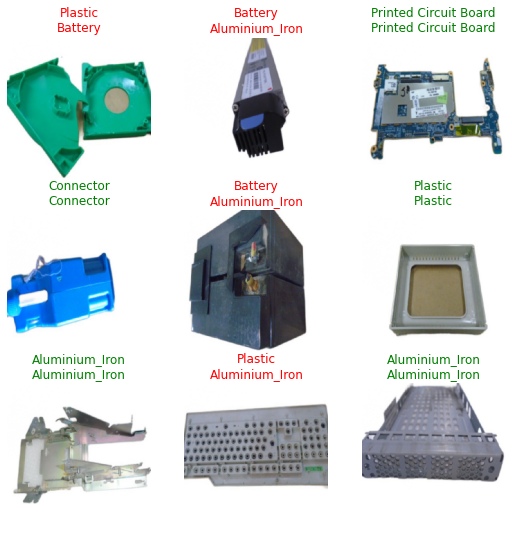

In [29]:
learn.show_results()

In [30]:
learn.dls.loss_func

FlattenedLoss of CrossEntropyLoss()

In [31]:
interp = ClassificationInterpretation.from_learner(learn)

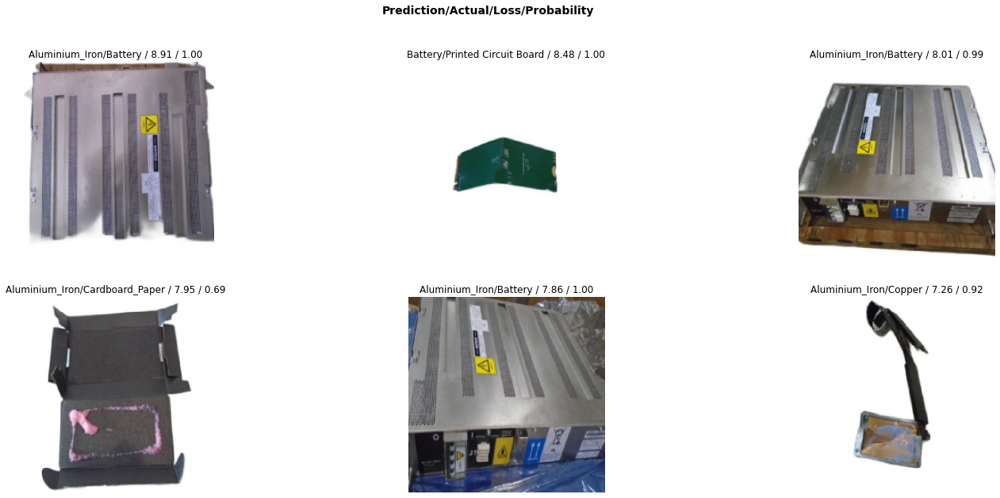

In [32]:
interp.plot_top_losses(6, figsize=(25,10))

In [33]:
interp.print_classification_report()

                       precision    recall  f1-score   support

       Aluminium_Iron       0.72      0.83      0.77        92
              Battery       0.81      0.70      0.75        43
           Cable_Wire       0.88      1.00      0.94        23
      Cardboard_Paper       0.89      0.62      0.73        13
            Connector       1.00      0.92      0.96        13
               Copper       0.92      0.86      0.89        14
        Magnetic Tape       1.00      1.00      1.00         4
              Plastic       0.69      0.62      0.65        55
Printed Circuit Board       0.92      0.98      0.95        47
 Printer Ribbon_Toner       0.73      0.80      0.76        10
          Tube_Screen       0.82      0.70      0.76        20

             accuracy                           0.80       334
            macro avg       0.85      0.82      0.83       334
         weighted avg       0.80      0.80      0.80       334



In [34]:
interp.most_confused()

[('Plastic', 'Aluminium_Iron', 14),
 ('Aluminium_Iron', 'Plastic', 7),
 ('Battery', 'Aluminium_Iron', 7),
 ('Battery', 'Plastic', 5),
 ('Cardboard_Paper', 'Aluminium_Iron', 3),
 ('Plastic', 'Battery', 3),
 ('Aluminium_Iron', 'Battery', 2),
 ('Aluminium_Iron', 'Printed Circuit Board', 2),
 ('Aluminium_Iron', 'Tube_Screen', 2),
 ('Copper', 'Aluminium_Iron', 2),
 ('Printer Ribbon_Toner', 'Aluminium_Iron', 2),
 ('Tube_Screen', 'Aluminium_Iron', 2),
 ('Tube_Screen', 'Cable_Wire', 2),
 ('Tube_Screen', 'Plastic', 2),
 ('Aluminium_Iron', 'Cable_Wire', 1),
 ('Aluminium_Iron', 'Cardboard_Paper', 1),
 ('Aluminium_Iron', 'Printer Ribbon_Toner', 1),
 ('Battery', 'Printed Circuit Board', 1),
 ('Cardboard_Paper', 'Battery', 1),
 ('Cardboard_Paper', 'Plastic', 1),
 ('Connector', 'Printer Ribbon_Toner', 1),
 ('Plastic', 'Copper', 1),
 ('Plastic', 'Printed Circuit Board', 1),
 ('Plastic', 'Printer Ribbon_Toner', 1),
 ('Plastic', 'Tube_Screen', 1),
 ('Printed Circuit Board', 'Battery', 1)]

Interpretation.plot_top_losses(k: 'int | list', largest: 'bool' = True, **kwargs)
Show `k` largest(/smallest) preds and losses. Implementation based on type dispatch

To get a prettier result with hyperlinks to source code and documentation, install nbdev: pip install nbdev


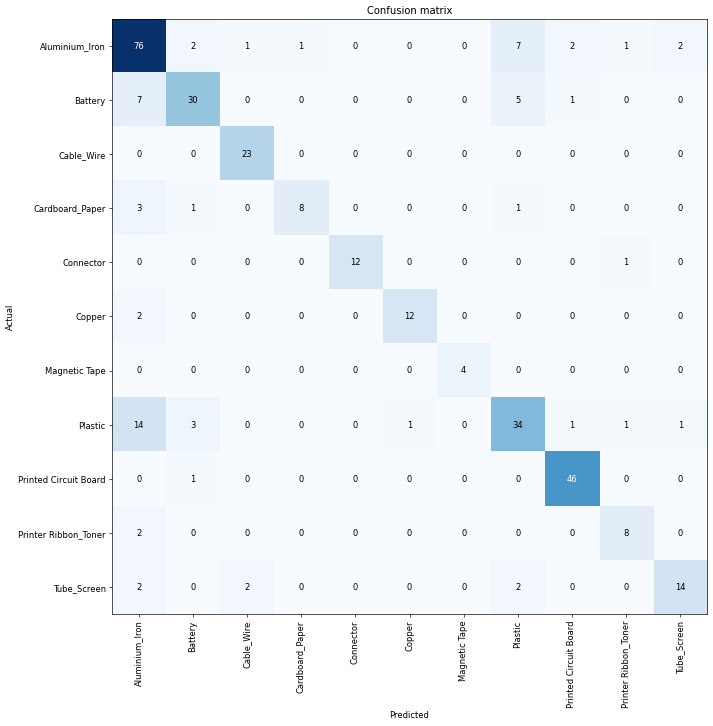

In [35]:
doc(interp.plot_top_losses)
interp.plot_confusion_matrix(figsize=(12,12), dpi=60)

In [36]:
preds = learn.get_preds()

In [37]:
print(preds[0].shape)
preds[0]

torch.Size([334, 11])


TensorBase([[5.9440e-01, 7.6780e-04, 1.9541e-04,  ..., 5.6902e-02,
             5.7644e-04, 7.5430e-02],
            [4.1417e-01, 2.6702e-02, 3.3724e-03,  ..., 1.7488e-03,
             5.1810e-02, 3.9505e-04],
            [9.3907e-01, 6.2487e-06, 1.9988e-07,  ..., 8.7085e-09,
             2.8670e-05, 9.9776e-08],
            ...,
            [5.6638e-02, 1.7964e-04, 3.4341e-05,  ..., 5.2140e-06,
             5.2812e-04, 4.3849e-01],
            [7.4681e-04, 1.5695e-02, 4.6260e-05,  ..., 3.8049e-04,
             2.2773e-03, 9.7895e-01],
            [1.9765e-02, 1.4613e-02, 7.9042e-01,  ..., 2.3720e-03,
             9.7671e-04, 7.6762e-04]])

In [38]:
labels = list(learn.dls.train_ds.items.Class.unique())
labels

['Aluminium_Iron',
 'Battery',
 'Cable_Wire',
 'Cardboard_Paper',
 'Connector',
 'Copper',
 'Magnetic Tape',
 'Plastic',
 'Printed Circuit Board',
 'Printer Ribbon_Toner',
 'Tube_Screen']

In [39]:
## saves the index of most likely (max) predicted class for each image
max_idxs = np.asarray(np.argmax(preds[0],axis=1))
max_idxs

yhat = []
for max_idx in max_idxs:
    yhat.append(labels[max_idx])

## convert POSIX paths to string first
y = []
for label_path in learn.dls.valid_ds.items.Class:
    y.append(str(label_path))

learn.dls.valid_ds.items.Class.unique()

## predicted values
print(yhat[0:5])

## actual values
print(y[0:5])

['Aluminium_Iron', 'Plastic', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron']
['Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron']


In [40]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y,yhat)
print(cm)

[[76  2  1  1  0  0  0  7  2  1  2]
 [ 7 30  0  0  0  0  0  5  1  0  0]
 [ 0  0 23  0  0  0  0  0  0  0  0]
 [ 3  1  0  8  0  0  0  1  0  0  0]
 [ 0  0  0  0 12  0  0  0  0  1  0]
 [ 2  0  0  0  0 12  0  0  0  0  0]
 [ 0  0  0  0  0  0  4  0  0  0  0]
 [14  3  0  0  0  1  0 34  1  1  1]
 [ 0  1  0  0  0  0  0  0 46  0  0]
 [ 2  0  0  0  0  0  0  0  0  8  0]
 [ 2  0  2  0  0  0  0  2  0  0 14]]


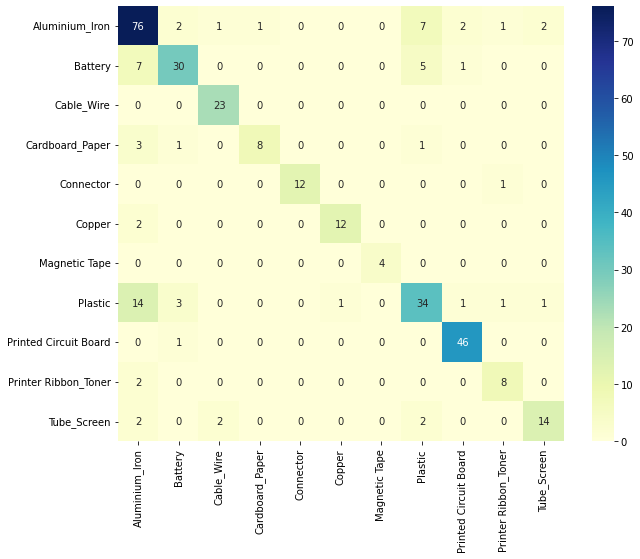

In [41]:
df_cm = pd.DataFrame(cm,learn.dls.valid_ds.items.Class.unique(),learn.dls.valid_ds.items.Class.unique())

plt.figure(figsize=(10,8))

import seaborn as sns

sns.heatmap(df_cm,annot=True,fmt="d",cmap="YlGnBu")

In [42]:
correct = 0

for r in range(len(cm)):
    for c in range(len(cm)):
        if (r==c):
            correct += cm[r,c]

accuracy = correct/sum(sum(cm))
accuracy

0.7994011976047904

### Fold 3

In [15]:
fold_nbr = 3
fold_name = 'fold3'
model_name = 'resnet50'

learn = create_cnn_learner(pct_images=1, 
                           deterministic=True, 
                           size=224, 
                           img_path = '/content/gdrive/My Drive/ewaste_data/full_segmented2/',
                           split_path = '/content/gdrive/My Drive/ewaste_data/full_segmented2/',
                           model_dir = '/content/gdrive/My Drive/ewaste_data/models/option2/' + model_name + '/' + fold_name,
                           log_name = '/content/gdrive/My Drive/ewaste_data/dataframes/option2/' + model_name + '/' + fold_name + '/' + 'log_' + model_name + '_' + fold_name + '.csv',
                           oversampling=True,
                           dfs_path='/content/gdrive/My Drive/ewaste_data/dataframes/option2/' + model_name + '/' + fold_name,
                           fold=fold_nbr,
                           arch=model_name)

Random state set:101, cuda used: True
Split Path defined, preparing pseudo stratified split.
Creating path:label dataframe from /content/gdrive/My Drive/ewaste_data/full_segmented2/, using 100.00% of the images (1670 images.) Shuffle = False.
Preparing stratified 5 fold split, random state is 101. Returning fold 3.
Creating path:label dataframe from /content/gdrive/My Drive/ewaste_data/full_segmented2/, using 100.00% of the images (1670 images.) Shuffle = False.
We have 11 classes, with a training set of size 1336, and a validation set of size 334
The main split has 80.00% training data with 11 classes, the reduced split has 80.00 % training data, with 11 classes.


/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [17]:
learn.arch

<function torchvision.models.resnet.resnet50(*, weights: Union[torchvision.models.resnet.ResNet50_Weights, NoneType] = None, progress: bool = True, **kwargs: Any) -> torchvision.models.resnet.ResNet>

In [18]:
len(learn.dls.get_idxs())

3340

In [19]:
idxs = learn.dls.train.get_idxs()
learn.dls.train.items.iloc[idxs].Class.value_counts()

Cable_Wire               327
Aluminium_Iron           321
Plastic                  319
Printer Ribbon_Toner     311
Connector                307
Tube_Screen              302
Printed Circuit Board    297
Magnetic Tape            297
Copper                   294
Cardboard_Paper          284
Battery                  281
Name: Class, dtype: int64

Freezing model body
25,620,032 total parameters.
2,165,120 training parameters.


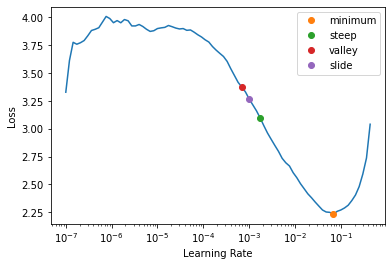

In [20]:
print(f'Freezing model body')
learn.freeze()
enumerate_params(learn)
_,_,valley_freeze,_ = learn.lr_find(suggest_funcs=(minimum, steep, valley, slide))

In [21]:
valley_freeze

0.0006918309954926372

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,error_rate,precision_score,recall_score,f1_score,time
0,2.307124,1.401111,0.574850,0.925150,0.425150,0.574850,0.574850,0.574850,00:12
1,1.202209,0.968982,0.685629,0.964072,0.314371,0.685629,0.685629,0.685629,00:11
2,0.715859,0.939445,0.748503,0.982036,0.251497,0.748503,0.748503,0.748503,00:11
3,0.457295,0.819371,0.739521,0.982036,0.260479,0.739521,0.739521,0.739521,00:11
4,0.320054,0.775253,0.775449,0.976048,0.224551,0.775449,0.775449,0.775449,00:11
5,0.241091,0.734983,0.784431,0.985030,0.215569,0.784431,0.784431,0.784431,00:11
6,0.173378,0.671804,0.799401,0.979042,0.200599,0.799401,0.799401,0.799401,00:11
7,0.150148,0.690202,0.793413,0.979042,0.206587,0.793413,0.793413,0.793413,00:11
8,0.124934,0.689371,0.793413,0.976048,0.206587,0.793413,0.793413,0.793413,00:11
9,0.104057,0.676407,0.793413,0.979042,0.206587,0.793413,0.793413,0.793413,00:11


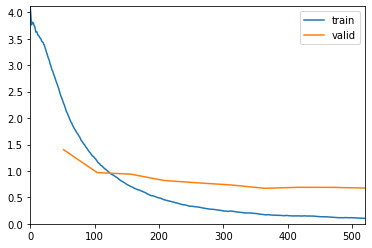

Path('/content/gdrive/My Drive/ewaste_data/models/option2/resnet50/fold3/stage-1-full_segmented2_oversampled_resnet50_fold3.pth')

In [22]:
learn.fit_one_cycle(10, lr_max=valley_freeze)
learn.save('stage-1-full_segmented2_oversampled_' + model_name + '_' + fold_name)

Unfreezing model body
25,620,032 total parameters.
25,620,032 training parameters.


SuggestedLRs(minimum=1.9054607491852948e-07, steep=1.3182567499825382e-06, valley=9.120108734350652e-05, slide=3.630780702224001e-05)

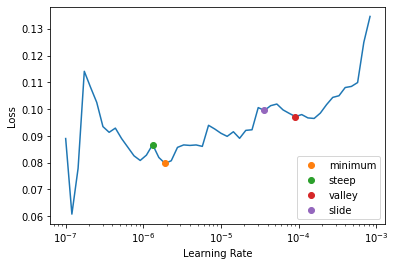

In [23]:
print(f'Unfreezing model body')
learn.unfreeze()
enumerate_params(learn)
learn.lr_find(suggest_funcs=(minimum, steep, valley, slide))

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,error_rate,precision_score,recall_score,f1_score,time
0,0.099843,0.672256,0.793413,0.982036,0.206587,0.793413,0.793413,0.793413,00:12
1,0.092758,0.752161,0.784431,0.976048,0.215569,0.784431,0.784431,0.784431,00:12
2,0.088578,0.736384,0.796407,0.982036,0.203593,0.796407,0.796407,0.796407,00:12
3,0.075188,0.737772,0.784431,0.982036,0.215569,0.784431,0.784431,0.784431,00:12
4,0.054805,0.627902,0.841317,0.985030,0.158683,0.841317,0.841317,0.841317,00:12
5,0.044759,0.652606,0.811377,0.979042,0.188623,0.811377,0.811377,0.811377,00:12
6,0.029340,0.676783,0.823353,0.976048,0.176647,0.823353,0.823353,0.823353,00:12
7,0.026732,0.658994,0.835329,0.976048,0.164671,0.835329,0.835329,0.835329,00:12
8,0.021537,0.655704,0.832335,0.979042,0.167665,0.832335,0.832335,0.832335,00:12
9,0.019801,0.658438,0.823353,0.973054,0.176647,0.823353,0.823353,0.823353,00:12


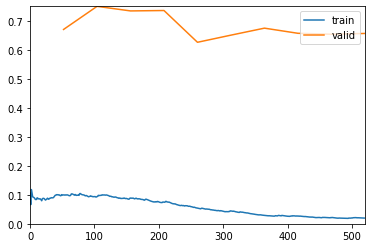

Path('/content/gdrive/My Drive/ewaste_data/models/option2/resnet50/fold3/stage-2-full_segmented2_oversampled_resnet50_fold3.pth')

In [24]:
learn.fit_one_cycle(10, lr_max=slice(1e-5, 1e-4))
learn.save('stage-2-full_segmented2_oversampled_' + model_name + '_' + fold_name)

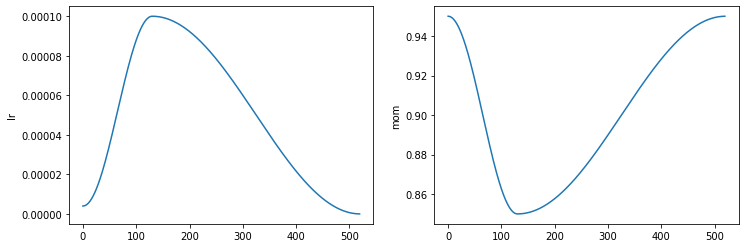

In [25]:
# In practice, we use the fit_one_cycle function, with the learning rates used representing the maximum learning rate 
# in a one cycle policy with cosine annealing, as can be seen below. 
# Note that the x-axis below represents the number of batches passed through the learner.

learn.recorder.plot_sched()

In [26]:
L(learn.recorder.values)

(#10) [[0.09984257817268372, 0.6722561717033386, 0.7934131622314453, 0.9820359349250793, 0.2065868228673935, 0.7934131736526946, 0.7934131736526946, 0.7934131736526946],[0.09275809675455093, 0.7521608471870422, 0.7844311594963074, 0.976047933101654, 0.21556885540485382, 0.7844311377245509, 0.7844311377245509, 0.7844311377245508],[0.0885784700512886, 0.7363842129707336, 0.796407163143158, 0.9820359349250793, 0.20359280705451965, 0.7964071856287425, 0.7964071856287425, 0.7964071856287425],[0.07518832385540009, 0.7377722263336182, 0.7844311594963074, 0.9820359349250793, 0.21556885540485382, 0.7844311377245509, 0.7844311377245509, 0.7844311377245508],[0.05480512976646423, 0.627901554107666, 0.841317355632782, 0.985029935836792, 0.15868262946605682, 0.8413173652694611, 0.8413173652694611, 0.8413173652694611],[0.044759172946214676, 0.6526057720184326, 0.811377227306366, 0.9790419340133667, 0.18862275779247284, 0.811377245508982, 0.811377245508982, 0.811377245508982],[0.02934015914797783, 0.6

In [27]:
learn.validate()

(#7) [0.6584381461143494,0.8233532905578613,0.9730538725852966,0.17664670944213867,0.8233532934131736,0.8233532934131736,0.8233532934131736]

In [28]:
learn.recorder.values[-1][2]

0.9730538725852966

In [29]:
learn.dls.vocab

['Aluminium_Iron', 'Battery', 'Cable_Wire', 'Cardboard_Paper', 'Connector', 'Copper', 'Magnetic Tape', 'Plastic', 'Printed Circuit Board', 'Printer Ribbon_Toner', 'Tube_Screen']

In [30]:
learn.load('/content/gdrive/My Drive/ewaste_data/models/option2/'+ model_name + '/' + fold_name + '/stage-2-full_segmented2_oversampled_' + model_name + '_' + fold_name)

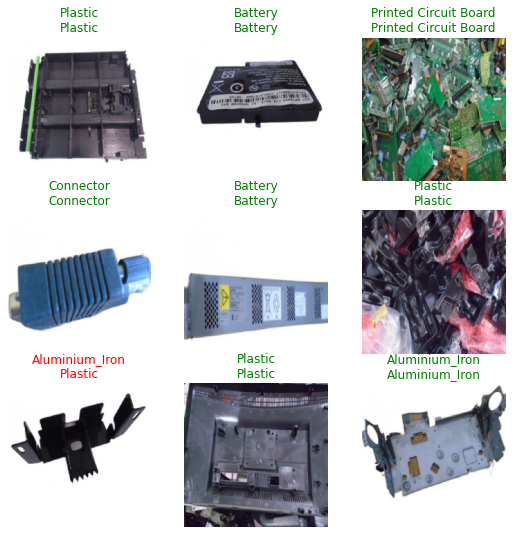

In [31]:
learn.show_results()

In [32]:
learn.dls.loss_func

FlattenedLoss of CrossEntropyLoss()

In [33]:
interp = ClassificationInterpretation.from_learner(learn)

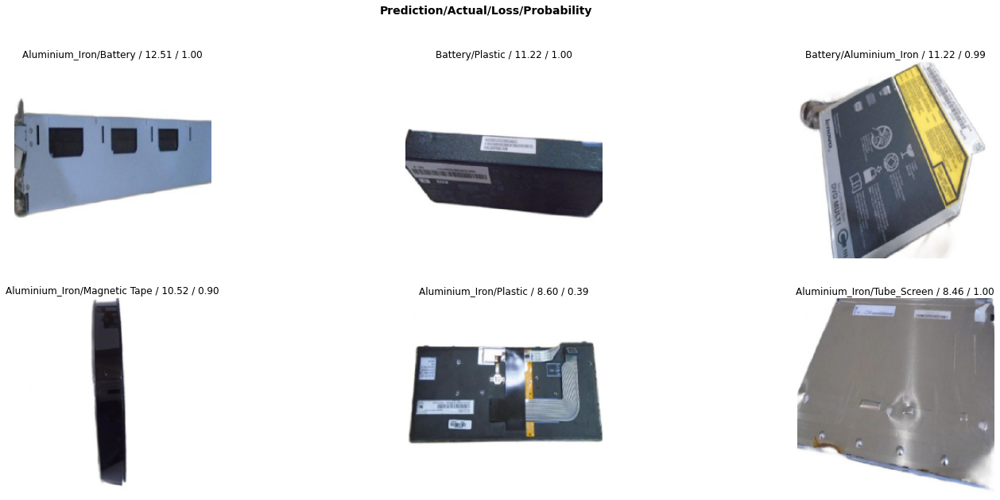

In [35]:
interp.plot_top_losses(6, figsize=(25,10))

In [36]:
interp.print_classification_report()

                       precision    recall  f1-score   support

       Aluminium_Iron       0.83      0.77      0.80        92
              Battery       0.74      0.86      0.80        43
           Cable_Wire       0.95      0.91      0.93        23
      Cardboard_Paper       0.73      0.85      0.79        13
            Connector       1.00      1.00      1.00        13
               Copper       0.86      0.86      0.86        14
        Magnetic Tape       1.00      0.50      0.67         4
              Plastic       0.70      0.69      0.70        55
Printed Circuit Board       0.98      0.96      0.97        47
 Printer Ribbon_Toner       0.73      0.80      0.76        10
          Tube_Screen       0.81      0.85      0.83        20

             accuracy                           0.82       334
            macro avg       0.85      0.82      0.83       334
         weighted avg       0.83      0.82      0.82       334



In [37]:
interp.most_confused()

[('Aluminium_Iron', 'Plastic', 12),
 ('Plastic', 'Aluminium_Iron', 7),
 ('Plastic', 'Battery', 6),
 ('Aluminium_Iron', 'Battery', 5),
 ('Aluminium_Iron', 'Tube_Screen', 3),
 ('Battery', 'Aluminium_Iron', 2),
 ('Battery', 'Cardboard_Paper', 2),
 ('Battery', 'Printer Ribbon_Toner', 2),
 ('Tube_Screen', 'Aluminium_Iron', 2),
 ('Aluminium_Iron', 'Cardboard_Paper', 1),
 ('Cable_Wire', 'Aluminium_Iron', 1),
 ('Cable_Wire', 'Copper', 1),
 ('Cardboard_Paper', 'Battery', 1),
 ('Cardboard_Paper', 'Plastic', 1),
 ('Copper', 'Aluminium_Iron', 1),
 ('Copper', 'Printed Circuit Board', 1),
 ('Magnetic Tape', 'Aluminium_Iron', 1),
 ('Magnetic Tape', 'Plastic', 1),
 ('Plastic', 'Cable_Wire', 1),
 ('Plastic', 'Cardboard_Paper', 1),
 ('Plastic', 'Copper', 1),
 ('Plastic', 'Printer Ribbon_Toner', 1),
 ('Printed Circuit Board', 'Battery', 1),
 ('Printed Circuit Board', 'Tube_Screen', 1),
 ('Printer Ribbon_Toner', 'Aluminium_Iron', 1),
 ('Printer Ribbon_Toner', 'Plastic', 1),
 ('Tube_Screen', 'Plastic', 1)]

Interpretation.plot_top_losses(k: 'int | list', largest: 'bool' = True, **kwargs)
Show `k` largest(/smallest) preds and losses. Implementation based on type dispatch

To get a prettier result with hyperlinks to source code and documentation, install nbdev: pip install nbdev


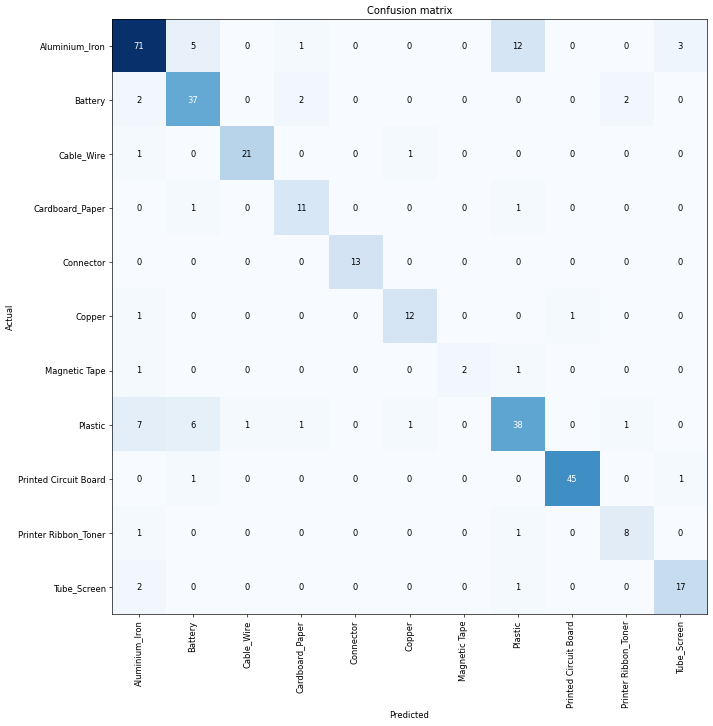

In [38]:
doc(interp.plot_top_losses)
interp.plot_confusion_matrix(figsize=(12,12), dpi=60)

In [39]:
preds = learn.get_preds()

In [40]:
print(preds[0].shape)
preds[0]

torch.Size([334, 11])


TensorBase([[9.7341e-01, 2.4704e-06, 2.8089e-06,  ..., 1.0752e-05,
             5.8488e-07, 7.6504e-06],
            [9.9992e-01, 3.8690e-07, 4.4943e-07,  ..., 2.6993e-06,
             5.6117e-07, 5.7783e-06],
            [8.3077e-01, 5.9023e-02, 9.6793e-05,  ..., 7.3533e-06,
             3.8280e-05, 5.6267e-03],
            ...,
            [4.7561e-07, 9.1603e-06, 1.0451e-07,  ..., 1.2775e-07,
             1.5845e-08, 9.9993e-01],
            [1.0103e-02, 2.3826e-02, 2.5674e-04,  ..., 1.0313e-03,
             6.2039e-04, 9.2228e-01],
            [1.1374e-05, 4.0757e-03, 2.2407e-06,  ..., 2.8703e-04,
             2.0874e-06, 9.9559e-01]])

In [41]:
labels = list(learn.dls.train_ds.items.Class.unique())
labels

['Aluminium_Iron',
 'Battery',
 'Cable_Wire',
 'Cardboard_Paper',
 'Connector',
 'Copper',
 'Magnetic Tape',
 'Plastic',
 'Printed Circuit Board',
 'Printer Ribbon_Toner',
 'Tube_Screen']

In [42]:
## saves the index of most likely (max) predicted class for each image
max_idxs = np.asarray(np.argmax(preds[0],axis=1))
max_idxs

yhat = []
for max_idx in max_idxs:
    yhat.append(labels[max_idx])

## convert POSIX paths to string first
y = []
for label_path in learn.dls.valid_ds.items.Class:
    y.append(str(label_path))

learn.dls.valid_ds.items.Class.unique()

## predicted values
print(yhat[0:5])

## actual values
print(y[0:5])

['Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Battery', 'Aluminium_Iron']
['Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron']


In [43]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y,yhat)
print(cm)

[[71  5  0  1  0  0  0 12  0  0  3]
 [ 2 37  0  2  0  0  0  0  0  2  0]
 [ 1  0 21  0  0  1  0  0  0  0  0]
 [ 0  1  0 11  0  0  0  1  0  0  0]
 [ 0  0  0  0 13  0  0  0  0  0  0]
 [ 1  0  0  0  0 12  0  0  1  0  0]
 [ 1  0  0  0  0  0  2  1  0  0  0]
 [ 7  6  1  1  0  1  0 38  0  1  0]
 [ 0  1  0  0  0  0  0  0 45  0  1]
 [ 1  0  0  0  0  0  0  1  0  8  0]
 [ 2  0  0  0  0  0  0  1  0  0 17]]


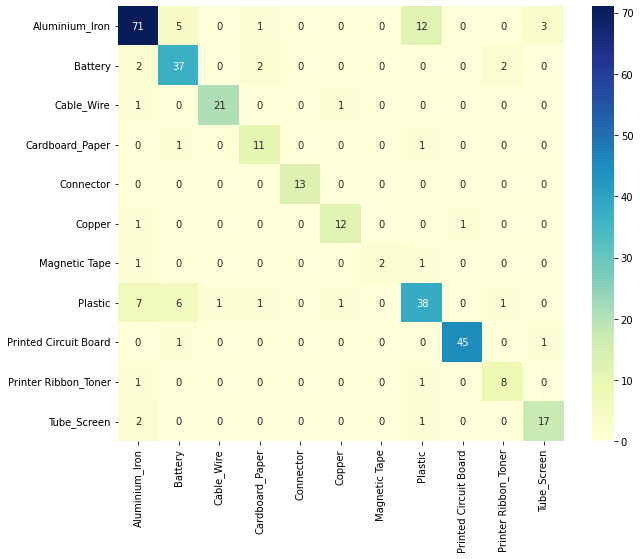

In [44]:
df_cm = pd.DataFrame(cm,learn.dls.valid_ds.items.Class.unique(),learn.dls.valid_ds.items.Class.unique())

plt.figure(figsize=(10,8))

import seaborn as sns

sns.heatmap(df_cm,annot=True,fmt="d",cmap="YlGnBu")

In [45]:
correct = 0

for r in range(len(cm)):
    for c in range(len(cm)):
        if (r==c):
            correct += cm[r,c]

accuracy = correct/sum(sum(cm))
accuracy

0.8233532934131736

### Fold 4

In [14]:
fold_nbr = 4
fold_name = 'fold4'
model_name = 'resnet50'

learn = create_cnn_learner(pct_images=1, 
                           deterministic=True, 
                           size=224, 
                           img_path = '/content/gdrive/My Drive/ewaste_data/full_segmented2/',
                           split_path = '/content/gdrive/My Drive/ewaste_data/full_segmented2/',
                           model_dir = '/content/gdrive/My Drive/ewaste_data/models/option2/' + model_name + '/' + fold_name,
                           log_name = '/content/gdrive/My Drive/ewaste_data/dataframes/option2/' + model_name + '/' + fold_name + '/' + 'log_' + model_name + '_' + fold_name + '.csv',
                           oversampling=True,
                           dfs_path='/content/gdrive/My Drive/ewaste_data/dataframes/option2/' + model_name + '/' + fold_name,
                           fold=fold_nbr,
                           arch=model_name)

Random state set:101, cuda used: True
Split Path defined, preparing pseudo stratified split.
Creating path:label dataframe from /content/gdrive/My Drive/ewaste_data/full_segmented2/, using 100.00% of the images (1670 images.) Shuffle = False.
Preparing stratified 5 fold split, random state is 101. Returning fold 4.
Creating path:label dataframe from /content/gdrive/My Drive/ewaste_data/full_segmented2/, using 100.00% of the images (1670 images.) Shuffle = False.
We have 11 classes, with a training set of size 1336, and a validation set of size 334
The main split has 80.00% training data with 11 classes, the reduced split has 80.00 % training data, with 11 classes.


/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [15]:
learn.arch

<function torchvision.models.resnet.resnet50(*, weights: Union[torchvision.models.resnet.ResNet50_Weights, NoneType] = None, progress: bool = True, **kwargs: Any) -> torchvision.models.resnet.ResNet>

In [16]:
len(learn.dls.get_idxs())

3340

In [17]:
idxs = learn.dls.train.get_idxs()
learn.dls.train.items.iloc[idxs].Class.value_counts()

Cable_Wire               327
Aluminium_Iron           321
Plastic                  319
Printer Ribbon_Toner     311
Connector                307
Tube_Screen              302
Printed Circuit Board    297
Magnetic Tape            297
Copper                   294
Cardboard_Paper          284
Battery                  281
Name: Class, dtype: int64

Freezing model body
25,620,032 total parameters.
2,165,120 training parameters.


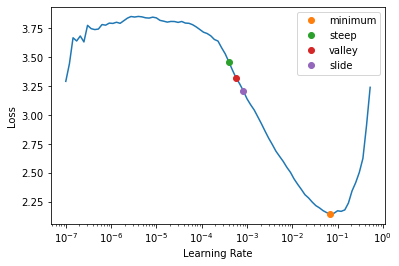

In [18]:
print(f'Freezing model body')
learn.freeze()
enumerate_params(learn)
_,_,valley_freeze,_ = learn.lr_find(suggest_funcs=(minimum, steep, valley, slide))

In [19]:
valley_freeze

0.0005754399462603033

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,error_rate,precision_score,recall_score,f1_score,time
0,2.385199,1.739269,0.494012,0.877245,0.505988,0.494012,0.494012,0.494012,00:11
1,1.292075,1.268934,0.625749,0.949102,0.374251,0.625749,0.625749,0.625749,00:11
2,0.730666,1.053065,0.673653,0.985030,0.326347,0.673653,0.673653,0.673653,00:10
3,0.472600,0.969922,0.700599,0.982036,0.299401,0.700599,0.700599,0.700599,00:11
4,0.318594,0.961980,0.730539,0.979042,0.269461,0.730539,0.730539,0.730539,00:11
5,0.239250,0.889690,0.757485,0.982036,0.242515,0.757485,0.757485,0.757485,00:11
6,0.184917,0.830200,0.763473,0.982036,0.236527,0.763473,0.763473,0.763473,00:11
7,0.151968,0.865596,0.757485,0.979042,0.242515,0.757485,0.757485,0.757485,00:11
8,0.130197,0.856582,0.763473,0.982036,0.236527,0.763473,0.763473,0.763473,00:11
9,0.119630,0.848506,0.757485,0.979042,0.242515,0.757485,0.757485,0.757485,00:11


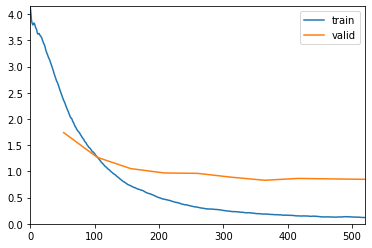

Path('/content/gdrive/My Drive/ewaste_data/models/option2/resnet50/fold4/stage-1-full_segmented2_oversampled_resnet50_fold4.pth')

In [20]:
learn.fit_one_cycle(10, lr_max=valley_freeze)
learn.save('stage-1-full_segmented2_oversampled_' + model_name + '_' + fold_name)

Unfreezing model body
25,620,032 total parameters.
25,620,032 training parameters.


SuggestedLRs(minimum=1.9054606673307718e-05, steep=6.309573450380412e-07, valley=3.630780702224001e-05, slide=3.0199516913853586e-05)

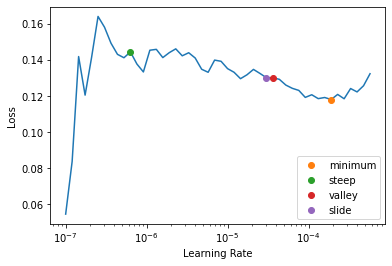

In [21]:
print(f'Unfreezing model body')
learn.unfreeze()
enumerate_params(learn)
learn.lr_find(suggest_funcs=(minimum, steep, valley, slide))

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,error_rate,precision_score,recall_score,f1_score,time
0,0.111755,0.856790,0.748503,0.988024,0.251497,0.748503,0.748503,0.748503,00:12
1,0.103491,0.886968,0.760479,0.982036,0.239521,0.760479,0.760479,0.760479,00:12
2,0.086129,0.883590,0.763473,0.979042,0.236527,0.763473,0.763473,0.763473,00:12
3,0.072210,0.883248,0.769461,0.973054,0.230539,0.769461,0.769461,0.769461,00:11
4,0.059846,0.948057,0.784431,0.973054,0.215569,0.784431,0.784431,0.784431,00:12
5,0.048497,0.914423,0.778443,0.976048,0.221557,0.778443,0.778443,0.778443,00:11
6,0.039369,0.909719,0.775449,0.973054,0.224551,0.775449,0.775449,0.775449,00:12
7,0.031413,0.922579,0.790419,0.979042,0.209581,0.790419,0.790419,0.790419,00:11
8,0.024178,0.915565,0.784431,0.976048,0.215569,0.784431,0.784431,0.784431,00:12
9,0.025519,0.902327,0.787425,0.979042,0.212575,0.787425,0.787425,0.787425,00:11


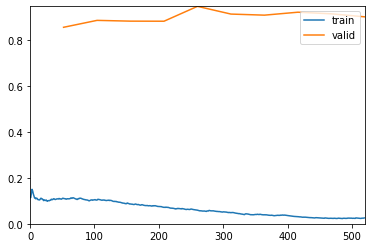

Path('/content/gdrive/My Drive/ewaste_data/models/option2/resnet50/fold4/stage-2-full_segmented2_oversampled_resnet50_fold4.pth')

In [22]:
learn.fit_one_cycle(10, lr_max=slice(1e-5, 1e-4))
learn.save('stage-2-full_segmented2_oversampled_' + model_name + '_' + fold_name)

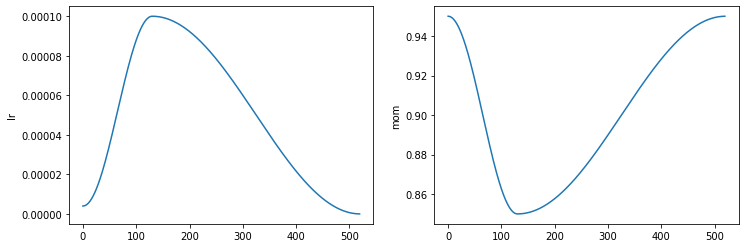

In [23]:
# In practice, we use the fit_one_cycle function, with the learning rates used representing the maximum learning rate 
# in a one cycle policy with cosine annealing, as can be seen below. 
# Note that the x-axis below represents the number of batches passed through the learner.

learn.recorder.plot_sched()

In [24]:
L(learn.recorder.values)

(#10) [[0.11175527423620224, 0.8567901253700256, 0.7485029697418213, 0.9880239367485046, 0.2514970004558563, 0.7485029940119761, 0.7485029940119761, 0.7485029940119761],[0.10349142551422119, 0.8869677186012268, 0.7604790329933167, 0.9820359349250793, 0.23952095210552216, 0.7604790419161677, 0.7604790419161677, 0.7604790419161677],[0.08612874895334244, 0.8835898041725159, 0.7634730339050293, 0.9790419340133667, 0.2365269511938095, 0.7634730538922155, 0.7634730538922155, 0.7634730538922155],[0.0722096711397171, 0.8832478523254395, 0.7694610953330994, 0.9730538725852966, 0.23053891956806183, 0.7694610778443114, 0.7694610778443114, 0.7694610778443114],[0.05984582006931305, 0.9480574131011963, 0.7844311594963074, 0.9730538725852966, 0.21556885540485382, 0.7844311377245509, 0.7844311377245509, 0.7844311377245508],[0.04849692061543465, 0.9144225716590881, 0.7784430980682373, 0.976047933101654, 0.2215568870306015, 0.7784431137724551, 0.7784431137724551, 0.7784431137724551],[0.0393686406314373,

In [25]:
learn.validate()

(#7) [0.9023270010948181,0.78742516040802,0.9790419340133667,0.21257485449314117,0.7874251497005988,0.7874251497005988,0.7874251497005988]

In [26]:
learn.recorder.values[-1][2]

0.9790419340133667

In [27]:
learn.dls.vocab

['Aluminium_Iron', 'Battery', 'Cable_Wire', 'Cardboard_Paper', 'Connector', 'Copper', 'Magnetic Tape', 'Plastic', 'Printed Circuit Board', 'Printer Ribbon_Toner', 'Tube_Screen']

In [28]:
learn.load('/content/gdrive/My Drive/ewaste_data/models/option2/'+ model_name + '/' + fold_name + '/stage-2-full_segmented2_oversampled_' + model_name + '_' + fold_name)

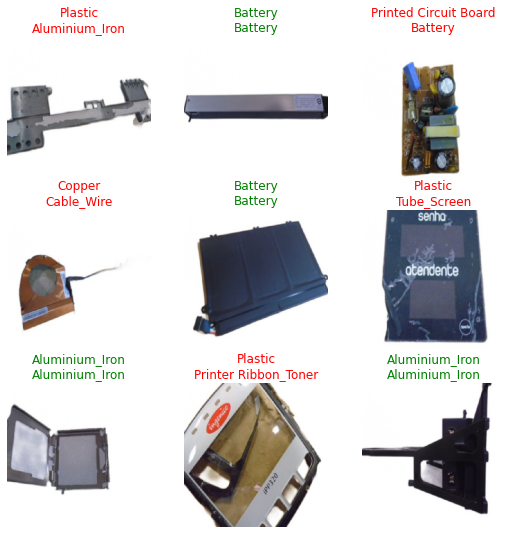

In [29]:
learn.show_results()

In [30]:
learn.dls.loss_func

FlattenedLoss of CrossEntropyLoss()

In [31]:
interp = ClassificationInterpretation.from_learner(learn)

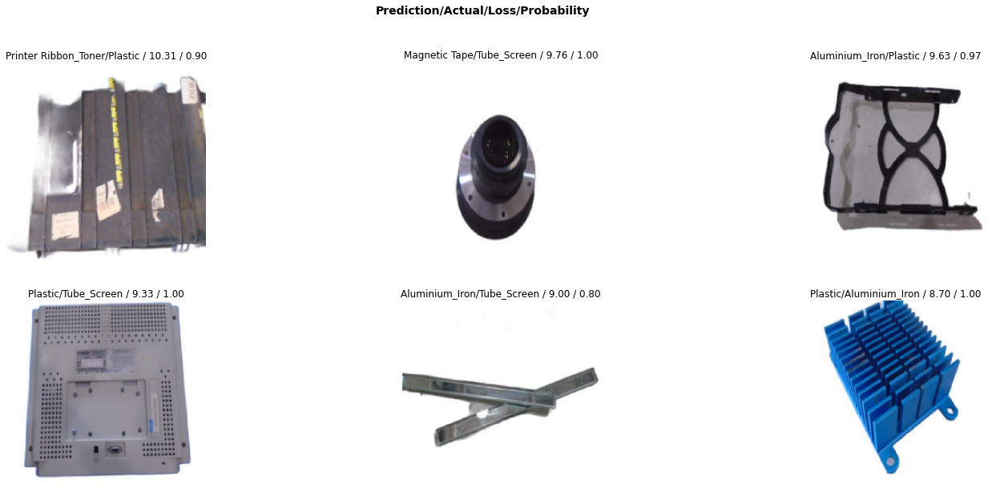

In [32]:
interp.plot_top_losses(6, figsize=(25,10))

In [33]:
interp.print_classification_report()

                       precision    recall  f1-score   support

       Aluminium_Iron       0.81      0.83      0.82        92
              Battery       0.80      0.81      0.80        43
           Cable_Wire       0.92      1.00      0.96        23
      Cardboard_Paper       0.73      0.85      0.79        13
            Connector       0.91      0.83      0.87        12
               Copper       0.76      0.87      0.81        15
        Magnetic Tape       0.50      1.00      0.67         3
              Plastic       0.66      0.52      0.58        56
Printed Circuit Board       0.98      0.91      0.95        47
 Printer Ribbon_Toner       0.50      0.50      0.50        10
          Tube_Screen       0.62      0.75      0.68        20

             accuracy                           0.79       334
            macro avg       0.74      0.81      0.77       334
         weighted avg       0.79      0.79      0.79       334



In [34]:
interp.most_confused()

[('Plastic', 'Aluminium_Iron', 12),
 ('Aluminium_Iron', 'Plastic', 8),
 ('Plastic', 'Tube_Screen', 5),
 ('Plastic', 'Battery', 4),
 ('Aluminium_Iron', 'Battery', 3),
 ('Aluminium_Iron', 'Tube_Screen', 3),
 ('Plastic', 'Printer Ribbon_Toner', 3),
 ('Printer Ribbon_Toner', 'Plastic', 3),
 ('Tube_Screen', 'Aluminium_Iron', 3),
 ('Battery', 'Plastic', 2),
 ('Plastic', 'Cardboard_Paper', 2),
 ('Printed Circuit Board', 'Battery', 2),
 ('Aluminium_Iron', 'Magnetic Tape', 1),
 ('Aluminium_Iron', 'Printed Circuit Board', 1),
 ('Battery', 'Aluminium_Iron', 1),
 ('Battery', 'Cardboard_Paper', 1),
 ('Battery', 'Connector', 1),
 ('Battery', 'Copper', 1),
 ('Battery', 'Printer Ribbon_Toner', 1),
 ('Battery', 'Tube_Screen', 1),
 ('Cardboard_Paper', 'Cable_Wire', 1),
 ('Cardboard_Paper', 'Copper', 1),
 ('Connector', 'Aluminium_Iron', 1),
 ('Connector', 'Printer Ribbon_Toner', 1),
 ('Copper', 'Cable_Wire', 1),
 ('Copper', 'Plastic', 1),
 ('Plastic', 'Copper', 1),
 ('Printed Circuit Board', 'Cardboard_P

Interpretation.plot_top_losses(k: 'int | list', largest: 'bool' = True, **kwargs)
Show `k` largest(/smallest) preds and losses. Implementation based on type dispatch

To get a prettier result with hyperlinks to source code and documentation, install nbdev: pip install nbdev


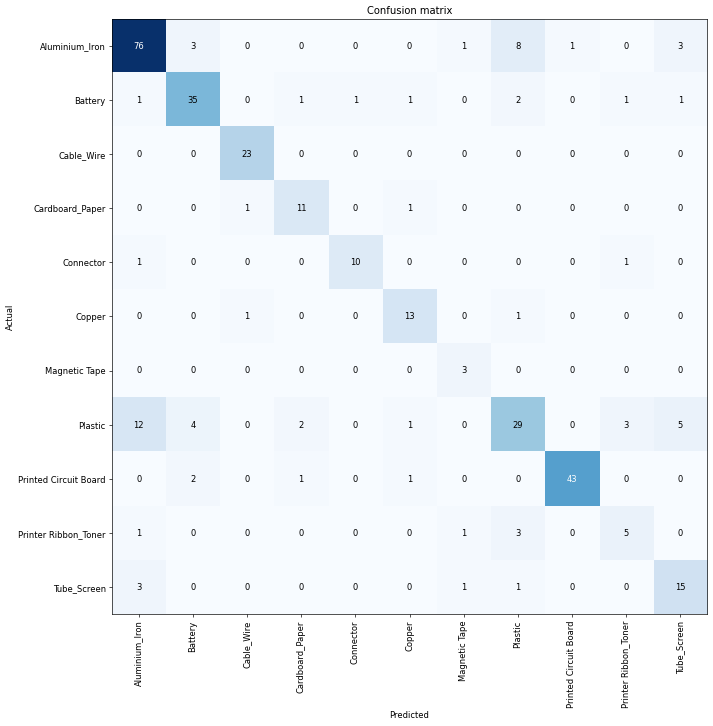

In [35]:
doc(interp.plot_top_losses)
interp.plot_confusion_matrix(figsize=(12,12), dpi=60)

In [36]:
preds = learn.get_preds()

In [37]:
print(preds[0].shape)
preds[0]

torch.Size([334, 11])


TensorBase([[9.9699e-01, 2.3977e-06, 5.2715e-06,  ..., 5.4289e-05,
             1.3295e-06, 1.3440e-05],
            [4.9751e-01, 1.4990e-02, 9.2374e-02,  ..., 1.1001e-04,
             3.9252e-05, 2.5630e-03],
            [9.9650e-01, 1.2040e-05, 4.0627e-06,  ..., 3.9674e-05,
             3.4668e-05, 9.6756e-06],
            ...,
            [1.2005e-03, 1.0956e-01, 5.1473e-05,  ..., 9.8502e-04,
             1.6098e-04, 8.8065e-01],
            [4.6270e-01, 2.1474e-03, 2.3504e-01,  ..., 1.0597e-03,
             5.8891e-06, 1.4597e-03],
            [5.9333e-08, 7.8749e-04, 1.6193e-07,  ..., 3.6198e-06,
             1.9772e-06, 9.9918e-01]])

In [38]:
labels = list(learn.dls.train_ds.items.Class.unique())
labels

['Aluminium_Iron',
 'Battery',
 'Cable_Wire',
 'Cardboard_Paper',
 'Connector',
 'Copper',
 'Magnetic Tape',
 'Plastic',
 'Printed Circuit Board',
 'Printer Ribbon_Toner',
 'Tube_Screen']

In [39]:
## saves the index of most likely (max) predicted class for each image
max_idxs = np.asarray(np.argmax(preds[0],axis=1))
max_idxs

yhat = []
for max_idx in max_idxs:
    yhat.append(labels[max_idx])

## convert POSIX paths to string first
y = []
for label_path in learn.dls.valid_ds.items.Class:
    y.append(str(label_path))

learn.dls.valid_ds.items.Class.unique()

## predicted values
print(yhat[0:5])

## actual values
print(y[0:5])

['Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron']
['Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron']


In [40]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y,yhat)
print(cm)

[[76  3  0  0  0  0  1  8  1  0  3]
 [ 1 35  0  1  1  1  0  2  0  1  1]
 [ 0  0 23  0  0  0  0  0  0  0  0]
 [ 0  0  1 11  0  1  0  0  0  0  0]
 [ 1  0  0  0 10  0  0  0  0  1  0]
 [ 0  0  1  0  0 13  0  1  0  0  0]
 [ 0  0  0  0  0  0  3  0  0  0  0]
 [12  4  0  2  0  1  0 29  0  3  5]
 [ 0  2  0  1  0  1  0  0 43  0  0]
 [ 1  0  0  0  0  0  1  3  0  5  0]
 [ 3  0  0  0  0  0  1  1  0  0 15]]


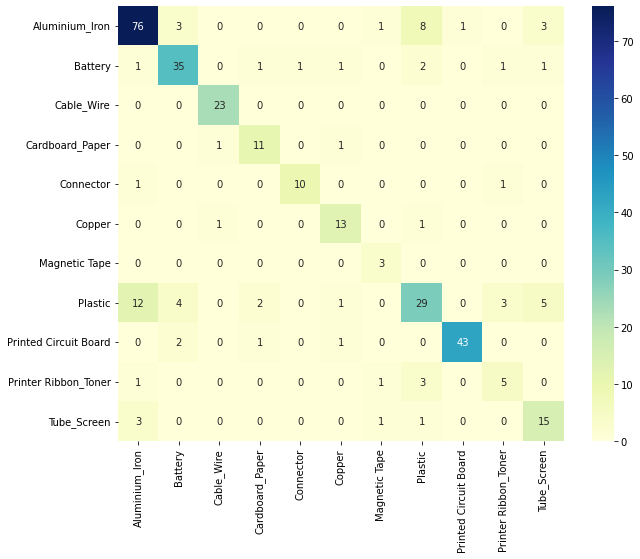

In [41]:
df_cm = pd.DataFrame(cm,learn.dls.valid_ds.items.Class.unique(),learn.dls.valid_ds.items.Class.unique())

plt.figure(figsize=(10,8))

import seaborn as sns

sns.heatmap(df_cm,annot=True,fmt="d",cmap="YlGnBu")

In [42]:
correct = 0

for r in range(len(cm)):
    for c in range(len(cm)):
        if (r==c):
            correct += cm[r,c]

accuracy = correct/sum(sum(cm))
accuracy

0.7874251497005988

## **Resnet101 (using full_segmented2)**

### Fold 0

In [16]:
fold_nbr = 0
fold_name = 'fold0'
model_name = 'resnet101'

learn = create_cnn_learner(pct_images=1, 
                           deterministic=True, 
                           size=224, 
                           img_path = '/content/gdrive/My Drive/ewaste_data/full_segmented2/',
                           split_path = '/content/gdrive/My Drive/ewaste_data/full_segmented2/',
                           model_dir = '/content/gdrive/My Drive/ewaste_data/models/option2/' + model_name + '/' + fold_name,
                           log_name = '/content/gdrive/My Drive/ewaste_data/dataframes/option2/' + model_name + '/' + fold_name + '/' + 'log_' + model_name + '_' + fold_name + '.csv',
                           oversampling=True,
                           dfs_path='/content/gdrive/My Drive/ewaste_data/dataframes/option2/' + model_name + '/' + fold_name,
                           fold=fold_nbr,
                           arch=model_name)

Random state set:101, cuda used: True
Split Path defined, preparing pseudo stratified split.
Creating path:label dataframe from /content/gdrive/My Drive/ewaste_data/full_segmented2/, using 100.00% of the images (1670 images.) Shuffle = False.
Preparing stratified 5 fold split, random state is 101. Returning fold 0.
Creating path:label dataframe from /content/gdrive/My Drive/ewaste_data/full_segmented2/, using 100.00% of the images (1670 images.) Shuffle = False.
We have 11 classes, with a training set of size 1336, and a validation set of size 334
The main split has 80.00% training data with 11 classes, the reduced split has 80.00 % training data, with 11 classes.


/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet101_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet101-63fe2227.pth" to /root/.cache/torch/hub/checkpoints/resnet101-63fe2227.pth


  0%|          | 0.00/171M [00:00<?, ?B/s]

In [17]:
learn.arch

<function torchvision.models.resnet.resnet101(*, weights: Union[torchvision.models.resnet.ResNet101_Weights, NoneType] = None, progress: bool = True, **kwargs: Any) -> torchvision.models.resnet.ResNet>

In [18]:
len(learn.dls.get_idxs())

3340

In [ ]:
idxs = learn.dls.train.get_idxs()
learn.dls.train.items.iloc[idxs].Class.value_counts()

Cable_Wire               327
Aluminium_Iron           321
Plastic                  319
Printer Ribbon_Toner     311
Connector                307
Tube_Screen              302
Printed Circuit Board    297
Magnetic Tape            297
Copper                   294
Cardboard_Paper          284
Battery                  281
Name: Class, dtype: int64

Freezing model body
44,612,160 total parameters.
2,217,344 training parameters.


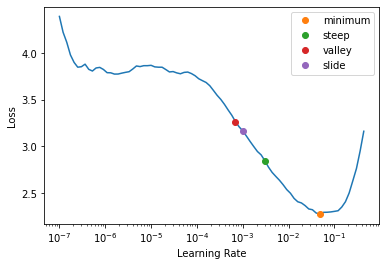

In [19]:
print(f'Freezing model body')
learn.freeze()
enumerate_params(learn)
_,_,valley_freeze,_ = learn.lr_find(suggest_funcs=(minimum, steep, valley, slide))

In [20]:
valley_freeze

0.0006918309954926372

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,error_rate,precision_score,recall_score,f1_score,time
0,2.226752,1.447615,0.568862,0.886228,0.431138,0.568862,0.568862,0.568862,00:13
1,1.131570,1.133865,0.670659,0.958084,0.329341,0.670659,0.670659,0.670659,00:13
2,0.652229,0.983838,0.718563,0.973054,0.281437,0.718563,0.718563,0.718563,00:13
3,0.388759,0.866242,0.760479,0.982036,0.239521,0.760479,0.760479,0.760479,00:13
4,0.270289,0.846623,0.778443,0.973054,0.221557,0.778443,0.778443,0.778443,00:13
5,0.203901,0.816591,0.769461,0.988024,0.230539,0.769461,0.769461,0.769461,00:13
6,0.150109,0.703311,0.814371,0.985030,0.185629,0.814371,0.814371,0.814371,00:13
7,0.116682,0.696561,0.805389,0.988024,0.194611,0.805389,0.805389,0.805389,00:13
8,0.107638,0.696225,0.814371,0.988024,0.185629,0.814371,0.814371,0.814371,00:13
9,0.090581,0.694489,0.811377,0.985030,0.188623,0.811377,0.811377,0.811377,00:13


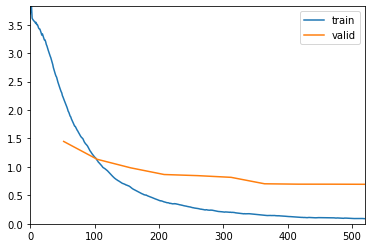

Path('/content/gdrive/My Drive/ewaste_data/models/option2/resnet101/fold0/stage-1-full_segmented2_oversampled_resnet101_fold0.pth')

In [21]:
learn.fit_one_cycle(10, lr_max=valley_freeze)
learn.save('stage-1-full_segmented2_oversampled_' + model_name + '_' + fold_name)

Unfreezing model body
44,612,160 total parameters.
44,612,160 training parameters.


SuggestedLRs(minimum=1.0964782268274575e-05, steep=2.75422871709452e-06, valley=2.511886486900039e-05, slide=3.0199516913853586e-05)

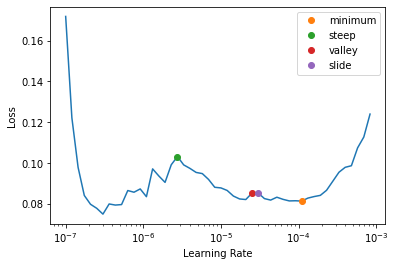

In [22]:
print(f'Unfreezing model body')
learn.unfreeze()
enumerate_params(learn)
learn.lr_find(suggest_funcs=(minimum, steep, valley, slide))

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,error_rate,precision_score,recall_score,f1_score,time
0,0.074190,0.687671,0.817365,0.988024,0.182635,0.817365,0.817365,0.817365,00:15
1,0.079441,0.744196,0.781437,0.985030,0.218563,0.781437,0.781437,0.781437,00:15
2,0.074417,0.842339,0.775449,1.000000,0.224551,0.775449,0.775449,0.775449,00:15
3,0.061422,0.806686,0.781437,0.988024,0.218563,0.781437,0.781437,0.781437,00:15
4,0.048388,0.820267,0.799401,0.991018,0.200599,0.799401,0.799401,0.799401,00:15
5,0.034071,0.765182,0.802395,0.991018,0.197605,0.802395,0.802395,0.802395,00:15
6,0.026918,0.737291,0.790419,0.988024,0.209581,0.790419,0.790419,0.790419,00:15
7,0.021497,0.720504,0.796407,0.994012,0.203593,0.796407,0.796407,0.796407,00:15
8,0.015920,0.739872,0.796407,0.994012,0.203593,0.796407,0.796407,0.796407,00:15
9,0.014297,0.739658,0.799401,0.991018,0.200599,0.799401,0.799401,0.799401,00:15


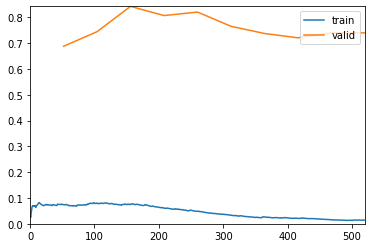

Path('/content/gdrive/My Drive/ewaste_data/models/option2/resnet101/fold0/stage-2-full_segmented2_oversampled_resnet101_fold0.pth')

In [23]:
learn.fit_one_cycle(10, lr_max=slice(1e-5, 1e-4))
learn.save('stage-2-full_segmented2_oversampled_' + model_name + '_' + fold_name)

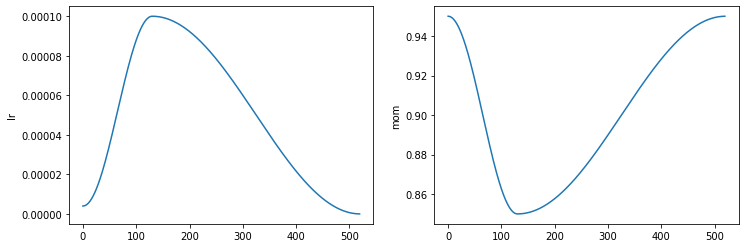

In [24]:
# In practice, we use the fit_one_cycle function, with the learning rates used representing the maximum learning rate 
# in a one cycle policy with cosine annealing, as can be seen below. 
# Note that the x-axis below represents the number of batches passed through the learner.

learn.recorder.plot_sched()

In [25]:
L(learn.recorder.values)

(#10) [[0.07418961077928543, 0.687670886516571, 0.817365288734436, 0.9880239367485046, 0.18263472616672516, 0.8173652694610778, 0.8173652694610778, 0.8173652694610778],[0.07944133877754211, 0.7441964745521545, 0.78143709897995, 0.985029935836792, 0.21856287121772766, 0.781437125748503, 0.781437125748503, 0.7814371257485029],[0.07441718131303787, 0.8423394560813904, 0.7754490971565247, 1.0, 0.22455090284347534, 0.7754491017964071, 0.7754491017964071, 0.7754491017964071],[0.06142188236117363, 0.8066855669021606, 0.78143709897995, 0.9880239367485046, 0.21856287121772766, 0.781437125748503, 0.781437125748503, 0.7814371257485029],[0.04838764667510986, 0.8202672600746155, 0.7994012236595154, 0.9910179376602173, 0.200598806142807, 0.7994011976047904, 0.7994011976047904, 0.7994011976047903],[0.034070927649736404, 0.7651821970939636, 0.802395224571228, 0.9910179376602173, 0.19760479032993317, 0.8023952095808383, 0.8023952095808383, 0.8023952095808384],[0.02691825106739998, 0.7372910976409912, 0

In [26]:
learn.validate()

(#7) [0.7396575808525085,0.7994012236595154,0.9910179376602173,0.200598806142807,0.7994011976047904,0.7994011976047904,0.7994011976047903]

In [27]:
learn.recorder.values[-1][2]

0.9910179376602173

In [28]:
learn.dls.vocab

['Aluminium_Iron', 'Battery', 'Cable_Wire', 'Cardboard_Paper', 'Connector', 'Copper', 'Magnetic Tape', 'Plastic', 'Printed Circuit Board', 'Printer Ribbon_Toner', 'Tube_Screen']

In [29]:
learn.load('/content/gdrive/My Drive/ewaste_data/models/option2/'+ model_name + '/' + fold_name + '/stage-2-full_segmented2_oversampled_' + model_name + '_' + fold_name)

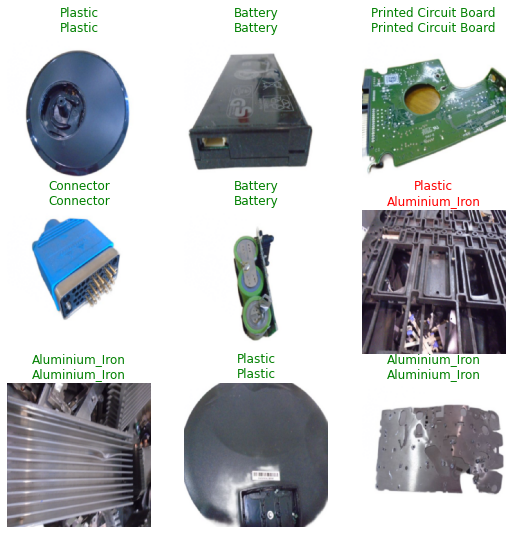

In [ ]:
learn.show_results()

In [30]:
learn.dls.loss_func

FlattenedLoss of CrossEntropyLoss()

In [31]:
interp = ClassificationInterpretation.from_learner(learn)

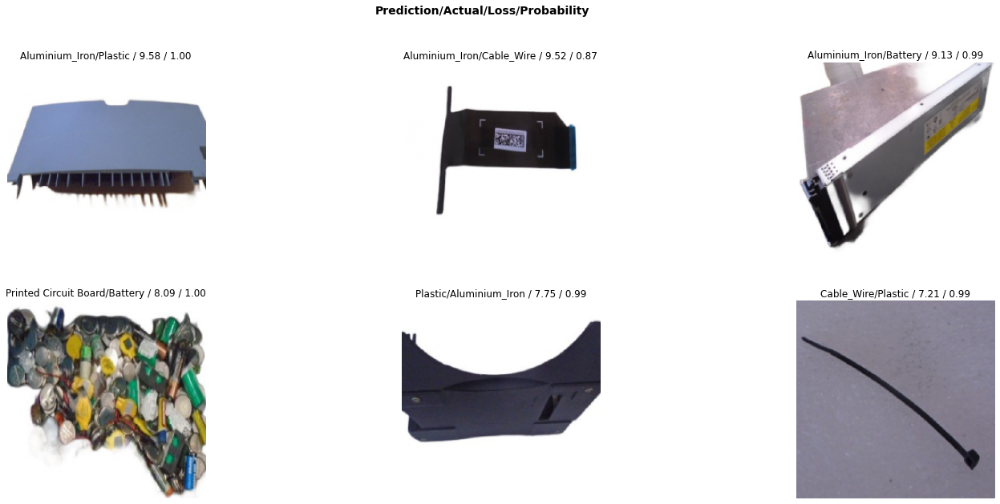

In [32]:
interp.plot_top_losses(6, figsize=(25,10))

In [33]:
interp.print_classification_report()

                       precision    recall  f1-score   support

       Aluminium_Iron       0.72      0.88      0.79        93
              Battery       0.80      0.79      0.80        42
           Cable_Wire       0.95      0.83      0.89        24
      Cardboard_Paper       0.83      0.77      0.80        13
            Connector       0.88      0.58      0.70        12
               Copper       0.93      1.00      0.97        14
        Magnetic Tape       0.60      0.75      0.67         4
              Plastic       0.74      0.67      0.70        55
Printed Circuit Board       0.98      0.90      0.93        48
 Printer Ribbon_Toner       0.83      0.50      0.62        10
          Tube_Screen       0.72      0.68      0.70        19

             accuracy                           0.80       334
            macro avg       0.82      0.76      0.78       334
         weighted avg       0.81      0.80      0.80       334



In [34]:
interp.most_confused()

[('Plastic', 'Aluminium_Iron', 10),
 ('Aluminium_Iron', 'Plastic', 7),
 ('Battery', 'Aluminium_Iron', 6),
 ('Printed Circuit Board', 'Aluminium_Iron', 4),
 ('Tube_Screen', 'Aluminium_Iron', 4),
 ('Cable_Wire', 'Aluminium_Iron', 3),
 ('Connector', 'Aluminium_Iron', 3),
 ('Plastic', 'Battery', 3),
 ('Aluminium_Iron', 'Battery', 2),
 ('Battery', 'Tube_Screen', 2),
 ('Cardboard_Paper', 'Plastic', 2),
 ('Printer Ribbon_Toner', 'Aluminium_Iron', 2),
 ('Printer Ribbon_Toner', 'Battery', 2),
 ('Tube_Screen', 'Plastic', 2),
 ('Aluminium_Iron', 'Cardboard_Paper', 1),
 ('Aluminium_Iron', 'Connector', 1),
 ('Battery', 'Printed Circuit Board', 1),
 ('Cable_Wire', 'Plastic', 1),
 ('Cardboard_Paper', 'Battery', 1),
 ('Connector', 'Cardboard_Paper', 1),
 ('Connector', 'Plastic', 1),
 ('Magnetic Tape', 'Tube_Screen', 1),
 ('Plastic', 'Cable_Wire', 1),
 ('Plastic', 'Copper', 1),
 ('Plastic', 'Magnetic Tape', 1),
 ('Plastic', 'Printer Ribbon_Toner', 1),
 ('Plastic', 'Tube_Screen', 1),
 ('Printed Circuit 

Interpretation.plot_top_losses(k: 'int | list', largest: 'bool' = True, **kwargs)
Show `k` largest(/smallest) preds and losses. Implementation based on type dispatch

To get a prettier result with hyperlinks to source code and documentation, install nbdev: pip install nbdev


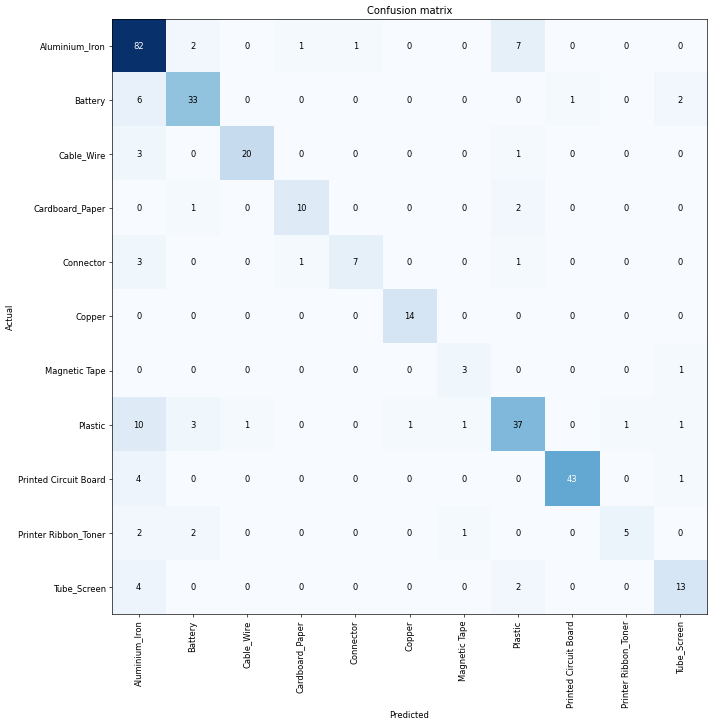

In [35]:
doc(interp.plot_top_losses)
interp.plot_confusion_matrix(figsize=(12,12), dpi=60)

In [36]:
preds = learn.get_preds()

In [37]:
print(preds[0].shape)
preds[0]

torch.Size([334, 11])


TensorBase([[9.9991e-01, 1.9648e-07, 8.9430e-09,  ..., 6.3042e-07,
             2.7536e-08, 4.2421e-06],
            [9.8248e-01, 2.0525e-07, 4.0258e-05,  ..., 2.1294e-05,
             4.0968e-07, 1.0456e-07],
            [7.2185e-01, 5.4733e-05, 3.7717e-03,  ..., 1.5937e-04,
             4.5899e-03, 6.5708e-03],
            ...,
            [4.0941e-02, 3.2163e-04, 2.0862e-05,  ..., 2.4735e-04,
             4.8304e-06, 9.2988e-01],
            [2.2802e-02, 4.4929e-05, 1.5482e-06,  ..., 1.4239e-05,
             1.6097e-07, 9.6141e-01],
            [3.6495e-03, 1.1346e-02, 3.7064e-04,  ..., 2.0601e-04,
             7.1886e-06, 9.7001e-01]])

In [38]:
labels = list(learn.dls.train_ds.items.Class.unique())
labels

['Aluminium_Iron',
 'Battery',
 'Cable_Wire',
 'Cardboard_Paper',
 'Connector',
 'Copper',
 'Magnetic Tape',
 'Plastic',
 'Printed Circuit Board',
 'Printer Ribbon_Toner',
 'Tube_Screen']

In [39]:
## saves the index of most likely (max) predicted class for each image
max_idxs = np.asarray(np.argmax(preds[0],axis=1))
max_idxs

yhat = []
for max_idx in max_idxs:
    yhat.append(labels[max_idx])

## convert POSIX paths to string first
y = []
for label_path in learn.dls.valid_ds.items.Class:
    y.append(str(label_path))

learn.dls.valid_ds.items.Class.unique()

## predicted values
print(yhat[0:5])

## actual values
print(y[0:5])

['Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron']
['Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron']


In [40]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y,yhat)
print(cm)

[[82  2  0  1  1  0  0  7  0  0  0]
 [ 6 33  0  0  0  0  0  0  1  0  2]
 [ 3  0 20  0  0  0  0  1  0  0  0]
 [ 0  1  0 10  0  0  0  2  0  0  0]
 [ 3  0  0  1  7  0  0  1  0  0  0]
 [ 0  0  0  0  0 14  0  0  0  0  0]
 [ 0  0  0  0  0  0  3  0  0  0  1]
 [10  3  1  0  0  1  1 37  0  1  1]
 [ 4  0  0  0  0  0  0  0 43  0  1]
 [ 2  2  0  0  0  0  1  0  0  5  0]
 [ 4  0  0  0  0  0  0  2  0  0 13]]


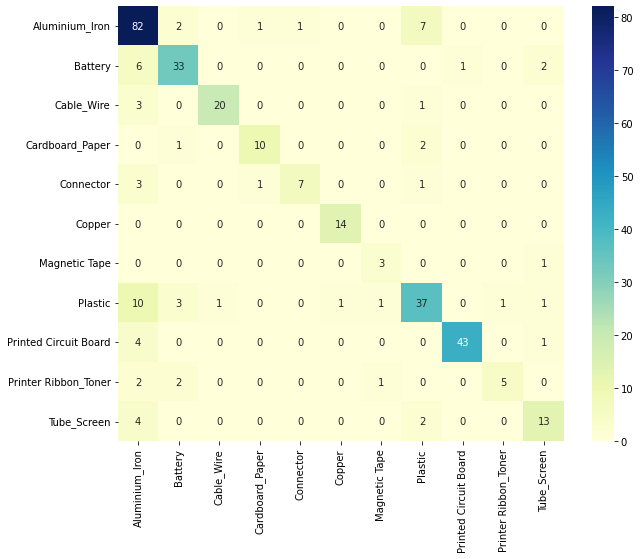

In [41]:
df_cm = pd.DataFrame(cm,learn.dls.valid_ds.items.Class.unique(),learn.dls.valid_ds.items.Class.unique())

plt.figure(figsize=(10,8))

import seaborn as sns

sns.heatmap(df_cm,annot=True,fmt="d",cmap="YlGnBu")

In [42]:
correct = 0

for r in range(len(cm)):
    for c in range(len(cm)):
        if (r==c):
            correct += cm[r,c]

accuracy = correct/sum(sum(cm))
accuracy

0.7994011976047904

### Fold 1

In [14]:
fold_nbr = 1
fold_name = 'fold1'
model_name = 'resnet101'

learn = create_cnn_learner(pct_images=1, 
                           deterministic=True, 
                           size=224, 
                           img_path = '/content/gdrive/My Drive/ewaste_data/full_segmented2/',
                           split_path = '/content/gdrive/My Drive/ewaste_data/full_segmented2/',
                           model_dir = '/content/gdrive/My Drive/ewaste_data/models/option2/' + model_name + '/' + fold_name,
                           log_name = '/content/gdrive/My Drive/ewaste_data/dataframes/option2/' + model_name + '/' + fold_name + '/' + 'log_' + model_name + '_' + fold_name + '.csv',
                           oversampling=True,
                           dfs_path='/content/gdrive/My Drive/ewaste_data/dataframes/option2/' + model_name + '/' + fold_name,
                           fold=fold_nbr,
                           arch=model_name)

Random state set:101, cuda used: True
Split Path defined, preparing pseudo stratified split.
Creating path:label dataframe from /content/gdrive/My Drive/ewaste_data/full_segmented2/, using 100.00% of the images (1670 images.) Shuffle = False.
Preparing stratified 5 fold split, random state is 101. Returning fold 1.
Creating path:label dataframe from /content/gdrive/My Drive/ewaste_data/full_segmented2/, using 100.00% of the images (1670 images.) Shuffle = False.
We have 11 classes, with a training set of size 1336, and a validation set of size 334
The main split has 80.00% training data with 11 classes, the reduced split has 80.00 % training data, with 11 classes.


/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet101_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [15]:
learn.arch

<function torchvision.models.resnet.resnet101(*, weights: Union[torchvision.models.resnet.ResNet101_Weights, NoneType] = None, progress: bool = True, **kwargs: Any) -> torchvision.models.resnet.ResNet>

In [16]:
len(learn.dls.get_idxs())

3340

In [17]:
idxs = learn.dls.train.get_idxs()
learn.dls.train.items.iloc[idxs].Class.value_counts()

Cable_Wire               327
Aluminium_Iron           321
Plastic                  319
Printer Ribbon_Toner     311
Connector                307
Tube_Screen              302
Printed Circuit Board    297
Magnetic Tape            297
Copper                   294
Cardboard_Paper          284
Battery                  281
Name: Class, dtype: int64

Freezing model body
44,612,160 total parameters.
2,217,344 training parameters.


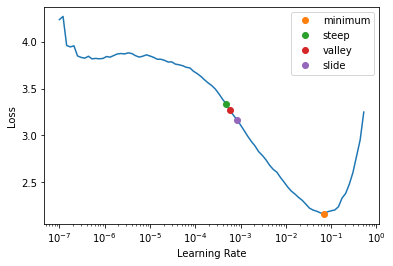

In [18]:
print(f'Freezing model body')
learn.freeze()
enumerate_params(learn)
_,_,valley_freeze,_ = learn.lr_find(suggest_funcs=(minimum, steep, valley, slide))

In [19]:
valley_freeze

0.0005754399462603033

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,error_rate,precision_score,recall_score,f1_score,time
0,2.286484,1.554067,0.523952,0.871257,0.476048,0.523952,0.523952,0.523952,00:13
1,1.169034,1.051267,0.673653,0.955090,0.326347,0.673653,0.673653,0.673653,00:13
2,0.653441,1.036931,0.703593,0.961078,0.296407,0.703593,0.703593,0.703593,00:13
3,0.408778,1.032261,0.712575,0.961078,0.287425,0.712575,0.712575,0.712575,00:13
4,0.278435,0.942941,0.748503,0.961078,0.251497,0.748503,0.748503,0.748503,00:13
5,0.201503,0.934463,0.742515,0.973054,0.257485,0.742515,0.742515,0.742515,00:13
6,0.150105,0.937878,0.739521,0.973054,0.260479,0.739521,0.739521,0.739521,00:13
7,0.127213,0.962632,0.727545,0.973054,0.272455,0.727545,0.727545,0.727545,00:13
8,0.102923,0.931082,0.736527,0.976048,0.263473,0.736527,0.736527,0.736527,00:13
9,0.099258,0.921247,0.739521,0.976048,0.260479,0.739521,0.739521,0.739521,00:13


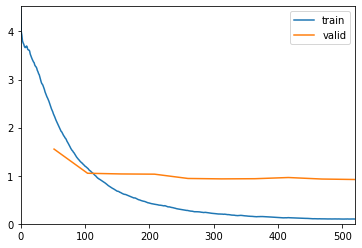

Path('/content/gdrive/My Drive/ewaste_data/models/option2/resnet101/fold1/stage-1-full_segmented2_oversampled_resnet101_fold1.pth')

In [20]:
learn.fit_one_cycle(10, lr_max=valley_freeze)
learn.save('stage-1-full_segmented2_oversampled_' + model_name + '_' + fold_name)

Unfreezing model body
44,612,160 total parameters.
44,612,160 training parameters.


SuggestedLRs(minimum=1.0964782268274575e-05, steep=1.0964781722577754e-06, valley=2.511886486900039e-05, slide=2.511886486900039e-05)

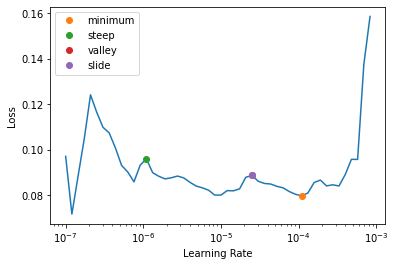

In [21]:
print(f'Unfreezing model body')
learn.unfreeze()
enumerate_params(learn)
learn.lr_find(suggest_funcs=(minimum, steep, valley, slide))

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,error_rate,precision_score,recall_score,f1_score,time
0,0.083631,0.920960,0.742515,0.973054,0.257485,0.742515,0.742515,0.742515,00:15
1,0.081540,0.955328,0.748503,0.982036,0.251497,0.748503,0.748503,0.748503,00:15
2,0.074460,1.058940,0.748503,0.973054,0.251497,0.748503,0.748503,0.748503,00:15
3,0.070912,0.993451,0.757485,0.976048,0.242515,0.757485,0.757485,0.757485,00:15
4,0.053796,0.948910,0.757485,0.973054,0.242515,0.757485,0.757485,0.757485,00:15
5,0.039318,0.979650,0.763473,0.967066,0.236527,0.763473,0.763473,0.763473,00:15
6,0.030160,0.961080,0.781437,0.976048,0.218563,0.781437,0.781437,0.781437,00:15
7,0.020246,0.980367,0.772455,0.976048,0.227545,0.772455,0.772455,0.772455,00:15
8,0.018073,0.989793,0.778443,0.970060,0.221557,0.778443,0.778443,0.778443,00:15
9,0.018104,0.988008,0.781437,0.976048,0.218563,0.781437,0.781437,0.781437,00:16


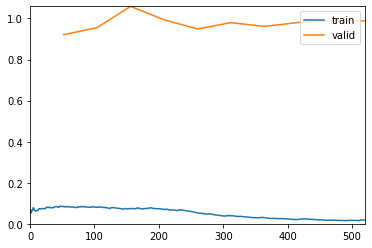

Path('/content/gdrive/My Drive/ewaste_data/models/option2/resnet101/fold1/stage-2-full_segmented2_oversampled_resnet101_fold1.pth')

In [22]:
learn.fit_one_cycle(10, lr_max=slice(1e-5, 1e-4))
learn.save('stage-2-full_segmented2_oversampled_' + model_name + '_' + fold_name)

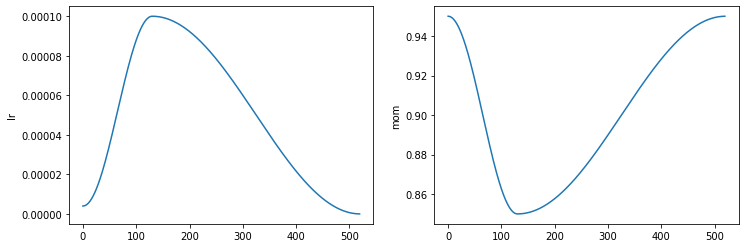

In [23]:
# In practice, we use the fit_one_cycle function, with the learning rates used representing the maximum learning rate 
# in a one cycle policy with cosine annealing, as can be seen below. 
# Note that the x-axis below represents the number of batches passed through the learner.

learn.recorder.plot_sched()

In [24]:
L(learn.recorder.values)

(#10) [[0.08363138139247894, 0.9209595918655396, 0.742514967918396, 0.9730538725852966, 0.257485032081604, 0.7425149700598802, 0.7425149700598802, 0.7425149700598802],[0.0815400779247284, 0.9553282260894775, 0.7485029697418213, 0.9820359349250793, 0.2514970004558563, 0.7485029940119761, 0.7485029940119761, 0.7485029940119761],[0.07445956766605377, 1.058940052986145, 0.7485029697418213, 0.9730538725852966, 0.2514970004558563, 0.7485029940119761, 0.7485029940119761, 0.7485029940119761],[0.0709119364619255, 0.9934513568878174, 0.757485032081604, 0.976047933101654, 0.242514967918396, 0.7574850299401198, 0.7574850299401198, 0.7574850299401198],[0.053795911371707916, 0.9489097595214844, 0.757485032081604, 0.9730538725852966, 0.242514967918396, 0.7574850299401198, 0.7574850299401198, 0.7574850299401198],[0.039317674934864044, 0.9796502590179443, 0.7634730339050293, 0.9670658707618713, 0.2365269511938095, 0.7634730538922155, 0.7634730538922155, 0.7634730538922155],[0.03016037866473198, 0.96108

In [25]:
learn.validate()

(#7) [0.988007664680481,0.78143709897995,0.976047933101654,0.21856287121772766,0.781437125748503,0.781437125748503,0.7814371257485029]

In [26]:
learn.recorder.values[-1][2]

0.976047933101654

In [27]:
learn.dls.vocab

['Aluminium_Iron', 'Battery', 'Cable_Wire', 'Cardboard_Paper', 'Connector', 'Copper', 'Magnetic Tape', 'Plastic', 'Printed Circuit Board', 'Printer Ribbon_Toner', 'Tube_Screen']

In [28]:
learn.load('/content/gdrive/My Drive/ewaste_data/models/option2/'+ model_name + '/' + fold_name + '/stage-2-full_segmented2_oversampled_' + model_name + '_' + fold_name)

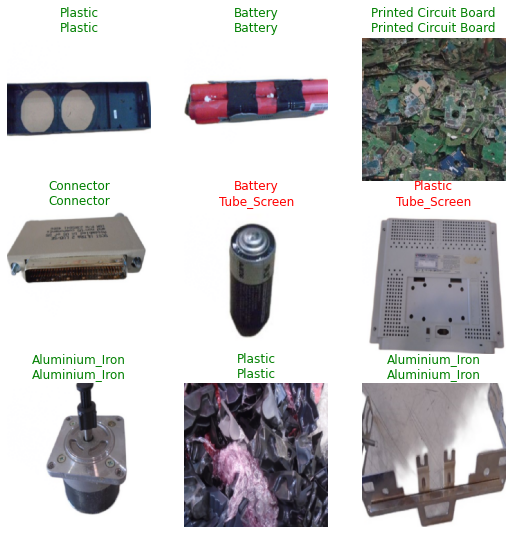

In [29]:
learn.show_results()

In [30]:
learn.dls.loss_func

FlattenedLoss of CrossEntropyLoss()

In [31]:
interp = ClassificationInterpretation.from_learner(learn)

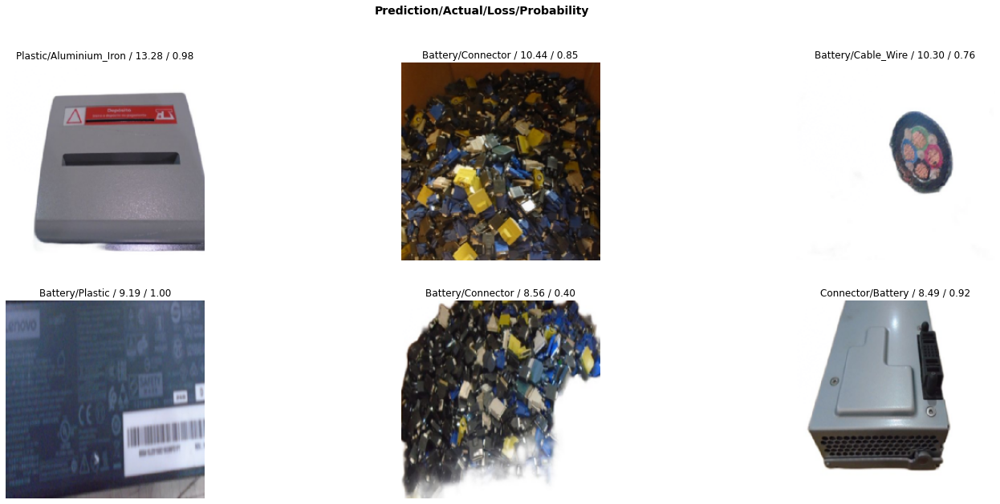

In [32]:
interp.plot_top_losses(6, figsize=(25,10))

In [33]:
interp.print_classification_report()

                       precision    recall  f1-score   support

       Aluminium_Iron       0.79      0.85      0.82        92
              Battery       0.74      0.81      0.78        43
           Cable_Wire       0.77      0.83      0.80        24
      Cardboard_Paper       0.92      0.85      0.88        13
            Connector       0.80      0.67      0.73        12
               Copper       0.87      0.93      0.90        14
        Magnetic Tape       0.67      0.50      0.57         4
              Plastic       0.68      0.58      0.63        55
Printed Circuit Board       0.89      0.89      0.89        47
 Printer Ribbon_Toner       0.78      0.64      0.70        11
          Tube_Screen       0.68      0.68      0.68        19

             accuracy                           0.78       334
            macro avg       0.78      0.75      0.76       334
         weighted avg       0.78      0.78      0.78       334



In [34]:
interp.most_confused()

[('Plastic', 'Aluminium_Iron', 11),
 ('Aluminium_Iron', 'Plastic', 5),
 ('Tube_Screen', 'Aluminium_Iron', 4),
 ('Aluminium_Iron', 'Battery', 3),
 ('Connector', 'Battery', 3),
 ('Plastic', 'Battery', 3),
 ('Plastic', 'Tube_Screen', 3),
 ('Printed Circuit Board', 'Aluminium_Iron', 3),
 ('Aluminium_Iron', 'Cable_Wire', 2),
 ('Aluminium_Iron', 'Printed Circuit Board', 2),
 ('Battery', 'Plastic', 2),
 ('Battery', 'Tube_Screen', 2),
 ('Plastic', 'Cable_Wire', 2),
 ('Printer Ribbon_Toner', 'Plastic', 2),
 ('Tube_Screen', 'Plastic', 2),
 ('Aluminium_Iron', 'Printer Ribbon_Toner', 1),
 ('Aluminium_Iron', 'Tube_Screen', 1),
 ('Battery', 'Aluminium_Iron', 1),
 ('Battery', 'Connector', 1),
 ('Battery', 'Copper', 1),
 ('Battery', 'Printed Circuit Board', 1),
 ('Cable_Wire', 'Battery', 1),
 ('Cable_Wire', 'Copper', 1),
 ('Cable_Wire', 'Plastic', 1),
 ('Cable_Wire', 'Printer Ribbon_Toner', 1),
 ('Cardboard_Paper', 'Battery', 1),
 ('Cardboard_Paper', 'Plastic', 1),
 ('Connector', 'Printed Circuit Boar

Interpretation.plot_top_losses(k: 'int | list', largest: 'bool' = True, **kwargs)
Show `k` largest(/smallest) preds and losses. Implementation based on type dispatch

To get a prettier result with hyperlinks to source code and documentation, install nbdev: pip install nbdev


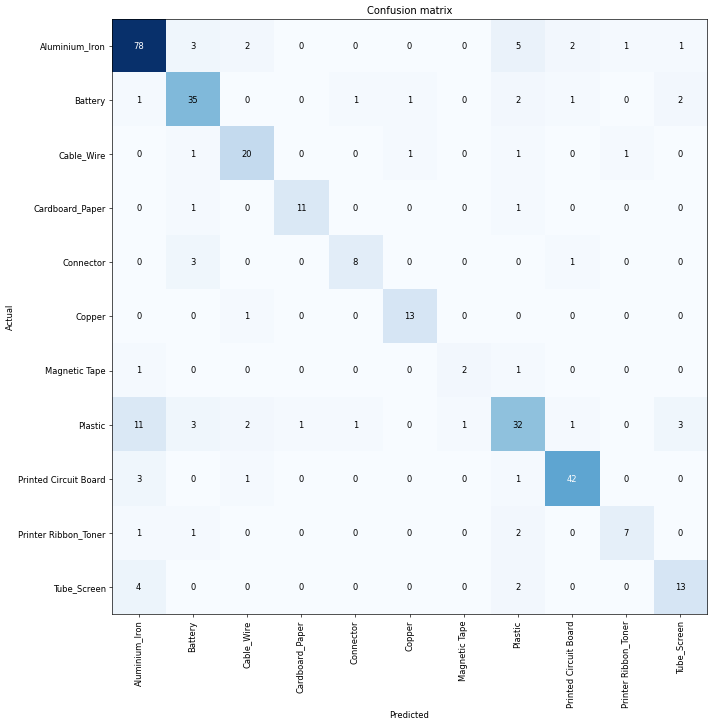

In [35]:
doc(interp.plot_top_losses)
interp.plot_confusion_matrix(figsize=(12,12), dpi=60)

In [36]:
preds = learn.get_preds()

In [37]:
print(preds[0].shape)
preds[0]

torch.Size([334, 11])


TensorBase([[9.9931e-01, 7.0506e-07, 6.4183e-05,  ..., 5.4058e-07,
             5.1674e-07, 6.9344e-07],
            [9.9841e-01, 3.5913e-07, 3.6936e-08,  ..., 3.9388e-07,
             7.6263e-09, 7.9393e-07],
            [9.8668e-01, 2.4146e-03, 1.4588e-05,  ..., 5.9628e-07,
             3.6471e-07, 9.2674e-03],
            ...,
            [1.4309e-05, 3.6395e-06, 7.0582e-06,  ..., 3.8118e-06,
             7.4389e-04, 5.8098e-01],
            [5.4982e-01, 3.9576e-01, 1.1561e-03,  ..., 8.2513e-04,
             1.8715e-03, 4.9070e-03],
            [9.4751e-01, 1.7842e-03, 6.2060e-06,  ..., 7.4679e-05,
             3.7323e-05, 4.8585e-02]])

In [38]:
labels = list(learn.dls.train_ds.items.Class.unique())
labels

['Aluminium_Iron',
 'Battery',
 'Cable_Wire',
 'Cardboard_Paper',
 'Connector',
 'Copper',
 'Magnetic Tape',
 'Plastic',
 'Printed Circuit Board',
 'Printer Ribbon_Toner',
 'Tube_Screen']

In [39]:
## saves the index of most likely (max) predicted class for each image
max_idxs = np.asarray(np.argmax(preds[0],axis=1))
max_idxs

yhat = []
for max_idx in max_idxs:
    yhat.append(labels[max_idx])

## convert POSIX paths to string first
y = []
for label_path in learn.dls.valid_ds.items.Class:
    y.append(str(label_path))

learn.dls.valid_ds.items.Class.unique()

## predicted values
print(yhat[0:5])

## actual values
print(y[0:5])

['Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron']
['Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron']


In [40]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y,yhat)
print(cm)

[[78  3  2  0  0  0  0  5  2  1  1]
 [ 1 35  0  0  1  1  0  2  1  0  2]
 [ 0  1 20  0  0  1  0  1  0  1  0]
 [ 0  1  0 11  0  0  0  1  0  0  0]
 [ 0  3  0  0  8  0  0  0  1  0  0]
 [ 0  0  1  0  0 13  0  0  0  0  0]
 [ 1  0  0  0  0  0  2  1  0  0  0]
 [11  3  2  1  1  0  1 32  1  0  3]
 [ 3  0  1  0  0  0  0  1 42  0  0]
 [ 1  1  0  0  0  0  0  2  0  7  0]
 [ 4  0  0  0  0  0  0  2  0  0 13]]


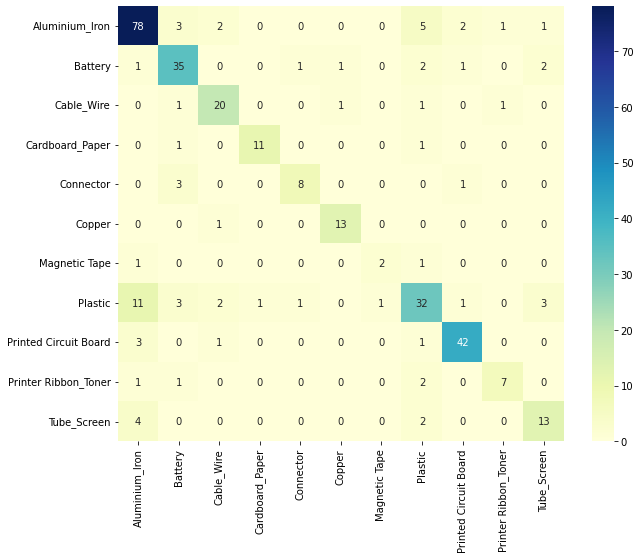

In [41]:
df_cm = pd.DataFrame(cm,learn.dls.valid_ds.items.Class.unique(),learn.dls.valid_ds.items.Class.unique())

plt.figure(figsize=(10,8))

import seaborn as sns

sns.heatmap(df_cm,annot=True,fmt="d",cmap="YlGnBu")

In [42]:
correct = 0

for r in range(len(cm)):
    for c in range(len(cm)):
        if (r==c):
            correct += cm[r,c]

accuracy = correct/sum(sum(cm))
accuracy

0.781437125748503

### Fold 2

In [15]:
fold_nbr = 2
fold_name = 'fold2'
model_name = 'resnet101'

learn = create_cnn_learner(pct_images=1, 
                           deterministic=True, 
                           size=224, 
                           img_path = '/content/gdrive/My Drive/ewaste_data/full_segmented2/',
                           split_path = '/content/gdrive/My Drive/ewaste_data/full_segmented2/',
                           model_dir = '/content/gdrive/My Drive/ewaste_data/models/option2/' + model_name + '/' + fold_name,
                           log_name = '/content/gdrive/My Drive/ewaste_data/dataframes/option2/' + model_name + '/' + fold_name + '/' + 'log_' + model_name + '_' + fold_name + '.csv',
                           oversampling=True,
                           dfs_path='/content/gdrive/My Drive/ewaste_data/dataframes/option2/' + model_name + '/' + fold_name,
                           fold=fold_nbr,
                           arch=model_name)

Random state set:101, cuda used: True
Split Path defined, preparing pseudo stratified split.
Creating path:label dataframe from /content/gdrive/My Drive/ewaste_data/full_segmented2/, using 100.00% of the images (1670 images.) Shuffle = False.
Preparing stratified 5 fold split, random state is 101. Returning fold 2.
Creating path:label dataframe from /content/gdrive/My Drive/ewaste_data/full_segmented2/, using 100.00% of the images (1670 images.) Shuffle = False.
We have 11 classes, with a training set of size 1336, and a validation set of size 334
The main split has 80.00% training data with 11 classes, the reduced split has 80.00 % training data, with 11 classes.


/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet101_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [16]:
learn.arch

<function torchvision.models.resnet.resnet101(*, weights: Union[torchvision.models.resnet.ResNet101_Weights, NoneType] = None, progress: bool = True, **kwargs: Any) -> torchvision.models.resnet.ResNet>

In [17]:
len(learn.dls.get_idxs())

3340

In [18]:
idxs = learn.dls.train.get_idxs()
learn.dls.train.items.iloc[idxs].Class.value_counts()

Cable_Wire               327
Aluminium_Iron           321
Plastic                  319
Printer Ribbon_Toner     311
Connector                307
Tube_Screen              302
Printed Circuit Board    297
Magnetic Tape            297
Copper                   294
Cardboard_Paper          284
Battery                  281
Name: Class, dtype: int64

Freezing model body
44,612,160 total parameters.
2,217,344 training parameters.


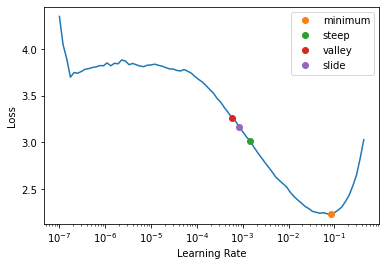

In [19]:
print(f'Freezing model body')
learn.freeze()
enumerate_params(learn)
_,_,valley_freeze,_ = learn.lr_find(suggest_funcs=(minimum, steep, valley, slide))

In [20]:
valley_freeze

0.0005754399462603033

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,error_rate,precision_score,recall_score,f1_score,time
0,2.401202,1.375284,0.568862,0.910180,0.431138,0.568862,0.568862,0.568862,00:13
1,1.233923,0.930592,0.715569,0.958084,0.284431,0.715569,0.715569,0.715569,00:13
2,0.683875,0.857385,0.751497,0.967066,0.248503,0.751497,0.751497,0.751497,00:13
3,0.428591,0.877330,0.742515,0.967066,0.257485,0.742515,0.742515,0.742515,00:13
4,0.287847,0.767743,0.784431,0.976048,0.215569,0.784431,0.784431,0.784431,00:13
5,0.214443,0.743595,0.793413,0.976048,0.206587,0.793413,0.793413,0.793413,00:13
6,0.159506,0.712419,0.805389,0.979042,0.194611,0.805389,0.805389,0.805389,00:13
7,0.136968,0.681866,0.808383,0.979042,0.191617,0.808383,0.808383,0.808383,00:13
8,0.113944,0.668873,0.814371,0.982036,0.185629,0.814371,0.814371,0.814371,00:13
9,0.103352,0.663965,0.805389,0.982036,0.194611,0.805389,0.805389,0.805389,00:13


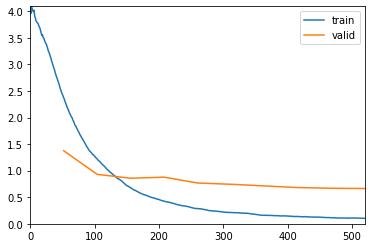

Path('/content/gdrive/My Drive/ewaste_data/models/option2/resnet101/fold2/stage-1-full_segmented2_oversampled_resnet101_fold2.pth')

In [21]:
learn.fit_one_cycle(10, lr_max=valley_freeze)
learn.save('stage-1-full_segmented2_oversampled_' + model_name + '_' + fold_name)

Unfreezing model body
44,612,160 total parameters.
44,612,160 training parameters.


SuggestedLRs(minimum=9.12010818865383e-08, steep=1.3182567499825382e-06, valley=6.30957365501672e-05, slide=3.0199516913853586e-05)

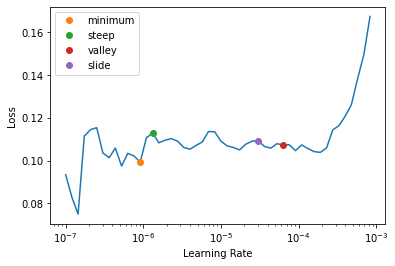

In [22]:
print(f'Unfreezing model body')
learn.unfreeze()
enumerate_params(learn)
learn.lr_find(suggest_funcs=(minimum, steep, valley, slide))

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,error_rate,precision_score,recall_score,f1_score,time
0,0.093733,0.669713,0.817365,0.979042,0.182635,0.817365,0.817365,0.817365,00:15
1,0.084943,0.604904,0.820359,0.982036,0.179641,0.820359,0.820359,0.820359,00:15
2,0.079763,0.767407,0.793413,0.982036,0.206587,0.793413,0.793413,0.793413,00:15
3,0.073761,0.738443,0.805389,0.973054,0.194611,0.805389,0.805389,0.805389,00:15
4,0.056685,0.644067,0.814371,0.982036,0.185629,0.814371,0.814371,0.814371,00:15
5,0.044278,0.688086,0.814371,0.985030,0.185629,0.814371,0.814371,0.814371,00:15
6,0.029675,0.663868,0.841317,0.979042,0.158683,0.841317,0.841317,0.841317,00:15
7,0.021580,0.632505,0.847305,0.979042,0.152695,0.847305,0.847305,0.847305,00:15
8,0.016618,0.630185,0.847305,0.979042,0.152695,0.847305,0.847305,0.847305,00:15
9,0.015072,0.633833,0.841317,0.979042,0.158683,0.841317,0.841317,0.841317,00:15


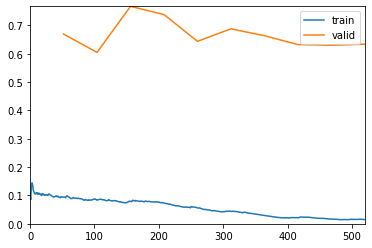

Path('/content/gdrive/My Drive/ewaste_data/models/option2/resnet101/fold2/stage-2-full_segmented2_oversampled_resnet101_fold2.pth')

In [23]:
learn.fit_one_cycle(10, lr_max=slice(1e-5, 1e-4))
learn.save('stage-2-full_segmented2_oversampled_' + model_name + '_' + fold_name)

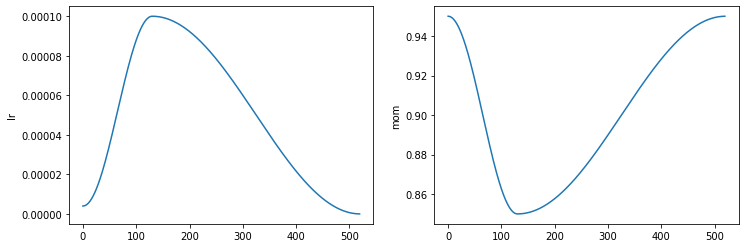

In [24]:
# In practice, we use the fit_one_cycle function, with the learning rates used representing the maximum learning rate 
# in a one cycle policy with cosine annealing, as can be seen below. 
# Note that the x-axis below represents the number of batches passed through the learner.

learn.recorder.plot_sched()

In [25]:
L(learn.recorder.values)

(#10) [[0.09373337030410767, 0.6697132587432861, 0.817365288734436, 0.9790419340133667, 0.18263472616672516, 0.8173652694610778, 0.8173652694610778, 0.8173652694610778],[0.08494312316179276, 0.6049036979675293, 0.8203592896461487, 0.9820359349250793, 0.1796407252550125, 0.8203592814371258, 0.8203592814371258, 0.8203592814371257],[0.07976294308900833, 0.7674065232276917, 0.7934131622314453, 0.9820359349250793, 0.2065868228673935, 0.7934131736526946, 0.7934131736526946, 0.7934131736526946],[0.07376116514205933, 0.73844313621521, 0.8053892254829407, 0.9730538725852966, 0.19461077451705933, 0.8053892215568862, 0.8053892215568862, 0.8053892215568861],[0.056684818118810654, 0.6440674662590027, 0.8143712282180786, 0.9820359349250793, 0.185628741979599, 0.8143712574850299, 0.8143712574850299, 0.8143712574850299],[0.04427848756313324, 0.6880859732627869, 0.8143712282180786, 0.985029935836792, 0.185628741979599, 0.8143712574850299, 0.8143712574850299, 0.8143712574850299],[0.029675409197807312, 0

In [26]:
learn.validate()

(#7) [0.6338327527046204,0.841317355632782,0.9790419340133667,0.15868262946605682,0.8413173652694611,0.8413173652694611,0.8413173652694611]

In [27]:
learn.recorder.values[-1][2]

0.9790419340133667

In [28]:
learn.dls.vocab

['Aluminium_Iron', 'Battery', 'Cable_Wire', 'Cardboard_Paper', 'Connector', 'Copper', 'Magnetic Tape', 'Plastic', 'Printed Circuit Board', 'Printer Ribbon_Toner', 'Tube_Screen']

In [29]:
learn.load('/content/gdrive/My Drive/ewaste_data/models/option2/'+ model_name + '/' + fold_name + '/stage-2-full_segmented2_oversampled_' + model_name + '_' + fold_name)

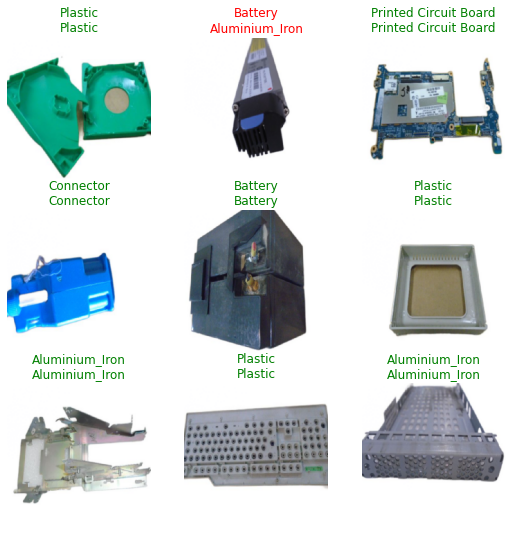

In [30]:
learn.show_results()

In [31]:
learn.dls.loss_func

FlattenedLoss of CrossEntropyLoss()

In [32]:
interp = ClassificationInterpretation.from_learner(learn)

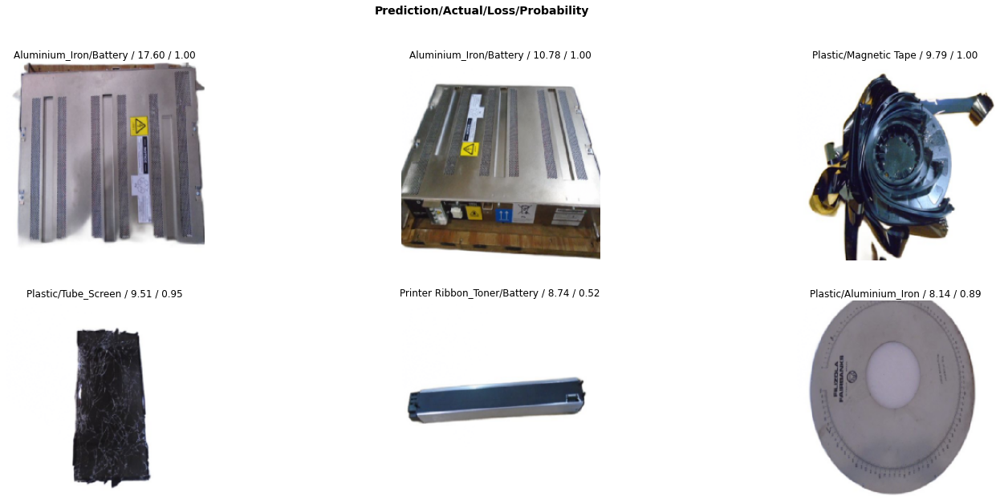

In [33]:
interp.plot_top_losses(6, figsize=(25,10))

In [34]:
interp.print_classification_report()

                       precision    recall  f1-score   support

       Aluminium_Iron       0.84      0.79      0.82        92
              Battery       0.81      0.81      0.81        43
           Cable_Wire       0.96      0.96      0.96        23
      Cardboard_Paper       0.91      0.77      0.83        13
            Connector       0.80      0.92      0.86        13
               Copper       0.93      0.93      0.93        14
        Magnetic Tape       0.67      0.50      0.57         4
              Plastic       0.74      0.78      0.76        55
Printed Circuit Board       0.96      1.00      0.98        47
 Printer Ribbon_Toner       0.62      0.80      0.70        10
          Tube_Screen       0.89      0.80      0.84        20

             accuracy                           0.84       334
            macro avg       0.83      0.82      0.82       334
         weighted avg       0.84      0.84      0.84       334



In [35]:
interp.most_confused()

[('Aluminium_Iron', 'Plastic', 9),
 ('Plastic', 'Aluminium_Iron', 6),
 ('Battery', 'Aluminium_Iron', 5),
 ('Aluminium_Iron', 'Battery', 3),
 ('Aluminium_Iron', 'Connector', 2),
 ('Aluminium_Iron', 'Printer Ribbon_Toner', 2),
 ('Plastic', 'Battery', 2),
 ('Printer Ribbon_Toner', 'Aluminium_Iron', 2),
 ('Tube_Screen', 'Battery', 2),
 ('Tube_Screen', 'Plastic', 2),
 ('Aluminium_Iron', 'Cable_Wire', 1),
 ('Aluminium_Iron', 'Cardboard_Paper', 1),
 ('Aluminium_Iron', 'Magnetic Tape', 1),
 ('Battery', 'Plastic', 1),
 ('Battery', 'Printed Circuit Board', 1),
 ('Battery', 'Printer Ribbon_Toner', 1),
 ('Cable_Wire', 'Plastic', 1),
 ('Cardboard_Paper', 'Battery', 1),
 ('Cardboard_Paper', 'Plastic', 1),
 ('Cardboard_Paper', 'Printer Ribbon_Toner', 1),
 ('Connector', 'Printer Ribbon_Toner', 1),
 ('Copper', 'Aluminium_Iron', 1),
 ('Magnetic Tape', 'Plastic', 1),
 ('Magnetic Tape', 'Tube_Screen', 1),
 ('Plastic', 'Connector', 1),
 ('Plastic', 'Copper', 1),
 ('Plastic', 'Printed Circuit Board', 1),
 (

Interpretation.plot_top_losses(k: 'int | list', largest: 'bool' = True, **kwargs)
Show `k` largest(/smallest) preds and losses. Implementation based on type dispatch

To get a prettier result with hyperlinks to source code and documentation, install nbdev: pip install nbdev


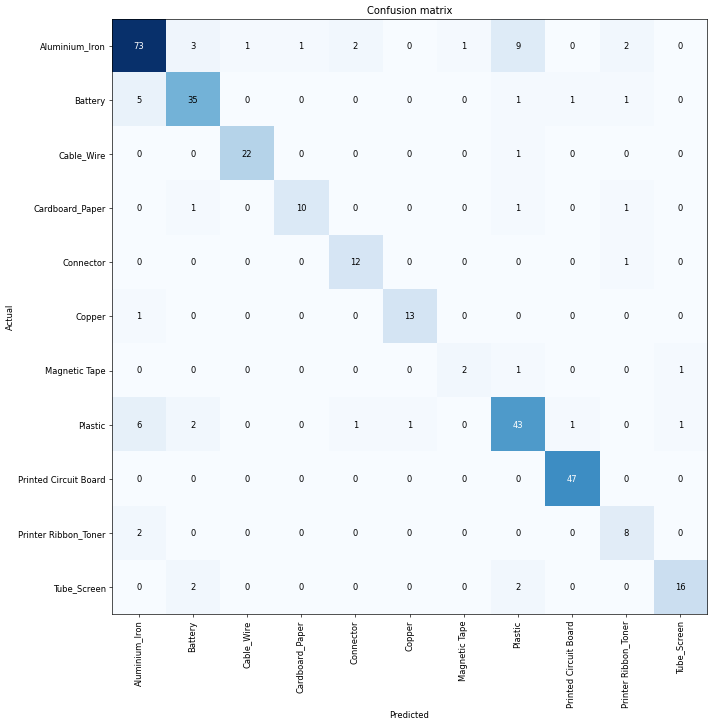

In [36]:
doc(interp.plot_top_losses)
interp.plot_confusion_matrix(figsize=(12,12), dpi=60)

In [37]:
preds = learn.get_preds()

In [38]:
print(preds[0].shape)
preds[0]

torch.Size([334, 11])


TensorBase([[2.5026e-01, 1.4689e-03, 1.4440e-04,  ..., 4.4641e-04,
             1.2376e-05, 3.0883e-03],
            [3.7081e-01, 6.6447e-03, 3.9023e-05,  ..., 1.4026e-04,
             1.1117e-04, 7.8785e-06],
            [9.7409e-01, 2.9529e-07, 1.9395e-07,  ..., 3.9715e-07,
             1.6405e-05, 1.2718e-07],
            ...,
            [2.4446e-06, 6.7339e-08, 7.9356e-08,  ..., 4.5162e-09,
             5.8337e-07, 9.9880e-01],
            [9.1375e-05, 6.3949e-04, 3.8953e-05,  ..., 6.9054e-04,
             1.4119e-05, 9.9787e-01],
            [9.9276e-04, 5.6847e-03, 1.0944e-04,  ..., 2.4341e-03,
             1.7439e-04, 7.3839e-05]])

In [39]:
labels = list(learn.dls.train_ds.items.Class.unique())
labels

['Aluminium_Iron',
 'Battery',
 'Cable_Wire',
 'Cardboard_Paper',
 'Connector',
 'Copper',
 'Magnetic Tape',
 'Plastic',
 'Printed Circuit Board',
 'Printer Ribbon_Toner',
 'Tube_Screen']

In [40]:
## saves the index of most likely (max) predicted class for each image
max_idxs = np.asarray(np.argmax(preds[0],axis=1))
max_idxs

yhat = []
for max_idx in max_idxs:
    yhat.append(labels[max_idx])

## convert POSIX paths to string first
y = []
for label_path in learn.dls.valid_ds.items.Class:
    y.append(str(label_path))

learn.dls.valid_ds.items.Class.unique()

## predicted values
print(yhat[0:5])

## actual values
print(y[0:5])

['Cardboard_Paper', 'Plastic', 'Aluminium_Iron', 'Aluminium_Iron', 'Printer Ribbon_Toner']
['Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron']


In [41]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y,yhat)
print(cm)

[[73  3  1  1  2  0  1  9  0  2  0]
 [ 5 35  0  0  0  0  0  1  1  1  0]
 [ 0  0 22  0  0  0  0  1  0  0  0]
 [ 0  1  0 10  0  0  0  1  0  1  0]
 [ 0  0  0  0 12  0  0  0  0  1  0]
 [ 1  0  0  0  0 13  0  0  0  0  0]
 [ 0  0  0  0  0  0  2  1  0  0  1]
 [ 6  2  0  0  1  1  0 43  1  0  1]
 [ 0  0  0  0  0  0  0  0 47  0  0]
 [ 2  0  0  0  0  0  0  0  0  8  0]
 [ 0  2  0  0  0  0  0  2  0  0 16]]


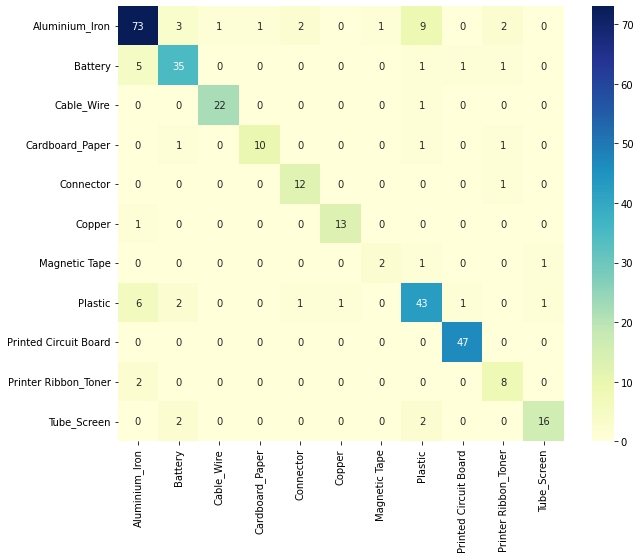

In [42]:
df_cm = pd.DataFrame(cm,learn.dls.valid_ds.items.Class.unique(),learn.dls.valid_ds.items.Class.unique())

plt.figure(figsize=(10,8))

import seaborn as sns

sns.heatmap(df_cm,annot=True,fmt="d",cmap="YlGnBu")

In [43]:
correct = 0

for r in range(len(cm)):
    for c in range(len(cm)):
        if (r==c):
            correct += cm[r,c]

accuracy = correct/sum(sum(cm))
accuracy

0.8413173652694611

### Fold 3

In [15]:
fold_nbr = 3
fold_name = 'fold3'
model_name = 'resnet101'

learn = create_cnn_learner(pct_images=1, 
                           deterministic=True, 
                           size=224, 
                           img_path = '/content/gdrive/My Drive/ewaste_data/full_segmented2/',
                           split_path = '/content/gdrive/My Drive/ewaste_data/full_segmented2/',
                           model_dir = '/content/gdrive/My Drive/ewaste_data/models/option2/' + model_name + '/' + fold_name,
                           log_name = '/content/gdrive/My Drive/ewaste_data/dataframes/option2/' + model_name + '/' + fold_name + '/' + 'log_' + model_name + '_' + fold_name + '.csv',
                           oversampling=True,
                           dfs_path='/content/gdrive/My Drive/ewaste_data/dataframes/option2/' + model_name + '/' + fold_name,
                           fold=fold_nbr,
                           arch=model_name)

Random state set:101, cuda used: True
Split Path defined, preparing pseudo stratified split.
Creating path:label dataframe from /content/gdrive/My Drive/ewaste_data/full_segmented2/, using 100.00% of the images (1670 images.) Shuffle = False.
Preparing stratified 5 fold split, random state is 101. Returning fold 3.
Creating path:label dataframe from /content/gdrive/My Drive/ewaste_data/full_segmented2/, using 100.00% of the images (1670 images.) Shuffle = False.
We have 11 classes, with a training set of size 1336, and a validation set of size 334
The main split has 80.00% training data with 11 classes, the reduced split has 80.00 % training data, with 11 classes.


/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet101_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [16]:
learn.arch

<function torchvision.models.resnet.resnet101(*, weights: Union[torchvision.models.resnet.ResNet101_Weights, NoneType] = None, progress: bool = True, **kwargs: Any) -> torchvision.models.resnet.ResNet>

In [ ]:
len(learn.dls.get_idxs())

3340

In [ ]:
idxs = learn.dls.train.get_idxs()
learn.dls.train.items.iloc[idxs].Class.value_counts()

Cable_Wire               327
Aluminium_Iron           321
Plastic                  319
Printer Ribbon_Toner     311
Connector                307
Tube_Screen              302
Printed Circuit Board    297
Magnetic Tape            297
Copper                   294
Cardboard_Paper          284
Battery                  281
Name: Class, dtype: int64

Freezing model body
44,612,160 total parameters.
2,217,344 training parameters.


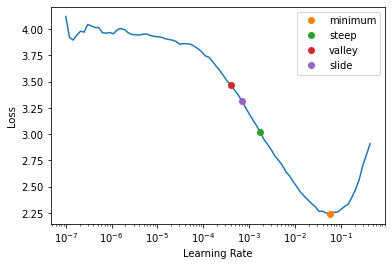

In [17]:
print(f'Freezing model body')
learn.freeze()
enumerate_params(learn)
_,_,valley_freeze,_ = learn.lr_find(suggest_funcs=(minimum, steep, valley, slide))

In [18]:
valley_freeze

0.0003981071640737355

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,error_rate,precision_score,recall_score,f1_score,time
0,2.659089,1.518755,0.517964,0.892216,0.482036,0.517964,0.517964,0.517964,00:13
1,1.415347,1.081098,0.712575,0.949102,0.287425,0.712575,0.712575,0.712575,00:13
2,0.805902,0.926419,0.754491,0.958084,0.245509,0.754491,0.754491,0.754491,00:13
3,0.516040,0.867567,0.781437,0.955090,0.218563,0.781437,0.781437,0.781437,00:13
4,0.349261,0.829535,0.778443,0.973054,0.221557,0.778443,0.778443,0.778443,00:13
5,0.251610,0.742158,0.811377,0.973054,0.188623,0.811377,0.811377,0.811377,00:13
6,0.193314,0.728150,0.817365,0.982036,0.182635,0.817365,0.817365,0.817365,00:13
7,0.172056,0.723253,0.820359,0.973054,0.179641,0.820359,0.820359,0.820359,00:13
8,0.138886,0.710588,0.820359,0.973054,0.179641,0.820359,0.820359,0.820359,00:13
9,0.141400,0.702403,0.814371,0.976048,0.185629,0.814371,0.814371,0.814371,00:13


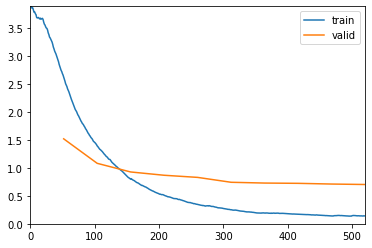

Path('/content/gdrive/My Drive/ewaste_data/models/option2/resnet101/fold3/stage-1-full_segmented2_oversampled_resnet101_fold3.pth')

In [19]:
learn.fit_one_cycle(10, lr_max=valley_freeze)
learn.save('stage-1-full_segmented2_oversampled_' + model_name + '_' + fold_name)

Unfreezing model body
44,612,160 total parameters.
44,612,160 training parameters.


SuggestedLRs(minimum=5.248074739938602e-06, steep=1.3182567499825382e-06, valley=2.0892961401841603e-05, slide=3.0199516913853586e-05)

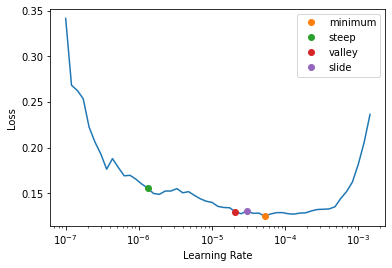

In [20]:
print(f'Unfreezing model body')
learn.unfreeze()
enumerate_params(learn)
learn.lr_find(suggest_funcs=(minimum, steep, valley, slide))

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,error_rate,precision_score,recall_score,f1_score,time
0,0.133234,0.722495,0.823353,0.970060,0.176647,0.823353,0.823353,0.823353,00:15
1,0.169971,1.003180,0.745509,0.982036,0.254491,0.745509,0.745509,0.745509,00:15
2,0.239265,1.012610,0.757485,0.982036,0.242515,0.757485,0.757485,0.757485,00:15
3,0.226283,0.910420,0.778443,0.982036,0.221557,0.778443,0.778443,0.778443,00:15
4,0.151155,0.902162,0.778443,0.991018,0.221557,0.778443,0.778443,0.778443,00:15
5,0.111220,0.717517,0.826347,0.985030,0.173653,0.826347,0.826347,0.826347,00:15
6,0.064886,0.685672,0.844311,0.985030,0.155689,0.844311,0.844311,0.844311,00:15
7,0.038854,0.732091,0.853293,0.985030,0.146707,0.853293,0.853293,0.853293,00:15
8,0.020703,0.726185,0.856287,0.982036,0.143713,0.856287,0.856287,0.856287,00:15
9,0.015166,0.728542,0.853293,0.982036,0.146707,0.853293,0.853293,0.853293,00:15


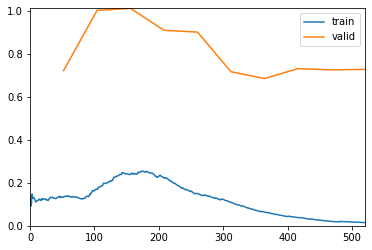

Path('/content/gdrive/My Drive/ewaste_data/models/option2/resnet101/fold3/stage-2-full_segmented2_oversampled_resnet101_fold3.pth')

In [21]:
learn.fit_one_cycle(10, lr_max=slice(5e-5, 5e-4))
learn.save('stage-2-full_segmented2_oversampled_' + model_name + '_' + fold_name)

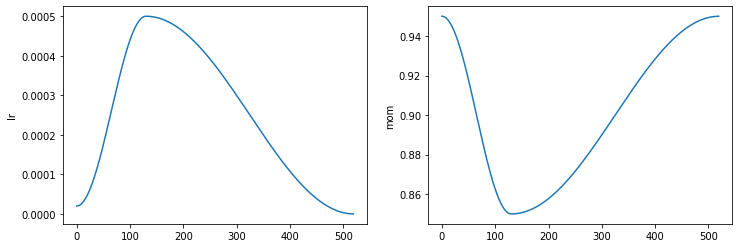

In [22]:
# In practice, we use the fit_one_cycle function, with the learning rates used representing the maximum learning rate 
# in a one cycle policy with cosine annealing, as can be seen below. 
# Note that the x-axis below represents the number of batches passed through the learner.

learn.recorder.plot_sched()

In [23]:
L(learn.recorder.values)

(#10) [[0.13323423266410828, 0.7224951386451721, 0.8233532905578613, 0.970059871673584, 0.17664670944213867, 0.8233532934131736, 0.8233532934131736, 0.8233532934131736],[0.16997107863426208, 1.0031803846359253, 0.7455089688301086, 0.9820359349250793, 0.25449103116989136, 0.7455089820359282, 0.7455089820359282, 0.7455089820359282],[0.23926515877246857, 1.0126100778579712, 0.757485032081604, 0.9820359349250793, 0.242514967918396, 0.7574850299401198, 0.7574850299401198, 0.7574850299401198],[0.22628337144851685, 0.9104196429252625, 0.7784430980682373, 0.9820359349250793, 0.2215568870306015, 0.7784431137724551, 0.7784431137724551, 0.7784431137724551],[0.1511545479297638, 0.9021618962287903, 0.7784430980682373, 0.9910179376602173, 0.2215568870306015, 0.7784431137724551, 0.7784431137724551, 0.7784431137724551],[0.11122003197669983, 0.7175174951553345, 0.826347291469574, 0.985029935836792, 0.17365269362926483, 0.8263473053892215, 0.8263473053892215, 0.8263473053892215],[0.0648856908082962, 0.6

In [24]:
learn.validate()

(#7) [0.7285420298576355,0.8532934188842773,0.9820359349250793,0.14670658111572266,0.8532934131736527,0.8532934131736527,0.8532934131736527]

In [25]:
learn.recorder.values[-1][2]

0.9820359349250793

In [26]:
learn.dls.vocab

['Aluminium_Iron', 'Battery', 'Cable_Wire', 'Cardboard_Paper', 'Connector', 'Copper', 'Magnetic Tape', 'Plastic', 'Printed Circuit Board', 'Printer Ribbon_Toner', 'Tube_Screen']

In [27]:
learn.load('/content/gdrive/My Drive/ewaste_data/models/option2/'+ model_name + '/' + fold_name + '/stage-2-full_segmented2_oversampled_' + model_name + '_' + fold_name)

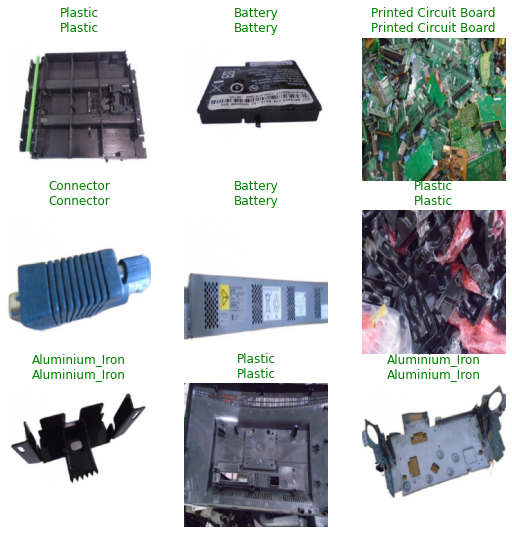

In [28]:
learn.show_results()

In [29]:
learn.dls.loss_func

FlattenedLoss of CrossEntropyLoss()

In [30]:
interp = ClassificationInterpretation.from_learner(learn)

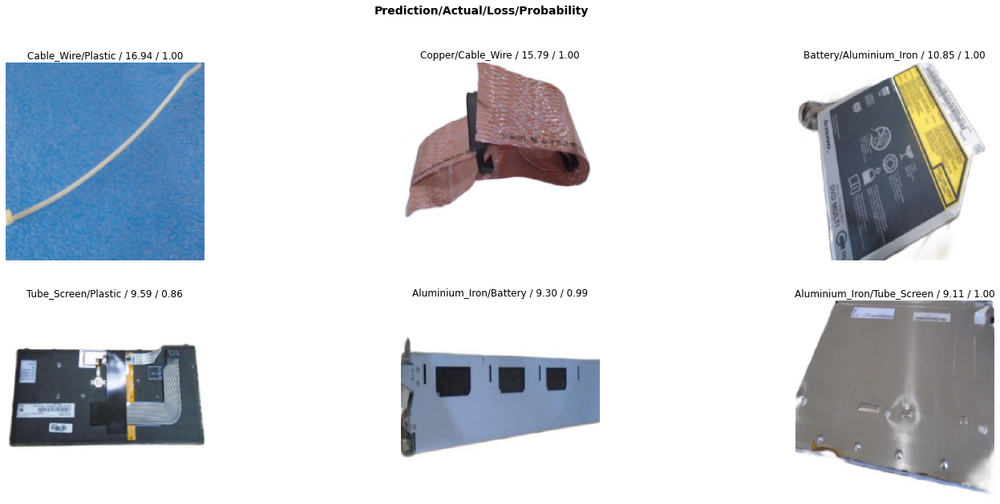

In [31]:
interp.plot_top_losses(6, figsize=(25,10))

In [32]:
interp.print_classification_report()

                       precision    recall  f1-score   support

       Aluminium_Iron       0.81      0.90      0.85        92
              Battery       0.86      0.88      0.87        43
           Cable_Wire       0.86      0.83      0.84        23
      Cardboard_Paper       0.85      0.85      0.85        13
            Connector       0.93      1.00      0.96        13
               Copper       0.88      1.00      0.93        14
        Magnetic Tape       1.00      0.50      0.67         4
              Plastic       0.80      0.64      0.71        55
Printed Circuit Board       0.94      1.00      0.97        47
 Printer Ribbon_Toner       1.00      0.80      0.89        10
          Tube_Screen       0.83      0.75      0.79        20

             accuracy                           0.85       334
            macro avg       0.89      0.83      0.85       334
         weighted avg       0.85      0.85      0.85       334



In [33]:
interp.most_confused()

[('Plastic', 'Aluminium_Iron', 12),
 ('Aluminium_Iron', 'Plastic', 5),
 ('Plastic', 'Battery', 3),
 ('Tube_Screen', 'Aluminium_Iron', 3),
 ('Aluminium_Iron', 'Battery', 2),
 ('Battery', 'Aluminium_Iron', 2),
 ('Battery', 'Printed Circuit Board', 2),
 ('Cable_Wire', 'Copper', 2),
 ('Magnetic Tape', 'Aluminium_Iron', 2),
 ('Plastic', 'Cable_Wire', 2),
 ('Plastic', 'Tube_Screen', 2),
 ('Printer Ribbon_Toner', 'Plastic', 2),
 ('Aluminium_Iron', 'Cardboard_Paper', 1),
 ('Aluminium_Iron', 'Printed Circuit Board', 1),
 ('Battery', 'Plastic', 1),
 ('Cable_Wire', 'Aluminium_Iron', 1),
 ('Cable_Wire', 'Cardboard_Paper', 1),
 ('Cardboard_Paper', 'Battery', 1),
 ('Cardboard_Paper', 'Tube_Screen', 1),
 ('Plastic', 'Connector', 1),
 ('Tube_Screen', 'Cable_Wire', 1),
 ('Tube_Screen', 'Plastic', 1)]

Interpretation.plot_top_losses(k: 'int | list', largest: 'bool' = True, **kwargs)
Show `k` largest(/smallest) preds and losses. Implementation based on type dispatch

To get a prettier result with hyperlinks to source code and documentation, install nbdev: pip install nbdev


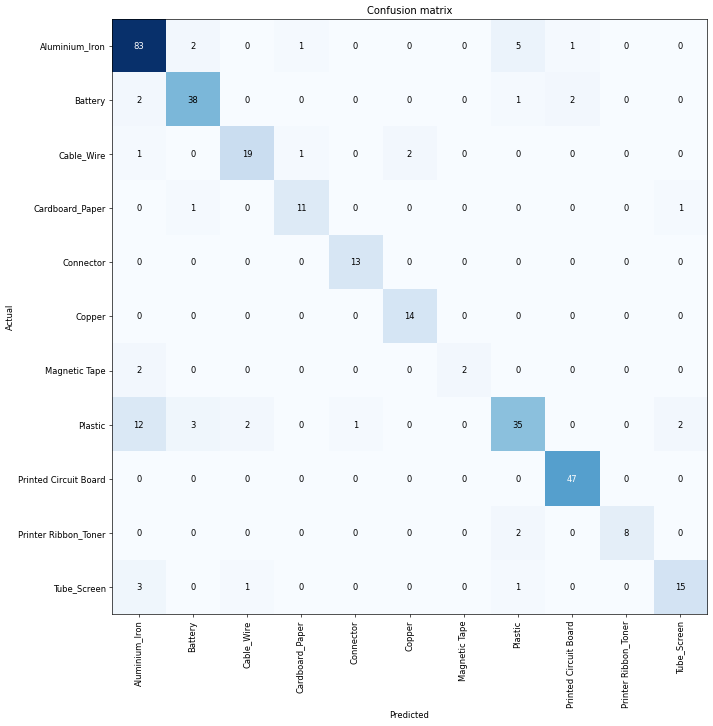

In [34]:
doc(interp.plot_top_losses)
interp.plot_confusion_matrix(figsize=(12,12), dpi=60)

In [35]:
preds = learn.get_preds()

In [36]:
print(preds[0].shape)
preds[0]

torch.Size([334, 11])


TensorBase([[9.9993e-01, 4.5662e-08, 2.2718e-07,  ..., 9.7919e-06,
             7.6749e-08, 4.3358e-07],
            [1.0000e+00, 3.6856e-10, 1.1911e-08,  ..., 5.2931e-07,
             1.5145e-09, 7.3620e-08],
            [6.8344e-01, 2.7963e-01, 3.3262e-04,  ..., 6.6311e-03,
             2.1735e-03, 8.4204e-04],
            ...,
            [8.8634e-05, 2.8017e-03, 1.3914e-06,  ..., 9.4697e-07,
             4.1000e-07, 9.9707e-01],
            [4.3367e-04, 2.0319e-07, 1.5021e-05,  ..., 8.1543e-07,
             4.7912e-06, 9.9931e-01],
            [2.5692e-03, 5.5410e-03, 9.5477e-06,  ..., 1.7937e-02,
             1.3522e-06, 9.7357e-01]])

In [37]:
labels = list(learn.dls.train_ds.items.Class.unique())
labels

['Aluminium_Iron',
 'Battery',
 'Cable_Wire',
 'Cardboard_Paper',
 'Connector',
 'Copper',
 'Magnetic Tape',
 'Plastic',
 'Printed Circuit Board',
 'Printer Ribbon_Toner',
 'Tube_Screen']

In [38]:
## saves the index of most likely (max) predicted class for each image
max_idxs = np.asarray(np.argmax(preds[0],axis=1))
max_idxs

yhat = []
for max_idx in max_idxs:
    yhat.append(labels[max_idx])

## convert POSIX paths to string first
y = []
for label_path in learn.dls.valid_ds.items.Class:
    y.append(str(label_path))

learn.dls.valid_ds.items.Class.unique()

## predicted values
print(yhat[0:5])

## actual values
print(y[0:5])

['Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron']
['Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron']


In [39]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y,yhat)
print(cm)

[[83  2  0  1  0  0  0  5  1  0  0]
 [ 2 38  0  0  0  0  0  1  2  0  0]
 [ 1  0 19  1  0  2  0  0  0  0  0]
 [ 0  1  0 11  0  0  0  0  0  0  1]
 [ 0  0  0  0 13  0  0  0  0  0  0]
 [ 0  0  0  0  0 14  0  0  0  0  0]
 [ 2  0  0  0  0  0  2  0  0  0  0]
 [12  3  2  0  1  0  0 35  0  0  2]
 [ 0  0  0  0  0  0  0  0 47  0  0]
 [ 0  0  0  0  0  0  0  2  0  8  0]
 [ 3  0  1  0  0  0  0  1  0  0 15]]


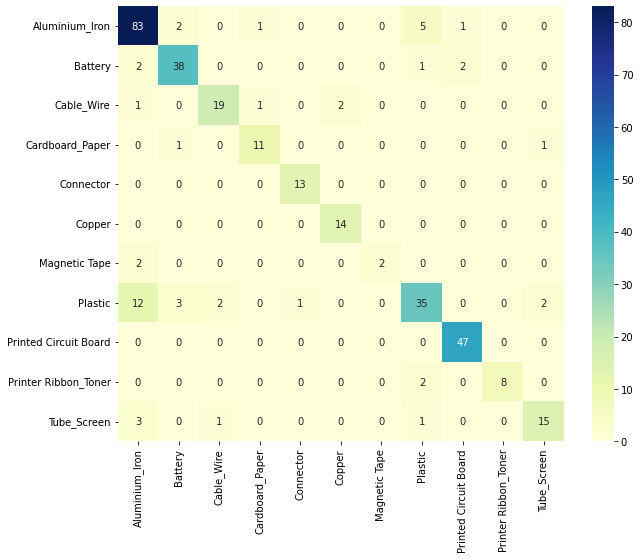

In [40]:
df_cm = pd.DataFrame(cm,learn.dls.valid_ds.items.Class.unique(),learn.dls.valid_ds.items.Class.unique())

plt.figure(figsize=(10,8))

import seaborn as sns

sns.heatmap(df_cm,annot=True,fmt="d",cmap="YlGnBu")

In [41]:
correct = 0

for r in range(len(cm)):
    for c in range(len(cm)):
        if (r==c):
            correct += cm[r,c]

accuracy = correct/sum(sum(cm))
accuracy

0.8532934131736527

### Fold 4

In [15]:
fold_nbr = 4
fold_name = 'fold4'
model_name = 'resnet101'

learn = create_cnn_learner(pct_images=1, 
                           deterministic=True, 
                           size=224, 
                           img_path = '/content/gdrive/My Drive/ewaste_data/full_segmented2/',
                           split_path = '/content/gdrive/My Drive/ewaste_data/full_segmented2/',
                           model_dir = '/content/gdrive/My Drive/ewaste_data/models/option2/' + model_name + '/' + fold_name,
                           log_name = '/content/gdrive/My Drive/ewaste_data/dataframes/option2/' + model_name + '/' + fold_name + '/' + 'log_' + model_name + '_' + fold_name + '.csv',
                           oversampling=True,
                           dfs_path='/content/gdrive/My Drive/ewaste_data/dataframes/option2/' + model_name + '/' + fold_name,
                           fold=fold_nbr,
                           arch=model_name)

Random state set:101, cuda used: True
Split Path defined, preparing pseudo stratified split.
Creating path:label dataframe from /content/gdrive/My Drive/ewaste_data/full_segmented2/, using 100.00% of the images (1670 images.) Shuffle = False.
Preparing stratified 5 fold split, random state is 101. Returning fold 4.
Creating path:label dataframe from /content/gdrive/My Drive/ewaste_data/full_segmented2/, using 100.00% of the images (1670 images.) Shuffle = False.
We have 11 classes, with a training set of size 1336, and a validation set of size 334
The main split has 80.00% training data with 11 classes, the reduced split has 80.00 % training data, with 11 classes.


/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet101_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [16]:
learn.arch

<function torchvision.models.resnet.resnet101(*, weights: Union[torchvision.models.resnet.ResNet101_Weights, NoneType] = None, progress: bool = True, **kwargs: Any) -> torchvision.models.resnet.ResNet>

In [17]:
len(learn.dls.get_idxs())

3340

In [18]:
idxs = learn.dls.train.get_idxs()
learn.dls.train.items.iloc[idxs].Class.value_counts()

Cable_Wire               327
Aluminium_Iron           321
Plastic                  319
Printer Ribbon_Toner     311
Connector                307
Tube_Screen              302
Printed Circuit Board    297
Magnetic Tape            297
Copper                   294
Cardboard_Paper          284
Battery                  281
Name: Class, dtype: int64

Freezing model body
44,612,160 total parameters.
2,217,344 training parameters.


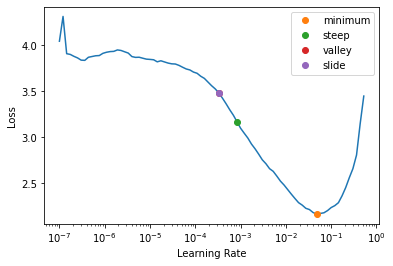

In [19]:
print(f'Freezing model body')
learn.freeze()
enumerate_params(learn)
_,_,valley_freeze,_ = learn.lr_find(suggest_funcs=(minimum, steep, valley, slide))

In [20]:
valley_freeze

0.0003311311302240938

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,error_rate,precision_score,recall_score,f1_score,time
0,2.725908,1.973185,0.449102,0.847305,0.550898,0.449102,0.449102,0.449102,00:13
1,1.480032,1.954191,0.652695,0.961078,0.347305,0.652695,0.652695,0.652695,00:13
2,0.849494,1.310848,0.724551,0.985030,0.275449,0.724551,0.724551,0.724551,00:13
3,0.560917,1.394546,0.724551,0.988024,0.275449,0.724551,0.724551,0.724551,00:13
4,0.382299,1.350002,0.724551,0.985030,0.275449,0.724551,0.724551,0.724551,00:13
5,0.300509,1.071123,0.769461,0.979042,0.230539,0.769461,0.769461,0.769461,00:13
6,0.228156,0.914920,0.760479,0.979042,0.239521,0.760479,0.760479,0.760479,00:13
7,0.196048,0.909553,0.781437,0.979042,0.218563,0.781437,0.781437,0.781437,00:13
8,0.185265,1.067749,0.775449,0.985030,0.224551,0.775449,0.775449,0.775449,00:13
9,0.162520,0.891942,0.769461,0.979042,0.230539,0.769461,0.769461,0.769461,00:13


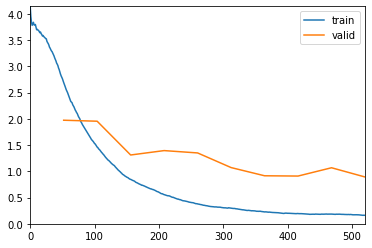

Path('/content/gdrive/My Drive/ewaste_data/models/option2/resnet101/fold4/stage-1-full_segmented2_oversampled_resnet101_fold4.pth')

In [21]:
learn.fit_one_cycle(10, lr_max=valley_freeze)
learn.save('stage-1-full_segmented2_oversampled_' + model_name + '_' + fold_name)

Unfreezing model body
44,612,160 total parameters.
44,612,160 training parameters.


SuggestedLRs(minimum=7.585775847473997e-08, steep=3.311311274956097e-06, valley=1.2022644114040304e-05, slide=4.365158383734524e-05)

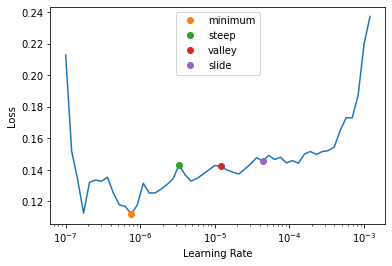

In [22]:
print(f'Unfreezing model body')
learn.unfreeze()
enumerate_params(learn)
learn.lr_find(suggest_funcs=(minimum, steep, valley, slide))

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,error_rate,precision_score,recall_score,f1_score,time
0,0.151075,0.905206,0.772455,0.979042,0.227545,0.772455,0.772455,0.772455,00:15
1,0.134280,0.907530,0.790419,0.979042,0.209581,0.790419,0.790419,0.790419,00:15
2,0.105434,0.746017,0.805389,0.976048,0.194611,0.805389,0.805389,0.805389,00:15
3,0.082660,0.786001,0.784431,0.985030,0.215569,0.784431,0.784431,0.784431,00:15
4,0.061311,0.758478,0.796407,0.988024,0.203593,0.796407,0.796407,0.796407,00:15
5,0.051371,0.830948,0.805389,0.979042,0.194611,0.805389,0.805389,0.805389,00:15
6,0.040312,0.855810,0.784431,0.970060,0.215569,0.784431,0.784431,0.784431,00:15
7,0.033368,0.801658,0.796407,0.970060,0.203593,0.796407,0.796407,0.796407,00:15
8,0.027648,0.793925,0.796407,0.976048,0.203593,0.796407,0.796407,0.796407,00:15
9,0.023430,0.760771,0.802395,0.970060,0.197605,0.802395,0.802395,0.802395,00:15


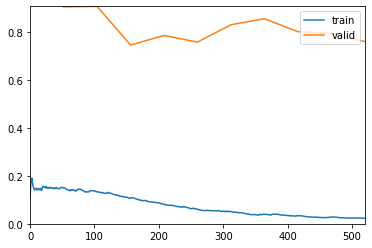

Path('/content/gdrive/My Drive/ewaste_data/models/option2/resnet101/fold4/stage-2-full_segmented2_oversampled_resnet101_fold4.pth')

In [23]:
learn.fit_one_cycle(10, lr_max=slice(1e-5, 1e-4))
learn.save('stage-2-full_segmented2_oversampled_' + model_name + '_' + fold_name)

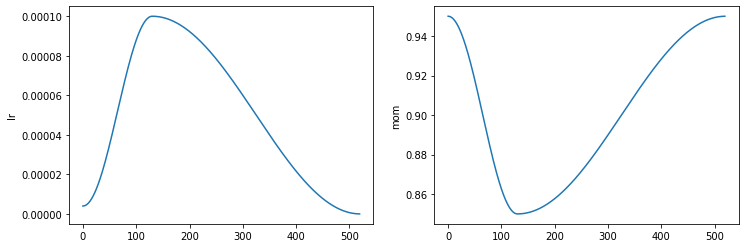

In [24]:
# In practice, we use the fit_one_cycle function, with the learning rates used representing the maximum learning rate 
# in a one cycle policy with cosine annealing, as can be seen below. 
# Note that the x-axis below represents the number of batches passed through the learner.

learn.recorder.plot_sched()

In [25]:
L(learn.recorder.values)

(#10) [[0.1510753035545349, 0.905206024646759, 0.772455096244812, 0.9790419340133667, 0.227544903755188, 0.7724550898203593, 0.7724550898203593, 0.7724550898203594],[0.13427957892417908, 0.9075295329093933, 0.7904191613197327, 0.9790419340133667, 0.20958083868026733, 0.7904191616766467, 0.7904191616766467, 0.7904191616766467],[0.10543408244848251, 0.7460174560546875, 0.8053892254829407, 0.976047933101654, 0.19461077451705933, 0.8053892215568862, 0.8053892215568862, 0.8053892215568861],[0.08266019076108932, 0.7860010862350464, 0.7844311594963074, 0.985029935836792, 0.21556885540485382, 0.7844311377245509, 0.7844311377245509, 0.7844311377245508],[0.06131094694137573, 0.7584775686264038, 0.796407163143158, 0.9880239367485046, 0.20359280705451965, 0.7964071856287425, 0.7964071856287425, 0.7964071856287425],[0.051370956003665924, 0.8309480547904968, 0.8053892254829407, 0.9790419340133667, 0.19461077451705933, 0.8053892215568862, 0.8053892215568862, 0.8053892215568861],[0.040311548858881, 0.

In [26]:
learn.validate()

(#7) [0.7607710361480713,0.802395224571228,0.970059871673584,0.19760479032993317,0.8023952095808383,0.8023952095808383,0.8023952095808384]

In [27]:
learn.recorder.values[-1][2]

0.970059871673584

In [28]:
learn.dls.vocab

['Aluminium_Iron', 'Battery', 'Cable_Wire', 'Cardboard_Paper', 'Connector', 'Copper', 'Magnetic Tape', 'Plastic', 'Printed Circuit Board', 'Printer Ribbon_Toner', 'Tube_Screen']

In [29]:
learn.load('/content/gdrive/My Drive/ewaste_data/models/option2/'+ model_name + '/' + fold_name + '/stage-2-full_segmented2_oversampled_' + model_name + '_' + fold_name)

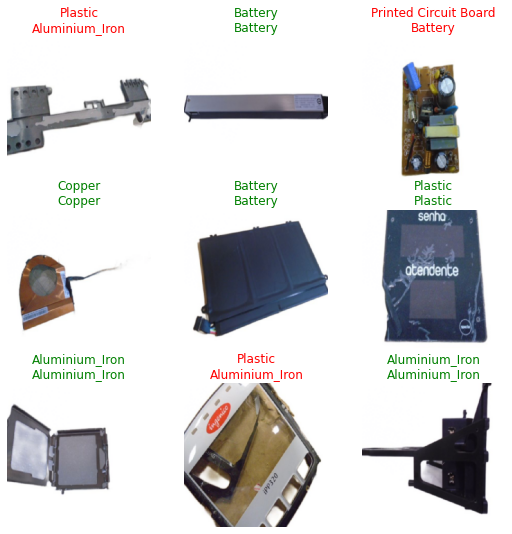

In [30]:
learn.show_results()

In [31]:
learn.dls.loss_func

FlattenedLoss of CrossEntropyLoss()

In [32]:
interp = ClassificationInterpretation.from_learner(learn)

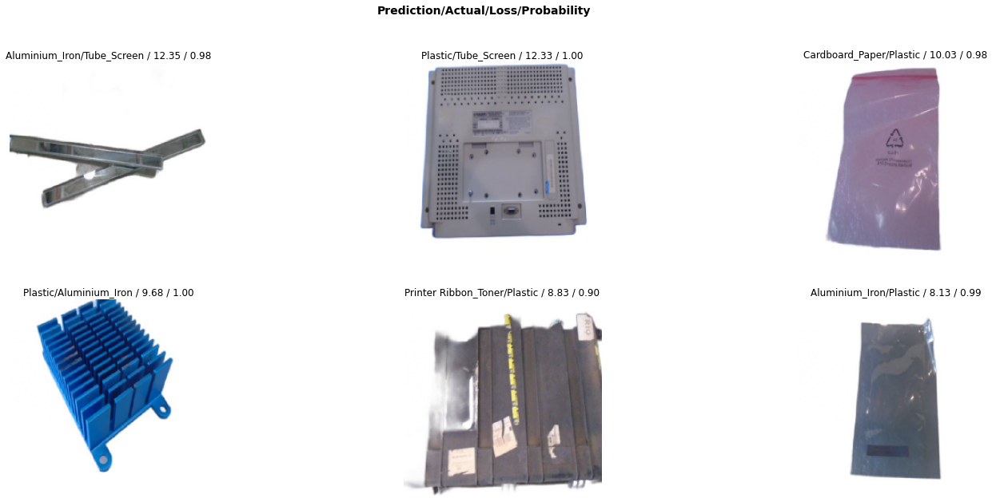

In [33]:
interp.plot_top_losses(6, figsize=(25,10))

In [34]:
interp.print_classification_report()

                       precision    recall  f1-score   support

       Aluminium_Iron       0.78      0.89      0.83        92
              Battery       0.84      0.88      0.86        43
           Cable_Wire       1.00      1.00      1.00        23
      Cardboard_Paper       0.53      0.62      0.57        13
            Connector       0.89      0.67      0.76        12
               Copper       0.82      0.93      0.87        15
        Magnetic Tape       0.67      0.67      0.67         3
              Plastic       0.76      0.55      0.64        56
Printed Circuit Board       0.93      0.89      0.91        47
 Printer Ribbon_Toner       0.54      0.70      0.61        10
          Tube_Screen       0.72      0.65      0.68        20

             accuracy                           0.80       334
            macro avg       0.77      0.77      0.77       334
         weighted avg       0.81      0.80      0.80       334



In [35]:
interp.most_confused()

[('Plastic', 'Aluminium_Iron', 13),
 ('Plastic', 'Cardboard_Paper', 5),
 ('Tube_Screen', 'Aluminium_Iron', 5),
 ('Aluminium_Iron', 'Tube_Screen', 4),
 ('Aluminium_Iron', 'Plastic', 3),
 ('Plastic', 'Battery', 3),
 ('Printed Circuit Board', 'Battery', 3),
 ('Battery', 'Printer Ribbon_Toner', 2),
 ('Plastic', 'Printer Ribbon_Toner', 2),
 ('Printer Ribbon_Toner', 'Plastic', 2),
 ('Aluminium_Iron', 'Connector', 1),
 ('Aluminium_Iron', 'Printed Circuit Board', 1),
 ('Aluminium_Iron', 'Printer Ribbon_Toner', 1),
 ('Battery', 'Cardboard_Paper', 1),
 ('Battery', 'Copper', 1),
 ('Battery', 'Printed Circuit Board', 1),
 ('Cardboard_Paper', 'Aluminium_Iron', 1),
 ('Cardboard_Paper', 'Battery', 1),
 ('Cardboard_Paper', 'Copper', 1),
 ('Cardboard_Paper', 'Plastic', 1),
 ('Cardboard_Paper', 'Printed Circuit Board', 1),
 ('Connector', 'Aluminium_Iron', 1),
 ('Connector', 'Cardboard_Paper', 1),
 ('Connector', 'Plastic', 1),
 ('Connector', 'Printer Ribbon_Toner', 1),
 ('Copper', 'Plastic', 1),
 ('Magne

Interpretation.plot_top_losses(k: 'int | list', largest: 'bool' = True, **kwargs)
Show `k` largest(/smallest) preds and losses. Implementation based on type dispatch

To get a prettier result with hyperlinks to source code and documentation, install nbdev: pip install nbdev


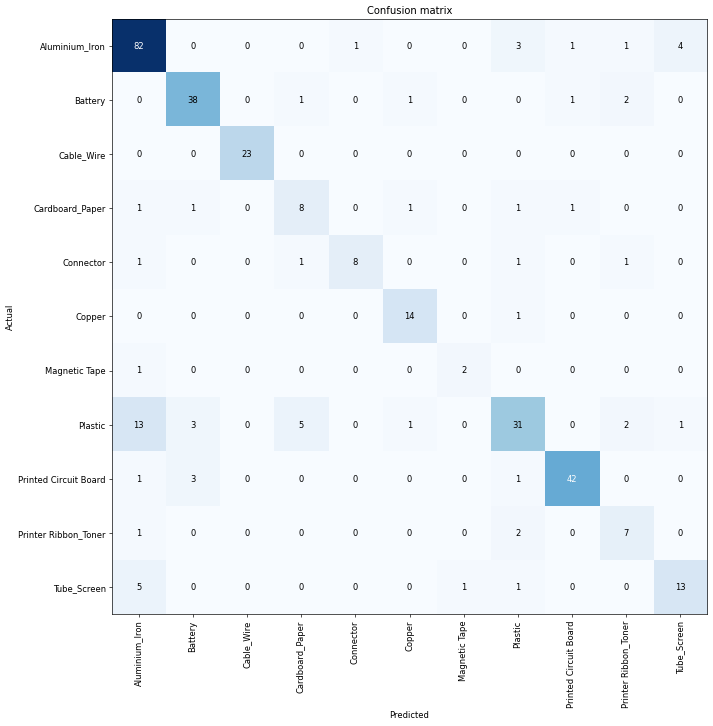

In [36]:
doc(interp.plot_top_losses)
interp.plot_confusion_matrix(figsize=(12,12), dpi=60)

In [37]:
preds = learn.get_preds()

In [38]:
print(preds[0].shape)
preds[0]

torch.Size([334, 11])


TensorBase([[9.7516e-01, 3.2044e-06, 1.0016e-06,  ..., 1.1049e-04,
             1.5114e-06, 1.0279e-05],
            [9.9373e-01, 1.7726e-03, 1.8724e-04,  ..., 8.6389e-07,
             1.1370e-05, 2.6202e-05],
            [9.9565e-01, 2.6598e-04, 4.3514e-05,  ..., 7.1330e-04,
             1.2273e-04, 9.4392e-05],
            ...,
            [1.7198e-04, 1.2998e-03, 8.0768e-08,  ..., 8.4992e-07,
             2.5649e-06, 9.9694e-01],
            [8.2207e-01, 2.5392e-05, 2.9862e-03,  ..., 1.4810e-04,
             2.7689e-06, 4.1054e-02],
            [2.3975e-06, 1.1975e-03, 3.2147e-05,  ..., 5.2623e-03,
             2.4237e-06, 9.9336e-01]])

In [39]:
labels = list(learn.dls.train_ds.items.Class.unique())
labels

['Aluminium_Iron',
 'Battery',
 'Cable_Wire',
 'Cardboard_Paper',
 'Connector',
 'Copper',
 'Magnetic Tape',
 'Plastic',
 'Printed Circuit Board',
 'Printer Ribbon_Toner',
 'Tube_Screen']

In [40]:
## saves the index of most likely (max) predicted class for each image
max_idxs = np.asarray(np.argmax(preds[0],axis=1))
max_idxs

yhat = []
for max_idx in max_idxs:
    yhat.append(labels[max_idx])

## convert POSIX paths to string first
y = []
for label_path in learn.dls.valid_ds.items.Class:
    y.append(str(label_path))

learn.dls.valid_ds.items.Class.unique()

## predicted values
print(yhat[0:5])

## actual values
print(y[0:5])

['Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron']
['Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron']


In [41]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y,yhat)
print(cm)

[[82  0  0  0  1  0  0  3  1  1  4]
 [ 0 38  0  1  0  1  0  0  1  2  0]
 [ 0  0 23  0  0  0  0  0  0  0  0]
 [ 1  1  0  8  0  1  0  1  1  0  0]
 [ 1  0  0  1  8  0  0  1  0  1  0]
 [ 0  0  0  0  0 14  0  1  0  0  0]
 [ 1  0  0  0  0  0  2  0  0  0  0]
 [13  3  0  5  0  1  0 31  0  2  1]
 [ 1  3  0  0  0  0  0  1 42  0  0]
 [ 1  0  0  0  0  0  0  2  0  7  0]
 [ 5  0  0  0  0  0  1  1  0  0 13]]


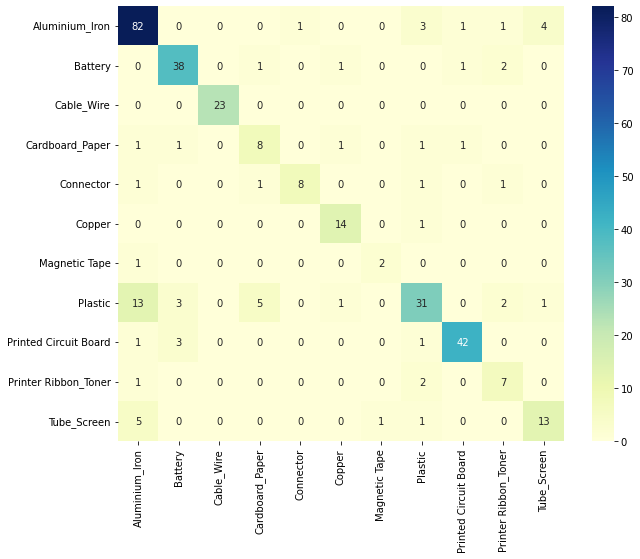

In [42]:
df_cm = pd.DataFrame(cm,learn.dls.valid_ds.items.Class.unique(),learn.dls.valid_ds.items.Class.unique())

plt.figure(figsize=(10,8))

import seaborn as sns

sns.heatmap(df_cm,annot=True,fmt="d",cmap="YlGnBu")

In [43]:
correct = 0

for r in range(len(cm)):
    for c in range(len(cm)):
        if (r==c):
            correct += cm[r,c]

accuracy = correct/sum(sum(cm))
accuracy

0.8023952095808383

## **Resnet152 (using full_segmented2)**

### Fold 0

In [15]:
fold_nbr = 0
fold_name = 'fold0'
model_name = 'resnet152'

learn = create_cnn_learner(pct_images=1, 
                           deterministic=True, 
                           size=224, 
                           img_path = '/content/gdrive/My Drive/ewaste_data/full_segmented2/',
                           split_path = '/content/gdrive/My Drive/ewaste_data/full_segmented2/',
                           model_dir = '/content/gdrive/My Drive/ewaste_data/models/option2/' + model_name + '/' + fold_name,
                           log_name = '/content/gdrive/My Drive/ewaste_data/dataframes/option2/' + model_name + '/' + fold_name + '/' + 'log_' + model_name + '_' + fold_name + '.csv',
                           oversampling=True,
                           dfs_path='/content/gdrive/My Drive/ewaste_data/dataframes/option2/' + model_name + '/' + fold_name,
                           fold=fold_nbr,
                           arch=model_name)

Random state set:101, cuda used: True
Split Path defined, preparing pseudo stratified split.
Creating path:label dataframe from /content/gdrive/My Drive/ewaste_data/full_segmented2/, using 100.00% of the images (1670 images.) Shuffle = False.
Preparing stratified 5 fold split, random state is 101. Returning fold 0.
Creating path:label dataframe from /content/gdrive/My Drive/ewaste_data/full_segmented2/, using 100.00% of the images (1670 images.) Shuffle = False.
We have 11 classes, with a training set of size 1336, and a validation set of size 334
The main split has 80.00% training data with 11 classes, the reduced split has 80.00 % training data, with 11 classes.


/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet152_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet152_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [16]:
learn.arch

<function torchvision.models.resnet.resnet152(*, weights: Union[torchvision.models.resnet.ResNet152_Weights, NoneType] = None, progress: bool = True, **kwargs: Any) -> torchvision.models.resnet.ResNet>

In [17]:
len(learn.dls.get_idxs())

3340

In [ ]:
idxs = learn.dls.train.get_idxs()
learn.dls.train.items.iloc[idxs].Class.value_counts()

Cable_Wire               327
Aluminium_Iron           321
Plastic                  319
Printer Ribbon_Toner     311
Connector                307
Tube_Screen              302
Printed Circuit Board    297
Magnetic Tape            297
Copper                   294
Cardboard_Paper          284
Battery                  281
Name: Class, dtype: int64

Freezing model body
60,255,808 total parameters.
2,263,424 training parameters.


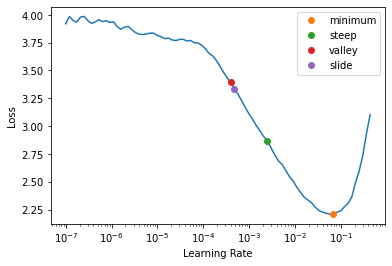

In [18]:
print(f'Freezing model body')
learn.freeze()
enumerate_params(learn)
_,_,valley_freeze,_ = learn.lr_find(suggest_funcs=(minimum, steep, valley, slide))

In [19]:
valley_freeze

0.0003981071640737355

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,error_rate,precision_score,recall_score,f1_score,time
0,2.601301,1.461027,0.517964,0.907186,0.482036,0.517964,0.517964,0.517964,00:15
1,1.381538,1.031434,0.703593,0.958084,0.296407,0.703593,0.703593,0.703593,00:16
2,0.764998,0.830378,0.763473,0.964072,0.236527,0.763473,0.763473,0.763473,00:15
3,0.444446,0.811057,0.751497,0.967066,0.248503,0.751497,0.751497,0.751497,00:16
4,0.311416,0.737237,0.790419,0.970060,0.209581,0.790419,0.790419,0.790419,00:15
5,0.229998,0.718318,0.796407,0.973054,0.203593,0.796407,0.796407,0.796407,00:15
6,0.174271,0.672497,0.802395,0.976048,0.197605,0.802395,0.802395,0.802395,00:15
7,0.147297,0.631954,0.814371,0.979042,0.185629,0.814371,0.814371,0.814371,00:15
8,0.122680,0.649655,0.811377,0.982036,0.188623,0.811377,0.811377,0.811377,00:15
9,0.119093,0.657775,0.799401,0.982036,0.200599,0.799401,0.799401,0.799401,00:15


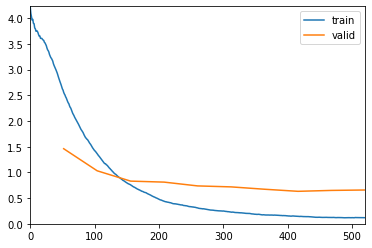

Path('/content/gdrive/My Drive/ewaste_data/models/option2/resnet152/fold0/stage-1-full_segmented2_oversampled_resnet152_fold0.pth')

In [20]:
learn.fit_one_cycle(10, lr_max=valley_freeze)
learn.save('stage-1-full_segmented2_oversampled_' + model_name + '_' + fold_name)

Unfreezing model body
60,255,808 total parameters.
60,255,808 training parameters.


SuggestedLRs(minimum=6.309573450380412e-08, steep=1.5848931980144698e-06, valley=4.365158383734524e-05, slide=3.0199516913853586e-05)

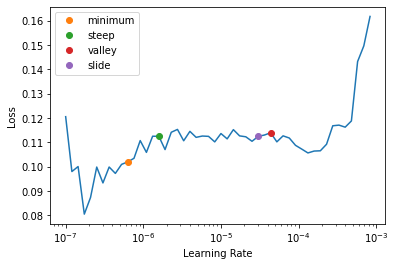

In [21]:
print(f'Unfreezing model body')
learn.unfreeze()
enumerate_params(learn)
learn.lr_find(suggest_funcs=(minimum, steep, valley, slide))

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,error_rate,precision_score,recall_score,f1_score,time
0,0.109915,0.637517,0.799401,0.979042,0.200599,0.799401,0.799401,0.799401,00:19
1,0.098877,0.644940,0.808383,0.982036,0.191617,0.808383,0.808383,0.808383,00:19
2,0.082237,0.634465,0.835329,0.994012,0.164671,0.835329,0.835329,0.835329,00:18
3,0.066569,0.646143,0.820359,0.991018,0.179641,0.820359,0.820359,0.820359,00:19
4,0.051540,0.639521,0.814371,0.988024,0.185629,0.814371,0.814371,0.814371,00:18
5,0.042826,0.631563,0.835329,0.991018,0.164671,0.835329,0.835329,0.835329,00:18
6,0.029205,0.651126,0.835329,0.985030,0.164671,0.835329,0.835329,0.835329,00:19
7,0.022120,0.633237,0.850299,0.991018,0.149701,0.850299,0.850299,0.850299,00:18
8,0.016400,0.644688,0.847305,0.988024,0.152695,0.847305,0.847305,0.847305,00:18
9,0.013751,0.665895,0.841317,0.991018,0.158683,0.841317,0.841317,0.841317,00:18


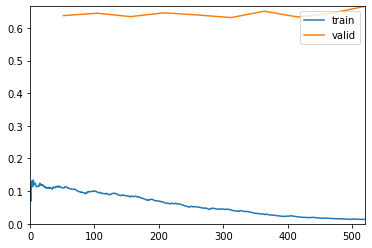

Path('/content/gdrive/My Drive/ewaste_data/models/option2/resnet152/fold0/stage-2-full_segmented2_oversampled_resnet152_fold0.pth')

In [22]:
learn.fit_one_cycle(10, lr_max=slice(1e-5, 1e-4))
learn.save('stage-2-full_segmented2_oversampled_' + model_name + '_' + fold_name)

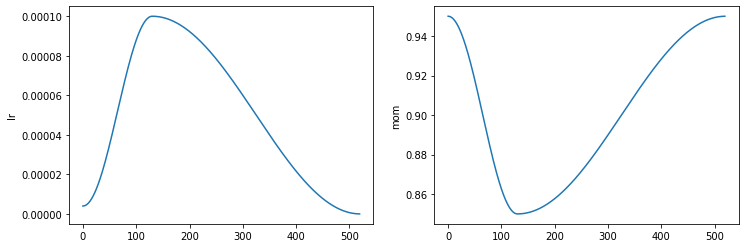

In [23]:
# In practice, we use the fit_one_cycle function, with the learning rates used representing the maximum learning rate 
# in a one cycle policy with cosine annealing, as can be seen below. 
# Note that the x-axis below represents the number of batches passed through the learner.

learn.recorder.plot_sched()

In [24]:
L(learn.recorder.values)

(#10) [[0.10991542041301727, 0.6375173926353455, 0.7994012236595154, 0.9790419340133667, 0.200598806142807, 0.7994011976047904, 0.7994011976047904, 0.7994011976047903],[0.0988774448633194, 0.6449396014213562, 0.8083832263946533, 0.9820359349250793, 0.19161677360534668, 0.8083832335329342, 0.8083832335329342, 0.8083832335329342],[0.08223696053028107, 0.6344647407531738, 0.8353293538093567, 0.9940119981765747, 0.1646706610918045, 0.8353293413173652, 0.8353293413173652, 0.8353293413173654],[0.06656935811042786, 0.6461428999900818, 0.8203592896461487, 0.9910179376602173, 0.1796407252550125, 0.8203592814371258, 0.8203592814371258, 0.8203592814371257],[0.05153992772102356, 0.6395211815834045, 0.8143712282180786, 0.9880239367485046, 0.185628741979599, 0.8143712574850299, 0.8143712574850299, 0.8143712574850299],[0.04282580316066742, 0.631563127040863, 0.8353293538093567, 0.9910179376602173, 0.1646706610918045, 0.8353293413173652, 0.8353293413173652, 0.8353293413173654],[0.029205389320850372, 0

In [25]:
learn.validate()

(#7) [0.6658954620361328,0.841317355632782,0.9910179376602173,0.15868262946605682,0.8413173652694611,0.8413173652694611,0.8413173652694611]

In [26]:
learn.recorder.values[-1][2]

0.9910179376602173

In [27]:
learn.dls.vocab

['Aluminium_Iron', 'Battery', 'Cable_Wire', 'Cardboard_Paper', 'Connector', 'Copper', 'Magnetic Tape', 'Plastic', 'Printed Circuit Board', 'Printer Ribbon_Toner', 'Tube_Screen']

In [28]:
learn.load('/content/gdrive/My Drive/ewaste_data/models/option2/'+ model_name + '/' + fold_name + '/stage-2-full_segmented2_oversampled_' + model_name + '_' + fold_name)

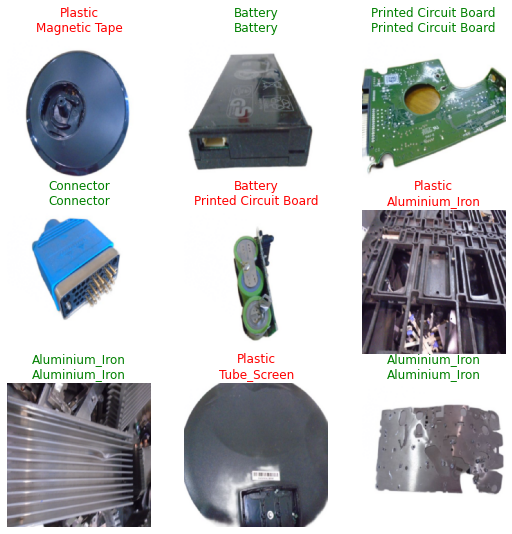

In [29]:
learn.show_results()

In [30]:
learn.dls.loss_func

FlattenedLoss of CrossEntropyLoss()

In [31]:
interp = ClassificationInterpretation.from_learner(learn)

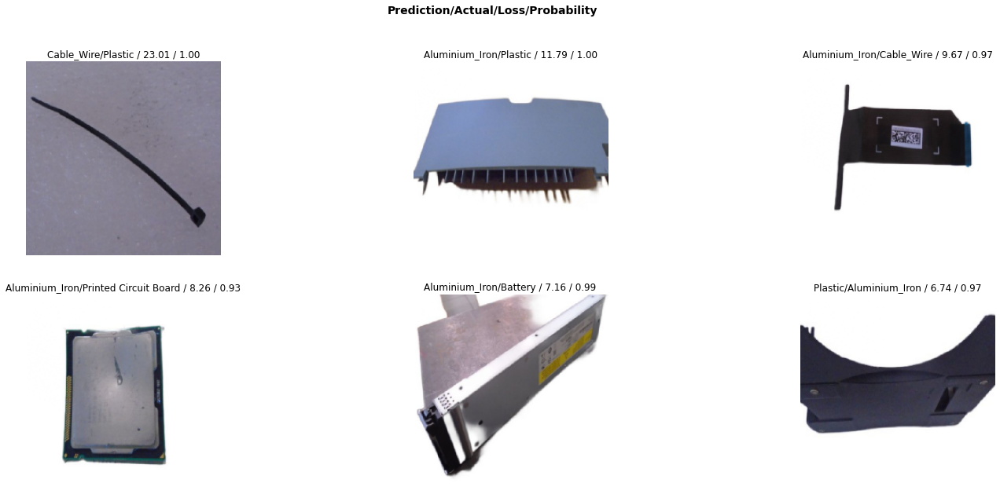

In [32]:
interp.plot_top_losses(6, figsize=(25,10))

In [33]:
interp.print_classification_report()

                       precision    recall  f1-score   support

       Aluminium_Iron       0.79      0.94      0.86        93
              Battery       0.83      0.83      0.83        42
           Cable_Wire       0.91      0.88      0.89        24
      Cardboard_Paper       0.92      0.92      0.92        13
            Connector       0.90      0.75      0.82        12
               Copper       0.88      1.00      0.93        14
        Magnetic Tape       0.75      0.75      0.75         4
              Plastic       0.80      0.65      0.72        55
Printed Circuit Board       0.95      0.88      0.91        48
 Printer Ribbon_Toner       0.90      0.90      0.90        10
          Tube_Screen       0.76      0.68      0.72        19

             accuracy                           0.84       334
            macro avg       0.85      0.83      0.84       334
         weighted avg       0.84      0.84      0.84       334



In [34]:
interp.most_confused()

[('Plastic', 'Aluminium_Iron', 13),
 ('Aluminium_Iron', 'Plastic', 3),
 ('Battery', 'Aluminium_Iron', 3),
 ('Printed Circuit Board', 'Aluminium_Iron', 3),
 ('Tube_Screen', 'Plastic', 3),
 ('Aluminium_Iron', 'Battery', 2),
 ('Battery', 'Printed Circuit Board', 2),
 ('Cable_Wire', 'Aluminium_Iron', 2),
 ('Plastic', 'Battery', 2),
 ('Aluminium_Iron', 'Cardboard_Paper', 1),
 ('Battery', 'Connector', 1),
 ('Battery', 'Tube_Screen', 1),
 ('Cable_Wire', 'Plastic', 1),
 ('Cardboard_Paper', 'Plastic', 1),
 ('Connector', 'Aluminium_Iron', 1),
 ('Connector', 'Plastic', 1),
 ('Connector', 'Tube_Screen', 1),
 ('Magnetic Tape', 'Tube_Screen', 1),
 ('Plastic', 'Cable_Wire', 1),
 ('Plastic', 'Copper', 1),
 ('Plastic', 'Magnetic Tape', 1),
 ('Plastic', 'Tube_Screen', 1),
 ('Printed Circuit Board', 'Battery', 1),
 ('Printed Circuit Board', 'Cable_Wire', 1),
 ('Printed Circuit Board', 'Copper', 1),
 ('Printer Ribbon_Toner', 'Battery', 1),
 ('Tube_Screen', 'Aluminium_Iron', 1),
 ('Tube_Screen', 'Battery',

Interpretation.plot_top_losses(k: 'int | list', largest: 'bool' = True, **kwargs)
Show `k` largest(/smallest) preds and losses. Implementation based on type dispatch

To get a prettier result with hyperlinks to source code and documentation, install nbdev: pip install nbdev


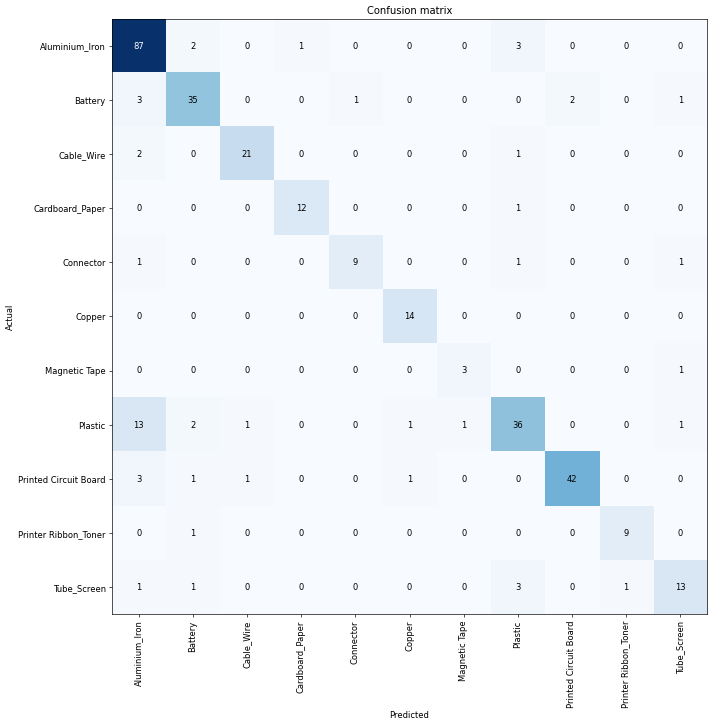

In [35]:
doc(interp.plot_top_losses)
interp.plot_confusion_matrix(figsize=(12,12), dpi=60)

In [36]:
preds = learn.get_preds()

In [37]:
print(preds[0].shape)
preds[0]

torch.Size([334, 11])


TensorBase([[9.7401e-01, 1.2682e-05, 3.6149e-06,  ..., 2.9212e-04,
             2.2681e-06, 7.2347e-05],
            [9.9967e-01, 1.0683e-05, 1.6517e-05,  ..., 5.4261e-05,
             1.2441e-05, 3.8433e-06],
            [9.9980e-01, 1.3161e-07, 1.8725e-05,  ..., 1.8582e-06,
             7.0026e-06, 2.9782e-05],
            ...,
            [3.0531e-05, 2.4834e-06, 7.9422e-07,  ..., 1.6349e-07,
             1.7716e-08, 9.9995e-01],
            [4.3812e-02, 7.3922e-04, 3.6033e-06,  ..., 5.5101e-04,
             1.4924e-05, 9.5276e-01],
            [1.8657e-03, 2.6909e-03, 3.4144e-04,  ..., 8.9615e-05,
             9.9848e-05, 9.6369e-01]])

In [38]:
labels = list(learn.dls.train_ds.items.Class.unique())
labels

['Aluminium_Iron',
 'Battery',
 'Cable_Wire',
 'Cardboard_Paper',
 'Connector',
 'Copper',
 'Magnetic Tape',
 'Plastic',
 'Printed Circuit Board',
 'Printer Ribbon_Toner',
 'Tube_Screen']

In [39]:
## saves the index of most likely (max) predicted class for each image
max_idxs = np.asarray(np.argmax(preds[0],axis=1))
max_idxs

yhat = []
for max_idx in max_idxs:
    yhat.append(labels[max_idx])

## convert POSIX paths to string first
y = []
for label_path in learn.dls.valid_ds.items.Class:
    y.append(str(label_path))

learn.dls.valid_ds.items.Class.unique()

## predicted values
print(yhat[0:5])

## actual values
print(y[0:5])

['Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron']
['Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron']


In [40]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y,yhat)
print(cm)

[[87  2  0  1  0  0  0  3  0  0  0]
 [ 3 35  0  0  1  0  0  0  2  0  1]
 [ 2  0 21  0  0  0  0  1  0  0  0]
 [ 0  0  0 12  0  0  0  1  0  0  0]
 [ 1  0  0  0  9  0  0  1  0  0  1]
 [ 0  0  0  0  0 14  0  0  0  0  0]
 [ 0  0  0  0  0  0  3  0  0  0  1]
 [13  2  1  0  0  1  1 36  0  0  1]
 [ 3  1  1  0  0  1  0  0 42  0  0]
 [ 0  1  0  0  0  0  0  0  0  9  0]
 [ 1  1  0  0  0  0  0  3  0  1 13]]


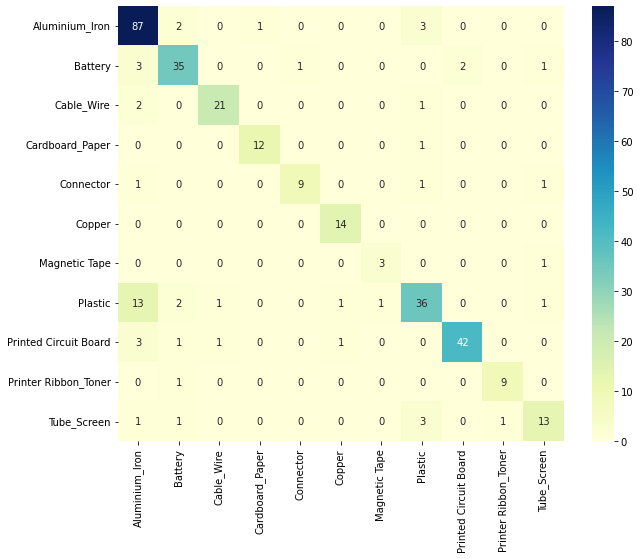

In [41]:
df_cm = pd.DataFrame(cm,learn.dls.valid_ds.items.Class.unique(),learn.dls.valid_ds.items.Class.unique())

plt.figure(figsize=(10,8))

import seaborn as sns

sns.heatmap(df_cm,annot=True,fmt="d",cmap="YlGnBu")

In [42]:
correct = 0

for r in range(len(cm)):
    for c in range(len(cm)):
        if (r==c):
            correct += cm[r,c]

accuracy = correct/sum(sum(cm))
accuracy

0.8413173652694611

### Fold 1

In [21]:
fold_nbr = 1
fold_name = 'fold1'
model_name = 'resnet152'

learn = create_cnn_learner(pct_images=1, 
                           deterministic=True, 
                           size=224, 
                           img_path = '/content/gdrive/My Drive/ewaste_data/full_segmented2/',
                           split_path = '/content/gdrive/My Drive/ewaste_data/full_segmented2/',
                           model_dir = '/content/gdrive/My Drive/ewaste_data/models/option2/' + model_name + '/' + fold_name,
                           log_name = '/content/gdrive/My Drive/ewaste_data/dataframes/option2/' + model_name + '/' + fold_name + '/' + 'log_' + model_name + '_' + fold_name + '.csv',
                           oversampling=True,
                           dfs_path='/content/gdrive/My Drive/ewaste_data/dataframes/option2/' + model_name + '/' + fold_name,
                           fold=fold_nbr,
                           arch=model_name)

Random state set:101, cuda used: True
Split Path defined, preparing pseudo stratified split.
Creating path:label dataframe from /content/gdrive/My Drive/ewaste_data/full_segmented2/, using 100.00% of the images (1670 images.) Shuffle = False.
Preparing stratified 5 fold split, random state is 101. Returning fold 1.
Creating path:label dataframe from /content/gdrive/My Drive/ewaste_data/full_segmented2/, using 100.00% of the images (1670 images.) Shuffle = False.
We have 11 classes, with a training set of size 1336, and a validation set of size 334
The main split has 80.00% training data with 11 classes, the reduced split has 80.00 % training data, with 11 classes.


/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet152_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet152_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [22]:
learn.arch

<function torchvision.models.resnet.resnet152(*, weights: Union[torchvision.models.resnet.ResNet152_Weights, NoneType] = None, progress: bool = True, **kwargs: Any) -> torchvision.models.resnet.ResNet>

In [23]:
len(learn.dls.get_idxs())

3340

In [24]:
idxs = learn.dls.train.get_idxs()
learn.dls.train.items.iloc[idxs].Class.value_counts()

Cable_Wire               327
Aluminium_Iron           321
Plastic                  319
Printer Ribbon_Toner     311
Connector                307
Tube_Screen              302
Printed Circuit Board    297
Magnetic Tape            297
Copper                   294
Cardboard_Paper          284
Battery                  281
Name: Class, dtype: int64

Freezing model body
60,255,808 total parameters.
2,263,424 training parameters.


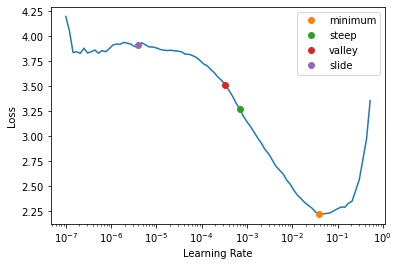

In [25]:
print(f'Freezing model body')
learn.freeze()
enumerate_params(learn)
_,_,valley_freeze,_ = learn.lr_find(suggest_funcs=(minimum, steep, valley, slide))

In [26]:
valley_freeze

0.0003311311302240938

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,error_rate,precision_score,recall_score,f1_score,time
0,2.717671,1.540101,0.502994,0.883234,0.497006,0.502994,0.502994,0.502994,00:16
1,1.465492,1.020147,0.682635,0.955090,0.317365,0.682635,0.682635,0.682635,00:16
2,0.827812,0.909868,0.733533,0.970060,0.266467,0.733533,0.733533,0.733533,00:16
3,0.521976,0.916560,0.748503,0.976048,0.251497,0.748503,0.748503,0.748503,00:15
4,0.345144,0.912727,0.760479,0.973054,0.239521,0.760479,0.760479,0.760479,00:15
5,0.265114,0.864089,0.733533,0.982036,0.266467,0.733533,0.733533,0.733533,00:15
6,0.192575,0.801909,0.748503,0.982036,0.251497,0.748503,0.748503,0.748503,00:16
7,0.167209,0.845809,0.748503,0.982036,0.251497,0.748503,0.748503,0.748503,00:15
8,0.146546,0.824666,0.757485,0.979042,0.242515,0.757485,0.757485,0.757485,00:16
9,0.125541,0.829285,0.751497,0.982036,0.248503,0.751497,0.751497,0.751497,00:16


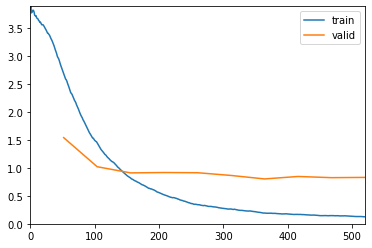

Path('/content/gdrive/My Drive/ewaste_data/models/option2/resnet152/fold1/stage-1-full_segmented2_oversampled_resnet152_fold1.pth')

In [27]:
learn.fit_one_cycle(10, lr_max=valley_freeze)
learn.save('stage-1-full_segmented2_oversampled_' + model_name + '_' + fold_name)

Unfreezing model body
60,255,808 total parameters.
60,255,808 training parameters.


SuggestedLRs(minimum=9.999999747378752e-07, steep=2.75422871709452e-06, valley=6.30957365501672e-05, slide=3.630780702224001e-05)

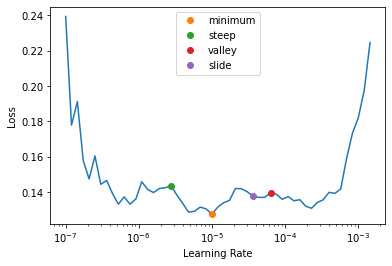

In [28]:
print(f'Unfreezing model body')
learn.unfreeze()
enumerate_params(learn)
learn.lr_find(suggest_funcs=(minimum, steep, valley, slide))

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,error_rate,precision_score,recall_score,f1_score,time
0,0.121476,0.848090,0.763473,0.982036,0.236527,0.763473,0.763473,0.763473,00:18
1,0.110720,0.808346,0.763473,0.985030,0.236527,0.763473,0.763473,0.763473,00:18
2,0.092078,0.896473,0.757485,0.979042,0.242515,0.757485,0.757485,0.757485,00:18
3,0.084350,0.909786,0.769461,0.976048,0.230539,0.769461,0.769461,0.769461,00:18
4,0.059941,0.941575,0.775449,0.976048,0.224551,0.775449,0.775449,0.775449,00:18
5,0.046718,0.962292,0.775449,0.979042,0.224551,0.775449,0.775449,0.775449,00:19
6,0.029276,0.940316,0.787425,0.982036,0.212575,0.787425,0.787425,0.787425,00:19
7,0.023823,0.930260,0.796407,0.982036,0.203593,0.796407,0.796407,0.796407,00:18
8,0.019904,0.954510,0.793413,0.979042,0.206587,0.793413,0.793413,0.793413,00:19
9,0.019444,0.952716,0.793413,0.976048,0.206587,0.793413,0.793413,0.793413,00:18


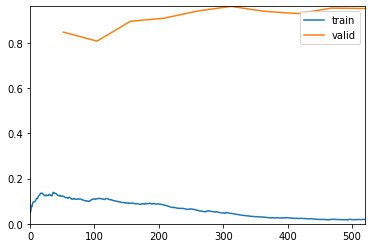

Path('/content/gdrive/My Drive/ewaste_data/models/option2/resnet152/fold1/stage-2-full_segmented2_oversampled_resnet152_fold1.pth')

In [29]:
learn.fit_one_cycle(10, lr_max=slice(1e-5, 1e-4))
learn.save('stage-2-full_segmented2_oversampled_' + model_name + '_' + fold_name)

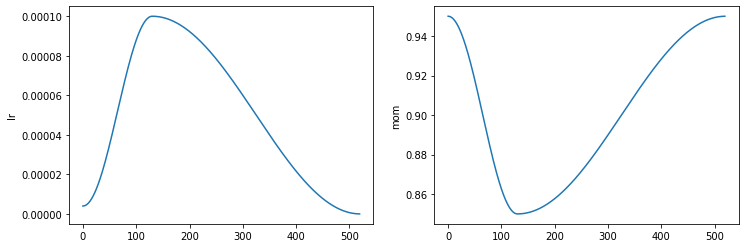

In [30]:
# In practice, we use the fit_one_cycle function, with the learning rates used representing the maximum learning rate 
# in a one cycle policy with cosine annealing, as can be seen below. 
# Note that the x-axis below represents the number of batches passed through the learner.

learn.recorder.plot_sched()

In [31]:
L(learn.recorder.values)

(#10) [[0.12147583812475204, 0.8480902314186096, 0.7634730339050293, 0.9820359349250793, 0.2365269511938095, 0.7634730538922155, 0.7634730538922155, 0.7634730538922155],[0.11071986705064774, 0.8083456754684448, 0.7634730339050293, 0.985029935836792, 0.2365269511938095, 0.7634730538922155, 0.7634730538922155, 0.7634730538922155],[0.09207843244075775, 0.896473228931427, 0.757485032081604, 0.9790419340133667, 0.242514967918396, 0.7574850299401198, 0.7574850299401198, 0.7574850299401198],[0.08434952050447464, 0.909785807132721, 0.7694610953330994, 0.976047933101654, 0.23053891956806183, 0.7694610778443114, 0.7694610778443114, 0.7694610778443114],[0.05994098633527756, 0.941575288772583, 0.7754490971565247, 0.976047933101654, 0.22455090284347534, 0.7754491017964071, 0.7754491017964071, 0.7754491017964071],[0.04671831801533699, 0.9622917175292969, 0.7754490971565247, 0.9790419340133667, 0.22455090284347534, 0.7754491017964071, 0.7754491017964071, 0.7754491017964071],[0.029276028275489807, 0.9

In [32]:
learn.validate()

(#7) [0.9527162313461304,0.7934131622314453,0.976047933101654,0.2065868228673935,0.7934131736526946,0.7934131736526946,0.7934131736526946]

In [33]:
learn.recorder.values[-1][2]

0.976047933101654

In [34]:
learn.dls.vocab

['Aluminium_Iron', 'Battery', 'Cable_Wire', 'Cardboard_Paper', 'Connector', 'Copper', 'Magnetic Tape', 'Plastic', 'Printed Circuit Board', 'Printer Ribbon_Toner', 'Tube_Screen']

In [35]:
learn.load('/content/gdrive/My Drive/ewaste_data/models/option2/'+ model_name + '/' + fold_name + '/stage-2-full_segmented2_oversampled_' + model_name + '_' + fold_name)

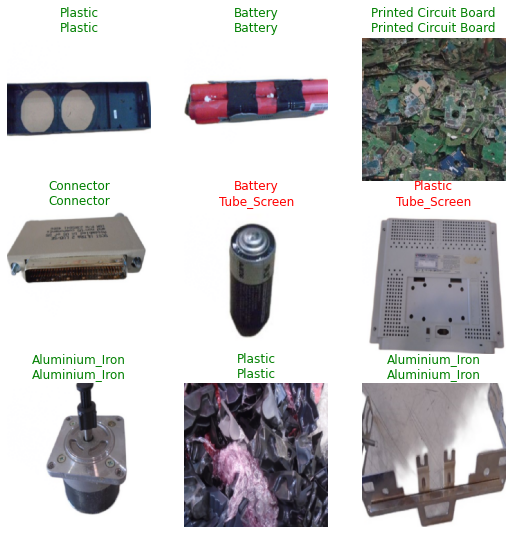

In [36]:
learn.show_results()

In [37]:
learn.dls.loss_func

FlattenedLoss of CrossEntropyLoss()

In [38]:
interp = ClassificationInterpretation.from_learner(learn)

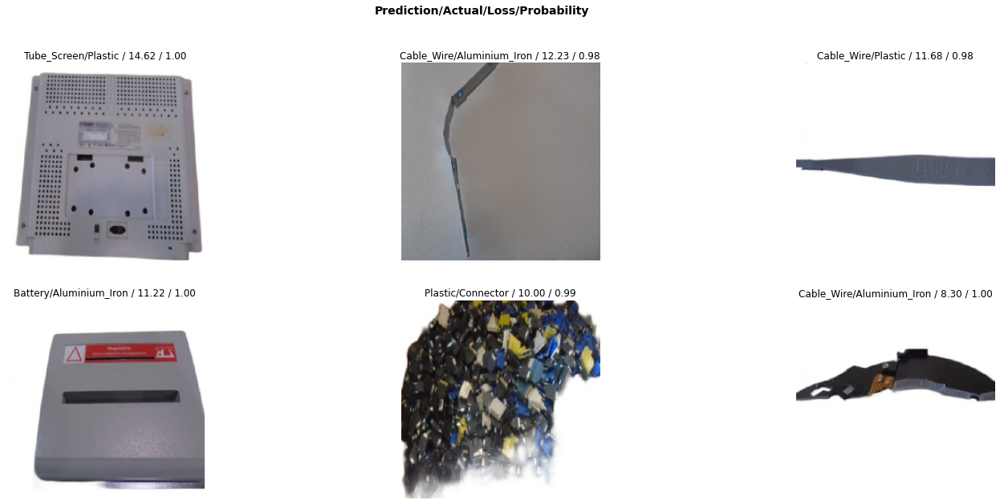

In [39]:
interp.plot_top_losses(6, figsize=(25,10))

In [40]:
interp.print_classification_report()

                       precision    recall  f1-score   support

       Aluminium_Iron       0.82      0.87      0.85        92
              Battery       0.72      0.77      0.74        43
           Cable_Wire       0.76      0.92      0.83        24
      Cardboard_Paper       0.81      1.00      0.90        13
            Connector       0.80      0.67      0.73        12
               Copper       0.92      0.86      0.89        14
        Magnetic Tape       0.67      0.50      0.57         4
              Plastic       0.66      0.56      0.61        55
Printed Circuit Board       0.96      0.91      0.93        47
 Printer Ribbon_Toner       0.89      0.73      0.80        11
          Tube_Screen       0.68      0.68      0.68        19

             accuracy                           0.79       334
            macro avg       0.79      0.77      0.78       334
         weighted avg       0.79      0.79      0.79       334



In [41]:
interp.most_confused()

[('Plastic', 'Aluminium_Iron', 13),
 ('Aluminium_Iron', 'Plastic', 5),
 ('Battery', 'Plastic', 5),
 ('Plastic', 'Tube_Screen', 4),
 ('Aluminium_Iron', 'Battery', 3),
 ('Aluminium_Iron', 'Cable_Wire', 3),
 ('Plastic', 'Battery', 3),
 ('Battery', 'Tube_Screen', 2),
 ('Connector', 'Plastic', 2),
 ('Copper', 'Cable_Wire', 2),
 ('Printed Circuit Board', 'Battery', 2),
 ('Tube_Screen', 'Cardboard_Paper', 2),
 ('Tube_Screen', 'Plastic', 2),
 ('Aluminium_Iron', 'Printer Ribbon_Toner', 1),
 ('Battery', 'Aluminium_Iron', 1),
 ('Battery', 'Connector', 1),
 ('Battery', 'Printed Circuit Board', 1),
 ('Cable_Wire', 'Battery', 1),
 ('Cable_Wire', 'Copper', 1),
 ('Connector', 'Battery', 1),
 ('Connector', 'Printed Circuit Board', 1),
 ('Magnetic Tape', 'Battery', 1),
 ('Magnetic Tape', 'Plastic', 1),
 ('Plastic', 'Cable_Wire', 1),
 ('Plastic', 'Cardboard_Paper', 1),
 ('Plastic', 'Connector', 1),
 ('Plastic', 'Magnetic Tape', 1),
 ('Printed Circuit Board', 'Aluminium_Iron', 1),
 ('Printed Circuit Board

Interpretation.plot_top_losses(k: 'int | list', largest: 'bool' = True, **kwargs)
Show `k` largest(/smallest) preds and losses. Implementation based on type dispatch

To get a prettier result with hyperlinks to source code and documentation, install nbdev: pip install nbdev


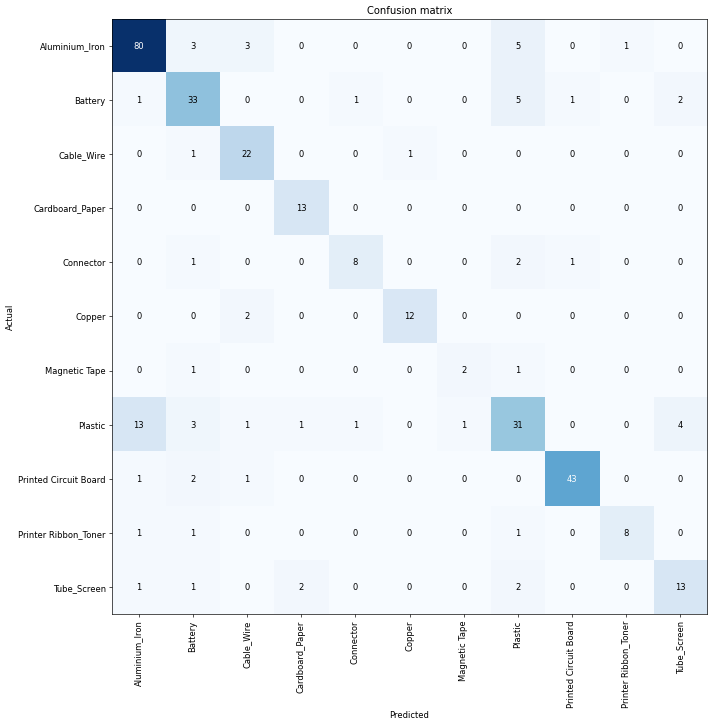

In [42]:
doc(interp.plot_top_losses)
interp.plot_confusion_matrix(figsize=(12,12), dpi=60)

In [43]:
preds = learn.get_preds()

In [44]:
print(preds[0].shape)
preds[0]

torch.Size([334, 11])


TensorBase([[9.9961e-01, 7.6137e-07, 2.3772e-04,  ..., 1.0597e-06,
             2.6358e-06, 2.0268e-05],
            [9.9942e-01, 5.1224e-07, 5.7831e-08,  ..., 4.1187e-06,
             2.6672e-07, 1.2545e-07],
            [9.9771e-01, 5.3237e-05, 3.0923e-05,  ..., 2.0124e-07,
             2.7002e-07, 1.1723e-03],
            ...,
            [2.5832e-03, 1.8860e-04, 1.2742e-04,  ..., 4.7652e-06,
             4.9323e-04, 9.8726e-01],
            [5.7042e-01, 1.1457e-03, 1.3534e-03,  ..., 1.4277e-03,
             1.0687e-04, 1.8412e-01],
            [2.6683e-02, 2.6218e-03, 4.4537e-03,  ..., 2.3135e-05,
             3.1951e-02, 9.3281e-01]])

In [45]:
labels = list(learn.dls.train_ds.items.Class.unique())
labels

['Aluminium_Iron',
 'Battery',
 'Cable_Wire',
 'Cardboard_Paper',
 'Connector',
 'Copper',
 'Magnetic Tape',
 'Plastic',
 'Printed Circuit Board',
 'Printer Ribbon_Toner',
 'Tube_Screen']

In [46]:
## saves the index of most likely (max) predicted class for each image
max_idxs = np.asarray(np.argmax(preds[0],axis=1))
max_idxs

yhat = []
for max_idx in max_idxs:
    yhat.append(labels[max_idx])

## convert POSIX paths to string first
y = []
for label_path in learn.dls.valid_ds.items.Class:
    y.append(str(label_path))

learn.dls.valid_ds.items.Class.unique()

## predicted values
print(yhat[0:5])

## actual values
print(y[0:5])

['Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron']
['Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron']


In [47]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y,yhat)
print(cm)

[[80  3  3  0  0  0  0  5  0  1  0]
 [ 1 33  0  0  1  0  0  5  1  0  2]
 [ 0  1 22  0  0  1  0  0  0  0  0]
 [ 0  0  0 13  0  0  0  0  0  0  0]
 [ 0  1  0  0  8  0  0  2  1  0  0]
 [ 0  0  2  0  0 12  0  0  0  0  0]
 [ 0  1  0  0  0  0  2  1  0  0  0]
 [13  3  1  1  1  0  1 31  0  0  4]
 [ 1  2  1  0  0  0  0  0 43  0  0]
 [ 1  1  0  0  0  0  0  1  0  8  0]
 [ 1  1  0  2  0  0  0  2  0  0 13]]


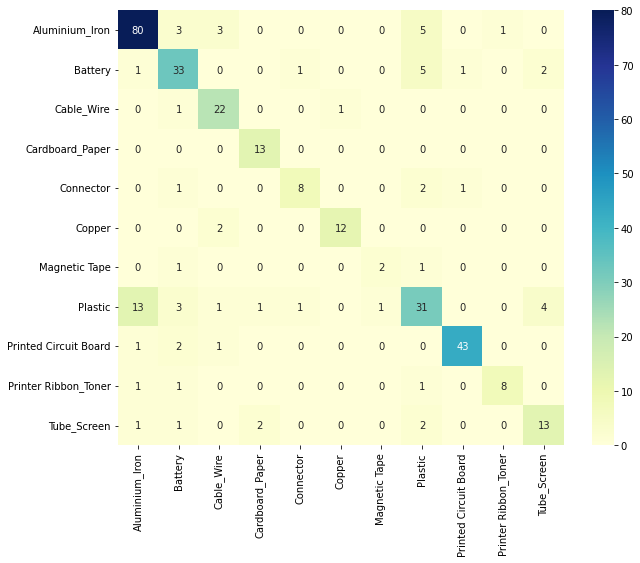

In [48]:
df_cm = pd.DataFrame(cm,learn.dls.valid_ds.items.Class.unique(),learn.dls.valid_ds.items.Class.unique())

plt.figure(figsize=(10,8))

import seaborn as sns

sns.heatmap(df_cm,annot=True,fmt="d",cmap="YlGnBu")

In [49]:
correct = 0

for r in range(len(cm)):
    for c in range(len(cm)):
        if (r==c):
            correct += cm[r,c]

accuracy = correct/sum(sum(cm))
accuracy

0.7934131736526946

### Fold 2

In [15]:
fold_nbr = 2
fold_name = 'fold2'
model_name = 'resnet152'

learn = create_cnn_learner(pct_images=1, 
                           deterministic=True, 
                           size=224, 
                           img_path = '/content/gdrive/My Drive/ewaste_data/full_segmented2/',
                           split_path = '/content/gdrive/My Drive/ewaste_data/full_segmented2/',
                           model_dir = '/content/gdrive/My Drive/ewaste_data/models/option2/' + model_name + '/' + fold_name,
                           log_name = '/content/gdrive/My Drive/ewaste_data/dataframes/option2/' + model_name + '/' + fold_name + '/' + 'log_' + model_name + '_' + fold_name + '.csv',
                           oversampling=True,
                           dfs_path='/content/gdrive/My Drive/ewaste_data/dataframes/option2/' + model_name + '/' + fold_name,
                           fold=fold_nbr,
                           arch=model_name)

Random state set:101, cuda used: True
Split Path defined, preparing pseudo stratified split.
Creating path:label dataframe from /content/gdrive/My Drive/ewaste_data/full_segmented2/, using 100.00% of the images (1670 images.) Shuffle = False.
Preparing stratified 5 fold split, random state is 101. Returning fold 2.
Creating path:label dataframe from /content/gdrive/My Drive/ewaste_data/full_segmented2/, using 100.00% of the images (1670 images.) Shuffle = False.
We have 11 classes, with a training set of size 1336, and a validation set of size 334
The main split has 80.00% training data with 11 classes, the reduced split has 80.00 % training data, with 11 classes.


/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet152_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet152_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [16]:
learn.arch

<function torchvision.models.resnet.resnet152(*, weights: Union[torchvision.models.resnet.ResNet152_Weights, NoneType] = None, progress: bool = True, **kwargs: Any) -> torchvision.models.resnet.ResNet>

In [17]:
len(learn.dls.get_idxs())

3340

In [18]:
idxs = learn.dls.train.get_idxs()
learn.dls.train.items.iloc[idxs].Class.value_counts()

Cable_Wire               327
Aluminium_Iron           321
Plastic                  319
Printer Ribbon_Toner     311
Connector                307
Tube_Screen              302
Printed Circuit Board    297
Magnetic Tape            297
Copper                   294
Cardboard_Paper          284
Battery                  281
Name: Class, dtype: int64

Freezing model body
60,255,808 total parameters.
2,263,424 training parameters.


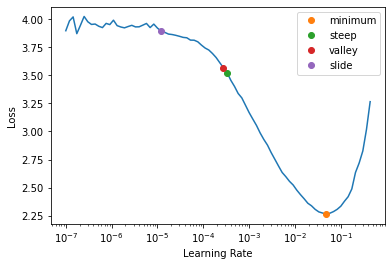

In [19]:
print(f'Freezing model body')
learn.freeze()
enumerate_params(learn)
_,_,valley_freeze,_ = learn.lr_find(suggest_funcs=(minimum, steep, valley, slide))

In [20]:
valley_freeze

0.0002754228771664202

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,error_rate,precision_score,recall_score,f1_score,time
0,2.828913,1.603666,0.497006,0.865269,0.502994,0.497006,0.497006,0.497006,00:15
1,1.548925,1.008120,0.697605,0.949102,0.302395,0.697605,0.697605,0.697605,00:15
2,0.882838,0.784644,0.775449,0.976048,0.224551,0.775449,0.775449,0.775449,00:15
3,0.549953,0.792538,0.766467,0.976048,0.233533,0.766467,0.766467,0.766467,00:15
4,0.397705,0.808435,0.763473,0.979042,0.236527,0.763473,0.763473,0.763473,00:15
5,0.285756,0.773373,0.766467,0.973054,0.233533,0.766467,0.766467,0.766467,00:16
6,0.227201,0.748086,0.784431,0.973054,0.215569,0.784431,0.784431,0.784431,00:15
7,0.205245,0.733837,0.802395,0.976048,0.197605,0.802395,0.802395,0.802395,00:15
8,0.181103,0.701835,0.802395,0.979042,0.197605,0.802395,0.802395,0.802395,00:15
9,0.164502,0.689370,0.808383,0.979042,0.191617,0.808383,0.808383,0.808383,00:16


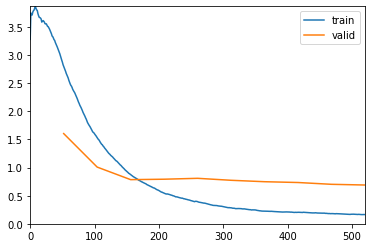

Path('/content/gdrive/My Drive/ewaste_data/models/option2/resnet152/fold2/stage-1-full_segmented2_oversampled_resnet152_fold2.pth')

In [21]:
learn.fit_one_cycle(10, lr_max=valley_freeze)
learn.save('stage-1-full_segmented2_oversampled_' + model_name + '_' + fold_name)

Unfreezing model body
60,255,808 total parameters.
60,255,808 training parameters.


SuggestedLRs(minimum=7.585775847473997e-08, steep=2.75422871709452e-06, valley=3.630780702224001e-05, slide=1.4454397387453355e-05)

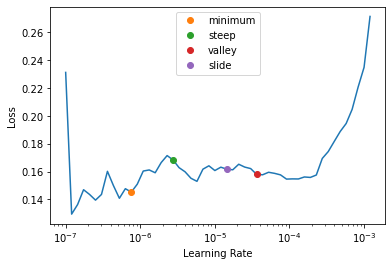

In [22]:
print(f'Unfreezing model body')
learn.unfreeze()
enumerate_params(learn)
learn.lr_find(suggest_funcs=(minimum, steep, valley, slide))

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,error_rate,precision_score,recall_score,f1_score,time
0,0.152379,0.725915,0.796407,0.976048,0.203593,0.796407,0.796407,0.796407,00:19
1,0.134760,0.656662,0.802395,0.976048,0.197605,0.802395,0.802395,0.802395,00:18
2,0.113543,0.672901,0.820359,0.976048,0.179641,0.820359,0.820359,0.820359,00:18
3,0.090951,0.729747,0.820359,0.976048,0.179641,0.820359,0.820359,0.820359,00:18
4,0.067087,0.632936,0.823353,0.982036,0.176647,0.823353,0.823353,0.823353,00:18
5,0.050511,0.706951,0.832335,0.973054,0.167665,0.832335,0.832335,0.832335,00:18
6,0.038371,0.675390,0.844311,0.979042,0.155689,0.844311,0.844311,0.844311,00:18
7,0.028734,0.667013,0.850299,0.976048,0.149701,0.850299,0.850299,0.850299,00:18
8,0.023217,0.655364,0.850299,0.979042,0.149701,0.850299,0.850299,0.850299,00:18
9,0.021233,0.651368,0.859281,0.976048,0.140719,0.859281,0.859281,0.859281,00:18


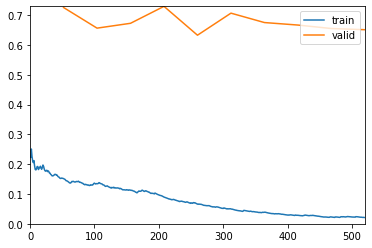

Path('/content/gdrive/My Drive/ewaste_data/models/option2/resnet152/fold2/stage-2-full_segmented2_oversampled_resnet152_fold2.pth')

In [23]:
learn.fit_one_cycle(10, lr_max=slice(1e-5, 1e-4))
learn.save('stage-2-full_segmented2_oversampled_' + model_name + '_' + fold_name)

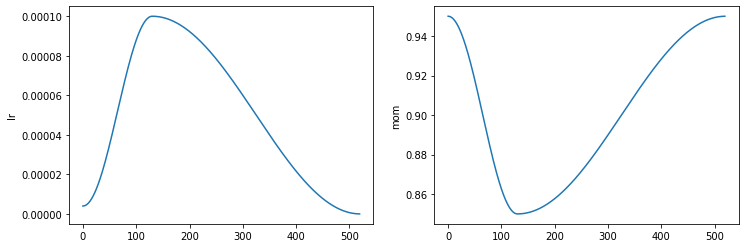

In [24]:
# In practice, we use the fit_one_cycle function, with the learning rates used representing the maximum learning rate 
# in a one cycle policy with cosine annealing, as can be seen below. 
# Note that the x-axis below represents the number of batches passed through the learner.

learn.recorder.plot_sched()

In [25]:
L(learn.recorder.values)

(#10) [[0.15237878262996674, 0.7259150743484497, 0.796407163143158, 0.976047933101654, 0.20359280705451965, 0.7964071856287425, 0.7964071856287425, 0.7964071856287425],[0.13476023077964783, 0.6566623449325562, 0.802395224571228, 0.976047933101654, 0.19760479032993317, 0.8023952095808383, 0.8023952095808383, 0.8023952095808384],[0.11354281008243561, 0.6729007959365845, 0.8203592896461487, 0.976047933101654, 0.1796407252550125, 0.8203592814371258, 0.8203592814371258, 0.8203592814371257],[0.09095054864883423, 0.7297472357749939, 0.8203592896461487, 0.976047933101654, 0.1796407252550125, 0.8203592814371258, 0.8203592814371258, 0.8203592814371257],[0.06708681583404541, 0.6329358816146851, 0.8233532905578613, 0.9820359349250793, 0.17664670944213867, 0.8233532934131736, 0.8233532934131736, 0.8233532934131736],[0.05051092430949211, 0.7069509029388428, 0.832335352897644, 0.9730538725852966, 0.16766467690467834, 0.8323353293413174, 0.8323353293413174, 0.8323353293413174],[0.03837057948112488, 0.

In [26]:
learn.validate()

(#7) [0.6513676047325134,0.8592814207077026,0.976047933101654,0.14071856439113617,0.8592814371257484,0.8592814371257484,0.8592814371257484]

In [27]:
learn.recorder.values[-1][2]

0.976047933101654

In [28]:
learn.dls.vocab

['Aluminium_Iron', 'Battery', 'Cable_Wire', 'Cardboard_Paper', 'Connector', 'Copper', 'Magnetic Tape', 'Plastic', 'Printed Circuit Board', 'Printer Ribbon_Toner', 'Tube_Screen']

In [29]:
learn.load('/content/gdrive/My Drive/ewaste_data/models/option2/'+ model_name + '/' + fold_name + '/stage-2-full_segmented2_oversampled_' + model_name + '_' + fold_name)

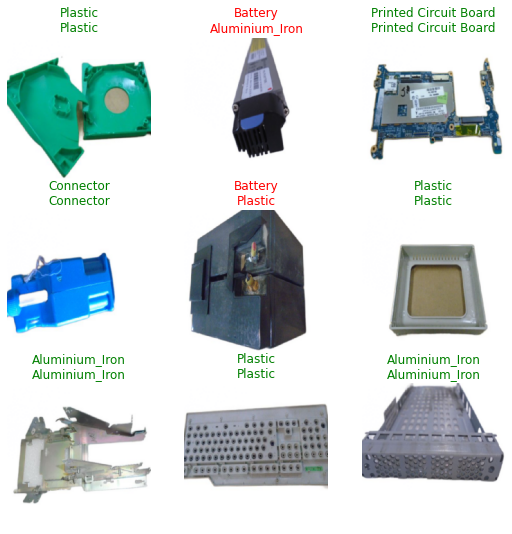

In [30]:
learn.show_results()

In [31]:
learn.dls.loss_func

FlattenedLoss of CrossEntropyLoss()

In [32]:
interp = ClassificationInterpretation.from_learner(learn)

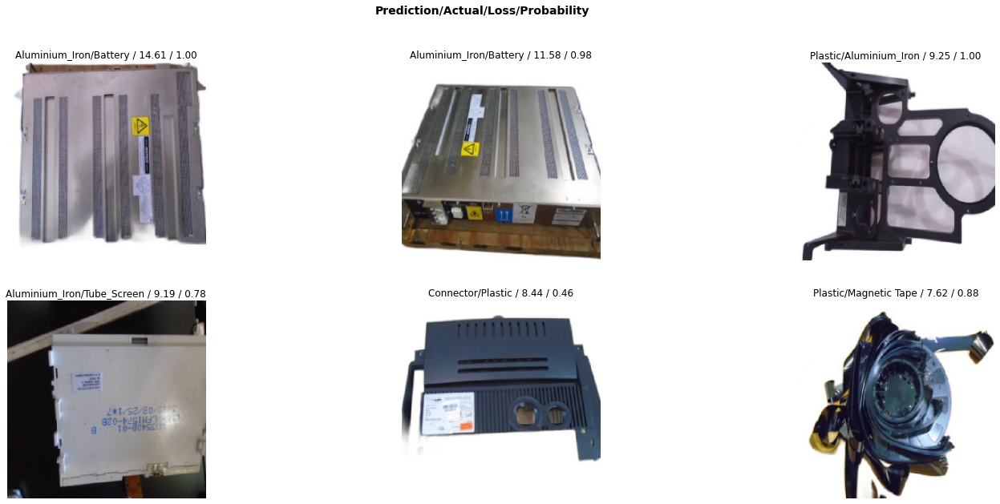

In [33]:
interp.plot_top_losses(6, figsize=(25,10))

In [34]:
interp.print_classification_report()

                       precision    recall  f1-score   support

       Aluminium_Iron       0.83      0.88      0.85        92
              Battery       0.91      0.74      0.82        43
           Cable_Wire       0.92      0.96      0.94        23
      Cardboard_Paper       1.00      0.69      0.82        13
            Connector       0.76      1.00      0.87        13
               Copper       0.93      0.93      0.93        14
        Magnetic Tape       0.75      0.75      0.75         4
              Plastic       0.79      0.84      0.81        55
Printed Circuit Board       0.98      0.98      0.98        47
 Printer Ribbon_Toner       0.64      0.70      0.67        10
          Tube_Screen       0.88      0.75      0.81        20

             accuracy                           0.86       334
            macro avg       0.85      0.84      0.84       334
         weighted avg       0.87      0.86      0.86       334



In [35]:
interp.most_confused()

[('Battery', 'Aluminium_Iron', 7),
 ('Aluminium_Iron', 'Plastic', 6),
 ('Plastic', 'Aluminium_Iron', 4),
 ('Printer Ribbon_Toner', 'Aluminium_Iron', 3),
 ('Aluminium_Iron', 'Printer Ribbon_Toner', 2),
 ('Battery', 'Plastic', 2),
 ('Plastic', 'Connector', 2),
 ('Plastic', 'Tube_Screen', 2),
 ('Tube_Screen', 'Aluminium_Iron', 2),
 ('Tube_Screen', 'Plastic', 2),
 ('Aluminium_Iron', 'Cable_Wire', 1),
 ('Aluminium_Iron', 'Connector', 1),
 ('Aluminium_Iron', 'Magnetic Tape', 1),
 ('Battery', 'Printed Circuit Board', 1),
 ('Battery', 'Printer Ribbon_Toner', 1),
 ('Cable_Wire', 'Connector', 1),
 ('Cardboard_Paper', 'Aluminium_Iron', 1),
 ('Cardboard_Paper', 'Battery', 1),
 ('Cardboard_Paper', 'Plastic', 1),
 ('Cardboard_Paper', 'Printer Ribbon_Toner', 1),
 ('Copper', 'Cable_Wire', 1),
 ('Magnetic Tape', 'Plastic', 1),
 ('Plastic', 'Copper', 1),
 ('Printed Circuit Board', 'Battery', 1),
 ('Tube_Screen', 'Battery', 1)]

Interpretation.plot_top_losses(k: 'int | list', largest: 'bool' = True, **kwargs)
Show `k` largest(/smallest) preds and losses. Implementation based on type dispatch

To get a prettier result with hyperlinks to source code and documentation, install nbdev: pip install nbdev


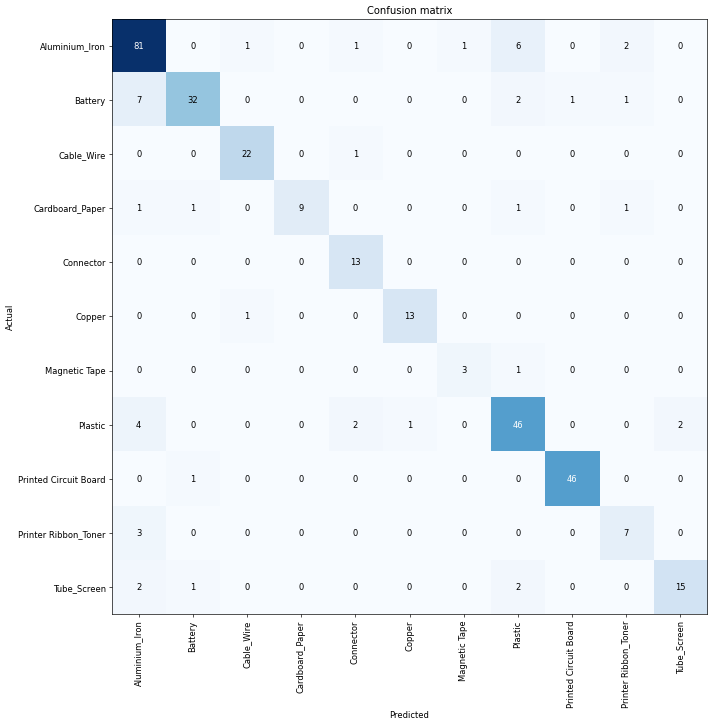

In [36]:
doc(interp.plot_top_losses)
interp.plot_confusion_matrix(figsize=(12,12), dpi=60)

In [37]:
preds = learn.get_preds()

In [38]:
print(preds[0].shape)
preds[0]

torch.Size([334, 11])


TensorBase([[8.7472e-01, 2.5551e-05, 5.8729e-03,  ..., 5.1172e-03,
             1.8788e-04, 4.1257e-02],
            [9.9659e-01, 7.5023e-04, 1.8311e-07,  ..., 2.9467e-05,
             4.6006e-04, 4.0853e-07],
            [9.6440e-01, 1.2830e-06, 7.3766e-09,  ..., 1.7588e-08,
             9.3144e-07, 4.4907e-10],
            ...,
            [6.3379e-04, 1.4843e-04, 3.4879e-05,  ..., 2.8113e-05,
             1.1029e-05, 4.0314e-01],
            [5.1384e-03, 9.8691e-03, 6.6737e-05,  ..., 7.3950e-04,
             1.7083e-03, 9.8226e-01],
            [8.5754e-08, 5.6992e-06, 8.9678e-04,  ..., 7.3478e-06,
             1.4332e-05, 1.3446e-02]])

In [39]:
labels = list(learn.dls.train_ds.items.Class.unique())
labels

['Aluminium_Iron',
 'Battery',
 'Cable_Wire',
 'Cardboard_Paper',
 'Connector',
 'Copper',
 'Magnetic Tape',
 'Plastic',
 'Printed Circuit Board',
 'Printer Ribbon_Toner',
 'Tube_Screen']

In [40]:
## saves the index of most likely (max) predicted class for each image
max_idxs = np.asarray(np.argmax(preds[0],axis=1))
max_idxs

yhat = []
for max_idx in max_idxs:
    yhat.append(labels[max_idx])

## convert POSIX paths to string first
y = []
for label_path in learn.dls.valid_ds.items.Class:
    y.append(str(label_path))

learn.dls.valid_ds.items.Class.unique()

## predicted values
print(yhat[0:5])

## actual values
print(y[0:5])

['Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron']
['Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron']


In [41]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y,yhat)
print(cm)

[[81  0  1  0  1  0  1  6  0  2  0]
 [ 7 32  0  0  0  0  0  2  1  1  0]
 [ 0  0 22  0  1  0  0  0  0  0  0]
 [ 1  1  0  9  0  0  0  1  0  1  0]
 [ 0  0  0  0 13  0  0  0  0  0  0]
 [ 0  0  1  0  0 13  0  0  0  0  0]
 [ 0  0  0  0  0  0  3  1  0  0  0]
 [ 4  0  0  0  2  1  0 46  0  0  2]
 [ 0  1  0  0  0  0  0  0 46  0  0]
 [ 3  0  0  0  0  0  0  0  0  7  0]
 [ 2  1  0  0  0  0  0  2  0  0 15]]


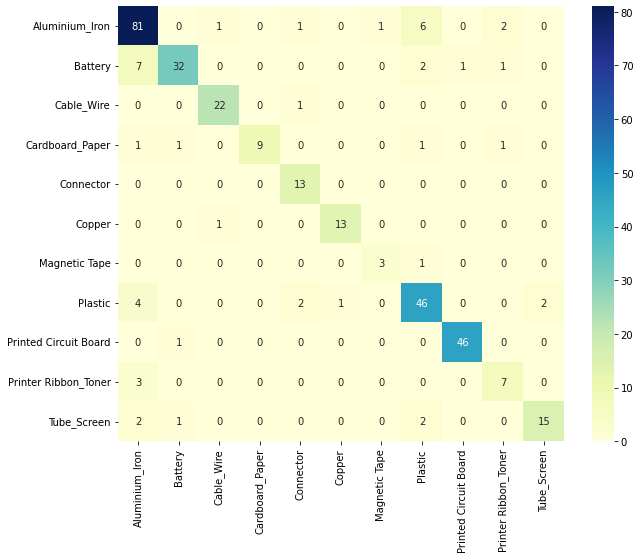

In [42]:
df_cm = pd.DataFrame(cm,learn.dls.valid_ds.items.Class.unique(),learn.dls.valid_ds.items.Class.unique())

plt.figure(figsize=(10,8))

import seaborn as sns

sns.heatmap(df_cm,annot=True,fmt="d",cmap="YlGnBu")

In [43]:
correct = 0

for r in range(len(cm)):
    for c in range(len(cm)):
        if (r==c):
            correct += cm[r,c]

accuracy = correct/sum(sum(cm))
accuracy

0.8592814371257484

### Fold 3

In [16]:
fold_nbr = 3
fold_name = 'fold3'
model_name = 'resnet152'

learn = create_cnn_learner(pct_images=1, 
                           deterministic=True, 
                           size=224, 
                           img_path = '/content/gdrive/My Drive/ewaste_data/full_segmented2/',
                           split_path = '/content/gdrive/My Drive/ewaste_data/full_segmented2/',
                           model_dir = '/content/gdrive/My Drive/ewaste_data/models/option2/' + model_name + '/' + fold_name,
                           log_name = '/content/gdrive/My Drive/ewaste_data/dataframes/option2/' + model_name + '/' + fold_name + '/' + 'log_' + model_name + '_' + fold_name + '.csv',
                           oversampling=True,
                           dfs_path='/content/gdrive/My Drive/ewaste_data/dataframes/option2/' + model_name + '/' + fold_name,
                           fold=fold_nbr,
                           arch=model_name)

Random state set:101, cuda used: True
Split Path defined, preparing pseudo stratified split.
Creating path:label dataframe from /content/gdrive/My Drive/ewaste_data/full_segmented2/, using 100.00% of the images (1670 images.) Shuffle = False.
Preparing stratified 5 fold split, random state is 101. Returning fold 3.
Creating path:label dataframe from /content/gdrive/My Drive/ewaste_data/full_segmented2/, using 100.00% of the images (1670 images.) Shuffle = False.
We have 11 classes, with a training set of size 1336, and a validation set of size 334
The main split has 80.00% training data with 11 classes, the reduced split has 80.00 % training data, with 11 classes.


/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet152_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet152_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [17]:
learn.arch

<function torchvision.models.resnet.resnet152(*, weights: Union[torchvision.models.resnet.ResNet152_Weights, NoneType] = None, progress: bool = True, **kwargs: Any) -> torchvision.models.resnet.ResNet>

In [18]:
len(learn.dls.get_idxs())

3340

In [19]:
idxs = learn.dls.train.get_idxs()
learn.dls.train.items.iloc[idxs].Class.value_counts()

Cable_Wire               327
Aluminium_Iron           321
Plastic                  319
Printer Ribbon_Toner     311
Connector                307
Tube_Screen              302
Printed Circuit Board    297
Magnetic Tape            297
Copper                   294
Cardboard_Paper          284
Battery                  281
Name: Class, dtype: int64

Freezing model body
60,255,808 total parameters.
2,263,424 training parameters.


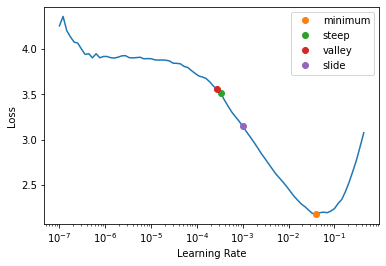

In [20]:
print(f'Freezing model body')
learn.freeze()
enumerate_params(learn)
_,_,valley_freeze,_ = learn.lr_find(suggest_funcs=(minimum, steep, valley, slide))

In [21]:
valley_freeze

0.0002754228771664202

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,error_rate,precision_score,recall_score,f1_score,time
0,2.806671,1.721141,0.425150,0.850299,0.574850,0.425150,0.425150,0.425150,00:15
1,1.506915,1.054469,0.712575,0.958084,0.287425,0.712575,0.712575,0.712575,00:15
2,0.897801,0.921194,0.712575,0.976048,0.287425,0.712575,0.712575,0.712575,00:15
3,0.562268,0.885837,0.739521,0.973054,0.260479,0.739521,0.739521,0.739521,00:15
4,0.384294,0.718210,0.814371,0.976048,0.185629,0.814371,0.814371,0.814371,00:16
5,0.287403,0.739780,0.811377,0.976048,0.188623,0.811377,0.811377,0.811377,00:16
6,0.220416,0.689841,0.838323,0.976048,0.161677,0.838323,0.838323,0.838323,00:15
7,0.197573,0.696864,0.826347,0.973054,0.173653,0.826347,0.826347,0.826347,00:15
8,0.171039,0.697426,0.820359,0.976048,0.179641,0.820359,0.820359,0.820359,00:15
9,0.151882,0.687571,0.832335,0.976048,0.167665,0.832335,0.832335,0.832335,00:16


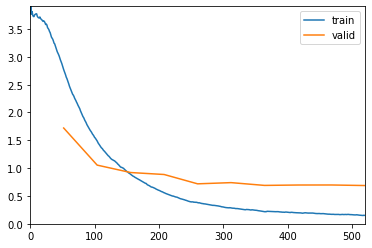

Path('/content/gdrive/My Drive/ewaste_data/models/option2/resnet152/fold3/stage-1-full_segmented2_oversampled_resnet152_fold3.pth')

In [22]:
learn.fit_one_cycle(10, lr_max=valley_freeze)
learn.save('stage-1-full_segmented2_oversampled_' + model_name + '_' + fold_name)

Unfreezing model body
60,255,808 total parameters.
60,255,808 training parameters.


SuggestedLRs(minimum=1.9054606673307718e-05, steep=6.309573450380412e-07, valley=3.630780702224001e-05, slide=3.630780702224001e-05)

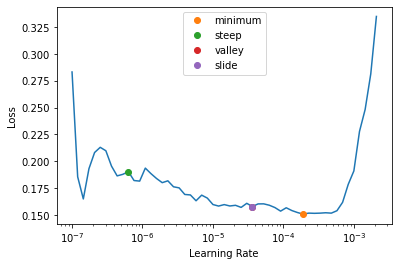

In [23]:
print(f'Unfreezing model body')
learn.unfreeze()
enumerate_params(learn)
learn.lr_find(suggest_funcs=(minimum, steep, valley, slide))

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,error_rate,precision_score,recall_score,f1_score,time
0,0.148544,0.705563,0.847305,0.970060,0.152695,0.847305,0.847305,0.847305,00:20
1,0.199850,1.323472,0.727545,0.964072,0.272455,0.727545,0.727545,0.727545,00:20
2,0.279581,1.040240,0.718563,0.988024,0.281437,0.718563,0.718563,0.718563,00:19
3,0.216798,0.845982,0.778443,0.979042,0.221557,0.778443,0.778443,0.778443,00:19
4,0.148264,0.819213,0.826347,0.988024,0.173653,0.826347,0.826347,0.826347,00:19
5,0.087221,0.697667,0.829341,0.982036,0.170659,0.829341,0.829341,0.829341,00:19
6,0.055279,0.676142,0.832335,0.982036,0.167665,0.832335,0.832335,0.832335,00:19
7,0.036575,0.655651,0.832335,0.985030,0.167665,0.832335,0.832335,0.832335,00:18
8,0.019304,0.640615,0.835329,0.991018,0.164671,0.835329,0.835329,0.835329,00:18
9,0.015825,0.613237,0.847305,0.991018,0.152695,0.847305,0.847305,0.847305,00:18


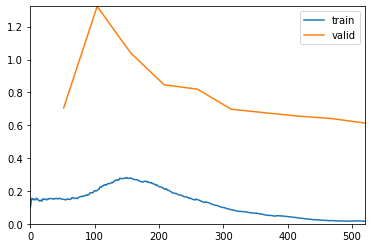

Path('/content/gdrive/My Drive/ewaste_data/models/option2/resnet152/fold3/stage-2-full_segmented2_oversampled_resnet152_fold3.pth')

In [24]:
learn.fit_one_cycle(10, lr_max=slice(5e-5, 5e-4))
learn.save('stage-2-full_segmented2_oversampled_' + model_name + '_' + fold_name)

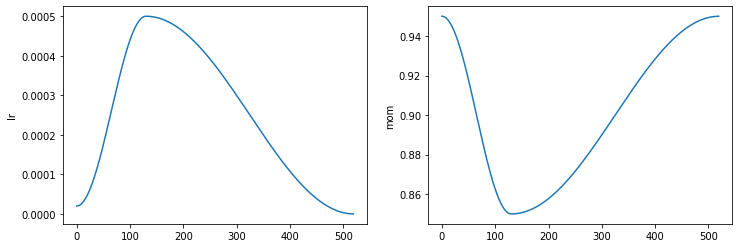

In [25]:
# In practice, we use the fit_one_cycle function, with the learning rates used representing the maximum learning rate 
# in a one cycle policy with cosine annealing, as can be seen below. 
# Note that the x-axis below represents the number of batches passed through the learner.

learn.recorder.plot_sched()

In [26]:
L(learn.recorder.values)

(#10) [[0.1485438495874405, 0.705562949180603, 0.847305417060852, 0.970059871673584, 0.15269461274147034, 0.8473053892215568, 0.8473053892215568, 0.8473053892215568],[0.19984981417655945, 1.323472023010254, 0.727544903755188, 0.9640718698501587, 0.272455096244812, 0.7275449101796407, 0.7275449101796407, 0.7275449101796408],[0.27958133816719055, 1.0402402877807617, 0.71856290102005, 0.9880239367485046, 0.28143712878227234, 0.718562874251497, 0.718562874251497, 0.7185628742514969],[0.21679764986038208, 0.8459822535514832, 0.7784430980682373, 0.9790419340133667, 0.2215568870306015, 0.7784431137724551, 0.7784431137724551, 0.7784431137724551],[0.14826393127441406, 0.819213330745697, 0.826347291469574, 0.9880239367485046, 0.17365269362926483, 0.8263473053892215, 0.8263473053892215, 0.8263473053892215],[0.08722143620252609, 0.697666585445404, 0.8293412923812866, 0.9820359349250793, 0.170658677816391, 0.8293413173652695, 0.8293413173652695, 0.8293413173652695],[0.05527852848172188, 0.676142454

In [27]:
learn.validate()

(#7) [0.6132365465164185,0.847305417060852,0.9910179376602173,0.15269461274147034,0.8473053892215568,0.8473053892215568,0.8473053892215568]

In [28]:
learn.recorder.values[-1][2]

0.9910179376602173

In [29]:
learn.dls.vocab

['Aluminium_Iron', 'Battery', 'Cable_Wire', 'Cardboard_Paper', 'Connector', 'Copper', 'Magnetic Tape', 'Plastic', 'Printed Circuit Board', 'Printer Ribbon_Toner', 'Tube_Screen']

In [30]:
learn.load('/content/gdrive/My Drive/ewaste_data/models/option2/'+ model_name + '/' + fold_name + '/stage-2-full_segmented2_oversampled_' + model_name + '_' + fold_name)

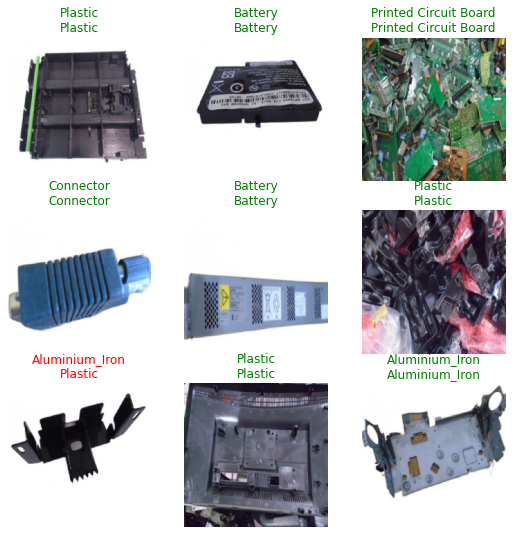

In [31]:
learn.show_results()

In [32]:
learn.dls.loss_func

FlattenedLoss of CrossEntropyLoss()

In [33]:
interp = ClassificationInterpretation.from_learner(learn)

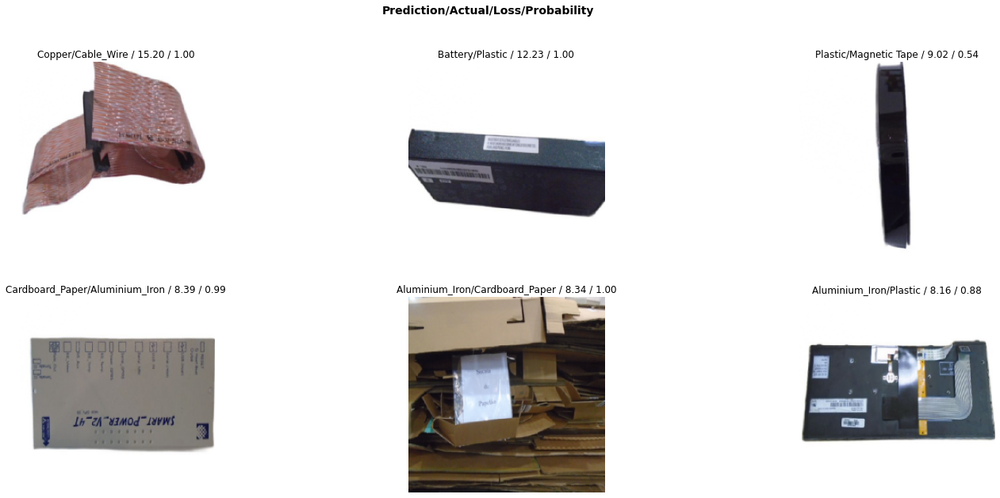

In [34]:
interp.plot_top_losses(6, figsize=(25,10))

In [35]:
interp.print_classification_report()

                       precision    recall  f1-score   support

       Aluminium_Iron       0.84      0.87      0.86        92
              Battery       0.81      0.88      0.84        43
           Cable_Wire       0.91      0.91      0.91        23
      Cardboard_Paper       0.92      0.85      0.88        13
            Connector       1.00      0.85      0.92        13
               Copper       0.92      0.79      0.85        14
        Magnetic Tape       0.40      0.50      0.44         4
              Plastic       0.75      0.73      0.74        55
Printed Circuit Board       0.94      0.94      0.94        47
 Printer Ribbon_Toner       1.00      0.90      0.95        10
          Tube_Screen       0.80      0.80      0.80        20

             accuracy                           0.85       334
            macro avg       0.84      0.82      0.83       334
         weighted avg       0.85      0.85      0.85       334



In [36]:
interp.most_confused()

[('Aluminium_Iron', 'Plastic', 8),
 ('Plastic', 'Aluminium_Iron', 6),
 ('Plastic', 'Battery', 4),
 ('Tube_Screen', 'Aluminium_Iron', 3),
 ('Battery', 'Aluminium_Iron', 2),
 ('Battery', 'Plastic', 2),
 ('Copper', 'Printed Circuit Board', 2),
 ('Plastic', 'Magnetic Tape', 2),
 ('Plastic', 'Tube_Screen', 2),
 ('Aluminium_Iron', 'Battery', 1),
 ('Aluminium_Iron', 'Cardboard_Paper', 1),
 ('Aluminium_Iron', 'Magnetic Tape', 1),
 ('Aluminium_Iron', 'Tube_Screen', 1),
 ('Battery', 'Tube_Screen', 1),
 ('Cable_Wire', 'Copper', 1),
 ('Cable_Wire', 'Plastic', 1),
 ('Cardboard_Paper', 'Aluminium_Iron', 1),
 ('Cardboard_Paper', 'Battery', 1),
 ('Connector', 'Aluminium_Iron', 1),
 ('Connector', 'Printed Circuit Board', 1),
 ('Copper', 'Battery', 1),
 ('Magnetic Tape', 'Aluminium_Iron', 1),
 ('Magnetic Tape', 'Plastic', 1),
 ('Plastic', 'Cable_Wire', 1),
 ('Printed Circuit Board', 'Aluminium_Iron', 1),
 ('Printed Circuit Board', 'Battery', 1),
 ('Printed Circuit Board', 'Cable_Wire', 1),
 ('Printer Ri

Interpretation.plot_top_losses(k: 'int | list', largest: 'bool' = True, **kwargs)
Show `k` largest(/smallest) preds and losses. Implementation based on type dispatch

To get a prettier result with hyperlinks to source code and documentation, install nbdev: pip install nbdev


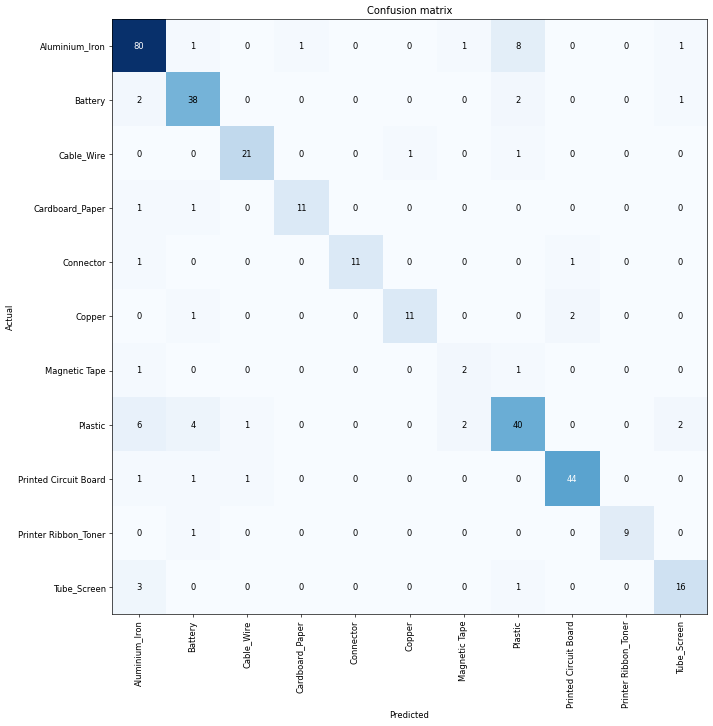

In [37]:
doc(interp.plot_top_losses)
interp.plot_confusion_matrix(figsize=(12,12), dpi=60)

In [38]:
preds = learn.get_preds()

In [39]:
print(preds[0].shape)
preds[0]

torch.Size([334, 11])


TensorBase([[9.9965e-01, 2.3765e-07, 4.7075e-08,  ..., 1.3243e-06,
             5.7639e-09, 6.6316e-08],
            [9.9999e-01, 4.6741e-09, 6.3994e-09,  ..., 5.5850e-06,
             4.5967e-09, 3.3755e-08],
            [9.5126e-01, 1.8722e-05, 2.3873e-05,  ..., 1.0985e-06,
             8.0857e-06, 1.3735e-05],
            ...,
            [1.6806e-05, 2.0551e-06, 7.0440e-07,  ..., 6.1680e-08,
             8.9984e-08, 9.9985e-01],
            [5.7241e-04, 2.4809e-06, 4.2475e-06,  ..., 1.0161e-07,
             7.7237e-07, 9.9919e-01],
            [1.1073e-03, 1.1505e-03, 9.4026e-06,  ..., 2.3347e-04,
             1.8685e-06, 9.9721e-01]])

In [40]:
labels = list(learn.dls.train_ds.items.Class.unique())
labels

['Aluminium_Iron',
 'Battery',
 'Cable_Wire',
 'Cardboard_Paper',
 'Connector',
 'Copper',
 'Magnetic Tape',
 'Plastic',
 'Printed Circuit Board',
 'Printer Ribbon_Toner',
 'Tube_Screen']

In [41]:
## saves the index of most likely (max) predicted class for each image
max_idxs = np.asarray(np.argmax(preds[0],axis=1))
max_idxs

yhat = []
for max_idx in max_idxs:
    yhat.append(labels[max_idx])

## convert POSIX paths to string first
y = []
for label_path in learn.dls.valid_ds.items.Class:
    y.append(str(label_path))

learn.dls.valid_ds.items.Class.unique()

## predicted values
print(yhat[0:5])

## actual values
print(y[0:5])

['Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron']
['Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron']


In [42]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y,yhat)
print(cm)

[[80  1  0  1  0  0  1  8  0  0  1]
 [ 2 38  0  0  0  0  0  2  0  0  1]
 [ 0  0 21  0  0  1  0  1  0  0  0]
 [ 1  1  0 11  0  0  0  0  0  0  0]
 [ 1  0  0  0 11  0  0  0  1  0  0]
 [ 0  1  0  0  0 11  0  0  2  0  0]
 [ 1  0  0  0  0  0  2  1  0  0  0]
 [ 6  4  1  0  0  0  2 40  0  0  2]
 [ 1  1  1  0  0  0  0  0 44  0  0]
 [ 0  1  0  0  0  0  0  0  0  9  0]
 [ 3  0  0  0  0  0  0  1  0  0 16]]


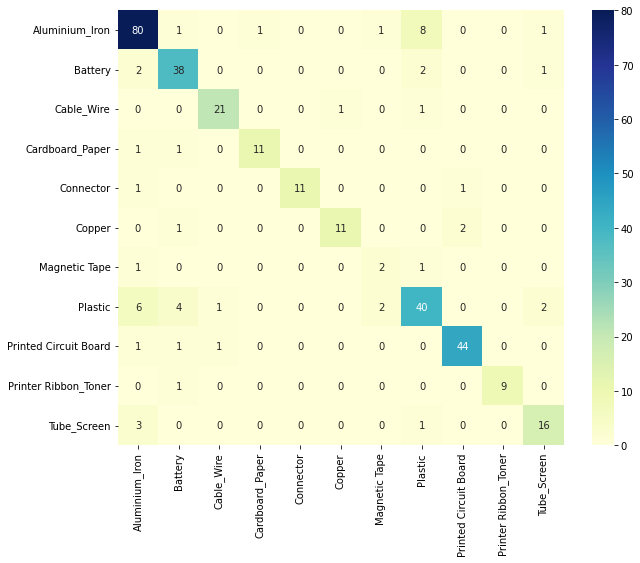

In [43]:
df_cm = pd.DataFrame(cm,learn.dls.valid_ds.items.Class.unique(),learn.dls.valid_ds.items.Class.unique())

plt.figure(figsize=(10,8))

import seaborn as sns

sns.heatmap(df_cm,annot=True,fmt="d",cmap="YlGnBu")

In [44]:
correct = 0

for r in range(len(cm)):
    for c in range(len(cm)):
        if (r==c):
            correct += cm[r,c]

accuracy = correct/sum(sum(cm))
accuracy

0.8473053892215568

### Fold 4

In [15]:
fold_nbr = 4
fold_name = 'fold4'
model_name = 'resnet152'

learn = create_cnn_learner(pct_images=1, 
                           deterministic=True, 
                           size=224, 
                           img_path = '/content/gdrive/My Drive/ewaste_data/full_segmented2/',
                           split_path = '/content/gdrive/My Drive/ewaste_data/full_segmented2/',
                           model_dir = '/content/gdrive/My Drive/ewaste_data/models/option2/' + model_name + '/' + fold_name,
                           log_name = '/content/gdrive/My Drive/ewaste_data/dataframes/option2/' + model_name + '/' + fold_name + '/' + 'log_' + model_name + '_' + fold_name + '.csv',
                           oversampling=True,
                           dfs_path='/content/gdrive/My Drive/ewaste_data/dataframes/option2/' + model_name + '/' + fold_name,
                           fold=fold_nbr,
                           arch=model_name)

Random state set:101, cuda used: True
Split Path defined, preparing pseudo stratified split.
Creating path:label dataframe from /content/gdrive/My Drive/ewaste_data/full_segmented2/, using 100.00% of the images (1670 images.) Shuffle = False.
Preparing stratified 5 fold split, random state is 101. Returning fold 4.
Creating path:label dataframe from /content/gdrive/My Drive/ewaste_data/full_segmented2/, using 100.00% of the images (1670 images.) Shuffle = False.
We have 11 classes, with a training set of size 1336, and a validation set of size 334
The main split has 80.00% training data with 11 classes, the reduced split has 80.00 % training data, with 11 classes.


/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet152_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet152_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet152-394f9c45.pth" to /root/.cache/torch/hub/checkpoints/resnet152-394f9c45.pth


  0%|          | 0.00/230M [00:00<?, ?B/s]

In [16]:
learn.arch

<function torchvision.models.resnet.resnet152(*, weights: Union[torchvision.models.resnet.ResNet152_Weights, NoneType] = None, progress: bool = True, **kwargs: Any) -> torchvision.models.resnet.ResNet>

In [17]:
len(learn.dls.get_idxs())

3340

In [18]:
idxs = learn.dls.train.get_idxs()
learn.dls.train.items.iloc[idxs].Class.value_counts()

Cable_Wire               327
Aluminium_Iron           321
Plastic                  319
Printer Ribbon_Toner     311
Connector                307
Tube_Screen              302
Printed Circuit Board    297
Magnetic Tape            297
Copper                   294
Cardboard_Paper          284
Battery                  281
Name: Class, dtype: int64

Freezing model body
60,255,808 total parameters.
2,263,424 training parameters.


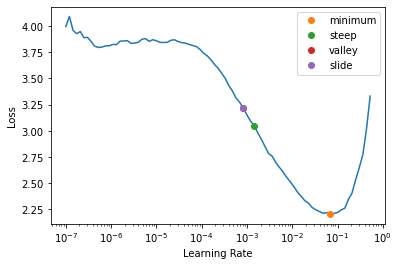

In [19]:
print(f'Freezing model body')
learn.freeze()
enumerate_params(learn)
_,_,valley_freeze,_ = learn.lr_find(suggest_funcs=(minimum, steep, valley, slide))

In [20]:
valley_freeze

0.0008317637839354575

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,error_rate,precision_score,recall_score,f1_score,time
0,2.069531,1.330320,0.565868,0.934132,0.434132,0.565868,0.565868,0.565868,00:16
1,1.025832,1.190659,0.676647,0.937126,0.323353,0.676647,0.676647,0.676647,00:15
2,0.549924,0.844242,0.724551,0.982036,0.275449,0.724551,0.724551,0.724551,00:16
3,0.323624,0.873598,0.751497,0.973054,0.248503,0.751497,0.751497,0.751497,00:16
4,0.215795,0.815581,0.754491,0.985030,0.245509,0.754491,0.754491,0.754491,00:15
5,0.170548,0.849498,0.775449,0.979042,0.224551,0.775449,0.775449,0.775449,00:16
6,0.121772,0.779429,0.778443,0.982036,0.221557,0.778443,0.778443,0.778443,00:16
7,0.095163,0.756683,0.802395,0.991018,0.197605,0.802395,0.802395,0.802395,00:16
8,0.071719,0.743523,0.802395,0.991018,0.197605,0.802395,0.802395,0.802395,00:16
9,0.058420,0.740235,0.802395,0.991018,0.197605,0.802395,0.802395,0.802395,00:16


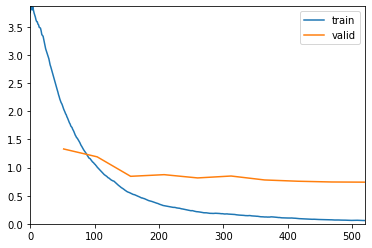

Path('/content/gdrive/My Drive/ewaste_data/models/option2/resnet152/fold4/stage-1-full_segmented2_oversampled_resnet152_fold4.pth')

In [21]:
learn.fit_one_cycle(10, lr_max=valley_freeze)
learn.save('stage-1-full_segmented2_oversampled_' + model_name + '_' + fold_name)

Unfreezing model body
60,255,808 total parameters.
60,255,808 training parameters.


SuggestedLRs(minimum=2.290867705596611e-05, steep=7.585775847473997e-07, valley=5.248074739938602e-05, slide=3.0199516913853586e-05)

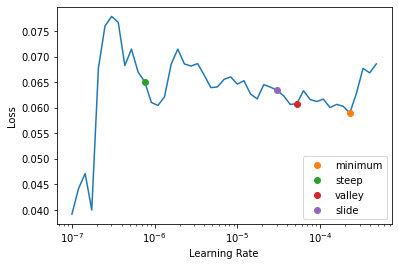

In [22]:
print(f'Unfreezing model body')
learn.unfreeze()
enumerate_params(learn)
learn.lr_find(suggest_funcs=(minimum, steep, valley, slide))

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,error_rate,precision_score,recall_score,f1_score,time
0,0.058174,0.770035,0.802395,0.991018,0.197605,0.802395,0.802395,0.802395,00:18
1,0.054203,0.778163,0.787425,0.988024,0.212575,0.787425,0.787425,0.787425,00:18
2,0.061457,0.823375,0.778443,0.982036,0.221557,0.778443,0.778443,0.778443,00:18
3,0.055183,0.769162,0.808383,0.985030,0.191617,0.808383,0.808383,0.808383,00:18
4,0.043905,0.693235,0.793413,0.985030,0.206587,0.793413,0.793413,0.793413,00:18
5,0.034380,0.761746,0.805389,0.991018,0.194611,0.805389,0.805389,0.805389,00:19
6,0.024434,0.740426,0.820359,0.988024,0.179641,0.820359,0.820359,0.820359,00:18
7,0.015962,0.724457,0.808383,0.985030,0.191617,0.808383,0.808383,0.808383,00:18
8,0.013074,0.741757,0.820359,0.985030,0.179641,0.820359,0.820359,0.820359,00:18
9,0.010961,0.741494,0.826347,0.991018,0.173653,0.826347,0.826347,0.826347,00:18


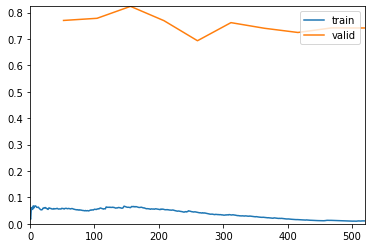

Path('/content/gdrive/My Drive/ewaste_data/models/option2/resnet152/fold4/stage-2-full_segmented2_oversampled_resnet152_fold4.pth')

In [23]:
learn.fit_one_cycle(10, lr_max=slice(1e-5, 1e-4))
learn.save('stage-2-full_segmented2_oversampled_' + model_name + '_' + fold_name)

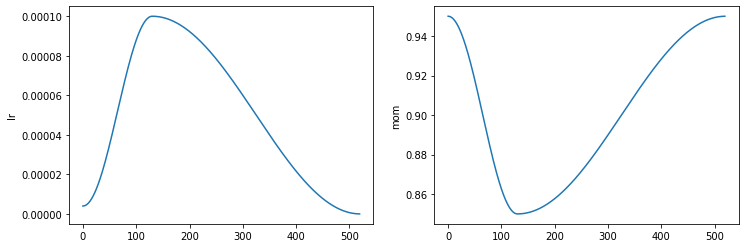

In [24]:
# In practice, we use the fit_one_cycle function, with the learning rates used representing the maximum learning rate 
# in a one cycle policy with cosine annealing, as can be seen below. 
# Note that the x-axis below represents the number of batches passed through the learner.

learn.recorder.plot_sched()

In [25]:
L(learn.recorder.values)

(#10) [[0.05817420408129692, 0.7700352668762207, 0.802395224571228, 0.9910179376602173, 0.19760479032993317, 0.8023952095808383, 0.8023952095808383, 0.8023952095808384],[0.054203301668167114, 0.7781631350517273, 0.78742516040802, 0.9880239367485046, 0.21257485449314117, 0.7874251497005988, 0.7874251497005988, 0.7874251497005988],[0.061457108706235886, 0.82337486743927, 0.7784430980682373, 0.9820359349250793, 0.2215568870306015, 0.7784431137724551, 0.7784431137724551, 0.7784431137724551],[0.055182911455631256, 0.769161581993103, 0.8083832263946533, 0.985029935836792, 0.19161677360534668, 0.8083832335329342, 0.8083832335329342, 0.8083832335329342],[0.04390501230955124, 0.6932352781295776, 0.7934131622314453, 0.985029935836792, 0.2065868228673935, 0.7934131736526946, 0.7934131736526946, 0.7934131736526946],[0.034380435943603516, 0.7617464065551758, 0.8053892254829407, 0.9910179376602173, 0.19461077451705933, 0.8053892215568862, 0.8053892215568862, 0.8053892215568861],[0.02443438023328781,

In [26]:
learn.validate()

(#7) [0.7414938807487488,0.826347291469574,0.9910179376602173,0.17365269362926483,0.8263473053892215,0.8263473053892215,0.8263473053892215]

In [27]:
learn.recorder.values[-1][2]

0.9910179376602173

In [28]:
learn.dls.vocab

['Aluminium_Iron', 'Battery', 'Cable_Wire', 'Cardboard_Paper', 'Connector', 'Copper', 'Magnetic Tape', 'Plastic', 'Printed Circuit Board', 'Printer Ribbon_Toner', 'Tube_Screen']

In [29]:
learn.load('/content/gdrive/My Drive/ewaste_data/models/option2/'+ model_name + '/' + fold_name + '/stage-2-full_segmented2_oversampled_' + model_name + '_' + fold_name)

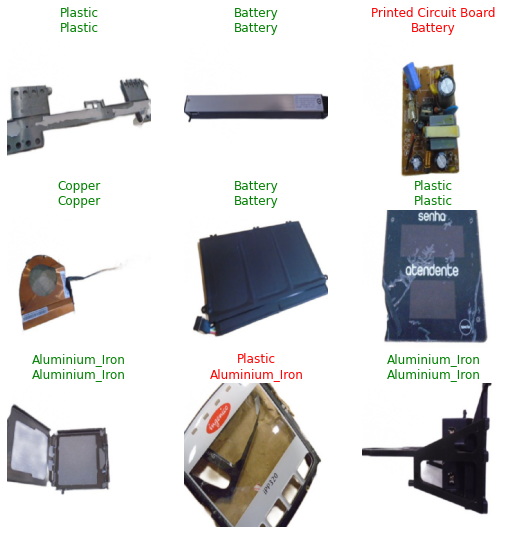

In [30]:
learn.show_results()

In [31]:
learn.dls.loss_func

FlattenedLoss of CrossEntropyLoss()

In [32]:
interp = ClassificationInterpretation.from_learner(learn)

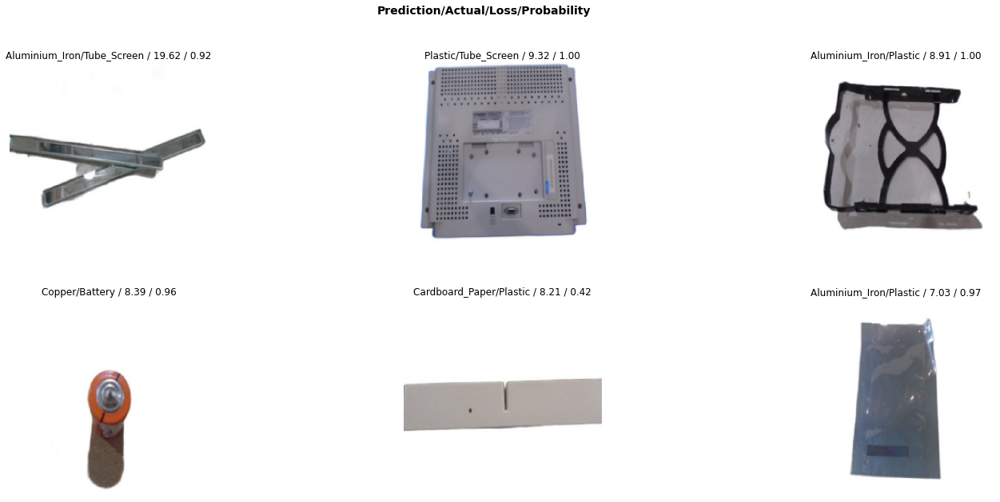

In [33]:
interp.plot_top_losses(6, figsize=(25,10))

In [34]:
interp.print_classification_report()

                       precision    recall  f1-score   support

       Aluminium_Iron       0.77      0.92      0.84        92
              Battery       0.80      0.81      0.80        43
           Cable_Wire       0.96      0.96      0.96        23
      Cardboard_Paper       0.77      0.77      0.77        13
            Connector       0.83      0.83      0.83        12
               Copper       0.94      1.00      0.97        15
        Magnetic Tape       0.67      0.67      0.67         3
              Plastic       0.80      0.59      0.68        56
Printed Circuit Board       0.96      0.91      0.93        47
 Printer Ribbon_Toner       0.78      0.70      0.74        10
          Tube_Screen       0.78      0.70      0.74        20

             accuracy                           0.83       334
            macro avg       0.82      0.81      0.81       334
         weighted avg       0.83      0.83      0.82       334



In [35]:
interp.most_confused()

[('Plastic', 'Aluminium_Iron', 14),
 ('Tube_Screen', 'Aluminium_Iron', 4),
 ('Battery', 'Plastic', 3),
 ('Plastic', 'Battery', 3),
 ('Aluminium_Iron', 'Battery', 2),
 ('Aluminium_Iron', 'Tube_Screen', 2),
 ('Battery', 'Aluminium_Iron', 2),
 ('Plastic', 'Cardboard_Paper', 2),
 ('Plastic', 'Printer Ribbon_Toner', 2),
 ('Plastic', 'Tube_Screen', 2),
 ('Printed Circuit Board', 'Aluminium_Iron', 2),
 ('Printed Circuit Board', 'Battery', 2),
 ('Printer Ribbon_Toner', 'Plastic', 2),
 ('Aluminium_Iron', 'Connector', 1),
 ('Aluminium_Iron', 'Plastic', 1),
 ('Aluminium_Iron', 'Printed Circuit Board', 1),
 ('Battery', 'Connector', 1),
 ('Battery', 'Copper', 1),
 ('Battery', 'Printed Circuit Board', 1),
 ('Cable_Wire', 'Battery', 1),
 ('Cardboard_Paper', 'Aluminium_Iron', 1),
 ('Cardboard_Paper', 'Battery', 1),
 ('Cardboard_Paper', 'Cable_Wire', 1),
 ('Connector', 'Aluminium_Iron', 1),
 ('Connector', 'Cardboard_Paper', 1),
 ('Magnetic Tape', 'Plastic', 1),
 ('Printer Ribbon_Toner', 'Aluminium_Iron

Interpretation.plot_top_losses(k: 'int | list', largest: 'bool' = True, **kwargs)
Show `k` largest(/smallest) preds and losses. Implementation based on type dispatch

To get a prettier result with hyperlinks to source code and documentation, install nbdev: pip install nbdev


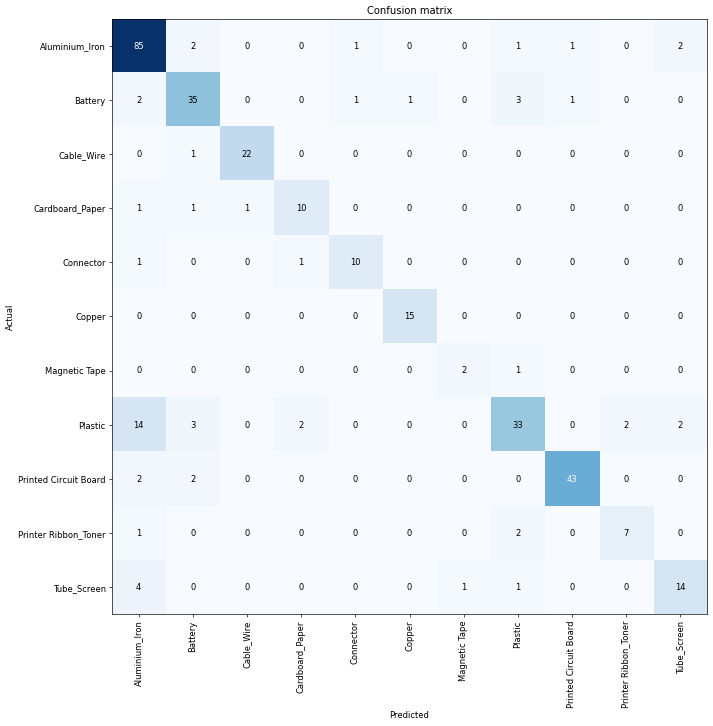

In [36]:
doc(interp.plot_top_losses)
interp.plot_confusion_matrix(figsize=(12,12), dpi=60)

In [37]:
preds = learn.get_preds()

In [38]:
print(preds[0].shape)
preds[0]

torch.Size([334, 11])


TensorBase([[9.5950e-01, 7.9235e-09, 5.1345e-06,  ..., 1.7762e-05,
             5.8964e-06, 1.6394e-06],
            [9.9960e-01, 7.6342e-06, 2.9961e-06,  ..., 3.7550e-09,
             8.1119e-07, 1.9502e-06],
            [9.6273e-01, 1.2405e-05, 5.7541e-06,  ..., 3.1916e-04,
             4.2427e-05, 2.1766e-05],
            ...,
            [7.0486e-04, 1.1540e-01, 3.1523e-05,  ..., 2.1529e-04,
             6.7048e-04, 8.8110e-01],
            [8.3955e-01, 1.2792e-03, 1.1515e-03,  ..., 8.5446e-05,
             1.1952e-04, 7.0018e-02],
            [2.4693e-04, 9.2819e-04, 1.8730e-03,  ..., 1.7103e-03,
             3.8414e-04, 9.9446e-01]])

In [39]:
labels = list(learn.dls.train_ds.items.Class.unique())
labels

['Aluminium_Iron',
 'Battery',
 'Cable_Wire',
 'Cardboard_Paper',
 'Connector',
 'Copper',
 'Magnetic Tape',
 'Plastic',
 'Printed Circuit Board',
 'Printer Ribbon_Toner',
 'Tube_Screen']

In [40]:
## saves the index of most likely (max) predicted class for each image
max_idxs = np.asarray(np.argmax(preds[0],axis=1))
max_idxs

yhat = []
for max_idx in max_idxs:
    yhat.append(labels[max_idx])

## convert POSIX paths to string first
y = []
for label_path in learn.dls.valid_ds.items.Class:
    y.append(str(label_path))

learn.dls.valid_ds.items.Class.unique()

## predicted values
print(yhat[0:5])

## actual values
print(y[0:5])

['Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron']
['Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron', 'Aluminium_Iron']


In [41]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y,yhat)
print(cm)

[[85  2  0  0  1  0  0  1  1  0  2]
 [ 2 35  0  0  1  1  0  3  1  0  0]
 [ 0  1 22  0  0  0  0  0  0  0  0]
 [ 1  1  1 10  0  0  0  0  0  0  0]
 [ 1  0  0  1 10  0  0  0  0  0  0]
 [ 0  0  0  0  0 15  0  0  0  0  0]
 [ 0  0  0  0  0  0  2  1  0  0  0]
 [14  3  0  2  0  0  0 33  0  2  2]
 [ 2  2  0  0  0  0  0  0 43  0  0]
 [ 1  0  0  0  0  0  0  2  0  7  0]
 [ 4  0  0  0  0  0  1  1  0  0 14]]


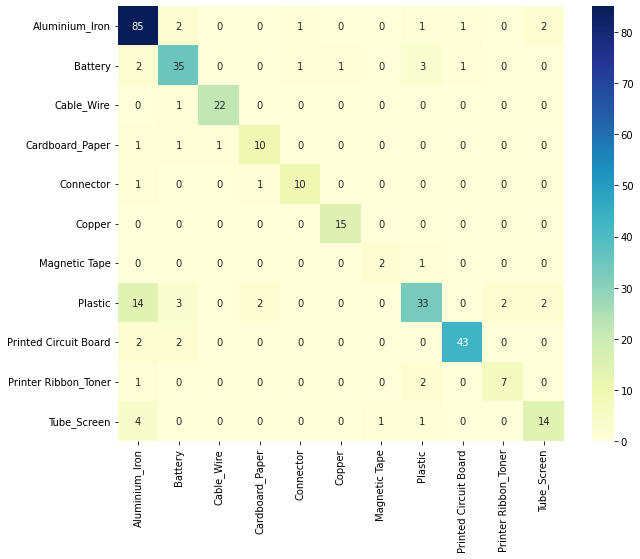

In [42]:
df_cm = pd.DataFrame(cm,learn.dls.valid_ds.items.Class.unique(),learn.dls.valid_ds.items.Class.unique())

plt.figure(figsize=(10,8))

import seaborn as sns

sns.heatmap(df_cm,annot=True,fmt="d",cmap="YlGnBu")

In [43]:
correct = 0

for r in range(len(cm)):
    for c in range(len(cm)):
        if (r==c):
            correct += cm[r,c]

accuracy = correct/sum(sum(cm))
accuracy

0.8263473053892215